# Masterthesis: Descriptive analysis Player data

In [1]:
# Filename preprocessed data
loaded_filename = 'playerdata2017_preprocessed'
saved_filename = 'playerdata2017_standardized'
#loaded_filename = 'playerdata2018_preprocessed'
#saved_filename = 'playerdata2018_standardized'

## 0. Load libraries and define functions

In [2]:
# Functions
import numpy as np
import os
import pickle
import pandas as pd
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype
from datetime import datetime
from collections import Counter
from numpy.random import choice
from scipy import stats
import operator
import itertools
import statistics

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

In [3]:
cm.get_cmap(name='tab20b')

In [4]:
### Function used to return a summary for categorical variables
def SummaryCategoricalVar(list_of_values, title, threshold = 20, top = 10):
    """
    param: list_of_values (list): A list of categorical values from which we like to obtain the distribution
    param: title (string): The title for the visualization
    param: threshold (int): The maximal number of categories that should be visualized
    param: top (int): The top k values that should be returned in the written summary when the number of categories is above the threshold
    """
    # Count the number of occurrances in the list
    cnt = Counter(list_of_values)
    sorted_cnt = sorted(cnt.items(), key=operator.itemgetter(1))[::-1]
    
    # Show the percentage dictionary if to many categories to represent
    print("-"* 100, "\nOverview of variable: ", title, "\n", "-"*100)
    print("Total categories:", len(cnt), "\n")
    if len(cnt) > threshold:
        if len(cnt) < top*2:
            for key, value in sorted_cnt:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
        else:
            print("The 10 with the highest percentage data available:\n")
            for key, value in sorted_cnt[:top]:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
            print("\nThe 10 with the lowest percentage data available:\n")
            for key, value in sorted_cnt[len(cnt) - top:]:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
                
    # Visualization of labelled data distribution
    else:
        plt.barh(range(1, len(sorted_cnt)+1), 
                 list(map(lambda x: (x/len(list_of_values)*100), [score for label, score in sorted_cnt])), 
                 tick_label = list([label for label, score in sorted_cnt]),
                 color = 'cornflowerblue', 
                 edgecolor = 'steelblue')
        plt.ylabel('Label')
        plt.xlabel('Percentage observations in dataset')
        plt.title(title)
        plt.show()    
        plt.savefig('Barplot_' + title + '.png')

In [5]:
### Function used to return a summary for numeric variables
def SummaryNumericVar(list_of_values, title):
    """
    param: list_of_values (list): A list of categorical values from which we like to obtain the distribution
    param: title (string): The title for the visualization
    """
    
    # Title varibale
    print("="* 100, "\nOverview of variable: ", title, "\n", "="*100)

    # An "interface" to matplotlib.axes.Axes.hist() method
    n, bins, patches = plt.hist(x = list_of_values, bins='auto', color= '#0504aa', alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(title)
    plt.ylim(top=np.ceil(n.max() / 10) * 10 if n.max() % 10 else n.max() + 10)
    plt.show()
    plt.savefig('Frequency_' + title + '.png')

    # Print summary statistics
    print("-"*20, "\nSummary statistics:\n", "-"*20)
    print("Minimum value:", min(list_of_values))
    print("Mean:", round(statistics.mean(list_of_values), 4))
    print("Standard deviation:", round(statistics.stdev(list_of_values), 4))
    print("Median:", round(statistics.median(list_of_values), 4))
    print("Maximal value:", max(list_of_values))

    # Plot boxplot
    plt.boxplot(list_of_values, 0, 'grey', 0)
    plt.xlabel('Value')
    plt.title(title)
    plt.show()
    plt.savefig('Boxplot_' + title + '.png')

    # Present outliers
    print("-"*20, "\nOutlier detection:\n", "-"*20)
    print("List of outliers:", {round(value,2) for z_score, value in zip(np.abs(stats.zscore(list_of_values)), list_of_values) if z_score > 3})

    # Check for normally distributed
    stats.probplot(list_of_values, dist="norm", plot= plt)
    plt.show()
    plt.savefig('Probabilityplot_' + title + '.png')

    # Statistics to check normality
    print("-"*20, "\nCheck for normal distribution:\n", "-"*20)
    print("Skewedness:", round(stats.skew(list_of_values), 4))
    print("Kurtosis:", round(stats.kurtosis(list_of_values), 4))

In [6]:
### Function used to draw a random sample from the discrete distribution of probabilities representing the input list
def RandomSampleProbDist(list_of_values, draws = 1):
    """
    :param: list_of_values (list): A list of categorical values representing the observations in the dataset
    :param: draws (int): The number of samples desired to be returned
    :return: (array) An array capturing the sampled categories
    """
    # Only the non-missing values are considered in the sampling procedure
    non_missing_list = list_of_values.dropna()
    # Sample from the discrete probability distribution representing the categorical variable
    return choice(list(Counter(non_missing_list)), 
                  draws, 
                  p = list(map(lambda x: x/len(non_missing_list), 
                               Counter(non_missing_list).values())))

In [7]:
### Function used for a boxcox transformation of input features
def feature_transformer(feature, featurename):
    """
    Visualizes the input feature before and after being boxcox transformed. Furthermore the transformed data,
    based on the optimal lambda estimated with the boxcox method is returned in a standardized fashion (zero mean
    and a variance of one)
    """
    # Boxcox transformation
    transformed_feature, optimizer = stats.boxcox(feature)
    standardized_feature, standardized_transformed_feature = preprocessing.scale(feature), preprocessing.scale(transformed_feature)
    # Visualization
    print("Feature: ", featurename)
    plt.figure()
    sns.kdeplot(standardized_feature, shade=True, label=featurename )
    sns.kdeplot(standardized_transformed_feature, shade=True, label= "Transformed " + featurename)
    plt.savefig('Transformed_' + featurename + '.png')
    print("The optimal value for lambda: ", optimizer)
    # Return transformed and standardized data
    return standardized_transformed_feature, optimizer

## 1. Load data

In [8]:
# Load pickles and save data in dataframe dict
data_dict = dict()
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_top.pickle', 'rb') as f:
    data_dict['Top'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_mid.pickle', 'rb') as f:
    data_dict['Middle'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_jun.pickle', 'rb') as f:
    data_dict['Jungle'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_adc.pickle', 'rb') as f:
    data_dict['ADC'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_sup.pickle', 'rb') as f:
    data_dict['Support'] = pickle.load(f)

##### Summary data

In [9]:
# Visualization of a dataframe
data_dict['Support']

,gameid,league,split,game,patchno,side,position,champion,result,k,...,xpdat10,csat10,csdat10,csat15,csdat15,Year,player,team,culture,datediff
4,1002300127,NALCS,2.0,3,13,Blue,Support,Lulu,0,3.0,...,-223.0,5.0,3.0,7.0,5.0,2017,matt,team liquid,North America,704.0
9,1002300127,NALCS,2.0,3,13,Red,Support,Janna,1,1.0,...,223.0,2.0,-3.0,2.0,-5.0,2017,adrian,dignitas,North America,704.0
16,240067,LCK,2.0,1,8,Blue,Support,Thresh,0,1.0,...,185.0,17.0,15.0,30.0,27.0,2017,max,mvp,Korea,773.0
21,240067,LCK,2.0,1,8,Red,Support,Zyra,1,2.0,...,-185.0,2.0,-15.0,3.0,-27.0,2017,snowflower,jin air green wings,Korea,773.0
28,240080,LCK,2.0,2,8,Blue,Support,Zyra,0,1.0,...,-196.0,3.0,-10.0,6.0,-15.0,2017,snowflower,jin air green wings,Korea,773.0
33,240080,LCK,2.0,2,8,Red,Support,Blitzcrank,1,2.0,...,196.0,13.0,10.0,21.0,15.0,2017,max,mvp,Korea,773.0
40,240081,LCK,2.0,3,8,Blue,Support,Bard,1,2.0,...,658.0,1.0,-1.0,2.0,-4.0,2017,max,mvp,Korea,773.0
45,240081,LCK,2.0,3,8,Red,Support,Lulu,0,1.0,...,-658.0,2.0,1.0,6.0,4.0,2017,snowflower,jin air green wings,Korea,773.0
52,240086,LCK,2.0,1,8,Blue,Support,Zyra,1,0.0,...,428.0,1.0,-10.0,5.0,-12.0,2017,gorilla,longzhu gaming,Korea,773.0
57,240086,LCK,2.0,1,8,Red,Support,Miss Fortune,0,2.0,...,-428.0,11.0,10.0,17.0,12.0,2017,mata,kt rolster,Korea,773.0


In [10]:
# Short intermediate summary
for pos, df in data_dict.items():
    print("The", pos, "dataset captures information from", len(df.columns), "features.")
    print("In total, there are", len(df), "observations present in the dataframe, capturing the information from",
          len(set(df.gameid)), "games.")

The Top dataset captures information from 62 features.
In total, there are 5892 observations present in the dataframe, capturing the information from 2946 games.
The Middle dataset captures information from 62 features.
In total, there are 5892 observations present in the dataframe, capturing the information from 2946 games.
The Jungle dataset captures information from 62 features.
In total, there are 5892 observations present in the dataframe, capturing the information from 2946 games.
The ADC dataset captures information from 62 features.
In total, there are 5892 observations present in the dataframe, capturing the information from 2946 games.
The Support dataset captures information from 62 features.
In total, there are 5892 observations present in the dataframe, capturing the information from 2946 games.


##### Extract categorical/ numerical feature list 
Latter remain the same irrespective of the specific dataframe considered.

In [11]:
# Initialization
categorical_variables, numerical_variables = [], []

# Extract categorical and numeric variables
for col, col_type in zip(data_dict['Top'].columns, data_dict['Top'].dtypes):
    if str(col_type) == 'object':
        categorical_variables.append(col)
    else:
        numerical_variables.append(col)

## 2. Univariate analysis of the data
In a first phase all the variables are investigated in a univariate analysis. A distinction is made here between categorical and numerical variables. 

### 2.1 Analysis of categorical variables
The following aspect will be analysed here:
* Balanced classes

Furthermore one-hot encoding will be considered to transform these variables to an appropriate format ready for analysis.

##### Exploration characteristics categorical features

In [12]:
# Loop through all categorical variables and visualize data
for cat_variable in ['champion', 'player']:
    for pos, df in data_dict.items():
        print("\n\n","="*10, "\n  ", pos, "\n", "="*10)
        SummaryCategoricalVar(df[cat_variable], cat_variable)



   Top 
---------------------------------------------------------------------------------------------------- 
Overview of variable:  champion 
 ----------------------------------------------------------------------------------------------------
Total categories: 55 

The 10 with the highest percentage data available:

Shen : 10.9131 %
Maokai : 10.2172 %
Rumble : 10.0136 %
Renekton : 8.7916 %
Nautilus : 8.0618 %
Jarvan IV : 7.6544 %
Gragas : 5.7536 %
Camille : 5.3632 %
Gnar : 4.7352 %
Kled : 4.0224 %

The 10 with the lowest percentage data available:

Urgot : 0.0339 %
Kha'zix : 0.017 %
Ashe : 0.017 %
Teemo : 0.017 %
Warwick : 0.017 %
Wukong : 0.017 %
Kayle : 0.017 %
Zed : 0.017 %
Lissandra : 0.017 %
Pantheon : 0.017 %


   Middle 
---------------------------------------------------------------------------------------------------- 
Overview of variable:  champion 
 ----------------------------------------------------------------------------------------------------
Total categories: 59 

##### Encoding

In [13]:
# Loop through the different dataframes
for pos, df in data_dict.items():
    # Encode categorical features in numeric ones
    for col in categorical_variables:
        try:
            df['Encoded_' + col] = [int(x) for x in list(df[col])]
        except:
            try: 
                df['Encoded_' + col] = [float(x) for x in list(df[col])]
            except:
                mapping_dict = dict(zip(list(set(df[col])), list(range(len(set(df[col]))))))
                df['Encoded_' + col] = [mapping_dict[x] for x in df[col]]
    # Add encoded features to dataframe
    data_dict[pos] = df

##### Remove irrelevant features for further analysis

In [14]:
# Loop through the different dataframes
for pos, df in data_dict.items():
    # Drop irrelevant features
    catvar_before_encoding = [col[len('Encoded_'):] for col in df.columns if 'Encoded_' in col]
    catvar_before_encoding.remove('player')
    df = df.drop(labels=catvar_before_encoding, axis=1)
    df = df.drop(labels = ['Encoded_gameid', 'Encoded_player', 'Encoded_position'], axis=1)
    # Add adjusted dataframe to dictionary
    data_dict[pos] = df

In [15]:
# Add one-hot-encoded features to numerical feature list
for cat in catvar_before_encoding:
    numerical_variables.append('Encoded_' + cat)
numerical_variables.remove('Encoded_gameid')
numerical_variables.remove('Encoded_position')

### 2.2 Analysis of numerical variables
The following aspects will be analysed here:
* Visualisation data (boxplot, histogram)
* Minimal and maximal values 
* Outliers
* Transformation/ normalization of the data
* Near zero variance indicator (before and after removal outliers)
* Skewness: A measure of lack of symmetry. The skewness for a normal distribution is zero and any symmertric data should have a skewness near zero. Negative values for skewness indicate the data to be skewed left while, positive values imply the data to be skewed right. In case the data is multi-modal, the sign of the skewness metric might be affected.
* Kurtosis: A measure indicating whether the data are heavy-tailed or light-tailed relative to a normal distribution. In case the kurtosis is high the data is distributed with heavy tails (many outliers), while data with low kurtosis tends to have light tails. The kurtosis for a standard normal distribution is three. The scipy package used to calculate the kurtosis here uses the formula for "excess kurtosis" in which the deviation from the normal condition is considered (kurtosis - 3).

##### Exploration characteristics numerical features



   Top 
Overview of variable:  k 


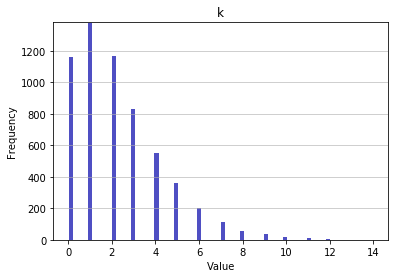

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.2744
Standard deviation: 2.0433
Median: 2.0
Maximal value: 14.0


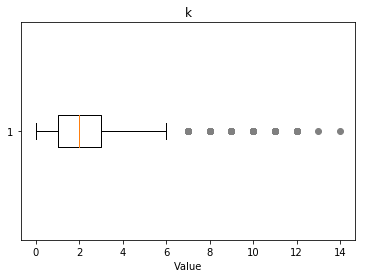

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 12.0, 13.0, 14.0}


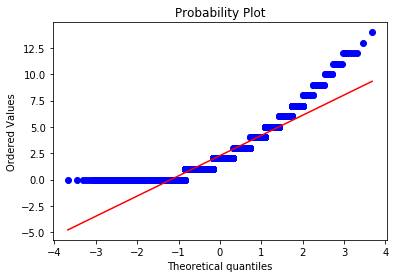

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2257
Kurtosis: 1.8796


   Middle 
Overview of variable:  k 


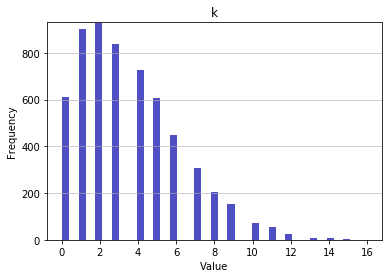

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.5526
Standard deviation: 2.6757
Median: 3.0
Maximal value: 16.0


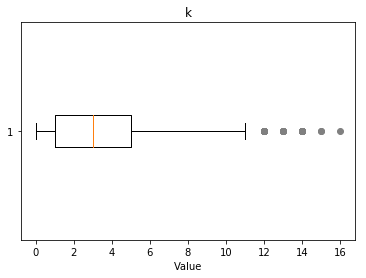

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0}


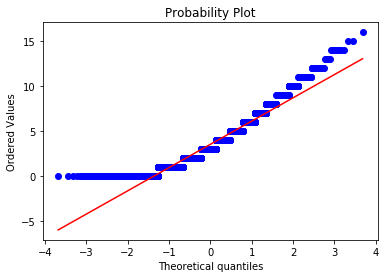

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8407
Kurtosis: 0.4691


   Jungle 
Overview of variable:  k 


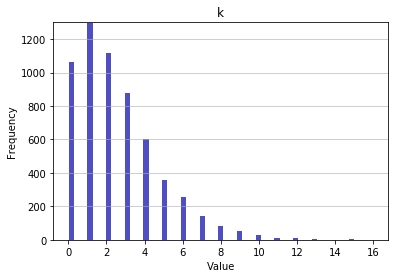

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.4786
Standard deviation: 2.2053
Median: 2.0
Maximal value: 16.0


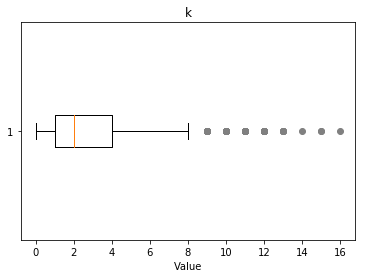

-------------------- 
Outlier detection:
 --------------------
List of outliers: {10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0}


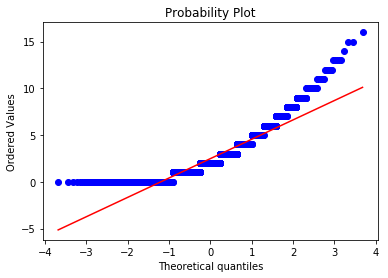

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2701
Kurtosis: 2.1467


   ADC 
Overview of variable:  k 


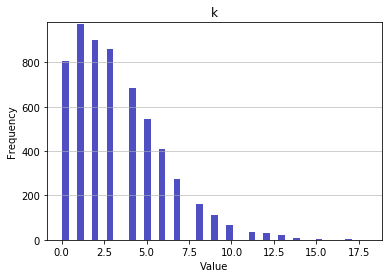

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.2873
Standard deviation: 2.6939
Median: 3.0
Maximal value: 18.0


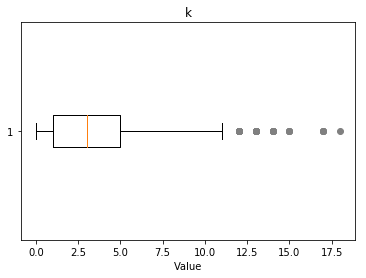

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 17.0, 18.0}


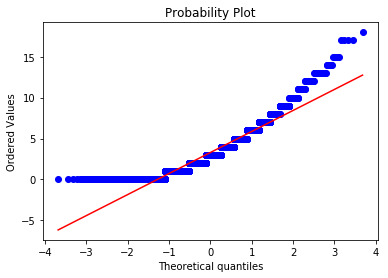

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0608
Kurtosis: 1.3658


   Support 
Overview of variable:  k 


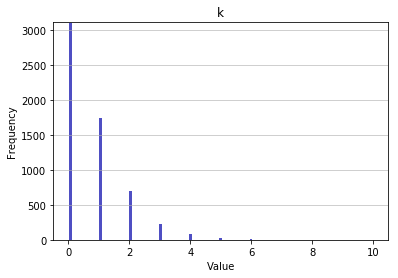

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.7452
Standard deviation: 1.0128
Median: 0.0
Maximal value: 10.0


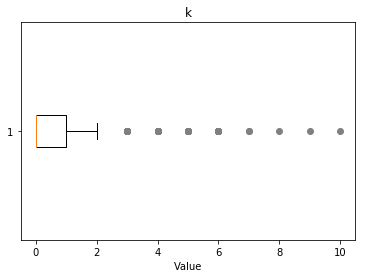

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0}


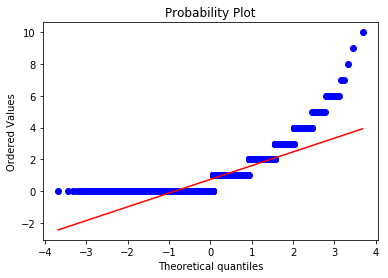

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8745
Kurtosis: 5.5111


   Top 
Overview of variable:  d 


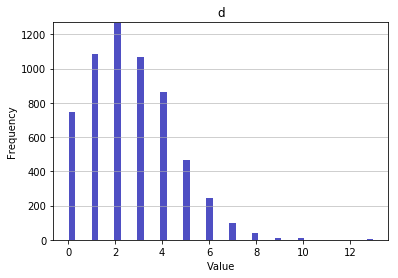

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.5915
Standard deviation: 1.8437
Median: 2.0
Maximal value: 13.0


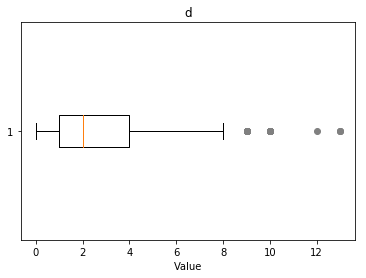

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 12.0, 13.0}


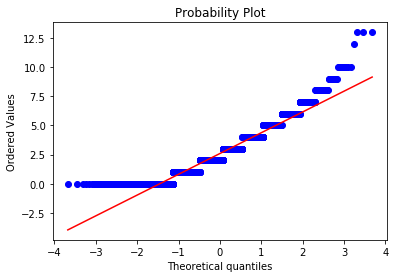

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7137
Kurtosis: 0.7156


   Middle 
Overview of variable:  d 


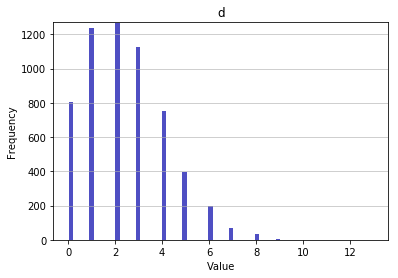

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.399
Standard deviation: 1.7353
Median: 2.0
Maximal value: 13.0


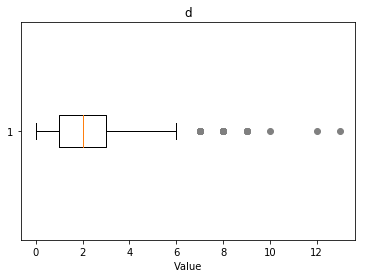

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 12.0, 13.0}


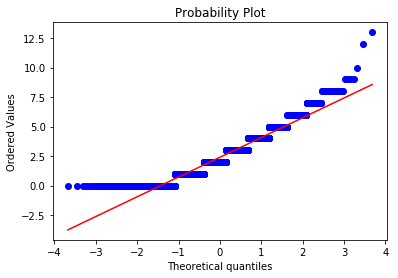

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6841
Kurtosis: 0.4406


   Jungle 
Overview of variable:  d 


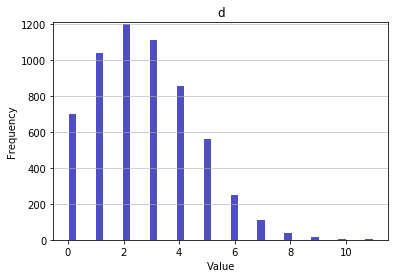

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.6819
Standard deviation: 1.8467
Median: 3.0
Maximal value: 11.0


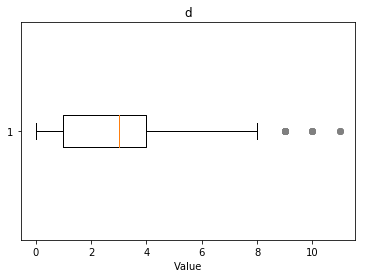

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0}


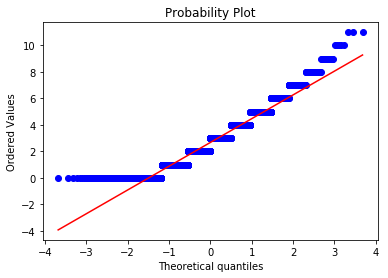

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5729
Kurtosis: 0.1329


   ADC 
Overview of variable:  d 


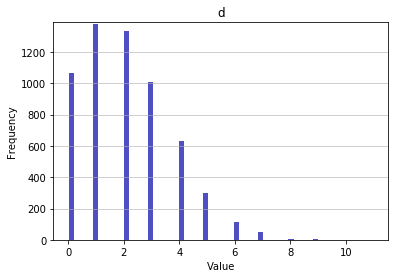

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.074
Standard deviation: 1.6181
Median: 2.0
Maximal value: 11.0


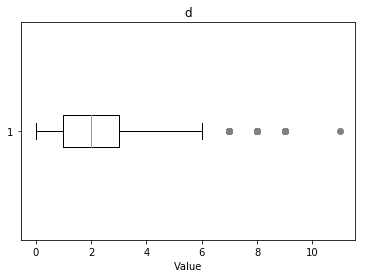

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 11.0, 7.0}


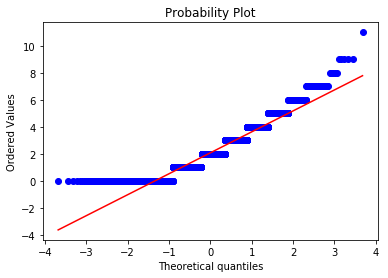

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7188
Kurtosis: 0.3149


   Support 
Overview of variable:  d 


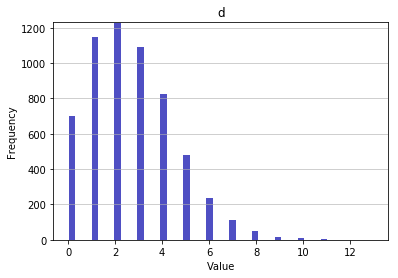

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.6134
Standard deviation: 1.8548
Median: 2.0
Maximal value: 13.0


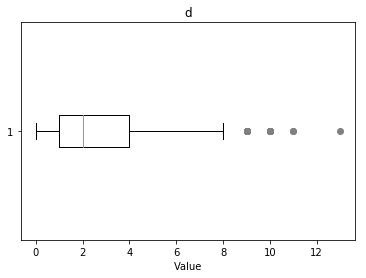

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 13.0}


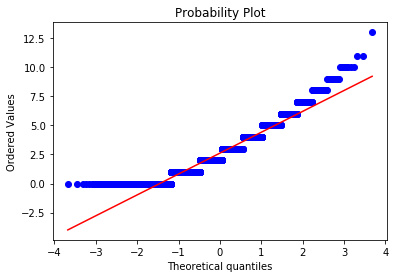

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7151
Kurtosis: 0.5004


   Top 
Overview of variable:  a 


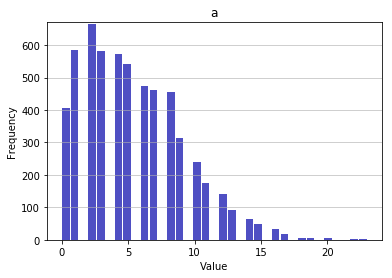

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.3111
Standard deviation: 3.8086
Median: 5.0
Maximal value: 23.0


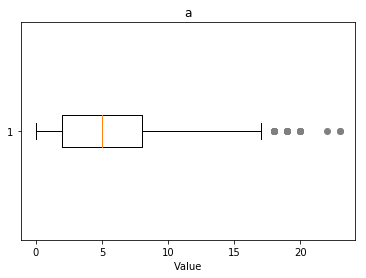

-------------------- 
Outlier detection:
 --------------------
List of outliers: {17.0, 18.0, 19.0, 20.0, 22.0, 23.0}


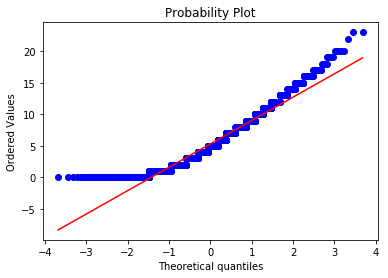

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7494
Kurtosis: 0.2813


   Middle 
Overview of variable:  a 


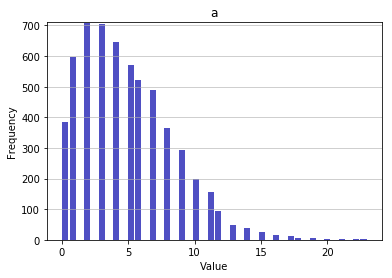

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.9061
Standard deviation: 3.476
Median: 4.0
Maximal value: 23.0


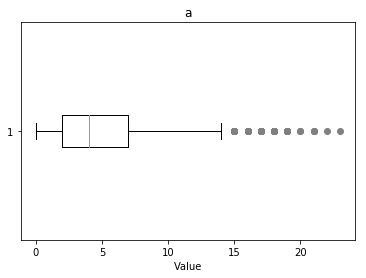

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0}


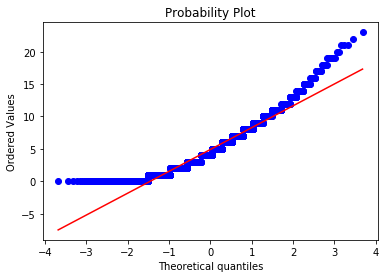

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.863
Kurtosis: 0.8518


   Jungle 
Overview of variable:  a 


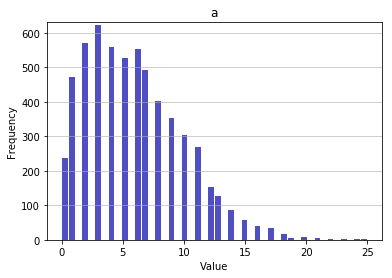

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.9437
Standard deviation: 3.9616
Median: 5.0
Maximal value: 25.0


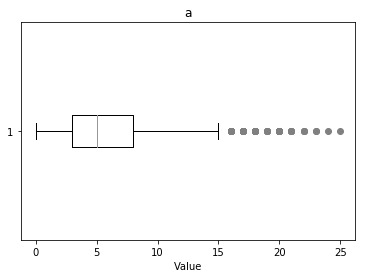

-------------------- 
Outlier detection:
 --------------------
List of outliers: {18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0}


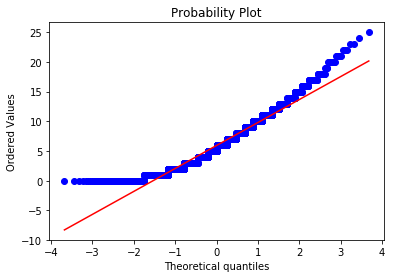

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7501
Kurtosis: 0.4079


   ADC 
Overview of variable:  a 


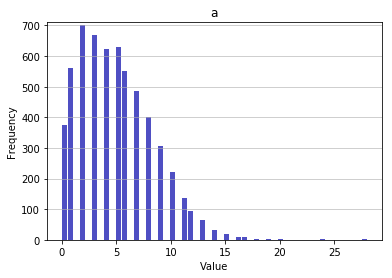

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.9396
Standard deviation: 3.3654
Median: 5.0
Maximal value: 28.0


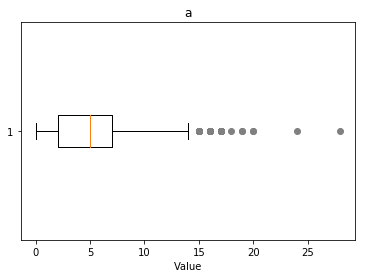

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 24.0, 28.0}


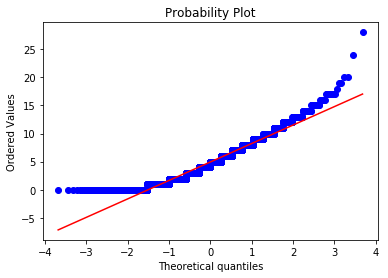

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7298
Kurtosis: 0.6165


   Support 
Overview of variable:  a 


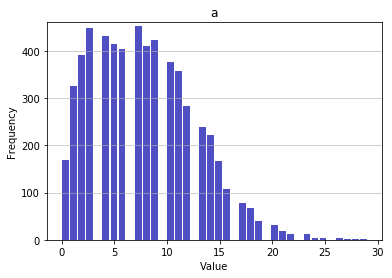

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.7441
Standard deviation: 4.8381
Median: 7.0
Maximal value: 29.0


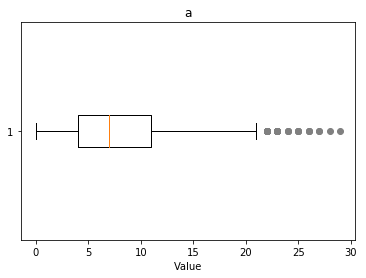

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0}


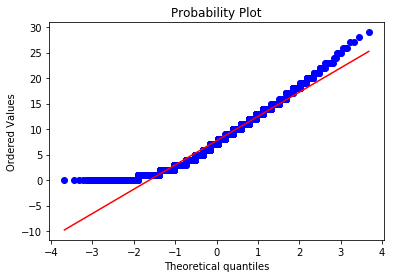

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5552
Kurtosis: -0.0324


   Top 
Overview of variable:  doubles 


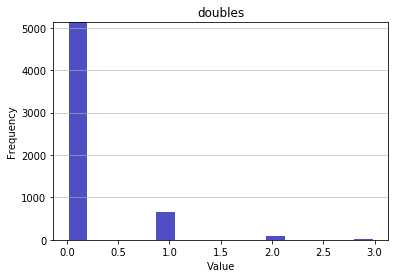

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1511
Standard deviation: 0.4189
Median: 0.0
Maximal value: 3.0


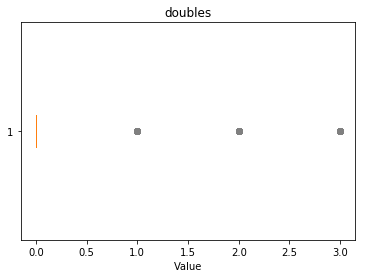

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


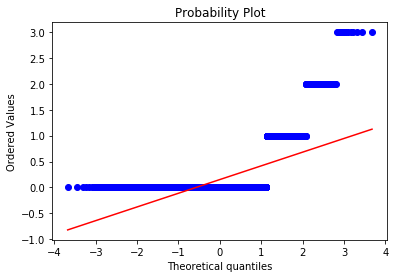

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.0477
Kurtosis: 10.2279


   Middle 
Overview of variable:  doubles 


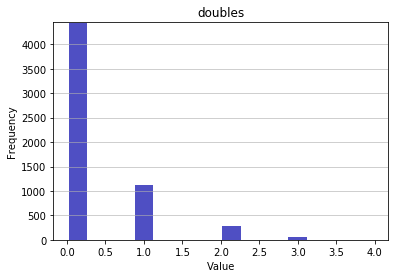

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3123
Standard deviation: 0.6077
Median: 0.0
Maximal value: 4.0


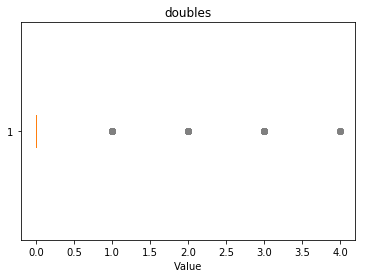

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0}


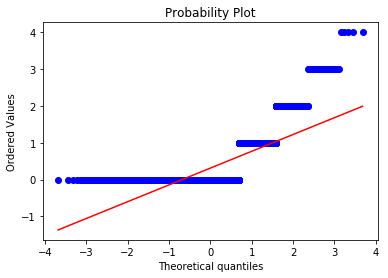

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0884
Kurtosis: 4.4713


   Jungle 
Overview of variable:  doubles 


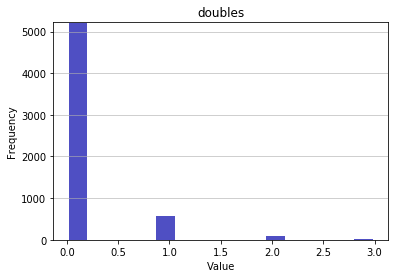

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1376
Standard deviation: 0.4111
Median: 0.0
Maximal value: 3.0


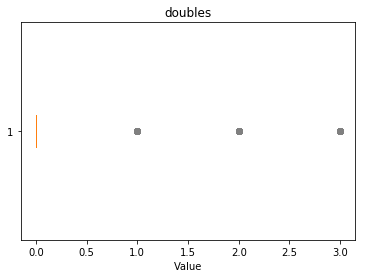

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


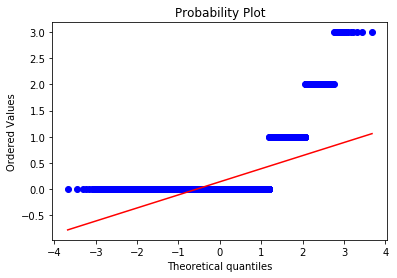

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.36
Kurtosis: 12.5982


   ADC 
Overview of variable:  doubles 


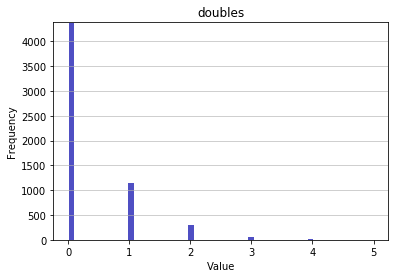

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3366
Standard deviation: 0.6462
Median: 0.0
Maximal value: 5.0


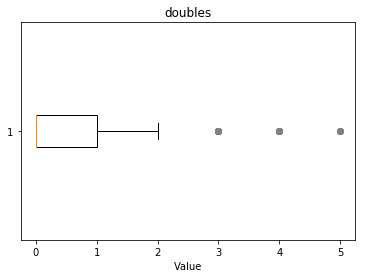

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0}


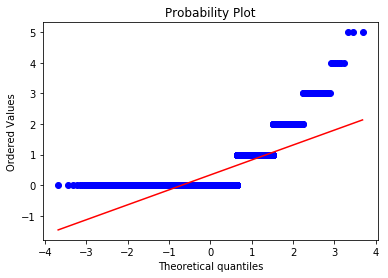

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1754
Kurtosis: 5.4167


   Support 
Overview of variable:  doubles 


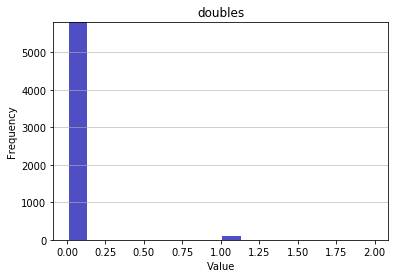

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0165
Standard deviation: 0.1312
Median: 0.0
Maximal value: 2.0


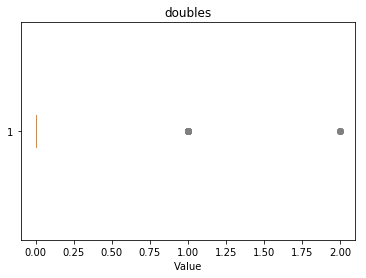

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


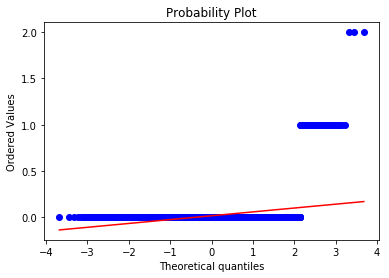

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.2663
Kurtosis: 72.4039


   Top 
Overview of variable:  triples 


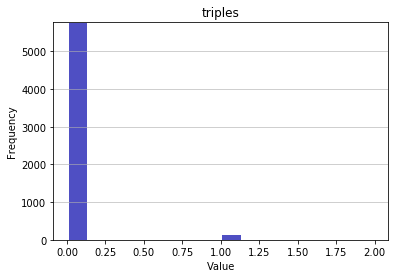

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0226
Standard deviation: 0.1519
Median: 0.0
Maximal value: 2.0


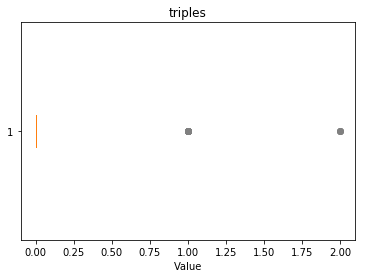

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


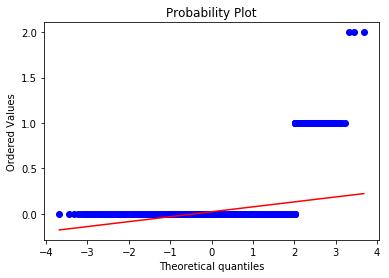

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 6.8592
Kurtosis: 48.5396


   Middle 
Overview of variable:  triples 


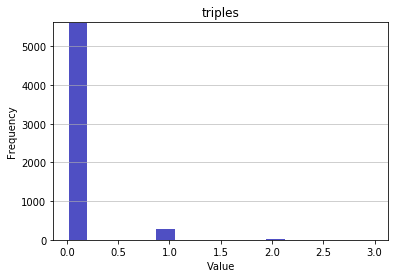

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0487
Standard deviation: 0.2238
Median: 0.0
Maximal value: 3.0


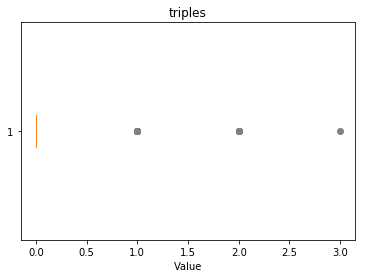

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


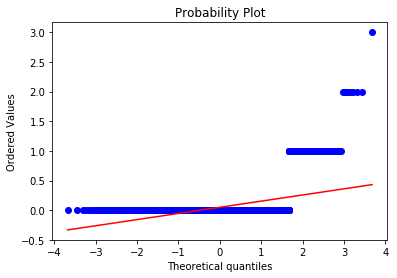

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.7747
Kurtosis: 24.8466


   Jungle 
Overview of variable:  triples 


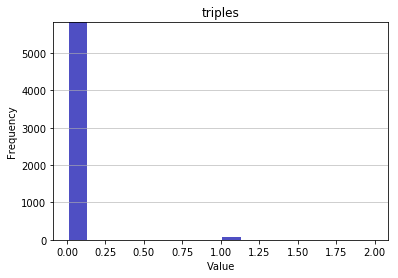

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0131
Standard deviation: 0.1165
Median: 0.0
Maximal value: 2.0


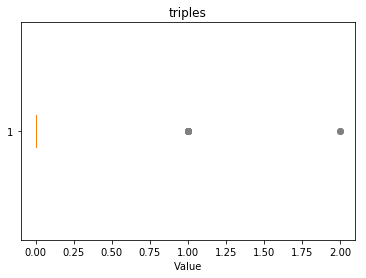

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


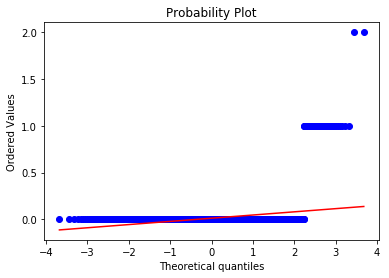

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.2107
Kurtosis: 89.473


   ADC 
Overview of variable:  triples 


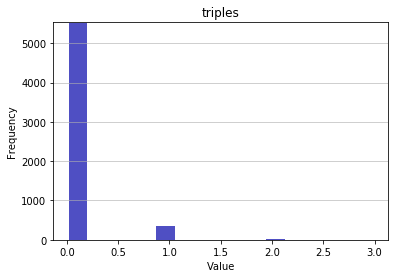

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0653
Standard deviation: 0.2599
Median: 0.0
Maximal value: 3.0


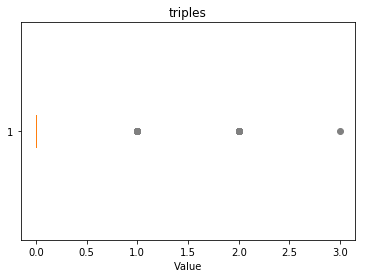

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


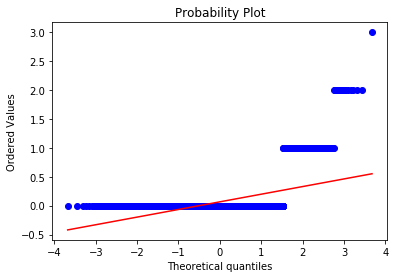

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.1146
Kurtosis: 18.0518


   Support 
Overview of variable:  triples 


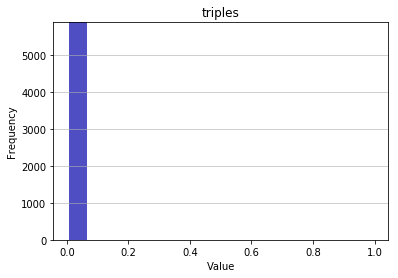

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0005
Standard deviation: 0.0226
Median: 0.0
Maximal value: 1.0


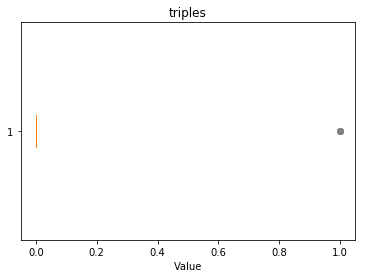

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


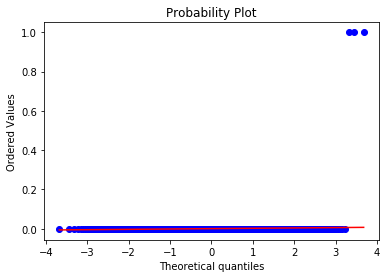

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 44.2832
Kurtosis: 1959.0005


   Top 
Overview of variable:  quadras 


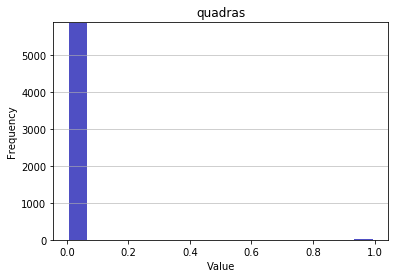

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0031
Standard deviation: 0.0552
Median: 0.0
Maximal value: 1.0


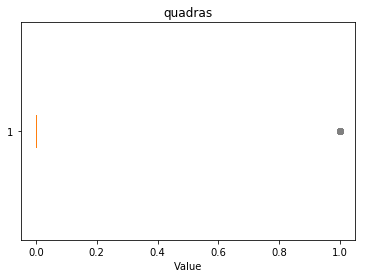

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


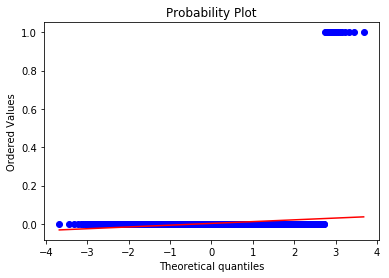

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 18.0093
Kurtosis: 322.3364


   Middle 
Overview of variable:  quadras 


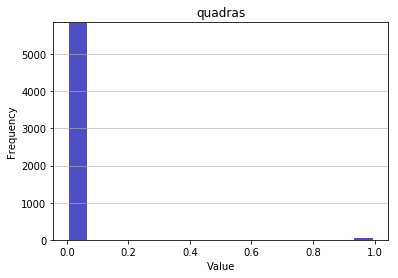

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0061
Standard deviation: 0.0779
Median: 0.0
Maximal value: 1.0


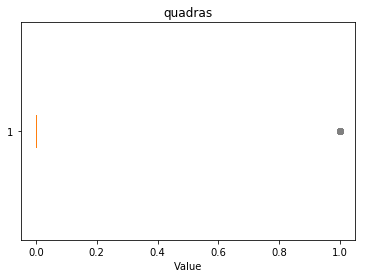

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


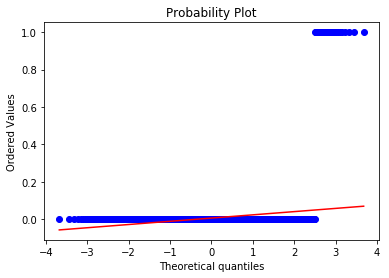

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 12.6757
Kurtosis: 158.6728


   Jungle 
Overview of variable:  quadras 


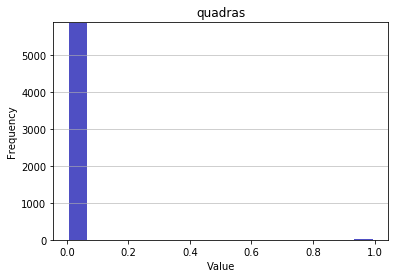

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.002
Standard deviation: 0.0451
Median: 0.0
Maximal value: 1.0


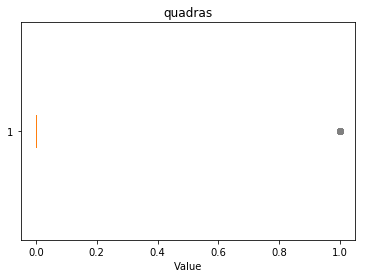

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


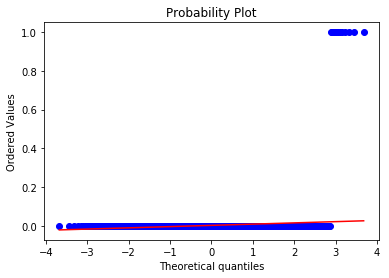

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 22.0908
Kurtosis: 486.002


   ADC 
Overview of variable:  quadras 


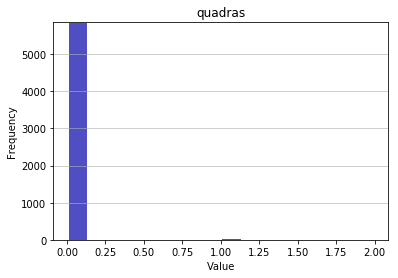

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0063
Standard deviation: 0.0811
Median: 0.0
Maximal value: 2.0


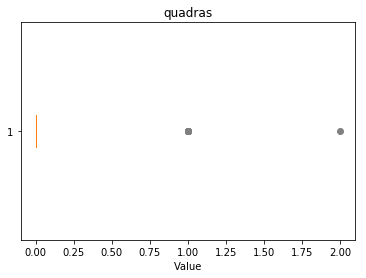

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


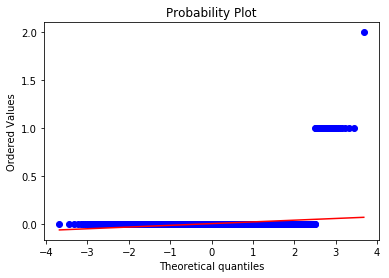

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.4413
Kurtosis: 192.739


   Support 
Overview of variable:  quadras 


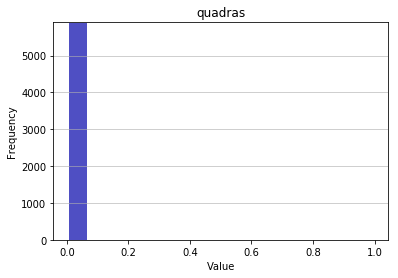

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0002
Standard deviation: 0.013
Median: 0.0
Maximal value: 1.0


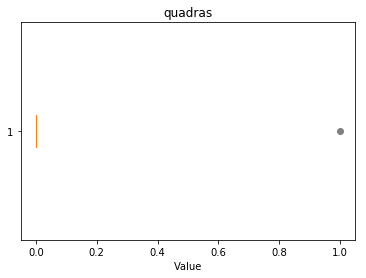

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


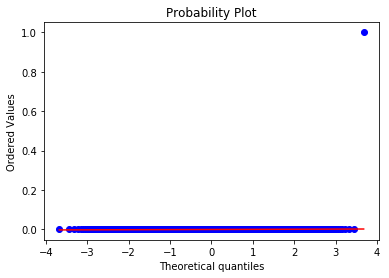

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 76.7398
Kurtosis: 5887.0002


   Top 
Overview of variable:  pentas 


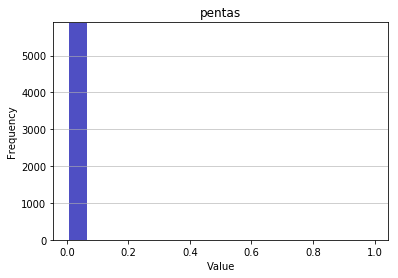

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0002
Standard deviation: 0.013
Median: 0.0
Maximal value: 1.0


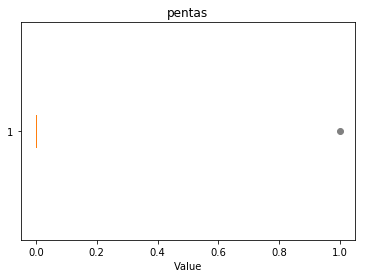

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


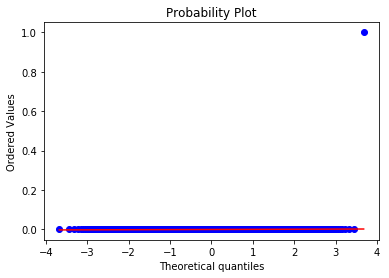

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 76.7398
Kurtosis: 5887.0002


   Middle 
Overview of variable:  pentas 


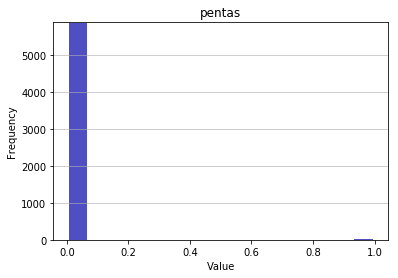

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0019
Standard deviation: 0.0432
Median: 0.0
Maximal value: 1.0


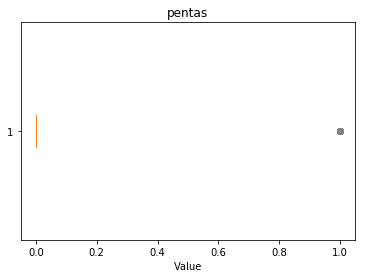

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


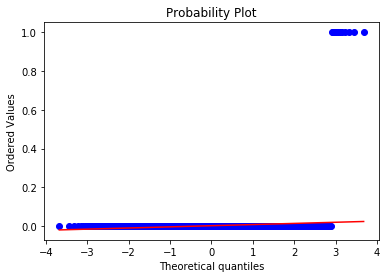

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 23.079
Kurtosis: 530.6382


   Jungle 
Overview of variable:  pentas 


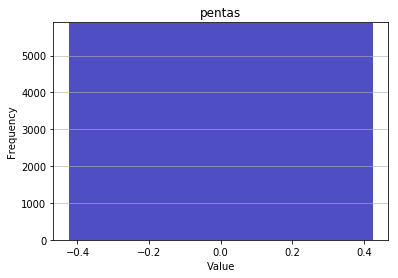

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


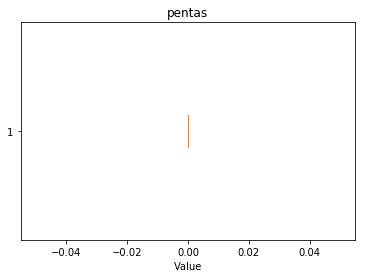

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


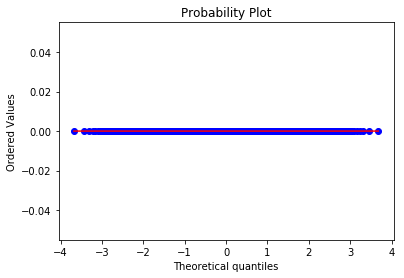

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0


   ADC 
Overview of variable:  pentas 


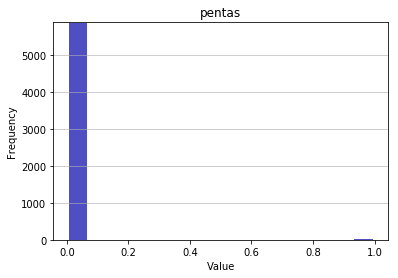

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0017
Standard deviation: 0.0412
Median: 0.0
Maximal value: 1.0


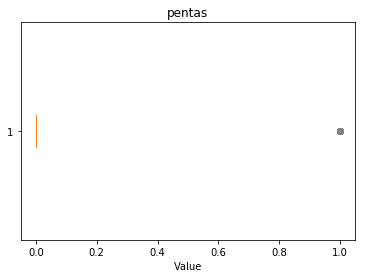

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


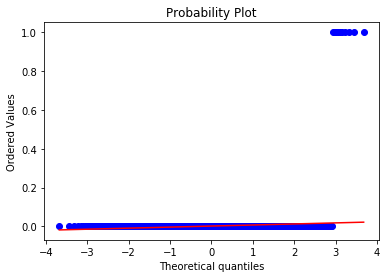

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 24.2116
Kurtosis: 584.2017


   Support 
Overview of variable:  pentas 


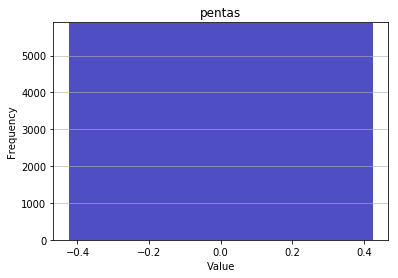

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


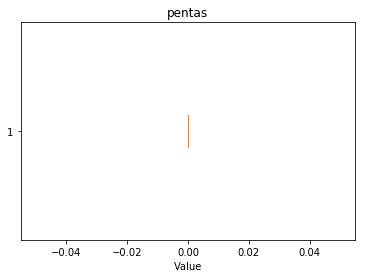

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


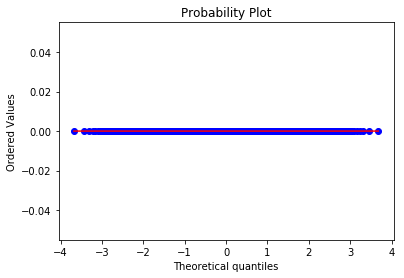

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0


   Top 
Overview of variable:  kpm 


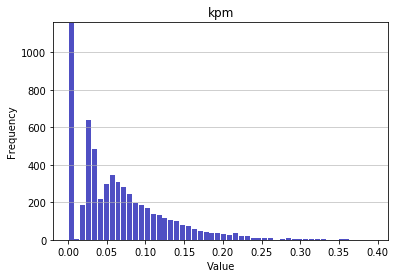

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0645
Standard deviation: 0.0595
Median: 0.0524
Maximal value: 0.3944773175542406


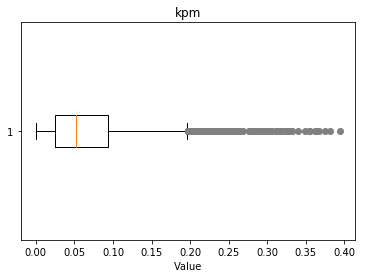

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.33, 0.25, 0.26, 0.28, 0.31, 0.29, 0.36, 0.32, 0.24, 0.35, 0.38, 0.3, 0.34, 0.27, 0.37, 0.39}


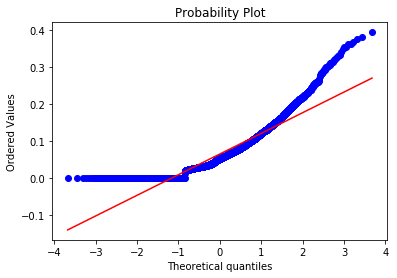

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3603
Kurtosis: 2.425


   Middle 
Overview of variable:  kpm 


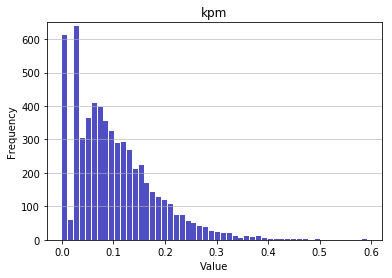

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1
Standard deviation: 0.0777
Median: 0.0848
Maximal value: 0.5919661733615222


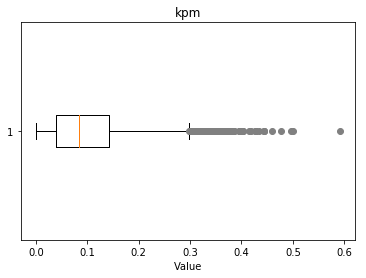

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.37, 0.48, 0.44, 0.34, 0.4, 0.35, 0.42, 0.36, 0.33, 0.38, 0.46, 0.59, 0.5, 0.43, 0.39}


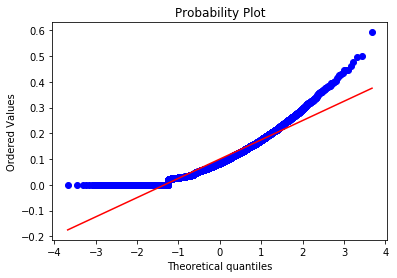

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1028
Kurtosis: 1.6014


   Jungle 
Overview of variable:  kpm 


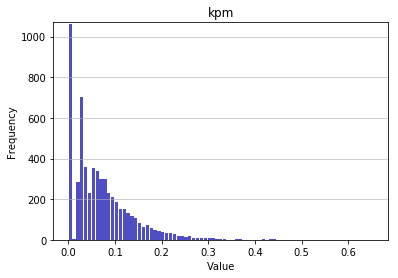

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0708
Standard deviation: 0.0659
Median: 0.0568
Maximal value: 0.653505786249149


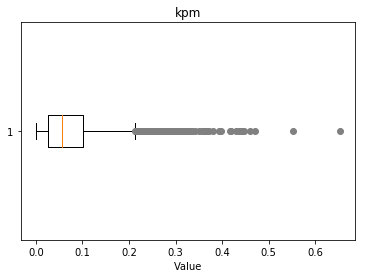

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.31, 0.27, 0.29, 0.3, 0.44, 0.28, 0.36, 0.39, 0.32, 0.33, 0.42, 0.34, 0.43, 0.35, 0.45, 0.37, 0.46, 0.38, 0.47, 0.55, 0.4, 0.65}


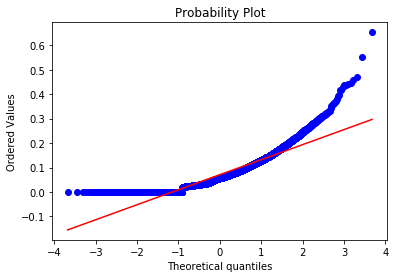

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6034
Kurtosis: 4.3876


   ADC 
Overview of variable:  kpm 


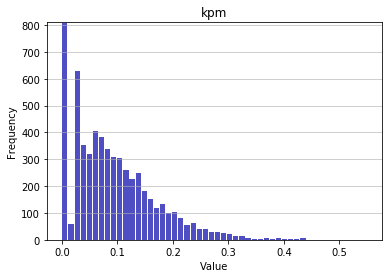

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0915
Standard deviation: 0.0753
Median: 0.0768
Maximal value: 0.5497861942577886


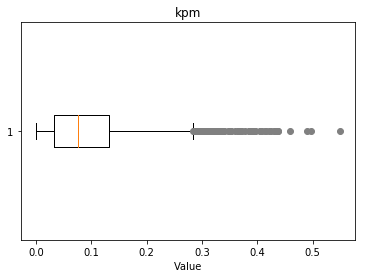

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.33, 0.37, 0.35, 0.41, 0.46, 0.32, 0.4, 0.5, 0.43, 0.39, 0.44, 0.38, 0.36, 0.34, 0.42, 0.49, 0.55}


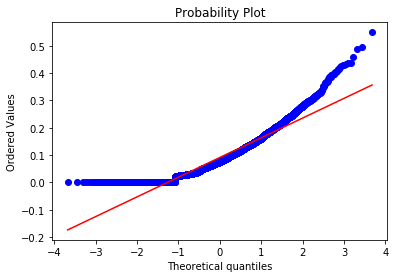

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1331
Kurtosis: 1.7023


   Support 
Overview of variable:  kpm 


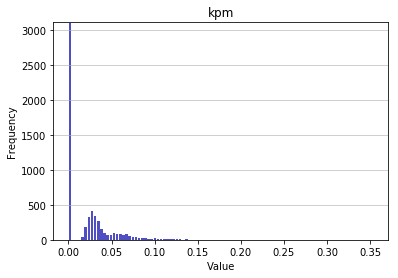

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0211
Standard deviation: 0.0294
Median: 0.0
Maximal value: 0.3537735849056604


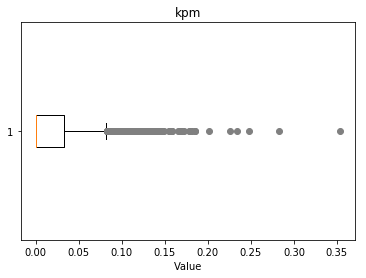

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.12, 0.14, 0.11, 0.13, 0.15, 0.16, 0.17, 0.18, 0.2, 0.23, 0.25, 0.28, 0.35}


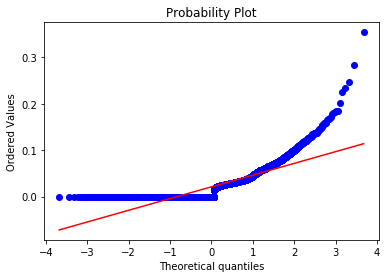

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1192
Kurtosis: 8.2374


   Top 
Overview of variable:  elementals 


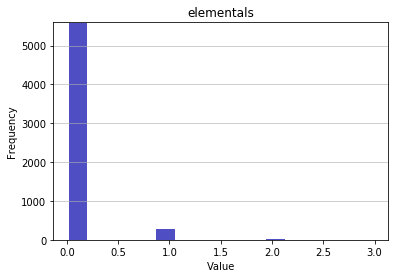

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.055
Standard deviation: 0.2466
Median: 0.0
Maximal value: 3.0


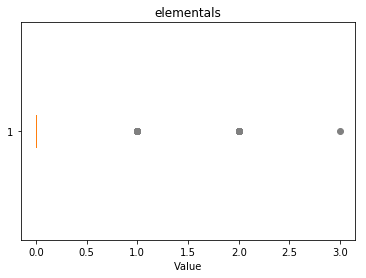

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


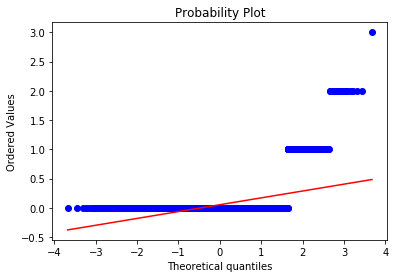

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.8229
Kurtosis: 25.6464


   Middle 
Overview of variable:  elementals 


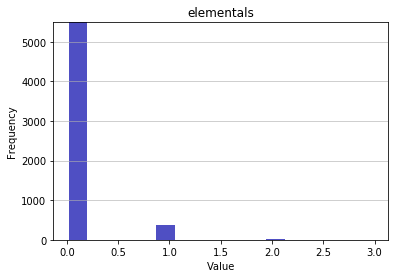

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0738
Standard deviation: 0.2827
Median: 0.0
Maximal value: 3.0


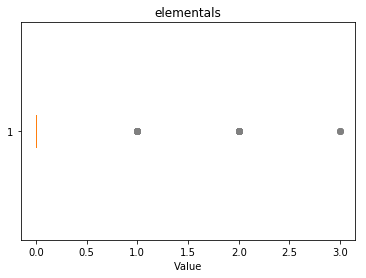

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


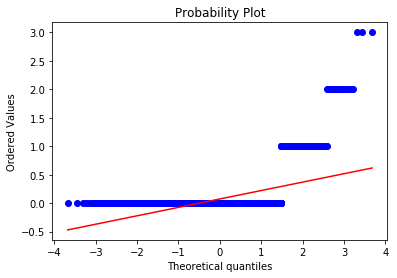

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.1342
Kurtosis: 19.345


   Jungle 
Overview of variable:  elementals 


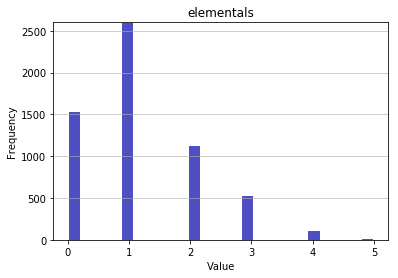

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 1.1677
Standard deviation: 0.9797
Median: 1.0
Maximal value: 5.0


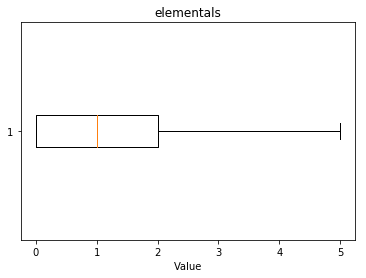

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.0}


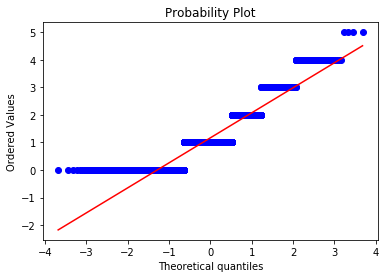

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7528
Kurtosis: 0.1913


   ADC 
Overview of variable:  elementals 


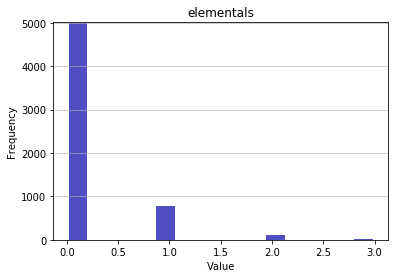

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1738
Standard deviation: 0.4395
Median: 0.0
Maximal value: 3.0


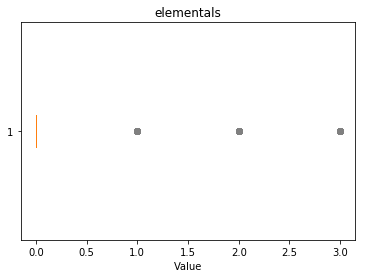

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


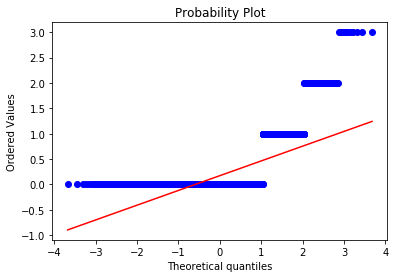

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.6946
Kurtosis: 7.6978


   Support 
Overview of variable:  elementals 


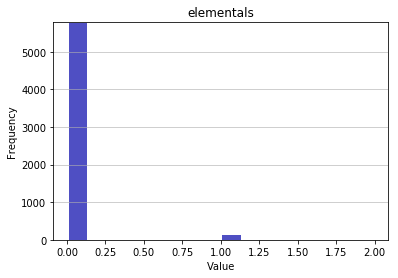

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.021
Standard deviation: 0.1459
Median: 0.0
Maximal value: 2.0


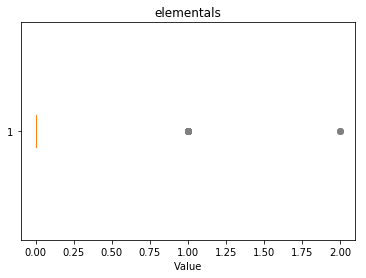

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


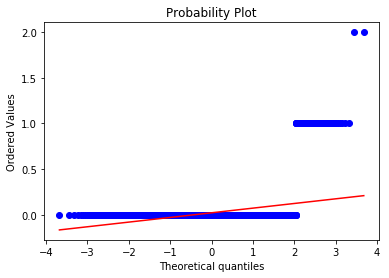

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 6.9991
Kurtosis: 49.7969


   Top 
Overview of variable:  firedrakes 


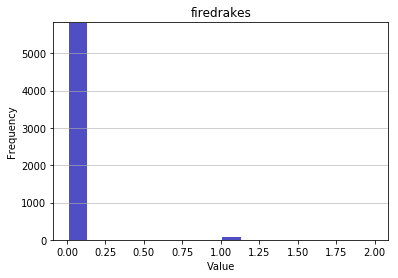

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0121
Standard deviation: 0.1107
Median: 0.0
Maximal value: 2.0


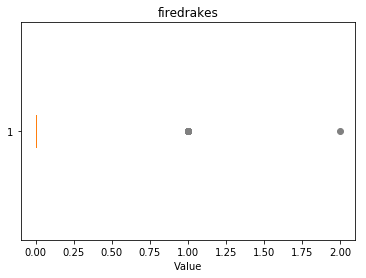

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


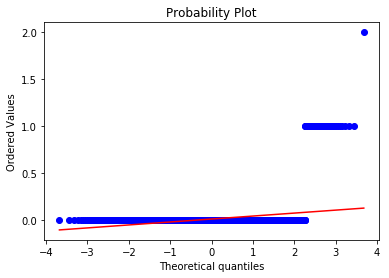

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.3174
Kurtosis: 89.0924


   Middle 
Overview of variable:  firedrakes 


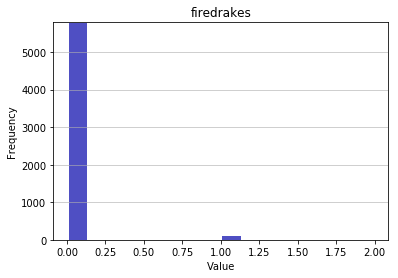

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0182
Standard deviation: 0.1348
Median: 0.0
Maximal value: 2.0


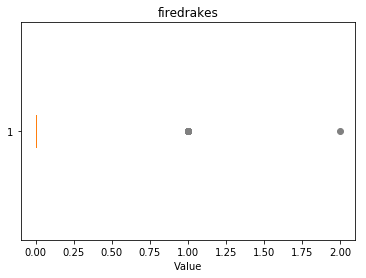

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


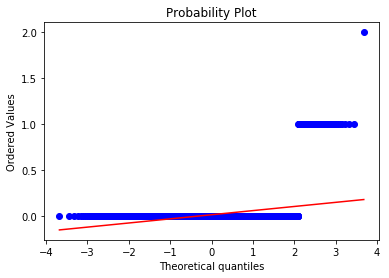

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.4239
Kurtosis: 55.0942


   Jungle 
Overview of variable:  firedrakes 


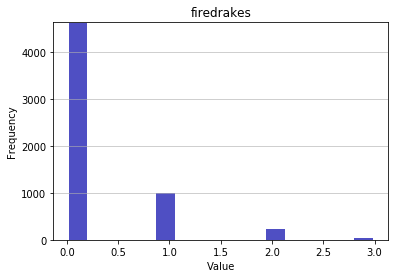

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2654
Standard deviation: 0.5541
Median: 0.0
Maximal value: 3.0


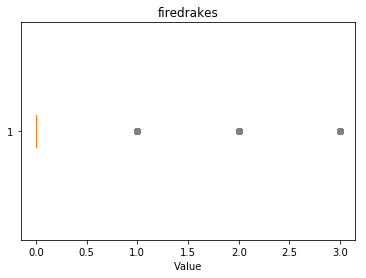

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


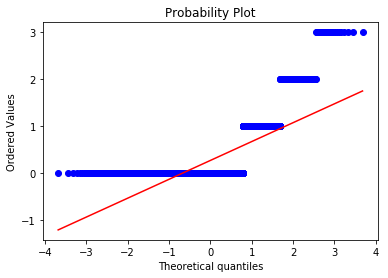

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1745
Kurtosis: 4.5489


   ADC 
Overview of variable:  firedrakes 


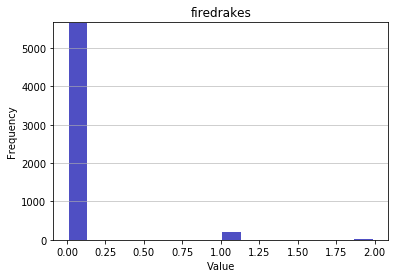

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0418
Standard deviation: 0.2132
Median: 0.0
Maximal value: 2.0


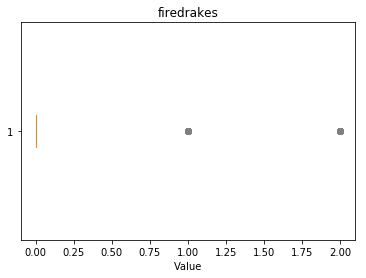

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


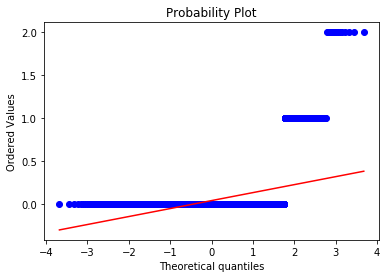

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.3975
Kurtosis: 31.1736


   Support 
Overview of variable:  firedrakes 


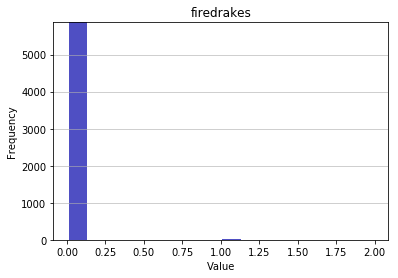

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0046
Standard deviation: 0.0724
Median: 0.0
Maximal value: 2.0


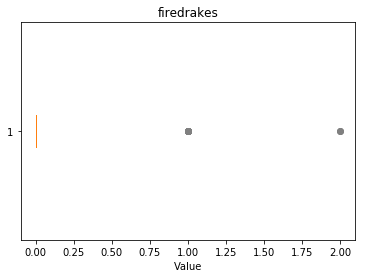

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


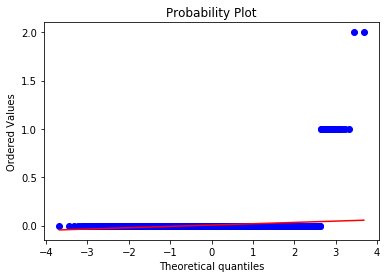

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 17.2584
Kurtosis: 332.5252


   Top 
Overview of variable:  waterdrakes 


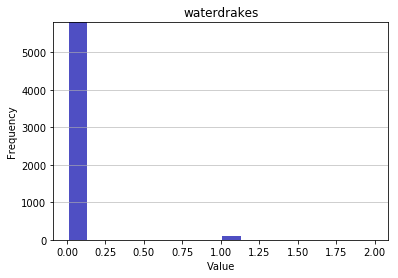

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0165
Standard deviation: 0.1299
Median: 0.0
Maximal value: 2.0


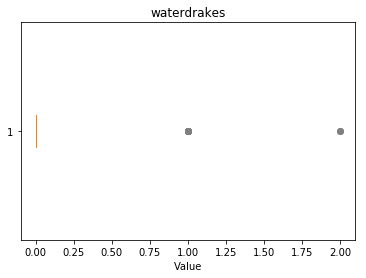

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


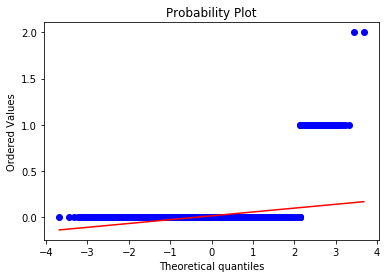

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.06
Kurtosis: 67.3542


   Middle 
Overview of variable:  waterdrakes 


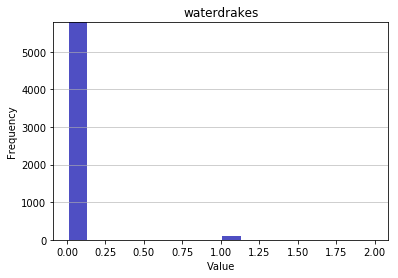

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0197
Standard deviation: 0.1426
Median: 0.0
Maximal value: 2.0


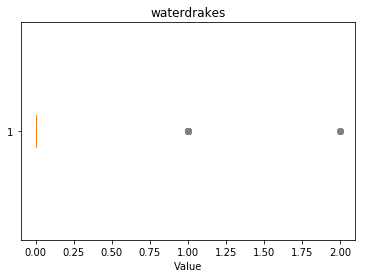

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


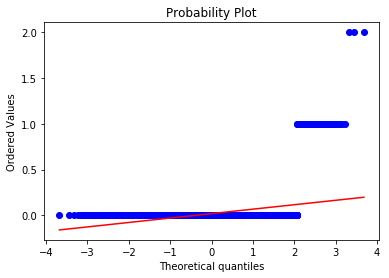

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.4355
Kurtosis: 57.7325


   Jungle 
Overview of variable:  waterdrakes 


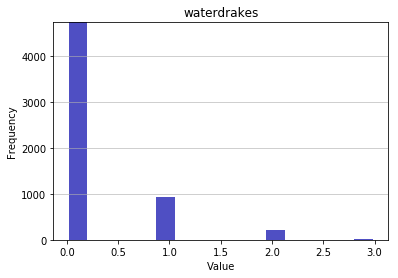

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2405
Standard deviation: 0.5238
Median: 0.0
Maximal value: 3.0


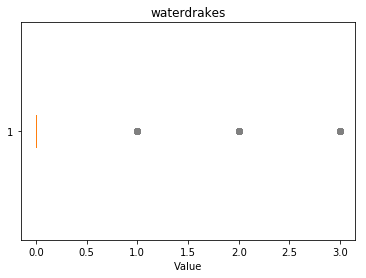

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


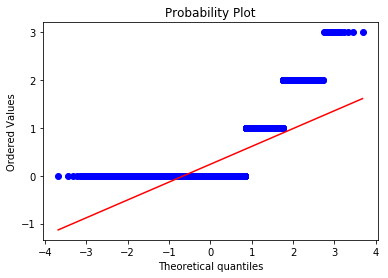

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.241
Kurtosis: 4.7583


   ADC 
Overview of variable:  waterdrakes 


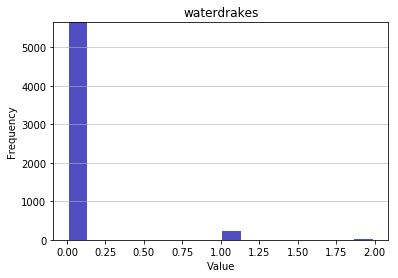

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0426
Standard deviation: 0.2086
Median: 0.0
Maximal value: 2.0


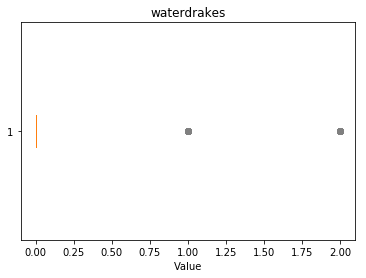

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


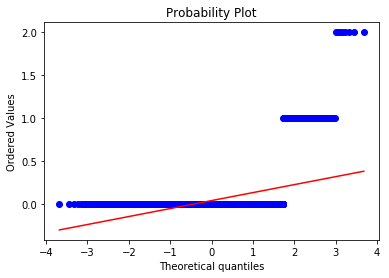

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.9719
Kurtosis: 25.2431


   Support 
Overview of variable:  waterdrakes 


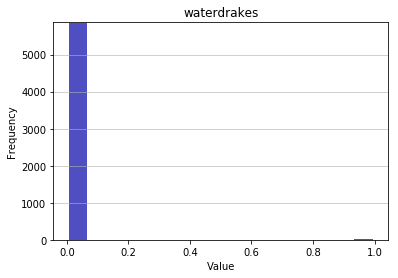

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0048
Standard deviation: 0.0688
Median: 0.0
Maximal value: 1.0


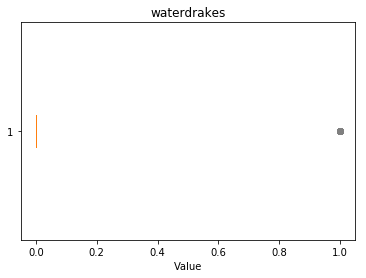

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


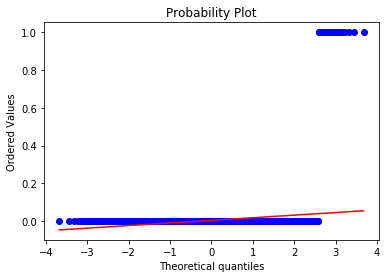

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.4025
Kurtosis: 205.4333


   Top 
Overview of variable:  earthdrakes 


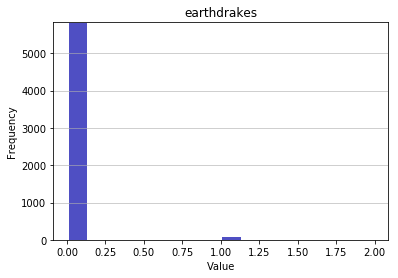

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0119
Standard deviation: 0.1114
Median: 0.0
Maximal value: 2.0


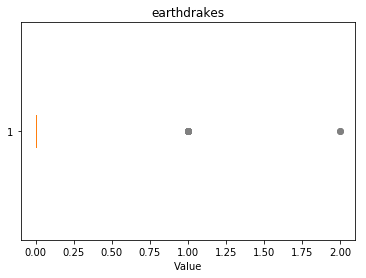

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


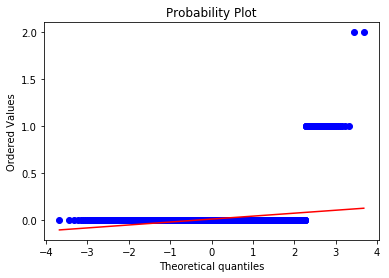

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.7358
Kurtosis: 100.6353


   Middle 
Overview of variable:  earthdrakes 


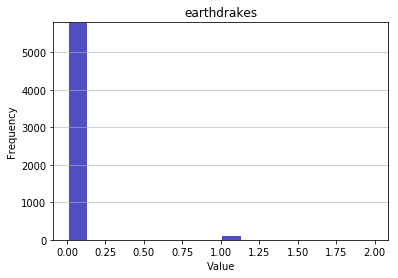

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0168
Standard deviation: 0.1299
Median: 0.0
Maximal value: 2.0


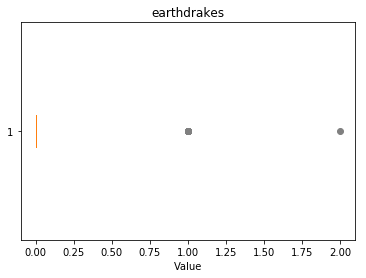

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


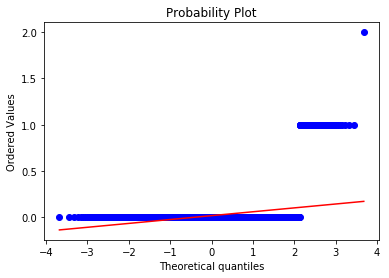

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.7502
Kurtosis: 60.3595


   Jungle 
Overview of variable:  earthdrakes 


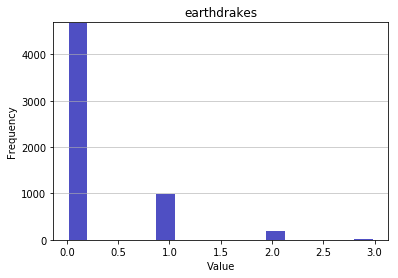

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2444
Standard deviation: 0.5192
Median: 0.0
Maximal value: 3.0


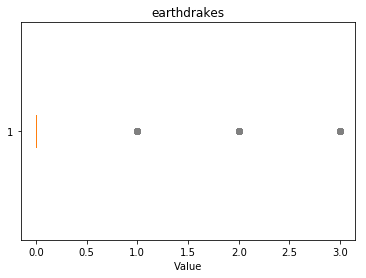

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


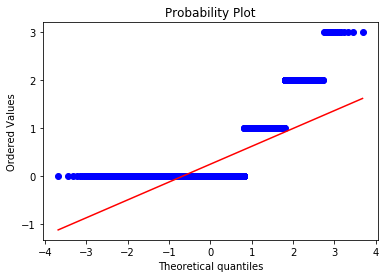

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1804
Kurtosis: 4.5707


   ADC 
Overview of variable:  earthdrakes 


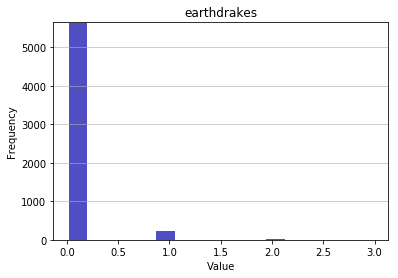

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0443
Standard deviation: 0.2178
Median: 0.0
Maximal value: 3.0


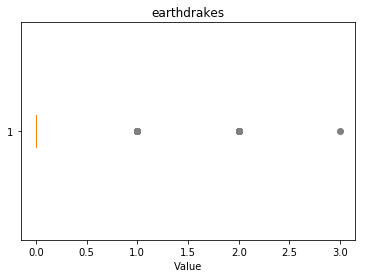

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


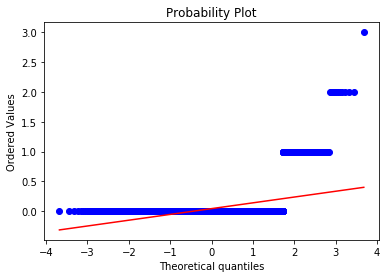

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.2477
Kurtosis: 30.7362


   Support 
Overview of variable:  earthdrakes 


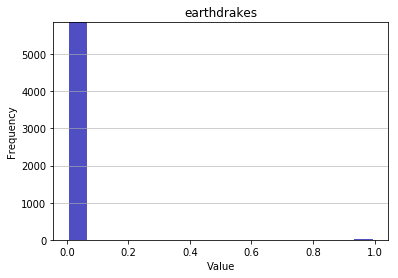

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0058
Standard deviation: 0.0758
Median: 0.0
Maximal value: 1.0


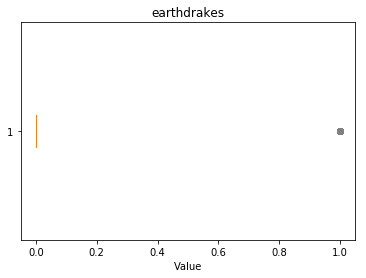

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


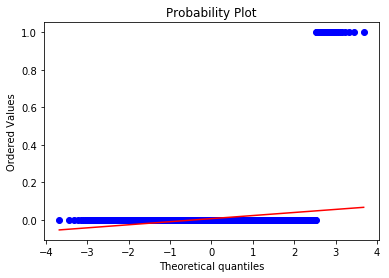

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.0499
Kurtosis: 168.2999


   Top 
Overview of variable:  airdrakes 


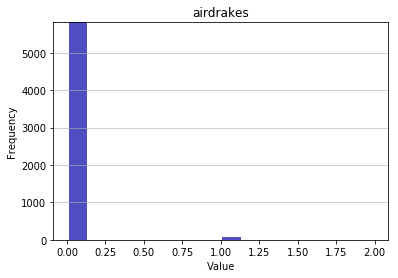

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0146
Standard deviation: 0.1213
Median: 0.0
Maximal value: 2.0


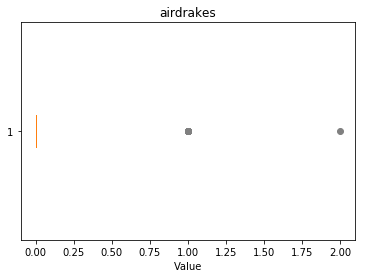

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


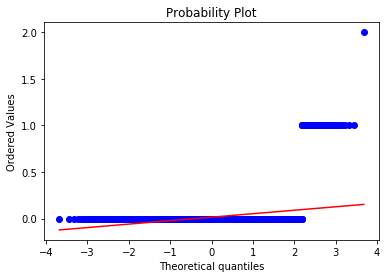

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.3782
Kurtosis: 71.1842


   Middle 
Overview of variable:  airdrakes 


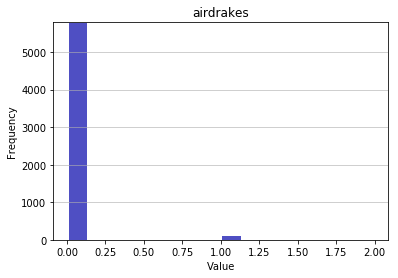

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0192
Standard deviation: 0.1408
Median: 0.0
Maximal value: 2.0


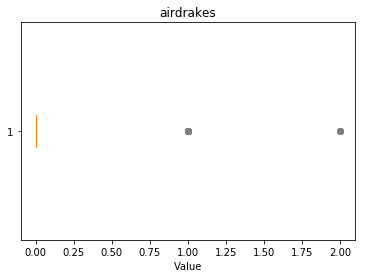

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


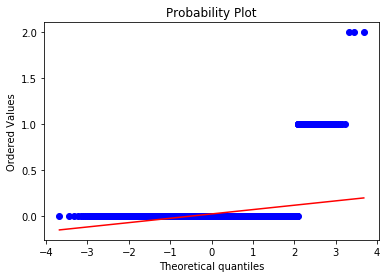

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.5515
Kurtosis: 59.6804


   Jungle 
Overview of variable:  airdrakes 


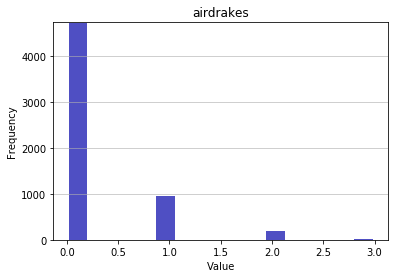

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2361
Standard deviation: 0.5114
Median: 0.0
Maximal value: 3.0


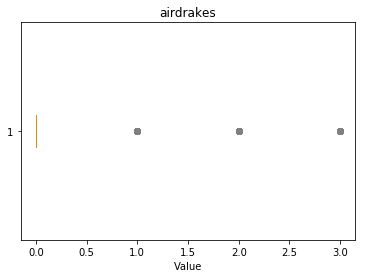

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


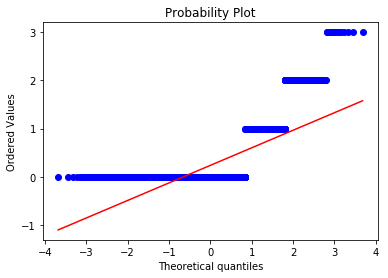

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2168
Kurtosis: 4.6816


   ADC 
Overview of variable:  airdrakes 


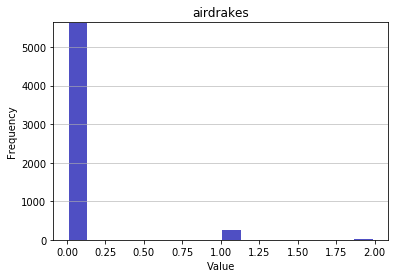

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0451
Standard deviation: 0.2157
Median: 0.0
Maximal value: 2.0


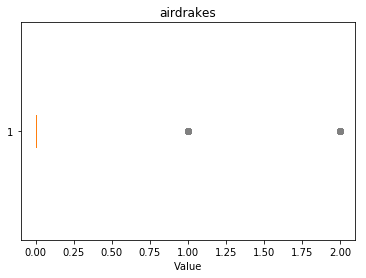

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


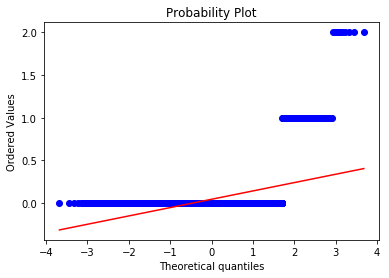

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.8803
Kurtosis: 24.5134


   Support 
Overview of variable:  airdrakes 


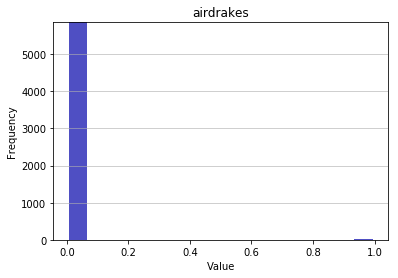

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0059
Standard deviation: 0.0769
Median: 0.0
Maximal value: 1.0


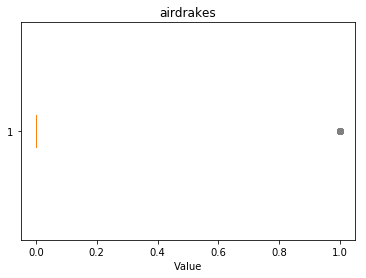

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


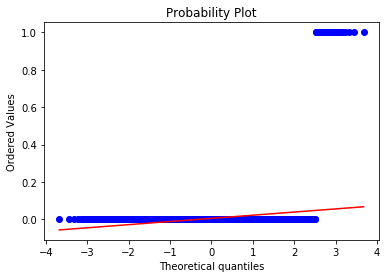

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 12.8588
Kurtosis: 163.3488


   Top 
Overview of variable:  elders 


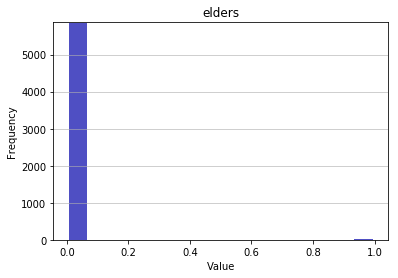

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0046
Standard deviation: 0.0675
Median: 0.0
Maximal value: 1.0


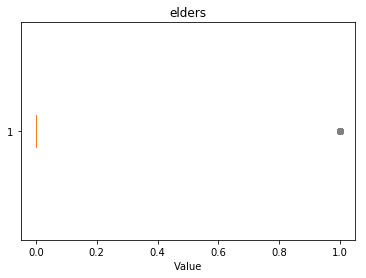

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


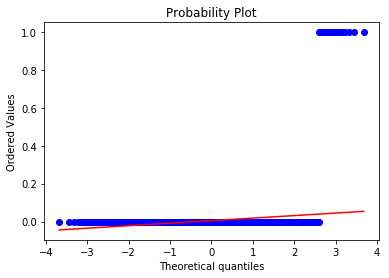

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.6706
Kurtosis: 213.2268


   Middle 
Overview of variable:  elders 


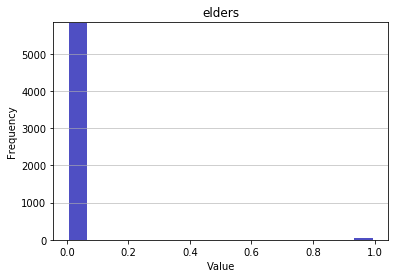

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0085
Standard deviation: 0.0917
Median: 0.0
Maximal value: 1.0


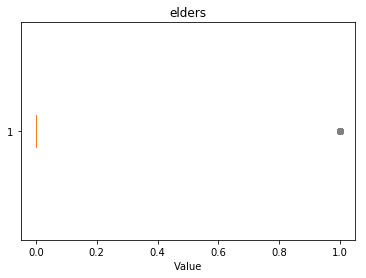

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


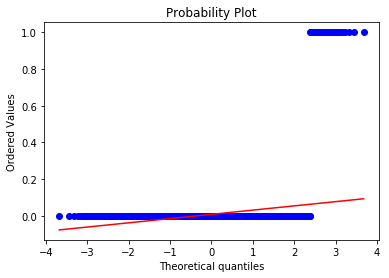

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.7167
Kurtosis: 112.8486


   Jungle 
Overview of variable:  elders 


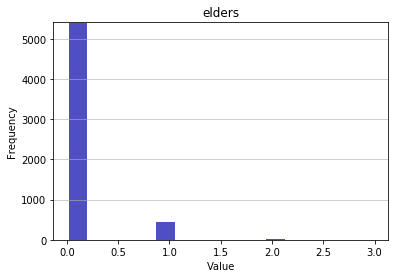

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0883
Standard deviation: 0.3039
Median: 0.0
Maximal value: 3.0


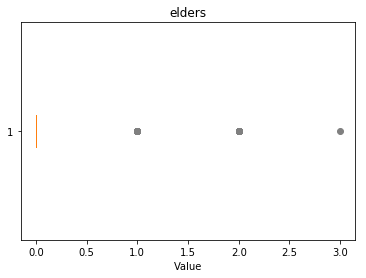

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


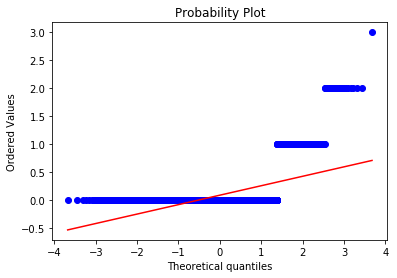

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.5555
Kurtosis: 13.1738


   ADC 
Overview of variable:  elders 


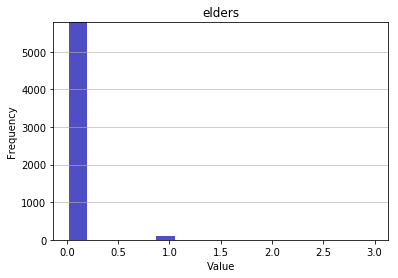

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.02
Standard deviation: 0.146
Median: 0.0
Maximal value: 3.0


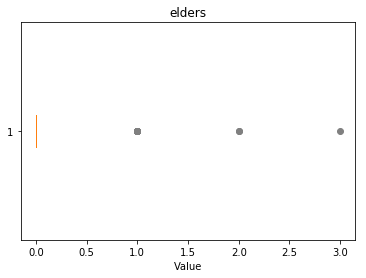

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


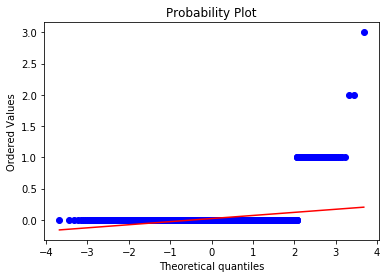

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.9801
Kurtosis: 76.1226


   Support 
Overview of variable:  elders 


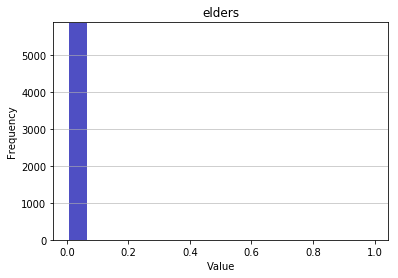

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0012
Standard deviation: 0.0345
Median: 0.0
Maximal value: 1.0


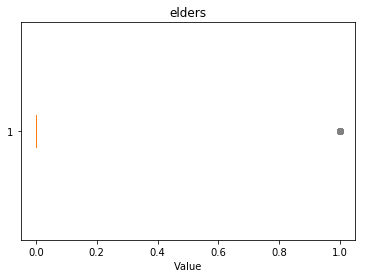

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


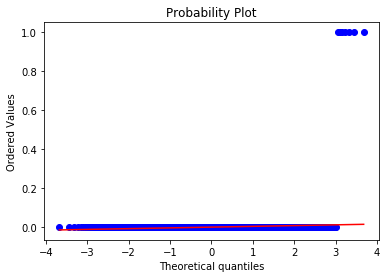

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 28.9606
Kurtosis: 836.7155


   Top 
Overview of variable:  dmgtochamps 


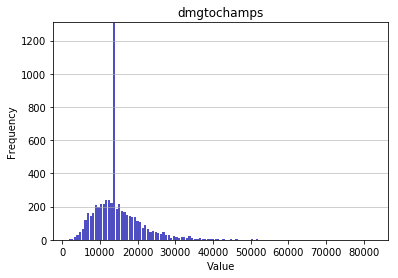

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1683.0
Mean: 14739.0942
Standard deviation: 6252.8305
Median: 13731.5
Maximal value: 82500.0


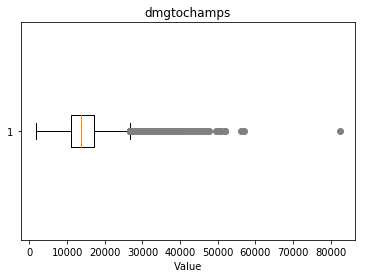

-------------------- 
Outlier detection:
 --------------------
List of outliers: {36356.0, 36357.0, 35849.0, 34834.0, 42003.0, 43039.0, 34336.0, 33830.0, 33836.0, 47662.0, 37434.0, 35902.0, 35392.0, 41027.0, 37956.0, 82500.0, 39504.0, 36439.0, 39514.0, 51802.0, 40029.0, 43639.0, 33912.0, 41090.0, 36996.0, 33925.0, 36504.0, 36515.0, 50862.0, 46254.0, 33970.0, 40650.0, 46282.0, 34005.0, 51927.0, 34010.0, 34015.0, 40161.0, 36066.0, 33507.0, 33506.0, 36581.0, 34022.0, 46833.0, 36593.0, 34545.0, 39156.0, 44792.0, 38655.0, 50439.0, 57100.0, 39698.0, 34581.0, 37657.0, 34087.0, 33583.0, 34610.0, 37687.0, 39736.0, 34107.0, 34114.0, 33612.0, 33618.0, 33623.0, 34135.0, 38749.0, 34658.0, 50531.0, 45421.0, 34168.0, 39813.0, 44936.0, 34696.0, 35728.0, 41364.0, 33684.0, 42906.0, 36764.0, 34205.0, 38814.0, 37290.0, 35246.0, 37820.0, 44503.0, 36314.0, 56287.0, 37343.0, 35302.0, 49641.0, 40953.0, 34814.0}


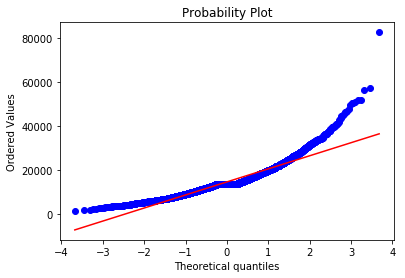

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6331
Kurtosis: 6.123


   Middle 
Overview of variable:  dmgtochamps 


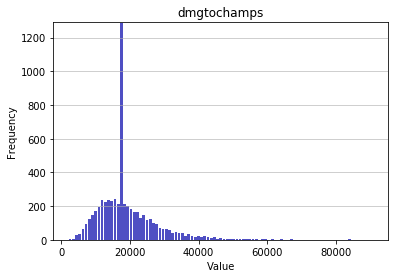

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2060.0
Mean: 19234.6964
Standard deviation: 8736.8914
Median: 17744.5
Maximal value: 90949.0


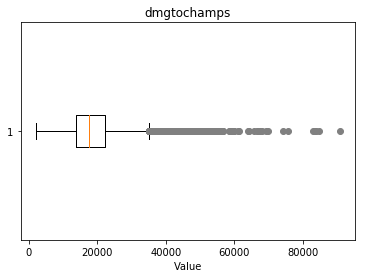

-------------------- 
Outlier detection:
 --------------------
List of outliers: {53760.0, 54273.0, 46087.0, 74248.0, 56840.0, 45581.0, 46094.0, 59407.0, 67093.0, 49173.0, 48668.0, 48678.0, 46630.0, 46632.0, 51241.0, 51248.0, 46128.0, 69170.0, 55347.0, 55362.0, 52811.0, 75854.0, 50262.0, 54874.0, 58986.0, 61551.0, 46192.0, 47734.0, 46200.0, 49793.0, 58504.0, 68265.0, 83634.0, 47286.0, 66764.0, 48849.0, 69843.0, 52949.0, 51421.0, 47848.0, 48874.0, 84718.0, 61166.0, 59123.0, 55540.0, 49932.0, 47892.0, 50967.0, 64291.0, 47908.0, 53034.0, 56108.0, 51504.0, 54065.0, 48439.0, 47929.0, 90949.0, 56145.0, 65887.0, 50528.0, 50534.0, 52090.0, 48519.0, 67474.0, 46484.0, 52122.0, 58785.0, 51623.0, 63915.0, 46516.0, 53179.0, 46011.0, 49595.0, 59840.0, 56768.0, 46533.0, 59853.0, 50645.0, 83927.0, 49111.0, 47066.0, 50652.0, 45545.0, 49134.0, 46066.0, 55286.0, 49144.0, 82942.0}


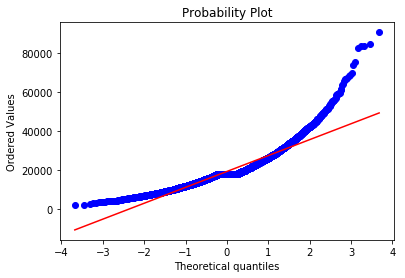

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.769
Kurtosis: 6.2256


   Jungle 
Overview of variable:  dmgtochamps 


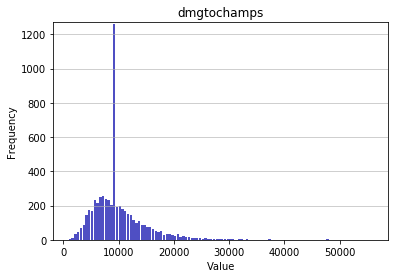

-------------------- 
Summary statistics:
 --------------------
Minimum value: 912.0
Mean: 9965.5771
Standard deviation: 4850.6386
Median: 9063.0
Maximal value: 56092.0


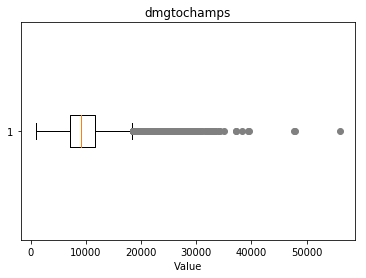

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29696.0, 33281.0, 32264.0, 24586.0, 33292.0, 34322.0, 24602.0, 25630.0, 24628.0, 28743.0, 25677.0, 30797.0, 33873.0, 27751.0, 24682.0, 28783.0, 26736.0, 28282.0, 34951.0, 27271.0, 26249.0, 30860.0, 39566.0, 33442.0, 30373.0, 33451.0, 47787.0, 25264.0, 30389.0, 28859.0, 30400.0, 29897.0, 25290.0, 26319.0, 24792.0, 24797.0, 30431.0, 27871.0, 31973.0, 25834.0, 29423.0, 25331.0, 31991.0, 27393.0, 29441.0, 25348.0, 26888.0, 28424.0, 29455.0, 25871.0, 24851.0, 33043.0, 29974.0, 47899.0, 56092.0, 25890.0, 33058.0, 27426.0, 28451.0, 31013.0, 30504.0, 26408.0, 32046.0, 24884.0, 25910.0, 24892.0, 29502.0, 30528.0, 28993.0, 26946.0, 26438.0, 29516.0, 37197.0, 31576.0, 32603.0, 25948.0, 26467.0, 32105.0, 30584.0, 27000.0, 24957.0, 37253.0, 32143.0, 29075.0, 32148.0, 27028.0, 28570.0, 30115.0, 38310.0, 26545.0, 25011.0, 27060.0, 26561.0, 27094.0, 26587.0, 39388.0, 29153.0, 28644.0, 25576.0, 31721.0}


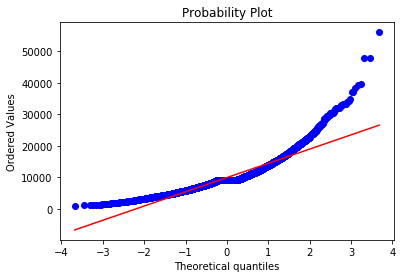

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8472
Kurtosis: 6.4233


   ADC 
Overview of variable:  dmgtochamps 


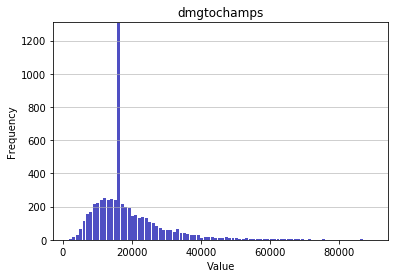

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1665.0
Mean: 18608.8294
Standard deviation: 9762.9681
Median: 16600.5
Maximal value: 89859.0


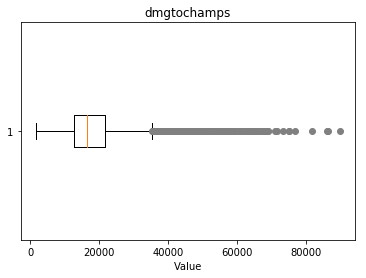

-------------------- 
Outlier detection:
 --------------------
List of outliers: {58370.0, 62478.0, 58906.0, 60445.0, 64549.0, 53288.0, 64042.0, 56365.0, 53317.0, 61007.0, 54352.0, 50257.0, 76885.0, 50783.0, 56417.0, 49763.0, 48739.0, 49253.0, 48760.0, 53375.0, 54401.0, 49808.0, 54418.0, 86170.0, 49822.0, 55968.0, 55972.0, 58535.0, 59050.0, 55468.0, 48824.0, 53956.0, 56006.0, 53453.0, 64205.0, 55516.0, 49377.0, 52464.0, 50935.0, 54007.0, 60674.0, 89859.0, 68867.0, 63238.0, 54534.0, 70923.0, 67343.0, 75027.0, 59667.0, 48406.0, 48920.0, 51480.0, 52504.0, 49435.0, 53021.0, 63271.0, 81708.0, 47928.0, 66874.0, 63805.0, 86338.0, 51011.0, 61771.0, 53594.0, 67421.0, 53604.0, 61290.0, 48493.0, 68466.0, 53620.0, 48512.0, 65925.0, 75142.0, 68999.0, 50059.0, 48526.0, 67474.0, 51093.0, 68502.0, 50069.0, 51098.0, 54694.0, 50599.0, 57770.0, 49578.0, 56751.0, 55727.0, 65456.0, 57267.0, 53688.0, 53178.0, 48570.0, 71611.0, 65471.0, 64962.0, 48587.0, 52683.0, 50638.0, 50130.0, 49108.0, 64473.0, 73182.0, 

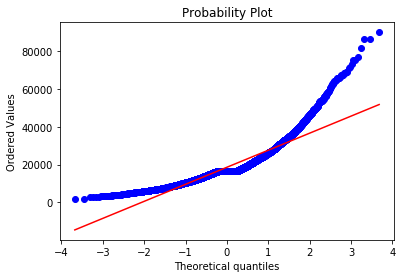

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9208
Kurtosis: 5.859


   Support 
Overview of variable:  dmgtochamps 


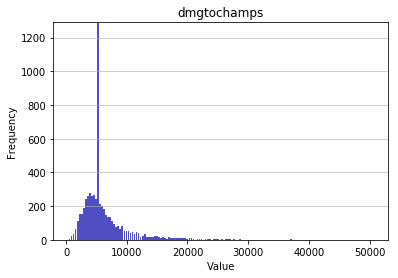

-------------------- 
Summary statistics:
 --------------------
Minimum value: 396.0
Mean: 6301.5806
Standard deviation: 4230.7343
Median: 5261.5
Maximal value: 50600.0


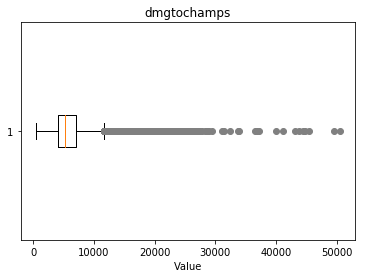

-------------------- 
Outlier detection:
 --------------------
List of outliers: {19462.0, 21000.0, 20489.0, 19465.0, 26121.0, 39944.0, 24586.0, 26645.0, 24600.0, 24605.0, 23581.0, 28712.0, 20521.0, 19496.0, 20008.0, 22058.0, 20525.0, 26671.0, 21566.0, 19523.0, 23622.0, 43086.0, 36948.0, 23638.0, 22617.0, 19040.0, 25698.0, 25713.0, 24183.0, 25720.0, 21630.0, 27774.0, 20610.0, 19589.0, 20613.0, 19079.0, 41097.0, 20111.0, 21138.0, 24210.0, 21143.0, 20123.0, 20642.0, 32422.0, 25255.0, 23724.0, 36524.0, 22190.0, 33970.0, 22196.0, 19656.0, 21194.0, 19659.0, 19662.0, 20688.0, 26328.0, 28378.0, 20699.0, 20196.0, 26859.0, 28915.0, 19702.0, 29433.0, 19711.0, 20223.0, 19712.0, 21762.0, 20739.0, 31498.0, 19734.0, 20248.0, 22303.0, 19231.0, 19240.0, 19753.0, 44845.0, 21809.0, 21821.0, 20285.0, 19265.0, 20293.0, 20807.0, 19278.0, 37200.0, 24913.0, 24914.0, 21844.0, 20310.0, 23897.0, 26461.0, 20832.0, 22883.0, 21865.0, 23403.0, 43890.0, 22387.0, 20340.0, 21884.0, 19841.0, 24452.0, 19335.0, 27529.0, 

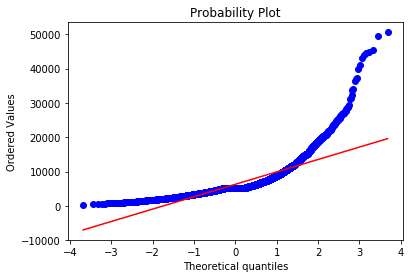

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.1571
Kurtosis: 16.8019


   Top 
Overview of variable:  dmgtochampsperminute 


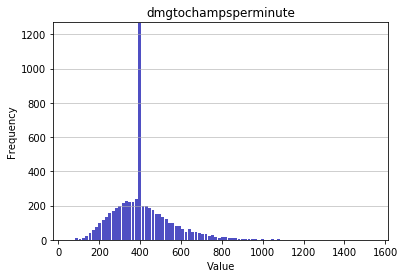

-------------------- 
Summary statistics:
 --------------------
Minimum value: 49.04322486644001
Mean: 408.3605
Standard deviation: 140.2571
Median: 390.3485
Maximal value: 1541.5758330738088


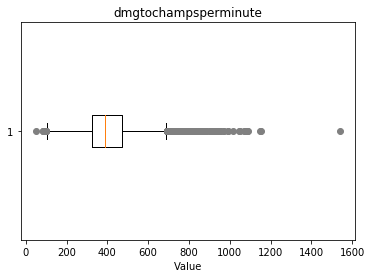

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1154.19, 900.75, 901.25, 901.76, 1541.58, 908.93, 909.55, 912.37, 913.41, 1045.85, 917.98, 1052.82, 927.12, 929.25, 930.02, 932.7, 935.07, 1070.19, 943.46, 1072.66, 943.25, 942.25, 952.49, 954.25, 1083.48, 829.6, 829.38, 831.92, 1088.71, 1085.92, 834.88, 834.04, 831.85, 837.57, 966.4, 839.33, 838.65, 838.9, 842.46, 970.01, 836.84, 845.01, 846.44, 850.4, 850.8, 852.18, 852.2, 854.36, 850.78, 855.17, 857.97, 832.14, 860.23, 861.98, 991.41, 992.33, 865.05, 864.19, 869.01, 871.16, 873.71, 873.63, 873.11, 874.9, 876.37, 878.22, 877.75, 884.36, 1015.41, 1149.1}


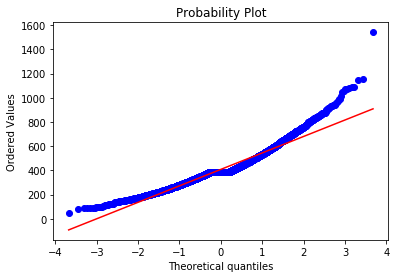

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0389
Kurtosis: 2.4678


   Middle 
Overview of variable:  dmgtochampsperminute 


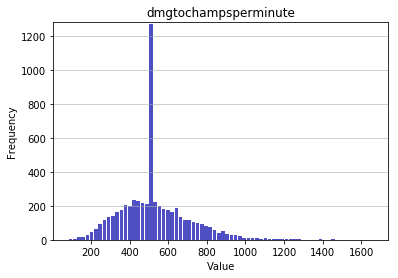

-------------------- 
Summary statistics:
 --------------------
Minimum value: 83.45712356515868
Mean: 529.0957
Standard deviation: 178.534
Median: 511.8483
Maximal value: 1661.6227180527383


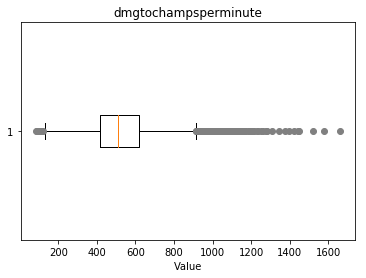

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1154.71, 1284.82, 1160.39, 1161.38, 1162.17, 1163.09, 1166.94, 1424.37, 1171.3, 1305.83, 1442.83, 1279.13, 1188.74, 1189.37, 1445.77, 1576.46, 1065.8, 1066.62, 1195.82, 1196.36, 1068.57, 1070.17, 1198.34, 1069.54, 1074.64, 1074.27, 1204.54, 1076.87, 1208.12, 1085.05, 1342.64, 1215.03, 1089.38, 1100.24, 1101.22, 1100.3, 1230.28, 1105.94, 1106.28, 1107.59, 1108.41, 1109.71, 1109.36, 1238.07, 1116.75, 1118.21, 1120.29, 1377.77, 1123.28, 1253.13, 1129.32, 1259.16, 1132.27, 1133.28, 1518.35, 1396.74, 1145.22, 1146.54, 1148.52, 1661.62, 1151.42}


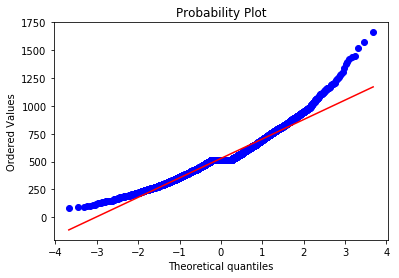

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8552
Kurtosis: 1.9184


   Jungle 
Overview of variable:  dmgtochampsperminute 


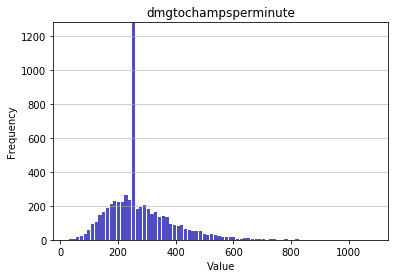

-------------------- 
Summary statistics:
 --------------------
Minimum value: 27.904130545639983
Mean: 275.6512
Standard deviation: 109.7984
Median: 259.0972
Maximal value: 1084.8354143019296


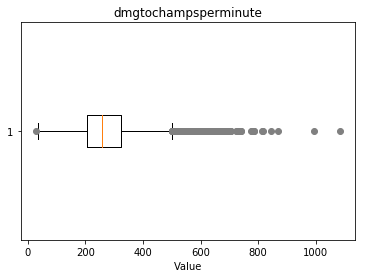

-------------------- 
Outlier detection:
 --------------------
List of outliers: {641.16, 642.6, 644.04, 645.65, 646.16, 773.93, 648.81, 649.12, 647.44, 779.16, 650.72, 653.3, 654.01, 655.53, 784.95, 657.21, 658.99, 785.22, 660.16, 657.09, 660.7, 657.41, 666.64, 668.78, 673.61, 674.6, 679.15, 680.36, 681.84, 685.25, 814.53, 686.15, 685.5, 685.73, 816.74, 695.12, 696.3, 696.47, 695.89, 1084.84, 701.98, 702.06, 648.16, 701.5, 705.74, 845.09, 724.01, 726.69, 729.54, 731.69, 605.74, 606.28, 607.41, 607.28, 993.95, 739.32, 740.29, 613.99, 868.07, 615.07, 616.66, 613.85, 619.03, 619.55, 621.16, 622.24, 622.15, 626.93, 630.1, 633.85, 634.17, 635.99}


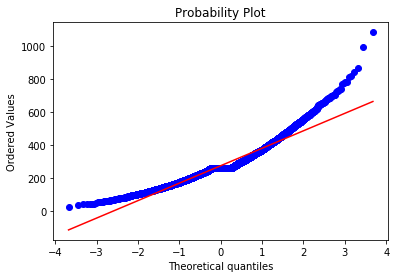

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1704
Kurtosis: 2.6406


   ADC 
Overview of variable:  dmgtochampsperminute 


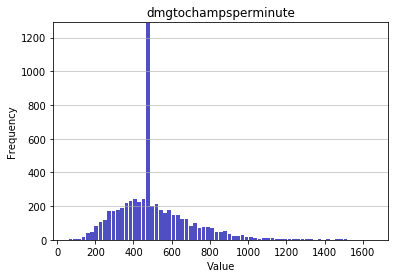

-------------------- 
Summary statistics:
 --------------------
Minimum value: 59.26829268292683
Mean: 504.9639
Standard deviation: 191.6477
Median: 477.4214
Maximal value: 1654.464


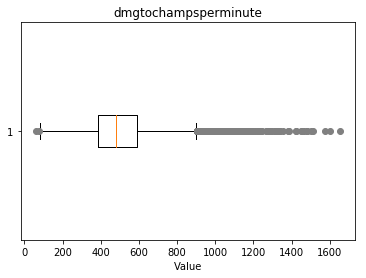

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1282.19, 1155.82, 1161.42, 1289.17, 1291.42, 1292.45, 1422.92, 1425.31, 1171.36, 1174.35, 1175.12, 1174.33, 1178.16, 1308.81, 1313.86, 1316.83, 1190.17, 1575.35, 1448.25, 1322.69, 1197.37, 1455.3, 1331.83, 1333.79, 1205.79, 1080.48, 1081.85, 1338.59, 1466.67, 1084.34, 1088.34, 1217.15, 1603.4, 1479.85, 1480.86, 1096.21, 1098.99, 1099.48, 1227.76, 1098.52, 1223.75, 1354.76, 1103.39, 1105.39, 1104.3, 1236.93, 1238.75, 1112.4, 1113.81, 1114.87, 1243.17, 1500.15, 1121.16, 1123.82, 1379.64, 1124.2, 1123.79, 1127.14, 1384.1, 1513.12, 1133.32, 1133.8, 1135.01, 1134.52, 1137.08, 1137.91, 1265.97, 1140.76, 1141.69, 1654.46, 1270.66, 1273.49, 1147.96, 1276.48, 1151.85}


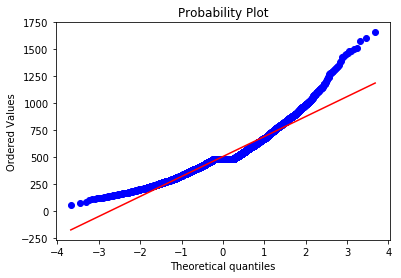

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1737
Kurtosis: 2.7109


   Support 
Overview of variable:  dmgtochampsperminute 


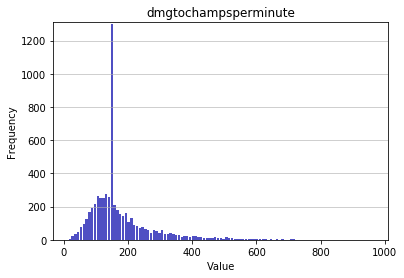

-------------------- 
Summary statistics:
 --------------------
Minimum value: 14.075829383886257
Mean: 173.6875
Standard deviation: 97.5752
Median: 149.6888
Maximal value: 963.9054404145078


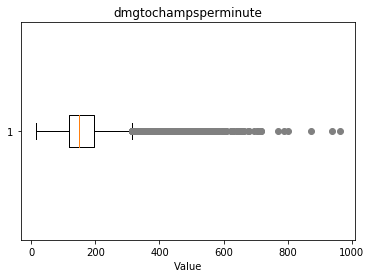

-------------------- 
Outlier detection:
 --------------------
List of outliers: {512.59, 512.08, 509.26, 515.39, 515.64, 512.05, 518.18, 519.4, 520.98, 521.87, 504.8, 518.44, 524.97, 524.69, 526.46, 525.92, 528.66, 528.9, 525.07, 523.32, 534.97, 535.86, 535.93, 514.35, 542.1, 545.25, 546.21, 546.75, 550.24, 552.9, 554.31, 557.09, 559.25, 562.56, 564.54, 566.38, 567.84, 574.96, 575.04, 577.02, 580.96, 582.32, 586.56, 594.99, 595.44, 600.07, 606.59, 607.35, 608.29, 622.12, 623.17, 626.7, 626.22, 627.42, 629.44, 630.27, 637.52, 646.02, 648.87, 649.42, 654.94, 659.72, 664.26, 677.18, 678.94, 695.48, 703.6, 707.38, 715.32, 715.56, 769.43, 787.25, 801.44, 468.39, 468.21, 469.08, 469.49, 507.41, 478.77, 478.84, 871.66, 479.0, 508.44, 480.45, 481.37, 489.1, 937.77, 963.91, 466.71, 466.54, 466.97, 469.74, 470.26, 471.13, 471.56, 473.28, 472.99, 471.81, 470.44, 468.19, 478.72, 478.1, 472.67, 480.53, 482.38, 483.49, 484.63, 485.6, 484.94, 487.89, 488.53, 489.0, 490.49, 491.8, 491.14, 491.73, 493

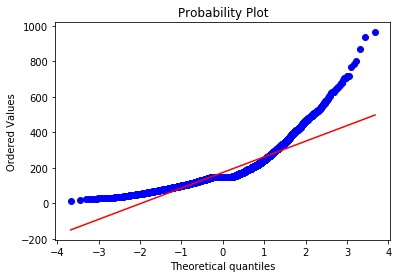

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1108
Kurtosis: 6.5514


   Top 
Overview of variable:  dmgshare 


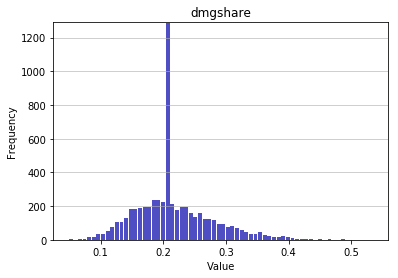

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.04825532090926014
Mean: 0.2162
Standard deviation: 0.0607
Median: 0.2095
Maximal value: 0.5350679287851292


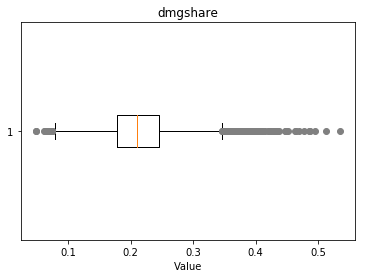

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.4, 0.41, 0.46, 0.43, 0.49, 0.42, 0.48, 0.45, 0.44, 0.54, 0.51, 0.47}


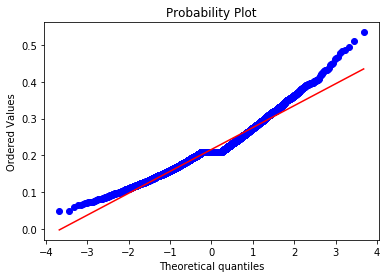

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.73
Kurtosis: 1.14


   Middle 
Overview of variable:  dmgshare 


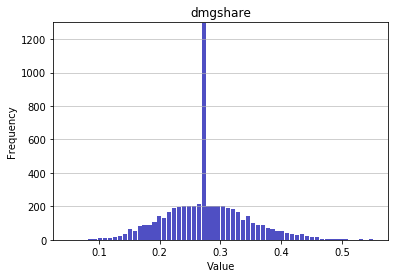

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.049564528899445764
Mean: 0.2772
Standard deviation: 0.0652
Median: 0.2745
Maximal value: 0.5518016419428868


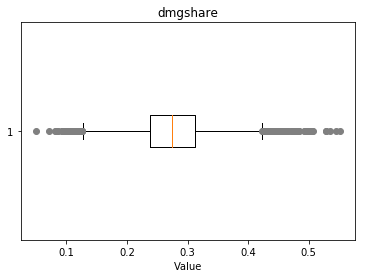

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.48, 0.51, 0.55, 0.49, 0.5, 0.54, 0.07, 0.47, 0.53, 0.05}


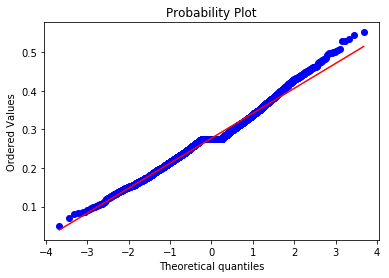

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3237
Kurtosis: 0.6861


   Jungle 
Overview of variable:  dmgshare 


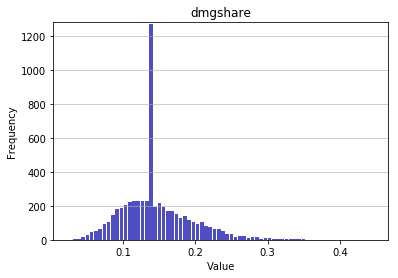

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.024184566428003183
Mean: 0.1452
Standard deviation: 0.0475
Median: 0.1395
Maximal value: 0.44642324771304387


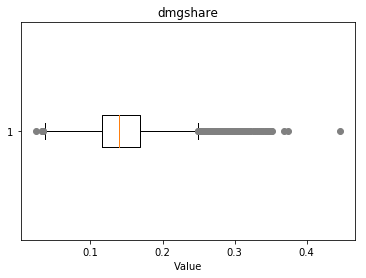

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.31, 0.32, 0.34, 0.29, 0.3, 0.33, 0.37, 0.35, 0.45}


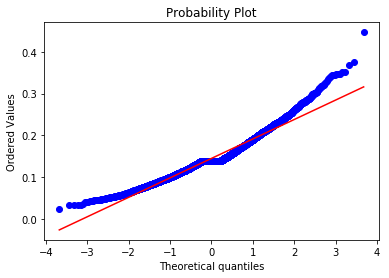

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8436
Kurtosis: 1.4832


   ADC 
Overview of variable:  dmgshare 


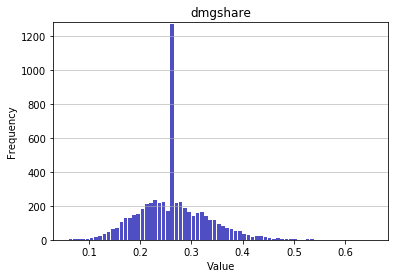

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.05950679056468906
Mean: 0.263
Standard deviation: 0.0663
Median: 0.2589
Maximal value: 0.6553691168525757


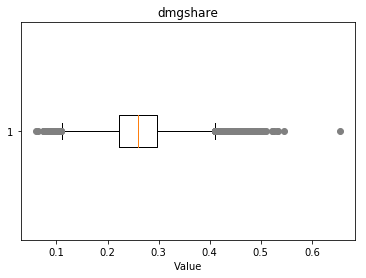

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.47, 0.51, 0.53, 0.5, 0.52, 0.48, 0.49, 0.46, 0.06, 0.55, 0.66}


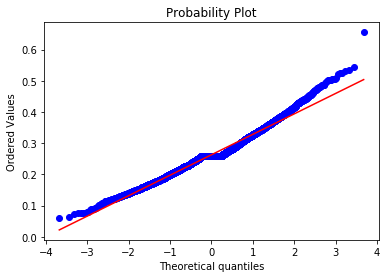

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5111
Kurtosis: 0.9646


   Support 
Overview of variable:  dmgshare 


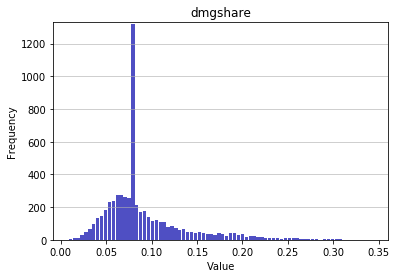

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.008457020822210358
Mean: 0.0915
Standard deviation: 0.0455
Median: 0.08
Maximal value: 0.34394838531603644


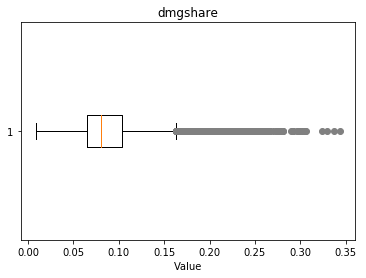

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.23, 0.25, 0.26, 0.24, 0.27, 0.3, 0.28, 0.31, 0.29, 0.34, 0.32, 0.33}


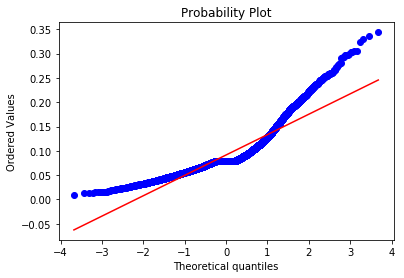

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6473
Kurtosis: 3.1453


   Top 
Overview of variable:  earnedgoldshare 


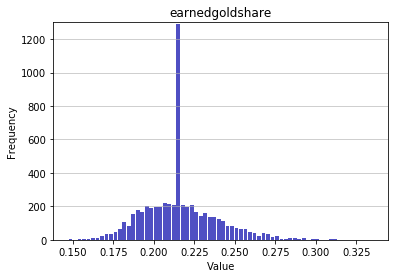

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.14718736372886285
Mean: 0.2161
Standard deviation: 0.0225
Median: 0.2144
Maximal value: 0.3355982347575257


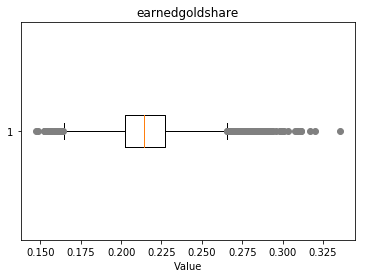

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.29, 0.28, 0.34, 0.3, 0.15, 0.31, 0.32}


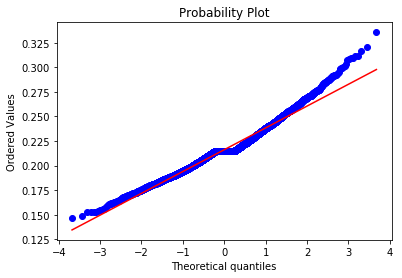

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5926
Kurtosis: 1.0509


   Middle 
Overview of variable:  earnedgoldshare 


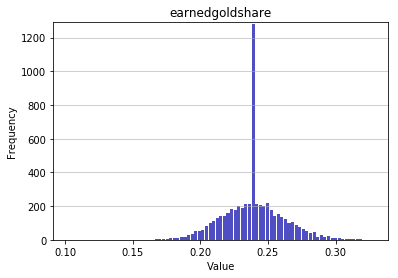

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.10247573814020457
Mean: 0.239
Standard deviation: 0.0217
Median: 0.2387
Maximal value: 0.3278597300805008


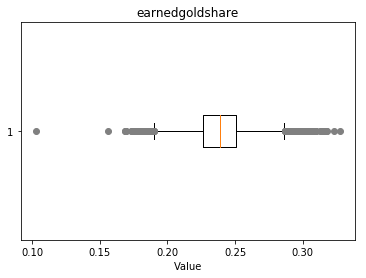

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.32, 0.17, 0.3, 0.31, 0.16, 0.33, 0.1}


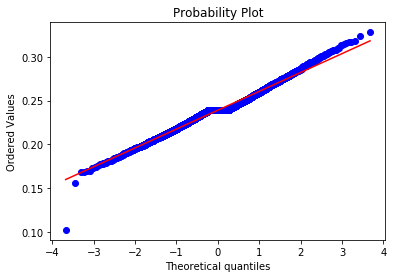

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1201
Kurtosis: 0.8482


   Jungle 
Overview of variable:  earnedgoldshare 


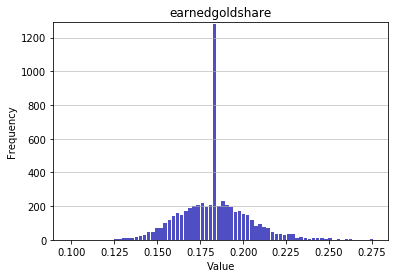

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.09819647563433415
Mean: 0.1831
Standard deviation: 0.0194
Median: 0.1825
Maximal value: 0.275784970724689


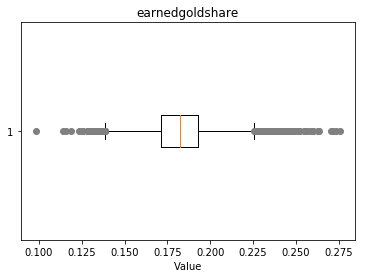

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.25, 0.12, 0.26, 0.11, 0.27, 0.24, 0.28, 0.1}


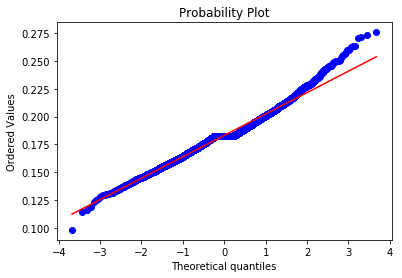

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3866
Kurtosis: 1.1561


   ADC 
Overview of variable:  earnedgoldshare 


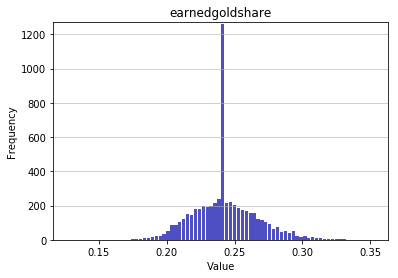

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.1274592042926763
Mean: 0.2431
Standard deviation: 0.0229
Median: 0.2421
Maximal value: 0.35229599104003495


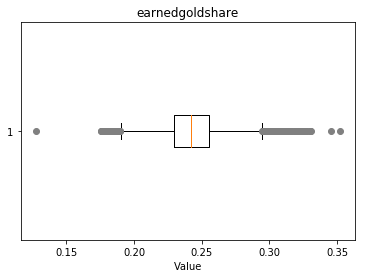

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.32, 0.35, 0.13, 0.31, 0.33}


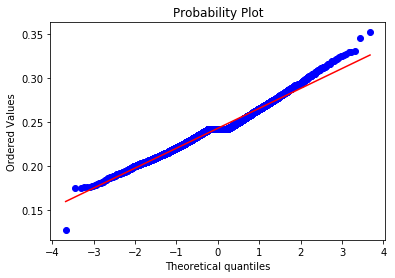

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3643
Kurtosis: 0.799


   Support 
Overview of variable:  earnedgoldshare 


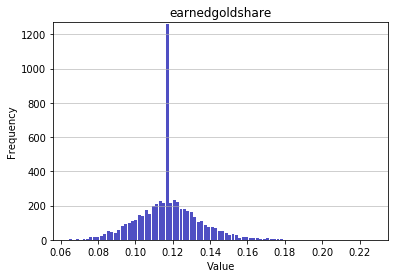

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06413368066586188
Mean: 0.1178
Standard deviation: 0.0162
Median: 0.1175
Maximal value: 0.22738458086351654


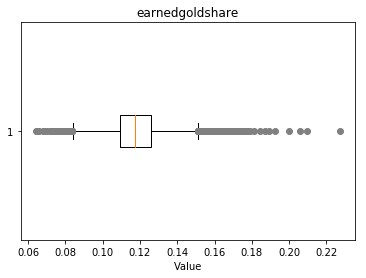

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.07, 0.18, 0.17, 0.06, 0.19, 0.23, 0.21, 0.2}


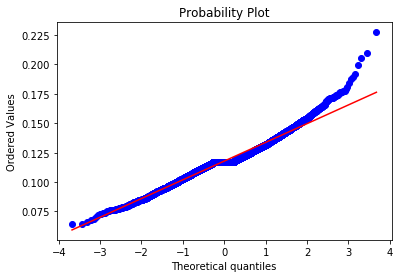

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4374
Kurtosis: 1.7384


   Top 
Overview of variable:  wards 


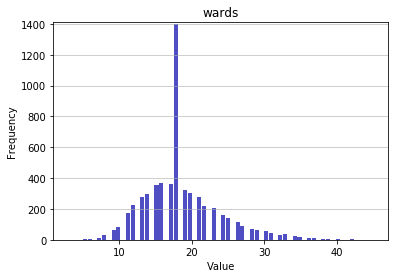

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3.0
Mean: 18.5967
Standard deviation: 5.2051
Median: 18.0
Maximal value: 45.0


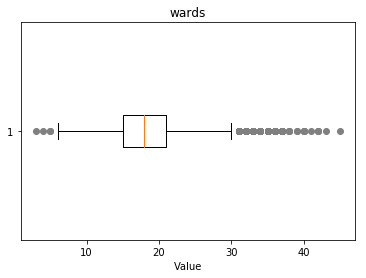

-------------------- 
Outlier detection:
 --------------------
List of outliers: {35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 45.0}


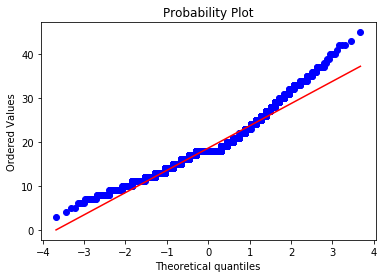

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8624
Kurtosis: 1.4041


   Middle 
Overview of variable:  wards 


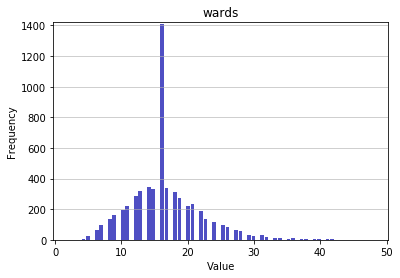

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 16.5311
Standard deviation: 5.3361
Median: 16.0
Maximal value: 48.0


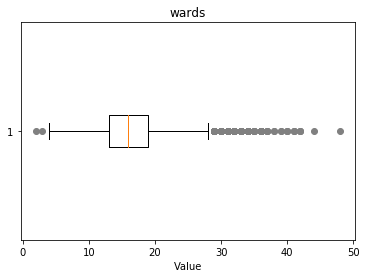

-------------------- 
Outlier detection:
 --------------------
List of outliers: {33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 44.0, 48.0}


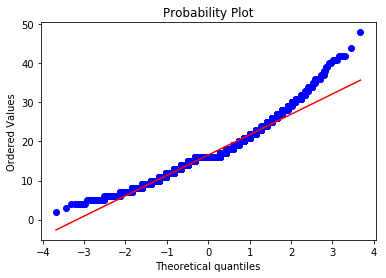

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7728
Kurtosis: 1.6815


   Jungle 
Overview of variable:  wards 


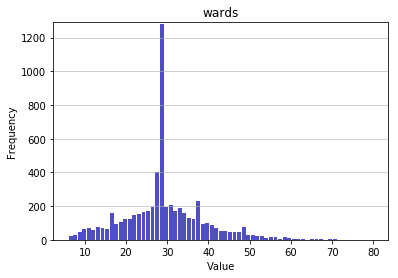

-------------------- 
Summary statistics:
 --------------------
Minimum value: 6.0
Mean: 29.2811
Standard deviation: 9.7385
Median: 29.0
Maximal value: 80.0


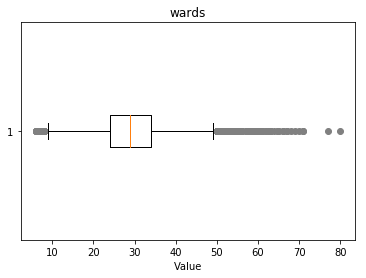

-------------------- 
Outlier detection:
 --------------------
List of outliers: {64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 77.0, 80.0, 59.0, 60.0, 61.0, 62.0, 63.0}


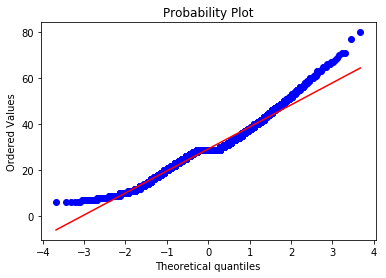

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4871
Kurtosis: 1.1677


   ADC 
Overview of variable:  wards 


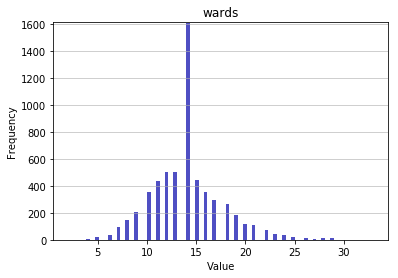

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 14.084
Standard deviation: 3.6588
Median: 14.0
Maximal value: 33.0


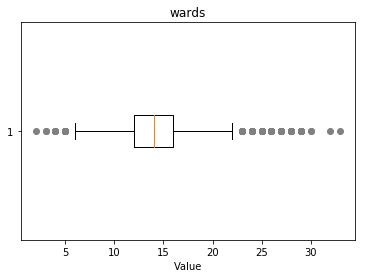

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 2.0, 3.0, 26.0, 27.0, 28.0, 29.0, 30.0}


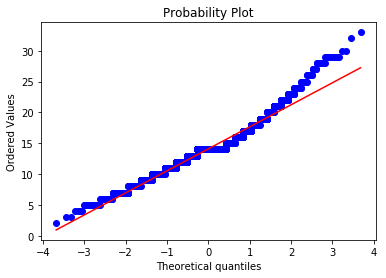

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6943
Kurtosis: 1.5732


   Support 
Overview of variable:  wards 


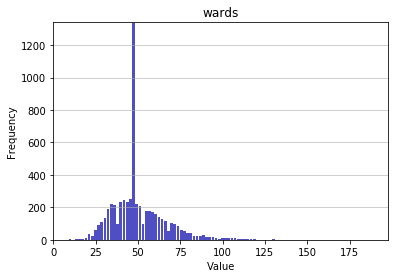

-------------------- 
Summary statistics:
 --------------------
Minimum value: 9.0
Mean: 50.6889
Standard deviation: 16.1779
Median: 48.0
Maximal value: 189.0


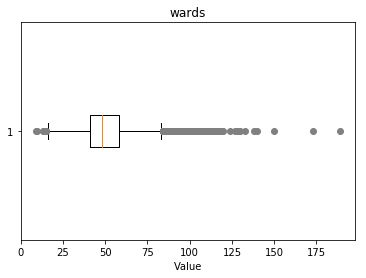

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 133.0, 138.0, 140.0, 150.0, 173.0, 189.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 124.0, 127.0}


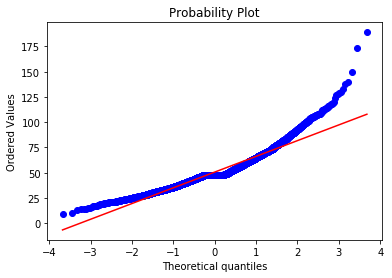

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2588
Kurtosis: 3.6115


   Top 
Overview of variable:  wpm 


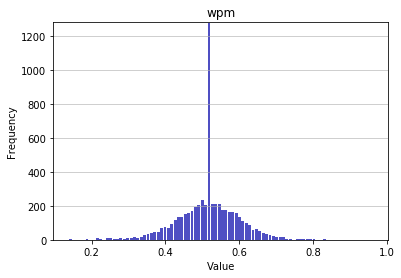

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.13690815744438106
Mean: 0.5159
Standard deviation: 0.0799
Median: 0.5169
Maximal value: 0.9633718013045659


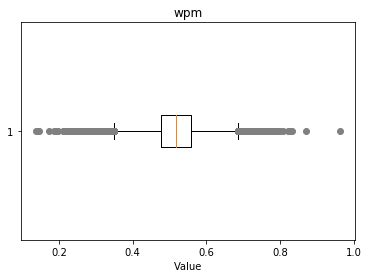

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.79, 0.26, 0.81, 0.2, 0.83, 0.76, 0.77, 0.96, 0.82, 0.25, 0.27, 0.19, 0.78, 0.28, 0.87, 0.21, 0.22, 0.23, 0.17, 0.8, 0.14, 0.24}


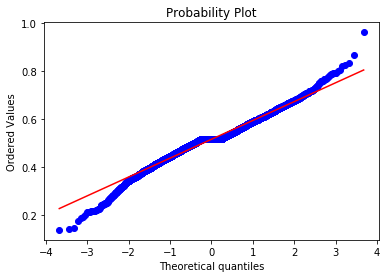

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.2093
Kurtosis: 1.6801


   Middle 
Overview of variable:  wpm 


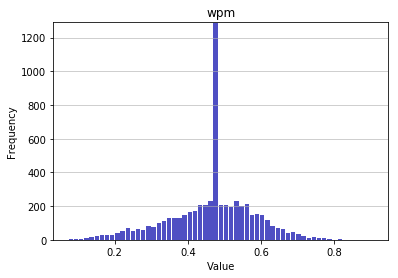

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.07293354943273907
Mean: 0.4652
Standard deviation: 0.1156
Median: 0.473
Maximal value: 0.9080717488789237


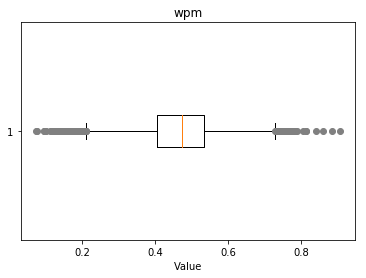

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.1, 0.12, 0.11, 0.08, 0.89, 0.86, 0.91, 0.84, 0.82, 0.81, 0.07}


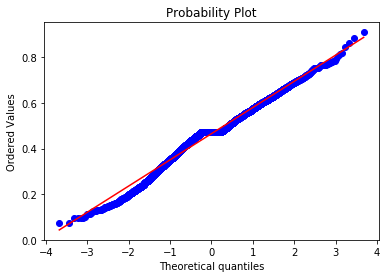

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.3427
Kurtosis: 0.481


   Jungle 
Overview of variable:  wpm 


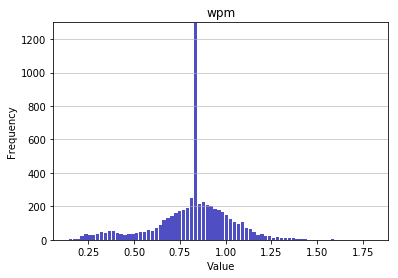

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.14084507042253522
Mean: 0.8173
Standard deviation: 0.2075
Median: 0.8354
Maximal value: 1.806322127446061


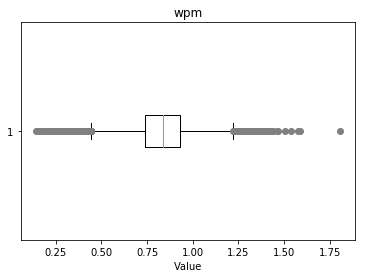

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.18, 1.5, 0.19, 1.81, 1.54, 1.58, 1.47, 0.17, 1.46, 1.57, 0.15, 0.14}


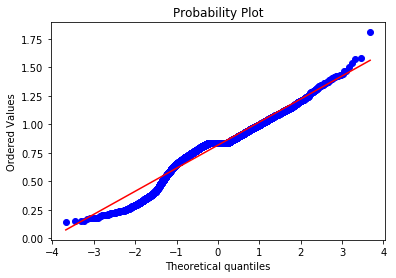

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.5687
Kurtosis: 1.1451


   ADC 
Overview of variable:  wpm 


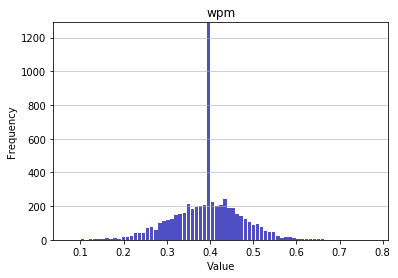

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.07220216606498195
Mean: 0.3941
Standard deviation: 0.0759
Median: 0.3961
Maximal value: 0.7783018867924528


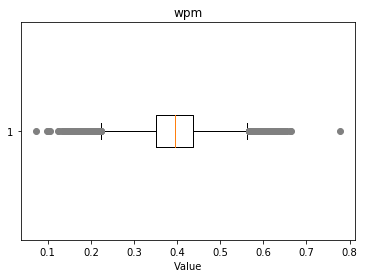

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.16, 0.64, 0.12, 0.15, 0.63, 0.62, 0.17, 0.65, 0.66, 0.14, 0.13, 0.11, 0.07, 0.78, 0.1}


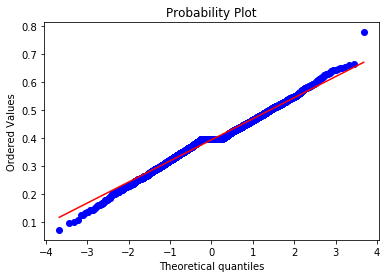

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0923
Kurtosis: 0.8188


   Support 
Overview of variable:  wpm 


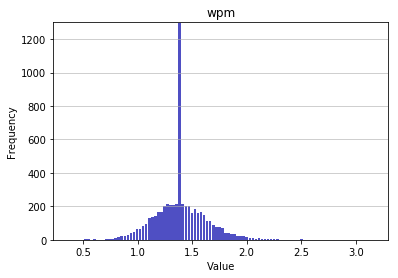

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.3665241295051924
Mean: 1.396
Standard deviation: 0.2354
Median: 1.3863
Maximal value: 3.161063723030607


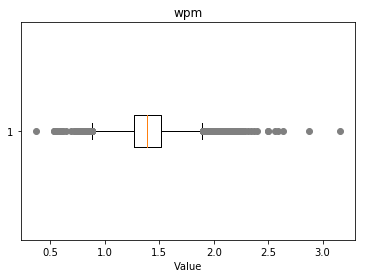

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.53, 0.59, 2.11, 2.24, 2.18, 2.21, 2.23, 2.5, 3.16, 2.27, 2.22, 2.35, 2.59, 2.17, 2.26, 2.16, 0.6, 0.69, 0.61, 2.1, 0.37, 0.54, 2.63, 2.88, 2.37, 2.12, 2.29, 2.13, 0.55, 0.64, 0.56, 2.15, 2.57, 2.14, 2.31, 2.4}


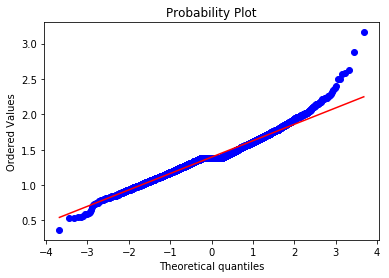

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4648
Kurtosis: 2.0846


   Top 
Overview of variable:  wardshare 


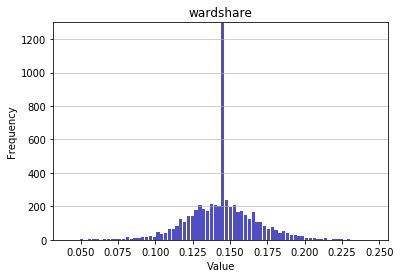

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.041666666666666664
Mean: 0.1447
Standard deviation: 0.0222
Median: 0.1443
Maximal value: 0.24603174603174602


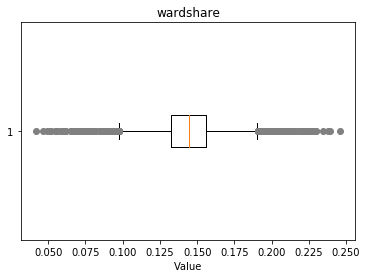

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.23, 0.07, 0.22, 0.08, 0.06, 0.21, 0.24, 0.05, 0.25, 0.04}


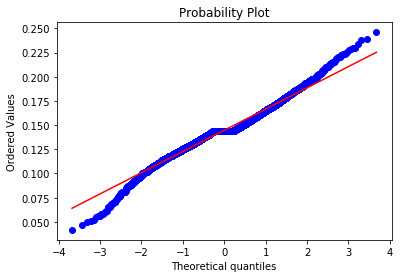

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0548
Kurtosis: 1.6264


   Middle 
Overview of variable:  wardshare 


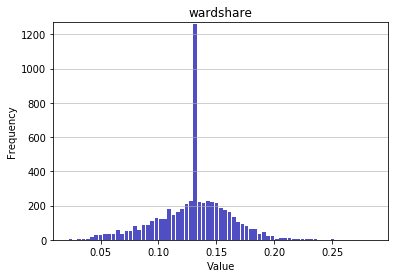

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.022222222222222223
Mean: 0.1303
Standard deviation: 0.0313
Median: 0.1325
Maximal value: 0.2857142857142857


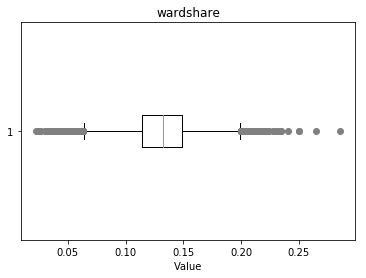

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.03, 0.26, 0.23, 0.25, 0.22, 0.24, 0.29, 0.04, 0.02}


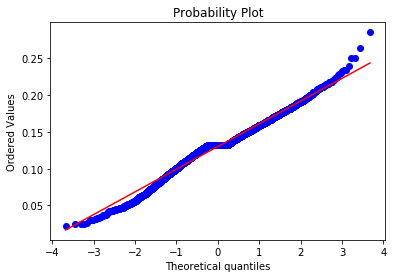

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.2986
Kurtosis: 0.8236


   Jungle 
Overview of variable:  wardshare 


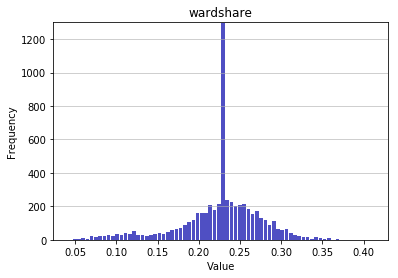

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.04184100418410042
Mean: 0.2265
Standard deviation: 0.0494
Median: 0.2317
Maximal value: 0.4117647058823529


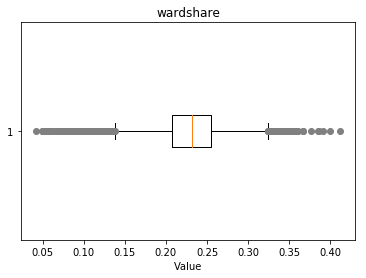

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.39, 0.38, 0.08, 0.07, 0.06, 0.05, 0.41, 0.4, 0.04}


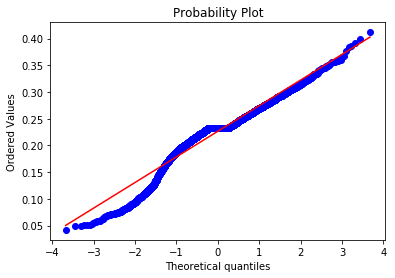

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.7914
Kurtosis: 1.4654


   ADC 
Overview of variable:  wardshare 


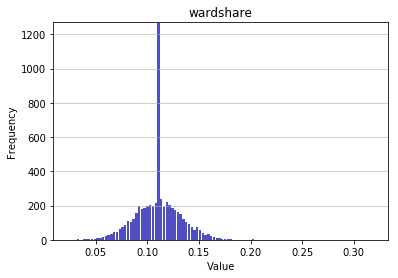

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.023529411764705882
Mean: 0.1105
Standard deviation: 0.0215
Median: 0.1104
Maximal value: 0.3188405797101449


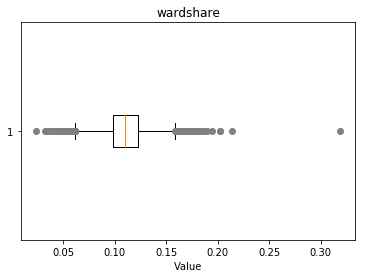

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.21, 0.2, 0.18, 0.05, 0.03, 0.19, 0.32, 0.04, 0.02}


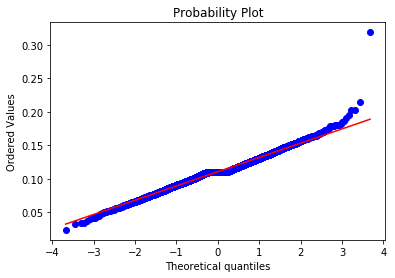

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2349
Kurtosis: 2.1434


   Support 
Overview of variable:  wardshare 


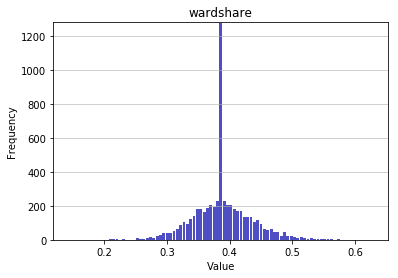

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.14285714285714285
Mean: 0.3892
Standard deviation: 0.0466
Median: 0.3879
Maximal value: 0.6293103448275862


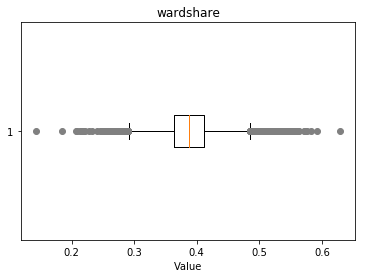

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.53, 0.55, 0.56, 0.57, 0.21, 0.54, 0.23, 0.22, 0.19, 0.59, 0.25, 0.63, 0.24, 0.58, 0.14}


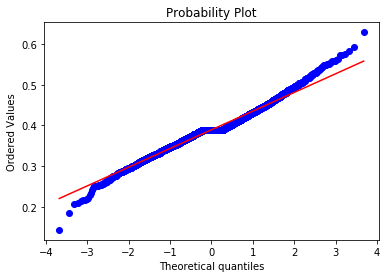

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2264
Kurtosis: 1.39


   Top 
Overview of variable:  wardkills 


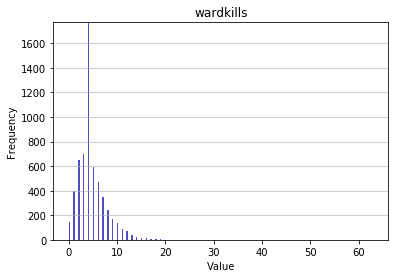

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.7064
Standard deviation: 3.1575
Median: 4.0
Maximal value: 63.0


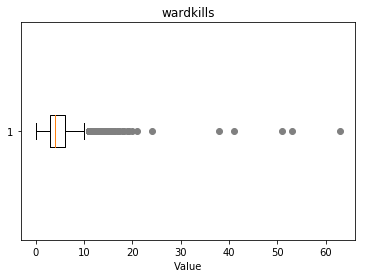

-------------------- 
Outlier detection:
 --------------------
List of outliers: {38.0, 41.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 51.0, 53.0, 21.0, 24.0, 63.0}


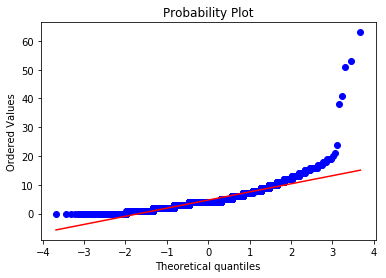

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.6568
Kurtosis: 42.8978


   Middle 
Overview of variable:  wardkills 


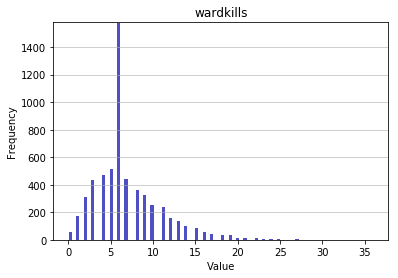

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.0081
Standard deviation: 4.0964
Median: 6.0
Maximal value: 36.0


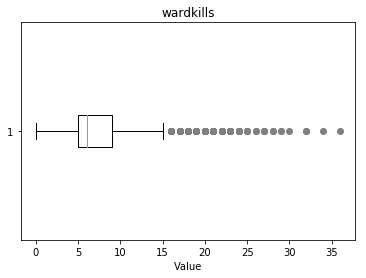

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 34.0, 36.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0}


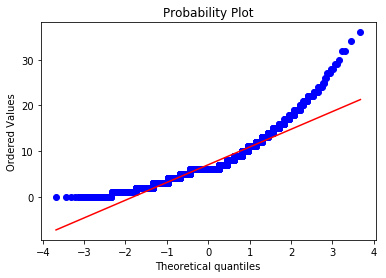

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4386
Kurtosis: 3.5533


   Jungle 
Overview of variable:  wardkills 


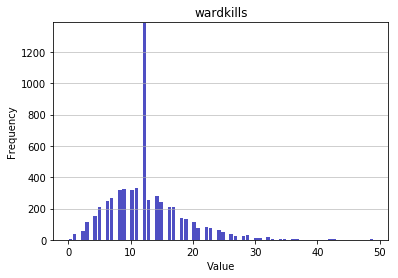

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.4318
Standard deviation: 5.9103
Median: 12.0
Maximal value: 49.0


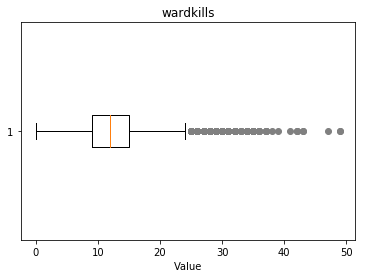

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 41.0, 42.0, 43.0, 47.0, 49.0, 31.0}


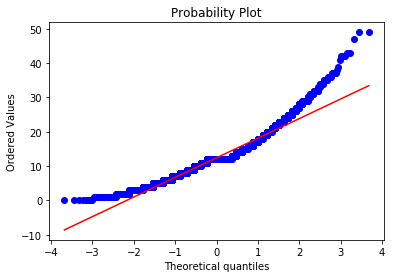

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0921
Kurtosis: 2.5035


   ADC 
Overview of variable:  wardkills 


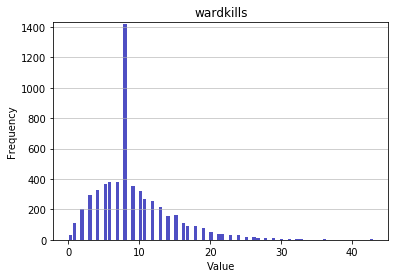

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 9.167
Standard deviation: 5.2902
Median: 8.0
Maximal value: 43.0


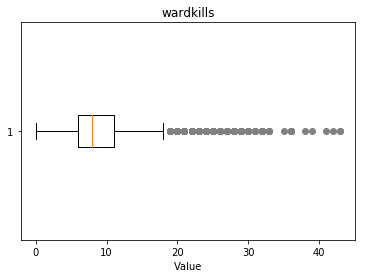

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 35.0, 36.0, 38.0, 39.0, 41.0, 42.0, 43.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


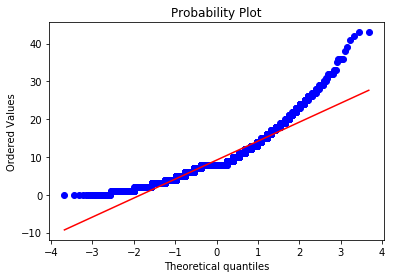

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4079
Kurtosis: 3.3653


   Support 
Overview of variable:  wardkills 


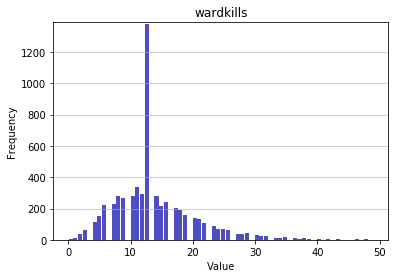

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 13.863
Standard deviation: 6.4286
Median: 13.0
Maximal value: 49.0


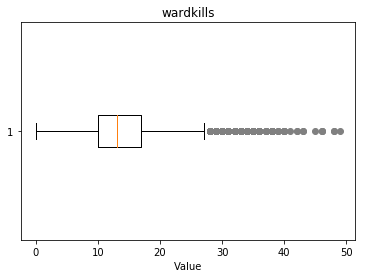

-------------------- 
Outlier detection:
 --------------------
List of outliers: {34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 45.0, 46.0, 48.0, 49.0}


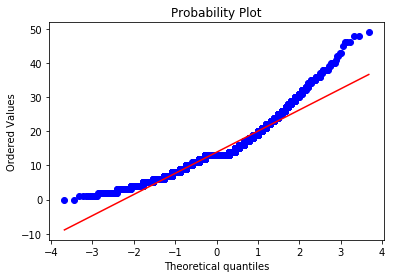

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1381
Kurtosis: 2.245


   Top 
Overview of variable:  wcpm 


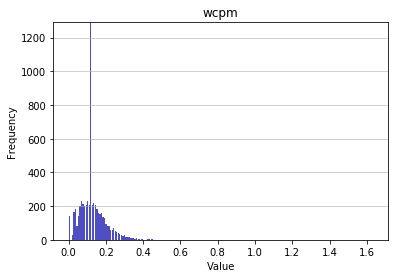

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.13
Standard deviation: 0.0775
Median: 0.1215
Maximal value: 1.633742658836092


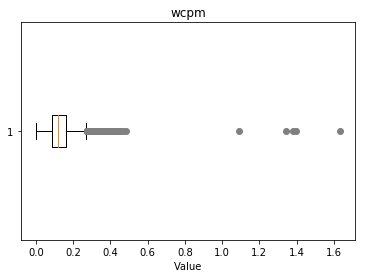

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.45, 0.48, 0.37, 0.43, 0.38, 0.42, 0.4, 0.39, 0.47, 0.36, 1.34, 1.63, 1.38, 1.4, 0.44, 0.41, 1.09}


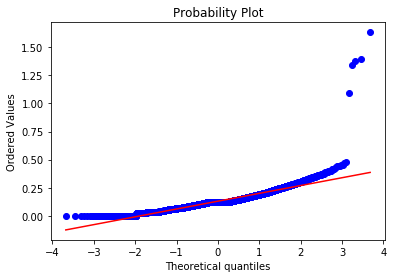

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.2916
Kurtosis: 61.8521


   Middle 
Overview of variable:  wcpm 


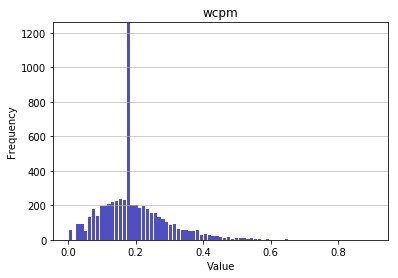

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1939
Standard deviation: 0.0973
Median: 0.1822
Maximal value: 0.9045226130653267


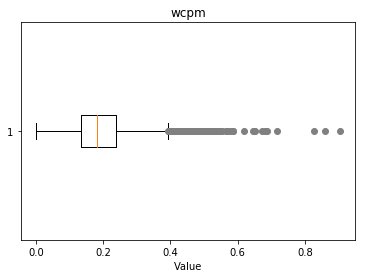

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.51, 0.52, 0.54, 0.59, 0.53, 0.67, 0.62, 0.72, 0.68, 0.57, 0.5, 0.83, 0.65, 0.9, 0.86, 0.69, 0.49, 0.55, 0.58}


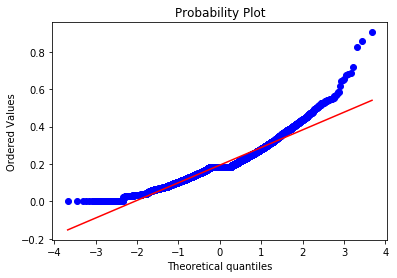

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.076
Kurtosis: 2.6592


   Jungle 
Overview of variable:  wcpm 


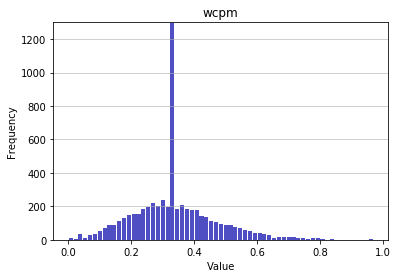

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3375
Standard deviation: 0.131
Median: 0.3268
Maximal value: 0.9699769053117783


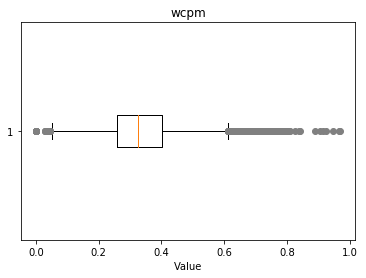

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.78, 0.74, 0.76, 0.79, 0.75, 0.95, 0.77, 0.8, 0.91, 0.84, 0.73, 0.81, 0.92, 0.83, 0.97, 0.93, 0.89}


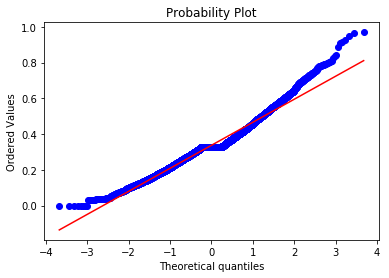

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6278
Kurtosis: 1.1445


   ADC 
Overview of variable:  wcpm 


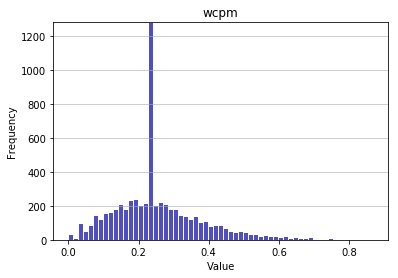

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.251
Standard deviation: 0.1189
Median: 0.2395
Maximal value: 0.868979454361738


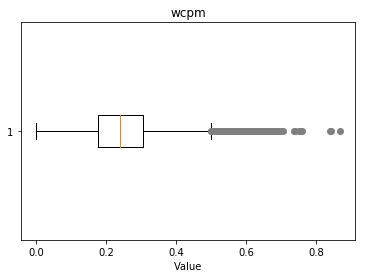

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.65, 0.61, 0.67, 0.64, 0.68, 0.62, 0.84, 0.7, 0.66, 0.71, 0.69, 0.63, 0.75, 0.76, 0.74, 0.87}


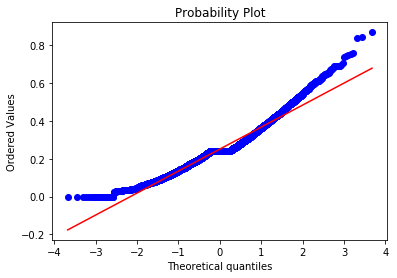

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8004
Kurtosis: 1.2349


   Support 
Overview of variable:  wcpm 


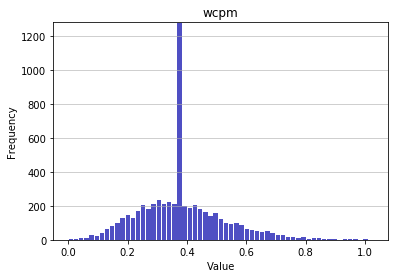

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3803
Standard deviation: 0.1431
Median: 0.3675
Maximal value: 1.0283159463487332


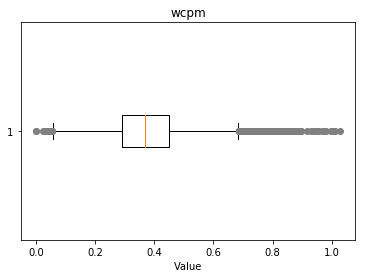

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.95, 0.82, 0.89, 0.98, 1.0, 0.97, 0.94, 1.03, 0.84, 0.83, 1.01, 0.85, 0.86, 0.88, 0.81, 0.9, 0.92, 0.87, 0.93}


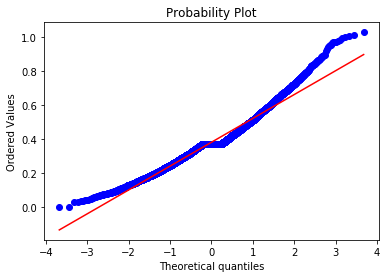

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7076
Kurtosis: 1.1954


   Top 
Overview of variable:  visionwards 


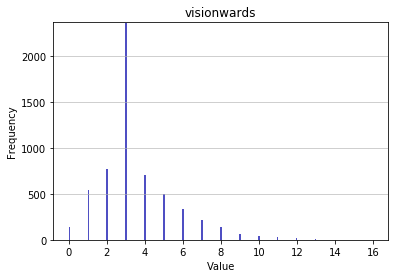

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.5496
Standard deviation: 2.0409
Median: 3.0
Maximal value: 16.0


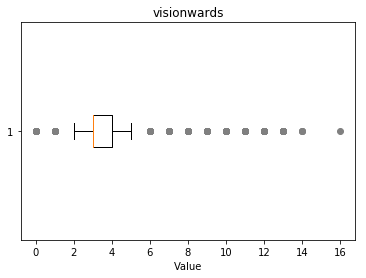

-------------------- 
Outlier detection:
 --------------------
List of outliers: {10.0, 11.0, 12.0, 13.0, 14.0, 16.0}


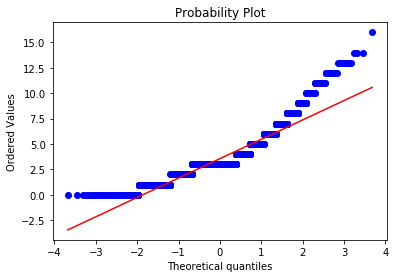

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3731
Kurtosis: 2.9658


   Middle 
Overview of variable:  visionwards 


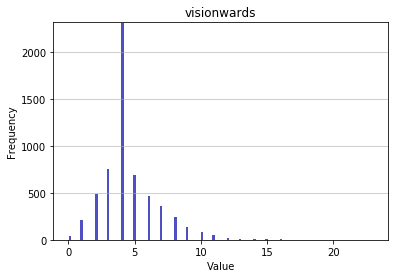

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.549
Standard deviation: 2.1492
Median: 4.0
Maximal value: 23.0


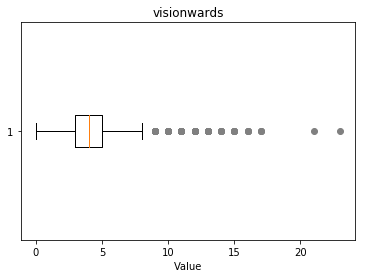

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 21.0, 23.0}


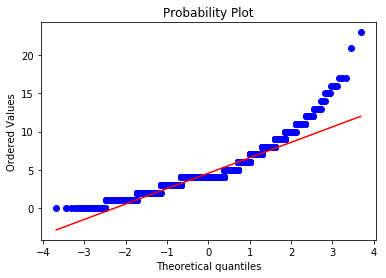

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.38
Kurtosis: 4.1549


   Jungle 
Overview of variable:  visionwards 


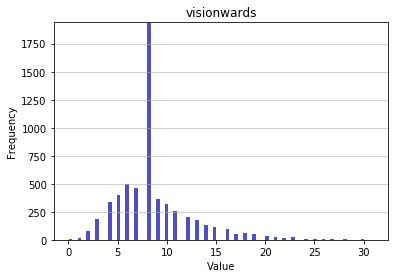

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 8.6699
Standard deviation: 3.9753
Median: 8.0
Maximal value: 31.0


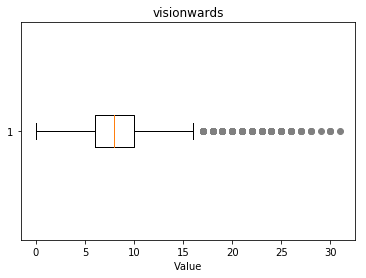

-------------------- 
Outlier detection:
 --------------------
List of outliers: {21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


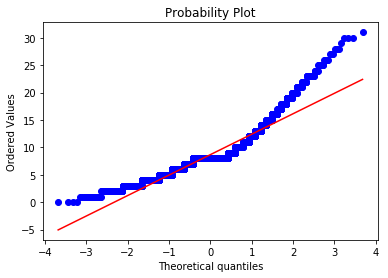

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4348
Kurtosis: 3.1738


   ADC 
Overview of variable:  visionwards 


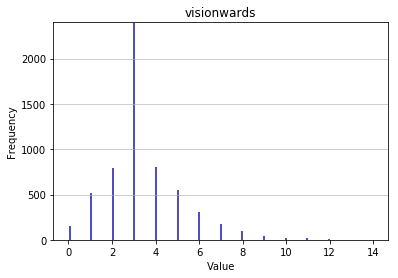

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.4024
Standard deviation: 1.7989
Median: 3.0
Maximal value: 14.0


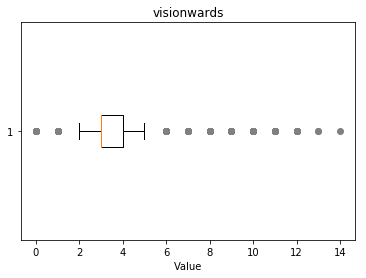

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 12.0, 13.0, 14.0}


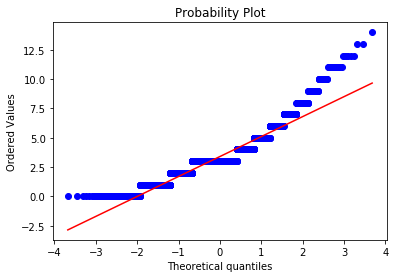

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1394
Kurtosis: 2.5698


   Support 
Overview of variable:  visionwards 


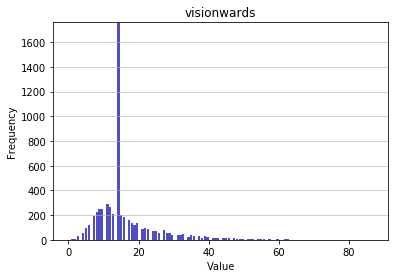

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 16.4664
Standard deviation: 9.4045
Median: 14.0
Maximal value: 87.0


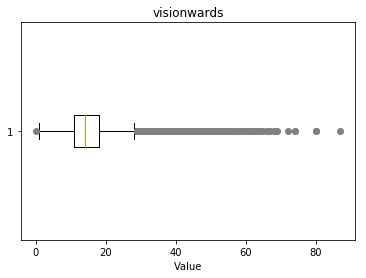

-------------------- 
Outlier detection:
 --------------------
List of outliers: {45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 72.0, 74.0, 80.0, 87.0}


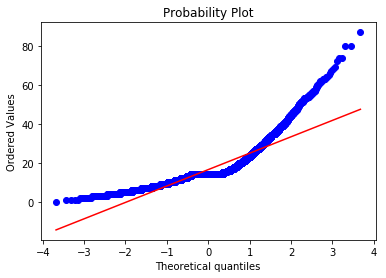

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0988
Kurtosis: 6.0776


   Top 
Overview of variable:  visionwardbuys 


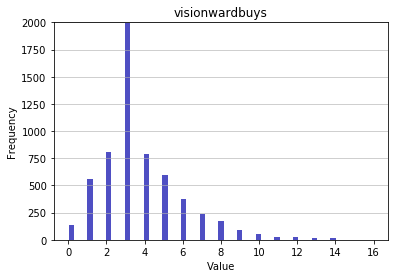

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.713
Standard deviation: 2.2021
Median: 3.0
Maximal value: 16.0


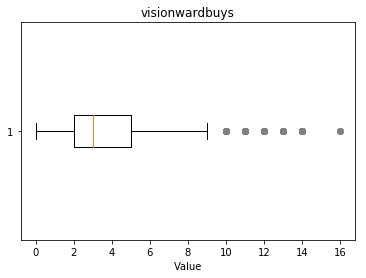

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.0, 12.0, 13.0, 14.0, 16.0}


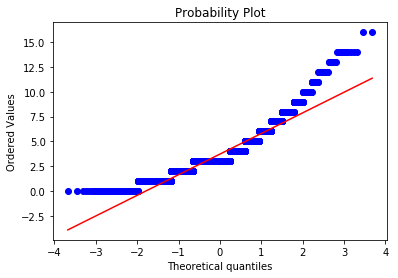

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3096
Kurtosis: 2.6336


   Middle 
Overview of variable:  visionwardbuys 


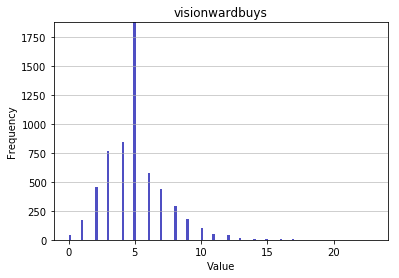

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.9888
Standard deviation: 2.2769
Median: 5.0
Maximal value: 23.0


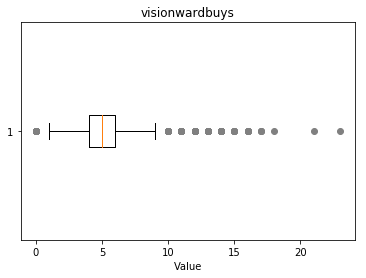

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 21.0, 23.0}


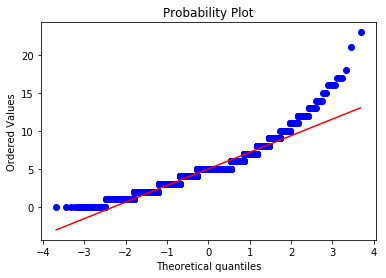

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0783
Kurtosis: 3.1675


   Jungle 
Overview of variable:  visionwardbuys 


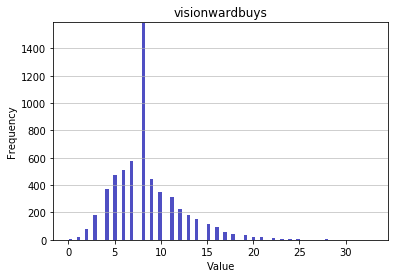

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 8.4708
Standard deviation: 3.7139
Median: 8.0
Maximal value: 33.0


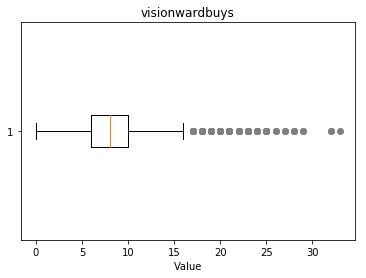

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0}


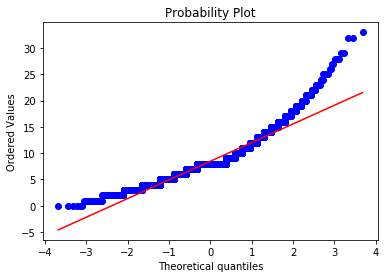

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2764
Kurtosis: 3.2135


   ADC 
Overview of variable:  visionwardbuys 


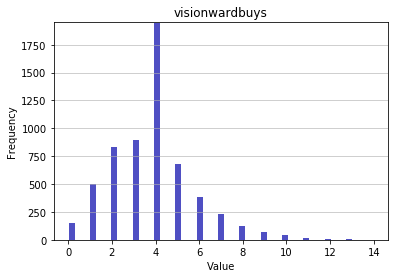

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.8096
Standard deviation: 1.9646
Median: 4.0
Maximal value: 14.0


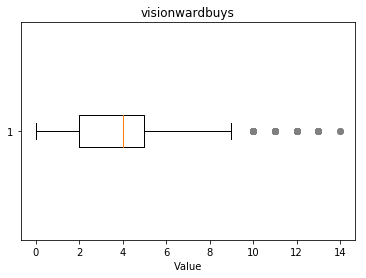

-------------------- 
Outlier detection:
 --------------------
List of outliers: {10.0, 11.0, 12.0, 13.0, 14.0}


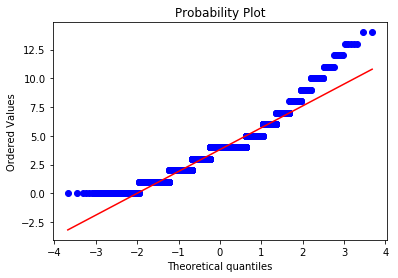

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.813
Kurtosis: 1.7468


   Support 
Overview of variable:  visionwardbuys 


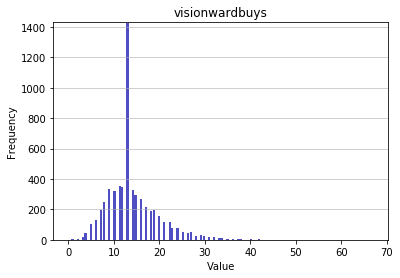

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 14.1348
Standard deviation: 5.7489
Median: 13.0
Maximal value: 67.0


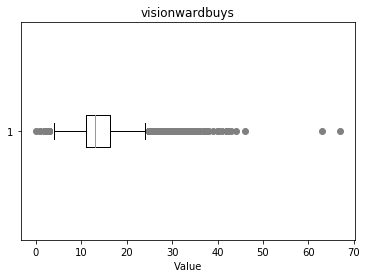

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 67.0, 40.0, 41.0, 42.0, 39.0, 44.0, 43.0, 46.0, 63.0}


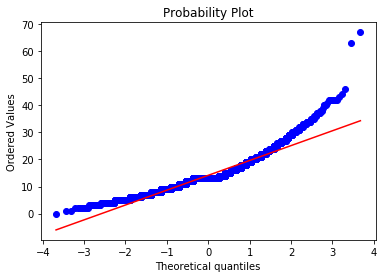

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3933
Kurtosis: 4.3552


   Top 
Overview of variable:  totalgold 


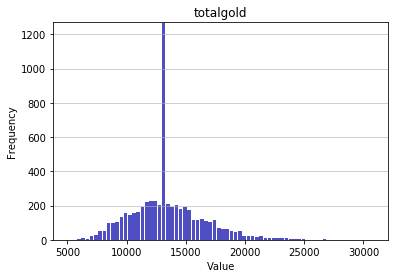

-------------------- 
Summary statistics:
 --------------------
Minimum value: 5080.0
Mean: 13429.8973
Standard deviation: 2986.5543
Median: 13201.5
Maximal value: 30841.0


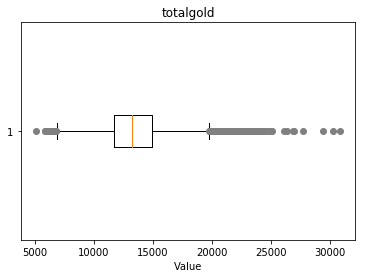

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23682.0, 23685.0, 23173.0, 22918.0, 23430.0, 24457.0, 24838.0, 24069.0, 23821.0, 30224.0, 22801.0, 24216.0, 26905.0, 23193.0, 30841.0, 22566.0, 23338.0, 25004.0, 22703.0, 23857.0, 29367.0, 25018.0, 23103.0, 22469.0, 24920.0, 27737.0, 23131.0, 23132.0, 23517.0, 22621.0, 24697.0, 22754.0, 26852.0, 24293.0, 26087.0, 23145.0, 23530.0, 23020.0, 22892.0, 22896.0, 23026.0, 26355.0, 23539.0, 23543.0, 23928.0, 25081.0, 22908.0}


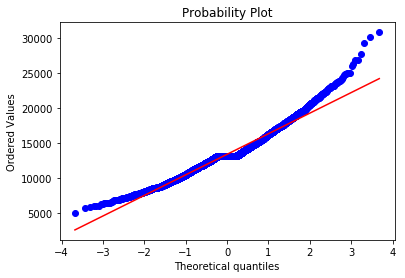

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6823
Kurtosis: 1.3791


   Middle 
Overview of variable:  totalgold 


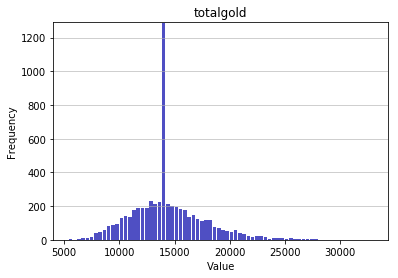

-------------------- 
Summary statistics:
 --------------------
Minimum value: 5386.0
Mean: 14352.3656
Standard deviation: 3235.383
Median: 14083.0
Maximal value: 33005.0


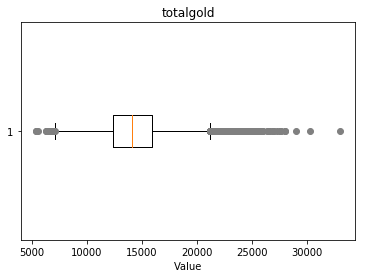

-------------------- 
Outlier detection:
 --------------------
List of outliers: {25088.0, 24705.0, 25604.0, 24197.0, 27528.0, 24594.0, 24595.0, 25726.0, 24603.0, 25372.0, 24351.0, 25888.0, 25378.0, 26532.0, 24102.0, 27303.0, 24366.0, 24241.0, 24371.0, 25139.0, 28979.0, 25526.0, 27959.0, 24117.0, 26553.0, 24761.0, 25403.0, 26878.0, 25151.0, 24384.0, 30276.0, 24650.0, 24140.0, 24396.0, 25167.0, 24785.0, 26451.0, 26323.0, 26963.0, 24407.0, 24536.0, 27992.0, 24666.0, 24314.0, 25436.0, 25952.0, 25058.0, 24291.0, 24932.0, 25444.0, 24550.0, 25578.0, 25964.0, 33005.0, 26863.0, 24559.0, 27632.0, 27507.0, 25588.0, 24952.0, 24058.0, 25342.0}


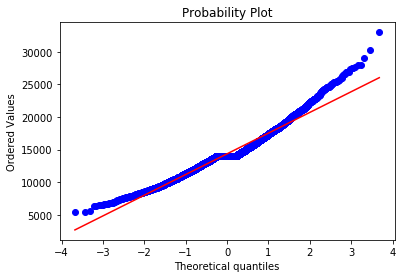

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6907
Kurtosis: 1.3184


   Jungle 
Overview of variable:  totalgold 


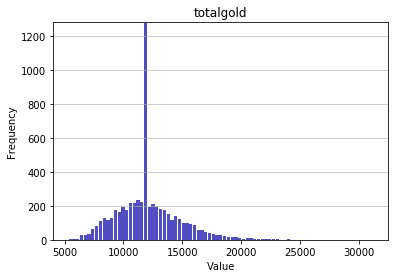

-------------------- 
Summary statistics:
 --------------------
Minimum value: 5313.0
Mean: 12090.299
Standard deviation: 2672.2424
Median: 11858.5
Maximal value: 31258.0


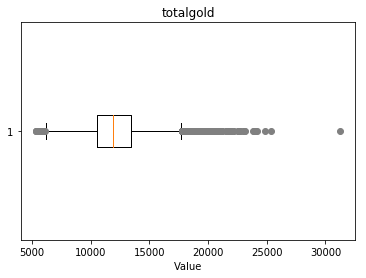

-------------------- 
Outlier detection:
 --------------------
List of outliers: {21632.0, 24193.0, 21890.0, 23940.0, 21769.0, 20490.0, 21515.0, 22030.0, 21519.0, 22545.0, 20882.0, 22167.0, 31258.0, 20895.0, 20256.0, 20129.0, 22562.0, 21798.0, 22694.0, 21161.0, 20523.0, 20783.0, 23088.0, 21811.0, 21044.0, 23990.0, 23863.0, 20665.0, 20793.0, 20412.0, 20937.0, 22986.0, 21199.0, 20178.0, 20565.0, 20823.0, 20954.0, 22621.0, 20701.0, 21857.0, 20833.0, 20601.0, 20474.0, 20966.0, 20710.0, 25321.0, 20588.0, 23150.0, 24817.0, 21109.0, 22645.0, 21113.0, 20986.0, 20603.0}


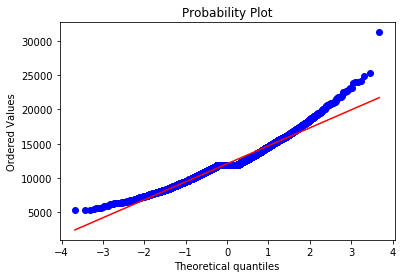

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7471
Kurtosis: 1.6331


   ADC 
Overview of variable:  totalgold 


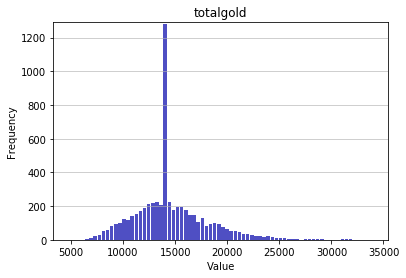

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4752.0
Mean: 14565.2093
Standard deviation: 3493.7607
Median: 14231.5
Maximal value: 34025.0


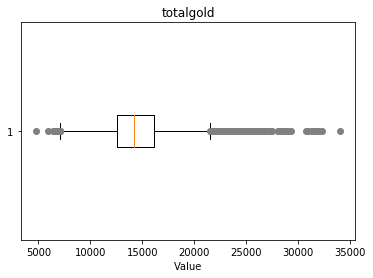

-------------------- 
Outlier detection:
 --------------------
List of outliers: {26496.0, 25476.0, 26122.0, 25101.0, 26125.0, 32015.0, 30864.0, 28051.0, 28054.0, 25240.0, 28696.0, 28316.0, 25629.0, 25375.0, 25250.0, 25891.0, 30760.0, 25259.0, 25387.0, 28205.0, 25900.0, 27441.0, 25396.0, 31796.0, 26174.0, 28224.0, 28488.0, 29257.0, 31563.0, 25676.0, 25679.0, 26836.0, 28247.0, 25176.0, 26202.0, 25051.0, 27105.0, 28898.0, 25443.0, 28644.0, 26593.0, 30951.0, 34025.0, 31338.0, 25324.0, 26096.0, 25712.0, 25844.0, 31348.0, 32248.0, 26747.0, 29052.0, 26237.0, 27390.0}


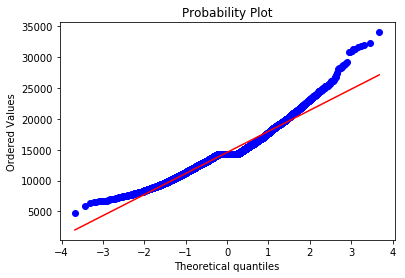

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8204
Kurtosis: 1.7292


   Support 
Overview of variable:  totalgold 


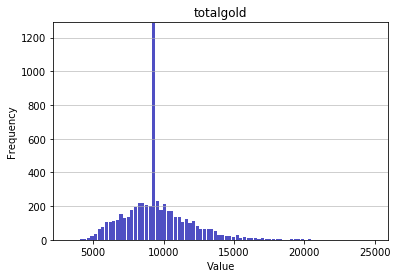

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3243.0
Mean: 9522.9106
Standard deviation: 2276.9285
Median: 9333.0
Maximal value: 24902.0


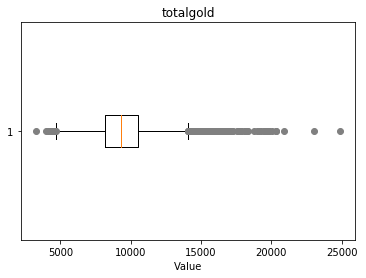

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16897.0, 16770.0, 19458.0, 17158.0, 17670.0, 16518.0, 18185.0, 16905.0, 16396.0, 16909.0, 17038.0, 18193.0, 19730.0, 17043.0, 20371.0, 19864.0, 23065.0, 16539.0, 19612.0, 16541.0, 20892.0, 16797.0, 17312.0, 17824.0, 19871.0, 16679.0, 16935.0, 17703.0, 16555.0, 16556.0, 18224.0, 18353.0, 16439.0, 17592.0, 18748.0, 20029.0, 16577.0, 17859.0, 19652.0, 24902.0, 16841.0, 16969.0, 19020.0, 19158.0, 17239.0, 19287.0, 20315.0, 17628.0, 16604.0, 16479.0, 17760.0, 17121.0, 17764.0, 16612.0, 17126.0, 18282.0, 17006.0, 17776.0, 18036.0, 17143.0, 16635.0, 16637.0, 17022.0}


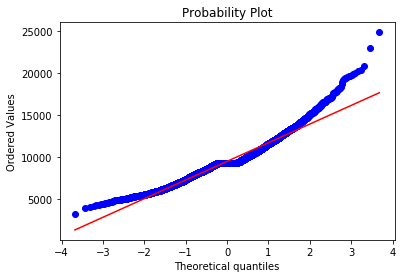

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8751
Kurtosis: 2.0587


   Top 
Overview of variable:  earnedgpm 


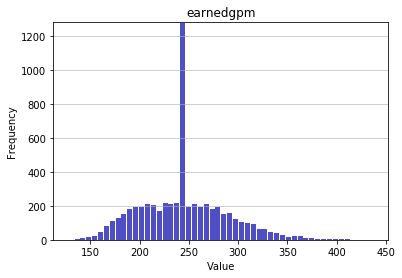

-------------------- 
Summary statistics:
 --------------------
Minimum value: 127.57959183673469
Mean: 244.2847
Standard deviation: 43.6748
Median: 242.1661
Maximal value: 437.46284640676373


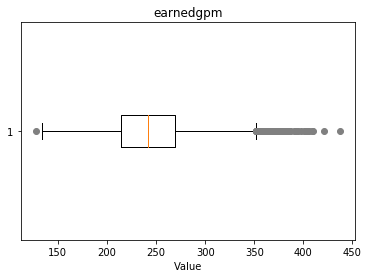

-------------------- 
Outlier detection:
 --------------------
List of outliers: {384.76, 386.34, 386.89, 382.53, 382.39, 390.1, 386.6, 392.25, 393.37, 394.74, 397.72, 400.46, 402.97, 402.72, 405.11, 405.74, 408.49, 410.11, 420.96, 437.46, 377.27, 377.57, 379.58, 377.54, 378.5, 379.09, 382.8}


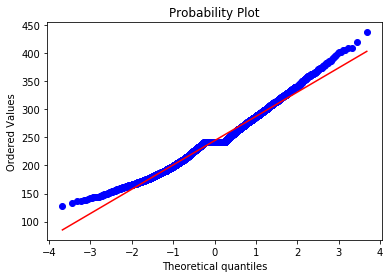

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4132
Kurtosis: 0.3484


   Middle 
Overview of variable:  earnedgpm 


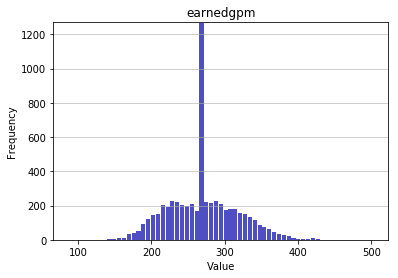

-------------------- 
Summary statistics:
 --------------------
Minimum value: 86.70217534607778
Mean: 270.2084
Standard deviation: 46.3983
Median: 269.7573
Maximal value: 502.7319618665329


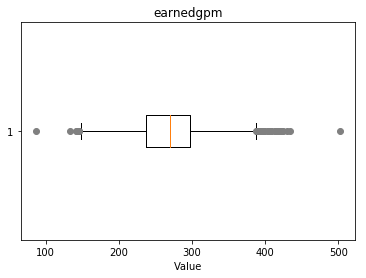

-------------------- 
Outlier detection:
 --------------------
List of outliers: {417.34, 418.95, 419.68, 420.88, 419.82, 422.78, 420.33, 424.55, 419.55, 430.02, 434.66, 502.73, 86.7, 413.96, 414.06}


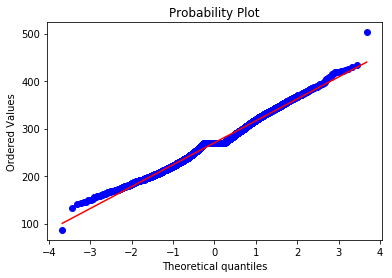

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2175
Kurtosis: 0.0666


   Jungle 
Overview of variable:  earnedgpm 


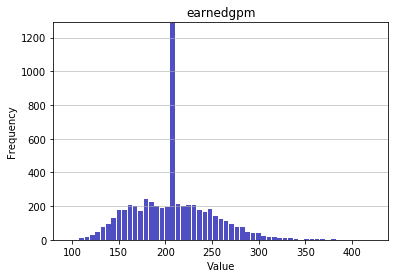

-------------------- 
Summary statistics:
 --------------------
Minimum value: 96.18957150232318
Mean: 207.713
Standard deviation: 41.6629
Median: 206.0242
Maximal value: 422.94240980258684


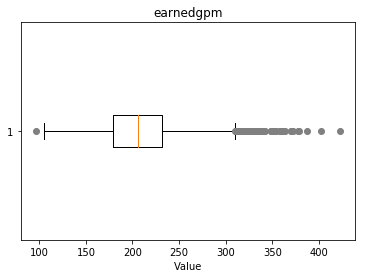

-------------------- 
Outlier detection:
 --------------------
List of outliers: {387.8, 333.39, 402.45, 335.85, 422.94, 332.99, 332.95, 334.64, 334.96, 336.1, 337.32, 338.48, 338.79, 340.3, 341.77, 335.09, 341.57, 338.11, 348.85, 348.37, 349.12, 350.11, 351.22, 353.97, 353.3, 358.84, 358.4, 358.21, 361.72, 362.09, 363.3, 361.43, 369.88, 370.43, 372.55, 377.59, 378.31}


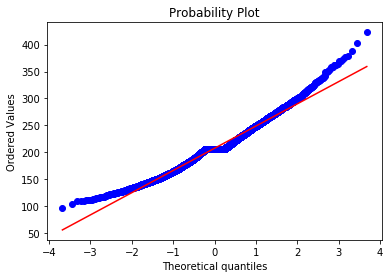

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4856
Kurtosis: 0.5884


   ADC 
Overview of variable:  earnedgpm 


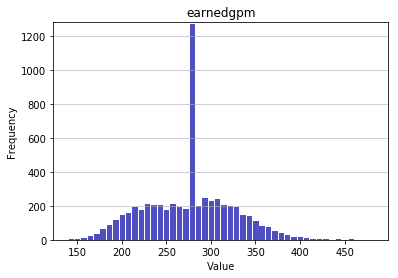

-------------------- 
Summary statistics:
 --------------------
Minimum value: 139.67434944237917
Mean: 275.672
Standard deviation: 48.7535
Median: 276.8155
Maximal value: 482.5166666666667


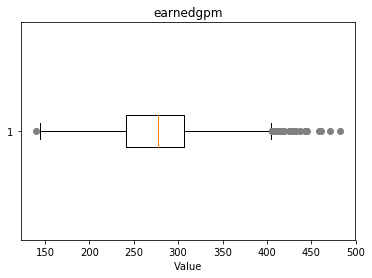

-------------------- 
Outlier detection:
 --------------------
List of outliers: {482.52, 424.97, 425.95, 458.25, 459.65, 460.44, 427.81, 431.97, 432.33, 436.73, 471.06, 443.39, 444.17, 445.33}


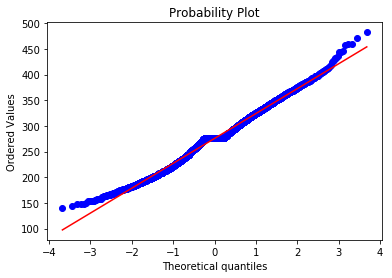

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1094
Kurtosis: -0.0203


   Support 
Overview of variable:  earnedgpm 


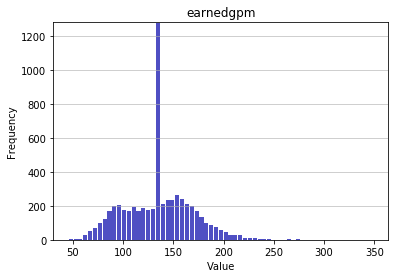

-------------------- 
Summary statistics:
 --------------------
Minimum value: 45.36629213483147
Mean: 135.5614
Standard deviation: 33.2011
Median: 136.9327
Maximal value: 349.17311320754715


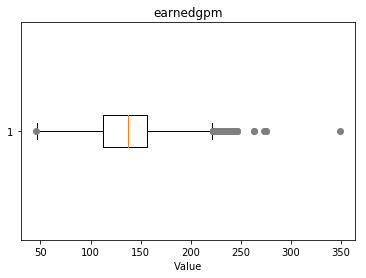

-------------------- 
Outlier detection:
 --------------------
List of outliers: {262.85, 263.05, 236.06, 237.07, 238.79, 238.22, 238.99, 273.35, 242.16, 274.71, 242.14, 245.38, 246.61, 246.42, 246.39, 243.63, 275.0, 349.17}


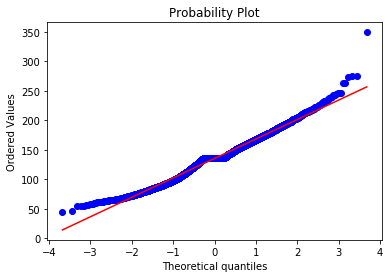

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1835
Kurtosis: 0.3206


   Top 
Overview of variable:  goldspent 


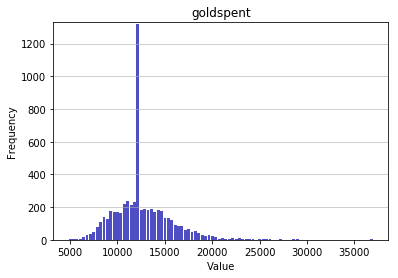

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4825.0
Mean: 12662.3201
Standard deviation: 3042.6826
Median: 12322.5
Maximal value: 37000.0


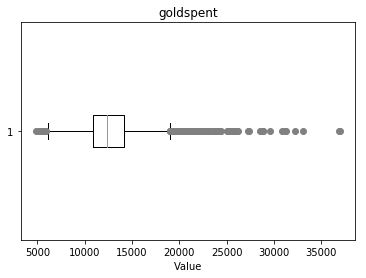

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23040.0, 25860.0, 23685.0, 25990.0, 37000.0, 23945.0, 24075.0, 25100.0, 22925.0, 24078.0, 30865.0, 23575.0, 28570.0, 22175.0, 23200.0, 24225.0, 23075.0, 31140.0, 28708.0, 22310.0, 25510.0, 25000.0, 22395.0, 23850.0, 22183.0, 24100.0, 29615.0, 22708.0, 23733.0, 22200.0, 22715.0, 22460.0, 26045.0, 27325.0, 36925.0, 23995.0, 25660.0, 32195.0, 31300.0, 25925.0, 22725.0, 22985.0, 28875.0, 33100.0, 22993.0, 22610.0, 23633.0, 22100.0, 21975.0, 23000.0, 27225.0, 22875.0, 28638.0, 22495.0, 21983.0, 26208.0, 23650.0, 23010.0, 25575.0, 22125.0, 23025.0, 28795.0, 24445.0, 25215.0}


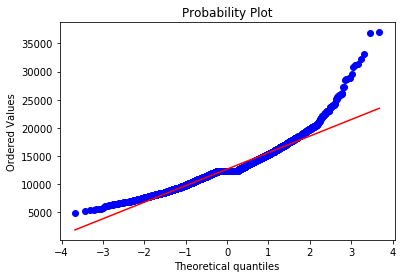

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.207
Kurtosis: 4.3503


   Middle 
Overview of variable:  goldspent 


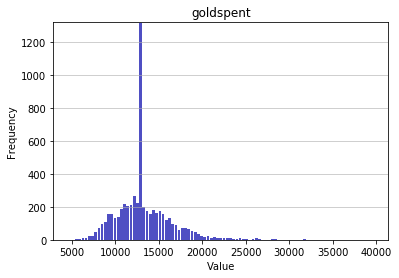

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4585.0
Mean: 13241.9637
Standard deviation: 3182.8258
Median: 12875.0
Maximal value: 39655.0


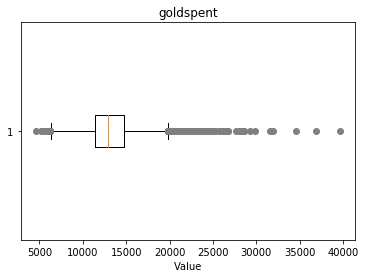

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23808.0, 24325.0, 28550.0, 27655.0, 23175.0, 25225.0, 23050.0, 26250.0, 26125.0, 31885.0, 34575.0, 23185.0, 24210.0, 24725.0, 24470.0, 22808.0, 24350.0, 24480.0, 23200.0, 24483.0, 26150.0, 24870.0, 28200.0, 26025.0, 23850.0, 23080.0, 25258.0, 22830.0, 23983.0, 23985.0, 26550.0, 23608.0, 28220.0, 24125.0, 24510.0, 24380.0, 23105.0, 26050.0, 22980.0, 27975.0, 23625.0, 25930.0, 23500.0, 22860.0, 23375.0, 26575.0, 22995.0, 28628.0, 23125.0, 36825.0, 22875.0, 23900.0, 24158.0, 23775.0, 28258.0, 28260.0, 23525.0, 31590.0, 24420.0, 39655.0, 26218.0, 29803.0, 29290.0, 26733.0, 23150.0, 23025.0, 25075.0, 26358.0, 24575.0, 24700.0, 25725.0, 26750.0, 24703.0}


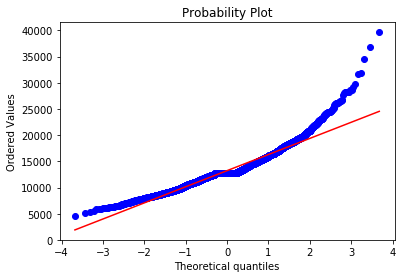

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1581
Kurtosis: 3.7707


   Jungle 
Overview of variable:  goldspent 


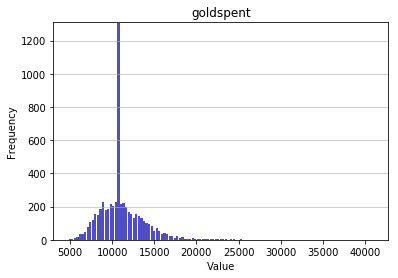

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4825.0
Mean: 11169.2571
Standard deviation: 2677.8183
Median: 10875.0
Maximal value: 40975.0


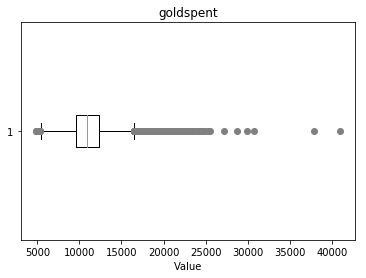

-------------------- 
Outlier detection:
 --------------------
List of outliers: {24960.0, 25347.0, 22660.0, 21125.0, 20100.0, 23175.0, 21000.0, 40975.0, 21650.0, 24725.0, 20375.0, 21400.0, 22012.0, 20125.0, 22560.0, 24480.0, 21025.0, 19875.0, 23462.0, 27175.0, 25255.0, 22825.0, 20650.0, 19375.0, 23600.0, 30770.0, 21940.0, 22325.0, 25525.0, 19895.0, 22200.0, 21300.0, 29880.0, 19510.0, 19650.0, 22850.0, 21700.0, 24130.0, 28742.0, 37830.0, 20425.0, 21450.0, 20300.0, 24150.0, 21210.0, 20700.0, 19550.0, 20575.0, 19425.0, 23650.0, 24035.0, 22500.0, 23270.0, 24550.0, 20075.0, 21100.0, 23025.0, 19700.0, 22775.0, 19450.0, 20475.0, 21500.0, 19325.0, 21375.0}


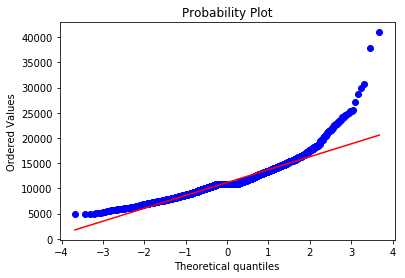

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5662
Kurtosis: 7.8026


   ADC 
Overview of variable:  goldspent 


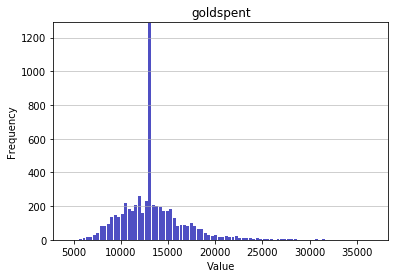

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4450.0
Mean: 13296.2446
Standard deviation: 3327.1674
Median: 12972.5
Maximal value: 36745.0


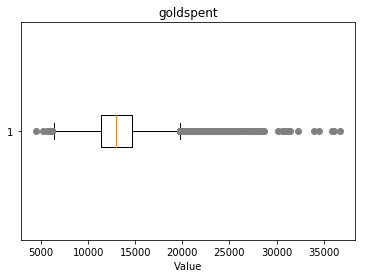

-------------------- 
Outlier detection:
 --------------------
List of outliers: {28545.0, 25735.0, 36745.0, 28045.0, 24720.0, 27025.0, 25745.0, 30608.0, 30100.0, 27158.0, 24600.0, 25625.0, 23833.0, 32283.0, 27165.0, 24350.0, 28575.0, 30750.0, 23325.0, 23330.0, 23845.0, 26533.0, 24615.0, 31400.0, 36134.0, 25770.0, 25390.0, 24750.0, 24500.0, 23350.0, 28215.0, 26550.0, 27450.0, 25275.0, 35900.0, 26045.0, 23870.0, 23740.0, 25790.0, 24125.0, 26950.0, 23750.0, 27850.0, 24395.0, 25933.0, 26830.0, 28625.0, 24658.0, 25300.0, 23508.0, 24280.0, 31320.0, 34520.0, 26075.0, 25050.0, 24542.0, 27870.0, 24800.0, 23650.0, 27875.0, 34020.0, 24550.0, 25575.0, 23530.0, 26475.0, 24175.0, 25200.0, 24700.0, 25075.0, 23283.0, 27508.0, 24950.0, 23800.0, 25850.0, 23675.0, 31100.0}


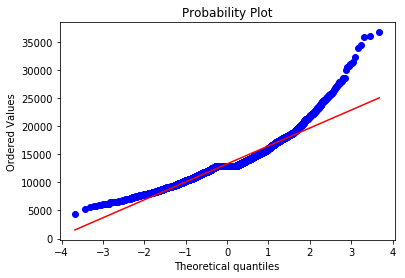

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2703
Kurtosis: 4.0448


   Support 
Overview of variable:  goldspent 


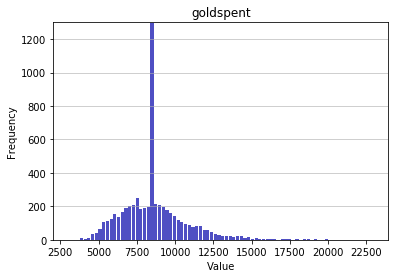

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3025.0
Mean: 8597.593
Standard deviation: 2143.7676
Median: 8400.0
Maximal value: 22950.0


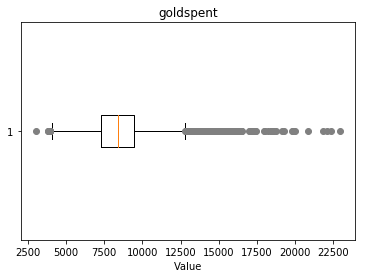

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15235.0, 15875.0, 15110.0, 19975.0, 15495.0, 19850.0, 20875.0, 16525.0, 15630.0, 16150.0, 18200.0, 17305.0, 17050.0, 15775.0, 15265.0, 18725.0, 22950.0, 18600.0, 16425.0, 17450.0, 15275.0, 18475.0, 16175.0, 16050.0, 22325.0, 15800.0, 15225.0, 16955.0, 15675.0, 16445.0, 15550.0, 17985.0, 21825.0, 16450.0, 16200.0, 15050.0, 16075.0, 16330.0, 17100.0, 22090.0, 15950.0, 19280.0, 15825.0, 18390.0, 15575.0, 16475.0, 15325.0, 17375.0, 17250.0, 15075.0, 16100.0, 17125.0, 19175.0, 15975.0, 18025.0, 15850.0, 15600.0, 15475.0, 19830.0, 15350.0, 18425.0, 16250.0, 17275.0}


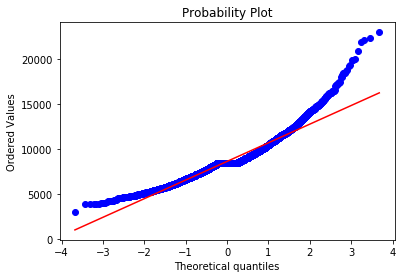

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1499
Kurtosis: 3.1696


   Top 
Overview of variable:  gspd 


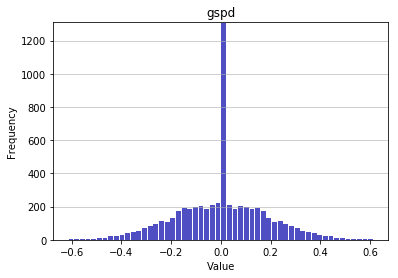

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.6139534883720931
Mean: 0.0
Standard deviation: 0.1763
Median: 0.0
Maximal value: 0.6139534883720931


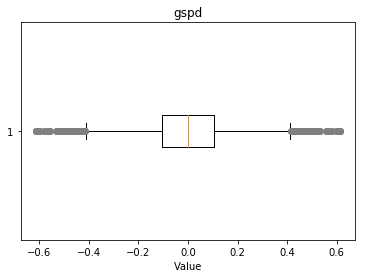

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.61, -0.61, 0.53, 0.56, -0.53, -0.56, 0.57, -0.57, 0.6, -0.6, -0.58, 0.58}


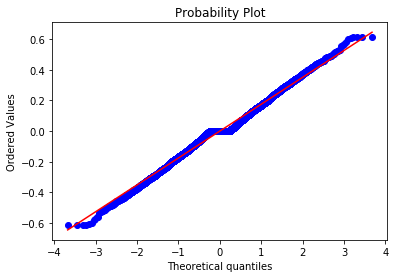

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.4651


   Middle 
Overview of variable:  gspd 


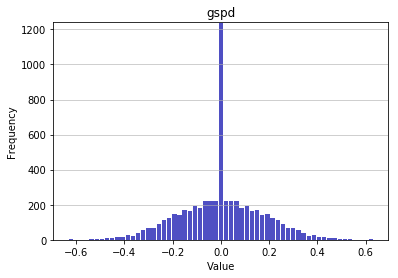

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.6321916274904857
Mean: 0.0
Standard deviation: 0.1655
Median: 0.0
Maximal value: 0.6321916274904857


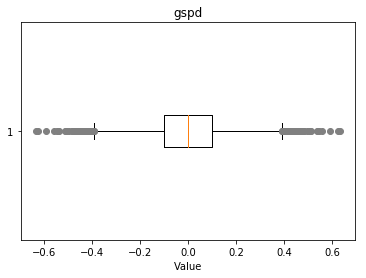

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.63, -0.63, 0.51, 0.54, -0.54, -0.51, -0.5, 0.5, 0.56, -0.56, 0.59, -0.62, 0.62, -0.59}


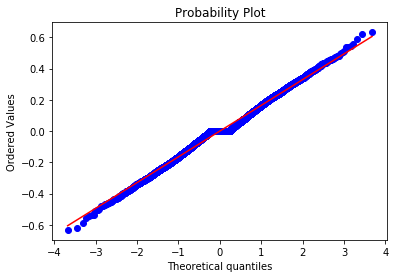

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.3661


   Jungle 
Overview of variable:  gspd 


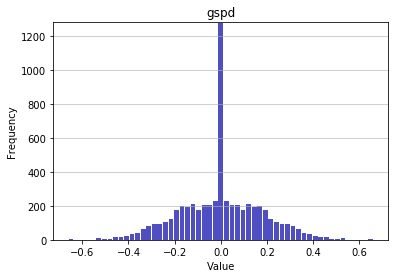

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.660784768980729
Mean: 0.0
Standard deviation: 0.1767
Median: 0.0
Maximal value: 0.660784768980729


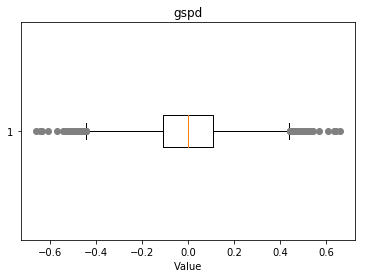

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-0.53, 0.53, -0.54, 0.57, -0.57, 0.54, -0.64, 0.64, 0.61, -0.61, -0.66, 0.66}


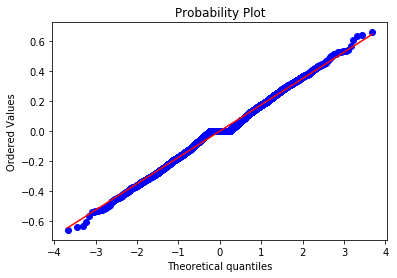

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.308


   ADC 
Overview of variable:  gspd 


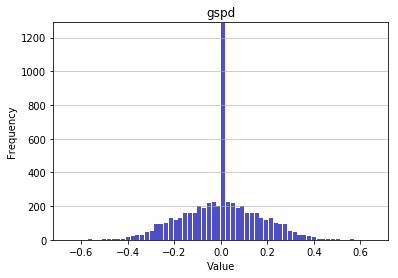

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.6562905317769131
Mean: 0.0
Standard deviation: 0.1594
Median: 0.0
Maximal value: 0.6562905317769131


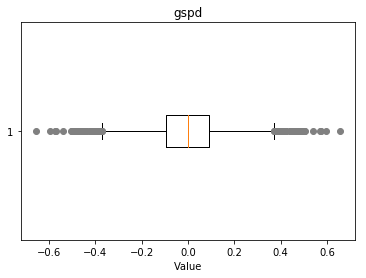

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.49, -0.49, 0.54, -0.54, 0.5, -0.5, -0.57, 0.57, 0.6, -0.6, -0.66, -0.48, 0.66, 0.48}


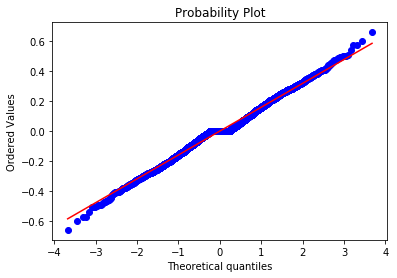

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.4018


   Support 
Overview of variable:  gspd 


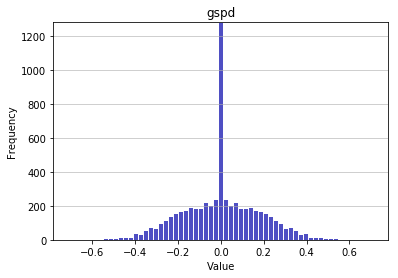

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7123287671232876
Mean: 0.0
Standard deviation: 0.172
Median: 0.0
Maximal value: 0.7123287671232876


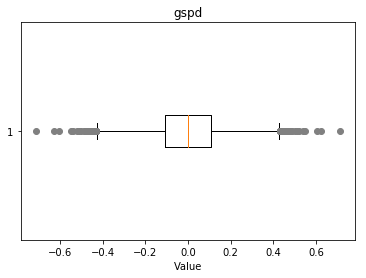

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-0.54, 0.54, 0.62, 0.55, -0.55, -0.62, 0.52, -0.52, 0.71, -0.71, -0.6, 0.6}


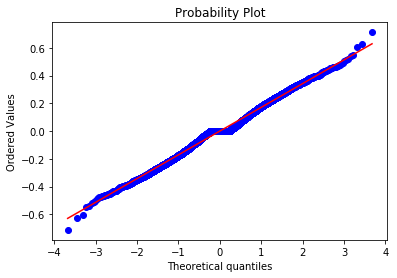

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.1408


   Top 
Overview of variable:  minionkills 


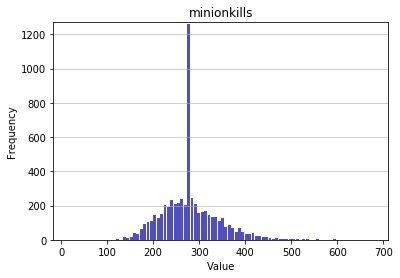

-------------------- 
Summary statistics:
 --------------------
Minimum value: 16.0
Mean: 279.1656
Standard deviation: 60.7107
Median: 274.0
Maximal value: 678.0


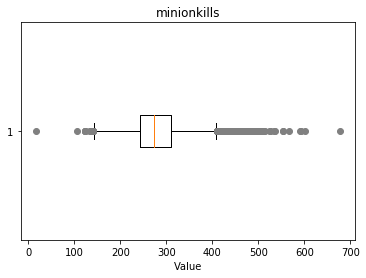

-------------------- 
Outlier detection:
 --------------------
List of outliers: {515.0, 525.0, 16.0, 535.0, 536.0, 678.0, 553.0, 566.0, 590.0, 463.0, 592.0, 465.0, 466.0, 467.0, 468.0, 469.0, 470.0, 471.0, 464.0, 473.0, 474.0, 602.0, 476.0, 477.0, 479.0, 481.0, 482.0, 484.0, 488.0, 490.0, 491.0, 493.0, 495.0, 497.0, 500.0, 502.0, 503.0, 507.0, 511.0}


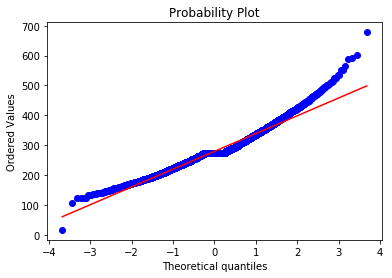

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7359
Kurtosis: 1.6587


   Middle 
Overview of variable:  minionkills 


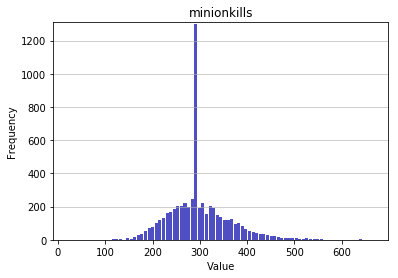

-------------------- 
Summary statistics:
 --------------------
Minimum value: 22.0
Mean: 299.8157
Standard deviation: 63.8568
Median: 294.0
Maximal value: 667.0


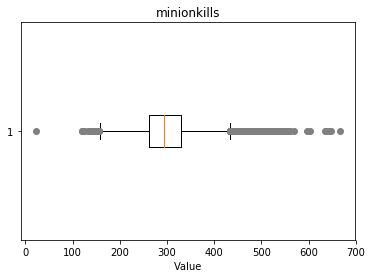

-------------------- 
Outlier detection:
 --------------------
List of outliers: {513.0, 643.0, 516.0, 517.0, 518.0, 510.0, 648.0, 522.0, 523.0, 525.0, 526.0, 527.0, 528.0, 529.0, 532.0, 533.0, 22.0, 535.0, 536.0, 537.0, 667.0, 542.0, 544.0, 547.0, 551.0, 552.0, 554.0, 559.0, 560.0, 561.0, 570.0, 597.0, 603.0, 492.0, 493.0, 496.0, 497.0, 499.0, 500.0, 502.0, 503.0, 504.0, 505.0, 634.0, 638.0, 511.0}


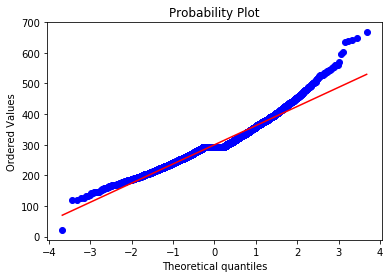

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7915
Kurtosis: 1.8626


   Jungle 
Overview of variable:  minionkills 


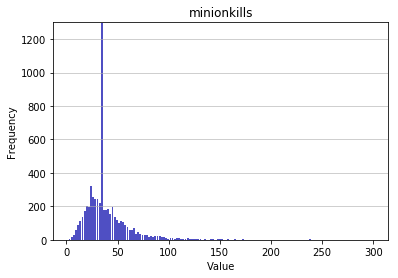

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 39.0485
Standard deviation: 21.5057
Median: 35.0
Maximal value: 300.0


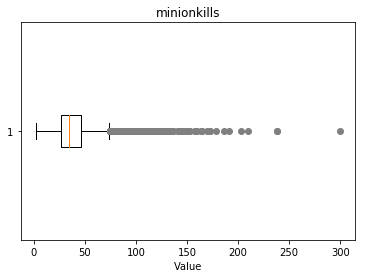

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 136.0, 141.0, 143.0, 144.0, 145.0, 147.0, 148.0, 149.0, 150.0, 152.0, 153.0, 158.0, 160.0, 164.0, 165.0, 170.0, 300.0, 173.0, 178.0, 186.0, 191.0, 203.0, 210.0, 122.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 238.0, 114.0, 113.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 115.0, 123.0, 124.0, 126.0}


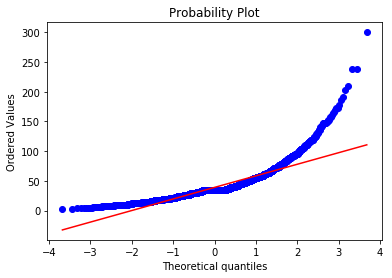

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.4854
Kurtosis: 12.6141


   ADC 
Overview of variable:  minionkills 


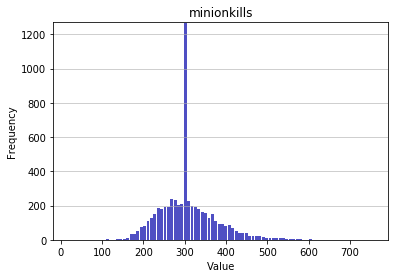

-------------------- 
Summary statistics:
 --------------------
Minimum value: 19.0
Mean: 307.7505
Standard deviation: 69.0365
Median: 301.0
Maximal value: 756.0


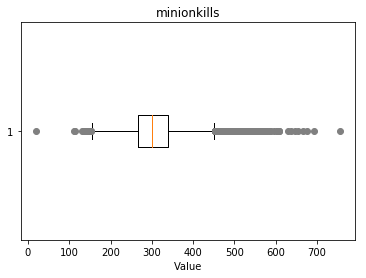

-------------------- 
Outlier detection:
 --------------------
List of outliers: {515.0, 518.0, 646.0, 520.0, 519.0, 522.0, 521.0, 524.0, 525.0, 526.0, 527.0, 528.0, 529.0, 653.0, 531.0, 19.0, 533.0, 534.0, 535.0, 536.0, 667.0, 540.0, 542.0, 544.0, 545.0, 675.0, 549.0, 552.0, 557.0, 558.0, 561.0, 565.0, 566.0, 567.0, 568.0, 693.0, 570.0, 571.0, 573.0, 576.0, 584.0, 589.0, 595.0, 603.0, 604.0, 605.0, 606.0, 607.0, 609.0, 756.0, 629.0, 637.0}


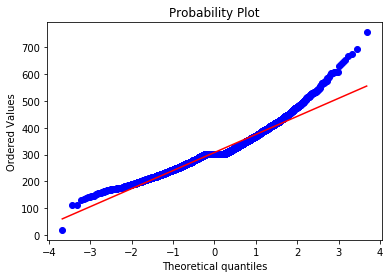

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9095
Kurtosis: 2.2066


   Support 
Overview of variable:  minionkills 


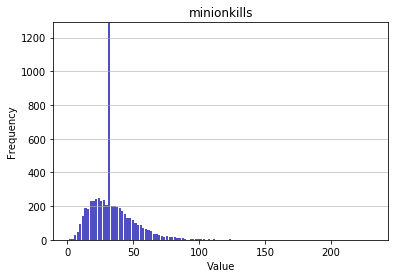

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 33.7089
Standard deviation: 16.471
Median: 31.0
Maximal value: 232.0


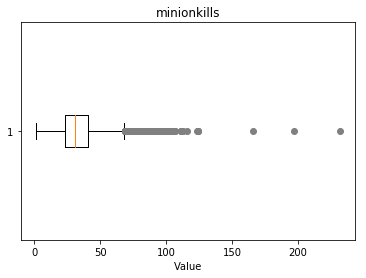

-------------------- 
Outlier detection:
 --------------------
List of outliers: {166.0, 197.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 232.0, 107.0, 111.0, 112.0, 113.0, 116.0, 123.0, 124.0}


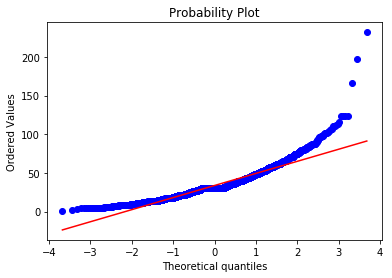

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6581
Kurtosis: 7.8687


   Top 
Overview of variable:  monsterkills 


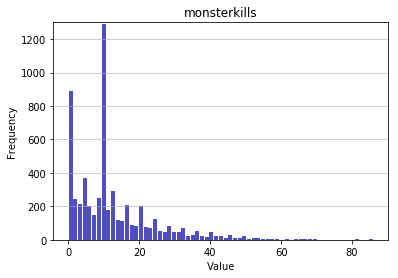

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.4156
Standard deviation: 11.5219
Median: 10.0
Maximal value: 86.0


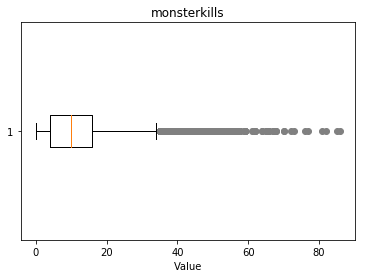

-------------------- 
Outlier detection:
 --------------------
List of outliers: {47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 61.0, 62.0, 64.0, 65.0, 66.0, 67.0, 68.0, 70.0, 72.0, 73.0, 76.0, 77.0, 81.0, 82.0, 85.0, 86.0}


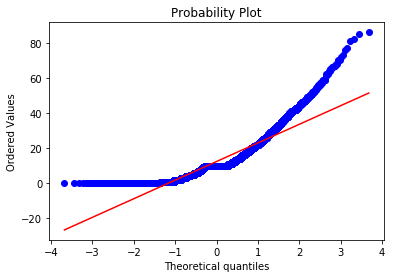

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6964
Kurtosis: 3.8418


   Middle 
Overview of variable:  monsterkills 


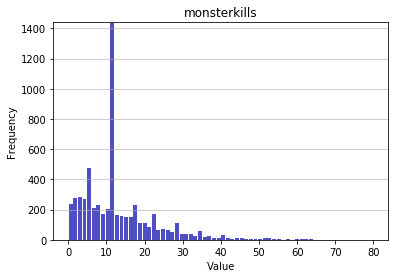

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.9521
Standard deviation: 9.7648
Median: 11.0
Maximal value: 80.0


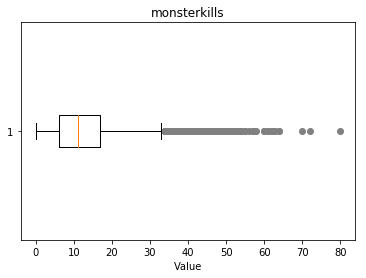

-------------------- 
Outlier detection:
 --------------------
List of outliers: {43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 60.0, 61.0, 62.0, 63.0, 64.0, 70.0, 72.0, 80.0}


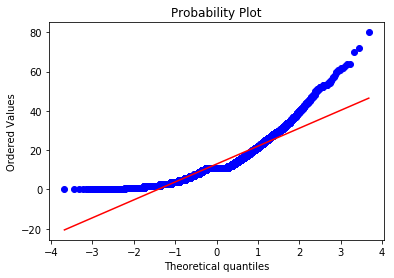

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.599
Kurtosis: 3.6126


   Jungle 
Overview of variable:  monsterkills 


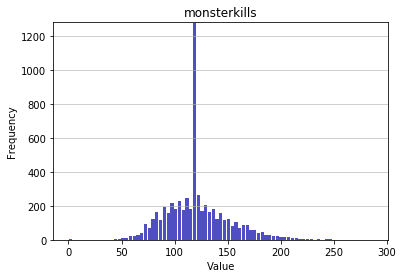

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 121.307
Standard deviation: 29.6921
Median: 119.0
Maximal value: 287.0


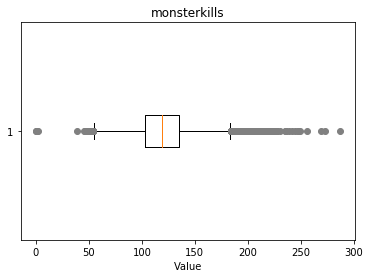

-------------------- 
Outlier detection:
 --------------------
List of outliers: {256.0, 0.0, 2.0, 1.0, 269.0, 273.0, 287.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 220.0, 221.0, 223.0, 224.0, 225.0, 227.0, 230.0, 235.0, 236.0, 239.0, 242.0, 244.0, 247.0, 249.0}


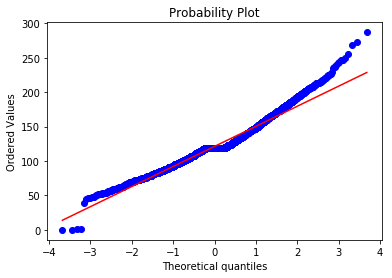

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6589
Kurtosis: 1.336


   ADC 
Overview of variable:  monsterkills 


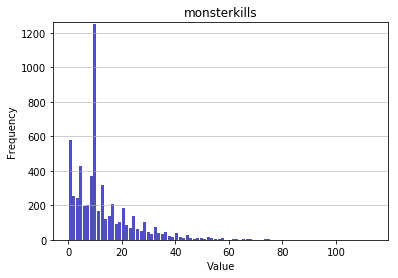

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.989
Standard deviation: 11.4661
Median: 10.0
Maximal value: 114.0


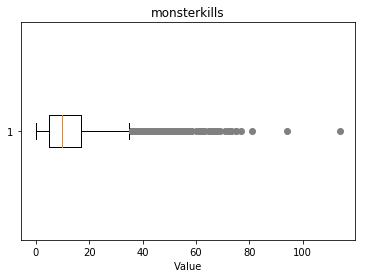

-------------------- 
Outlier detection:
 --------------------
List of outliers: {48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 60.0, 61.0, 62.0, 63.0, 65.0, 66.0, 67.0, 68.0, 69.0, 71.0, 72.0, 73.0, 75.0, 77.0, 81.0, 94.0, 114.0}


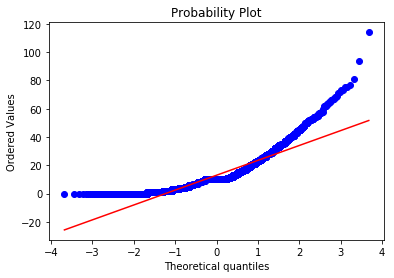

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8142
Kurtosis: 4.8192


   Support 
Overview of variable:  monsterkills 


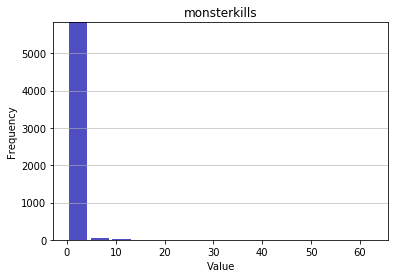

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3652
Standard deviation: 1.6031
Median: 0.0
Maximal value: 63.0


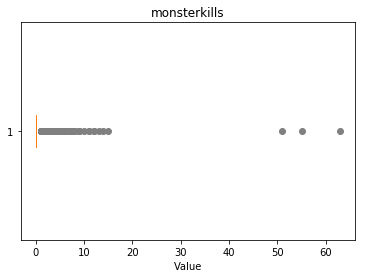

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 51.0, 55.0, 63.0}


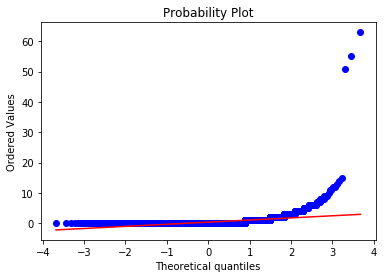

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 23.4503
Kurtosis: 797.5214


   Top 
Overview of variable:  monsterkillsownjungle 


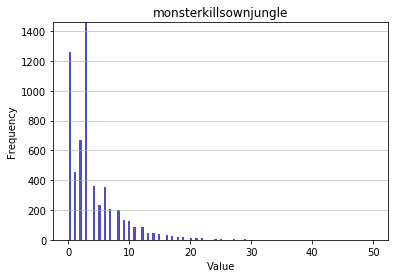

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.9034
Standard deviation: 4.1994
Median: 3.0
Maximal value: 50.0


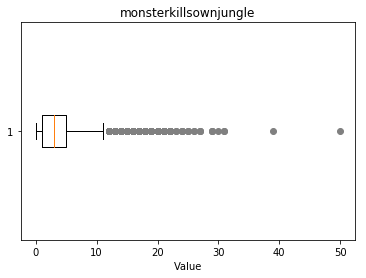

-------------------- 
Outlier detection:
 --------------------
List of outliers: {39.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 50.0, 29.0, 30.0, 31.0}


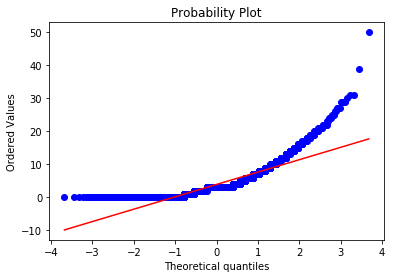

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1562
Kurtosis: 7.8447


   Middle 
Overview of variable:  monsterkillsownjungle 


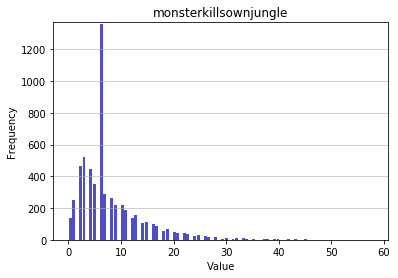

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.8568
Standard deviation: 6.364
Median: 6.0
Maximal value: 58.0


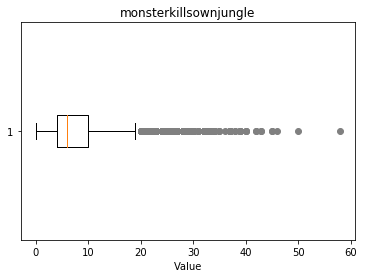

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 42.0, 43.0, 45.0, 46.0, 50.0, 58.0, 27.0, 28.0, 29.0, 30.0, 31.0}


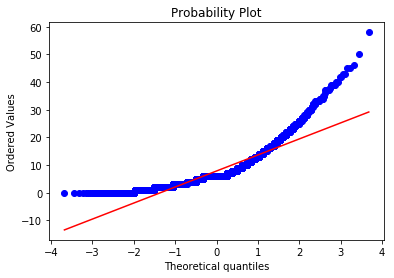

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9105
Kurtosis: 5.0925


   Jungle 
Overview of variable:  monsterkillsownjungle 


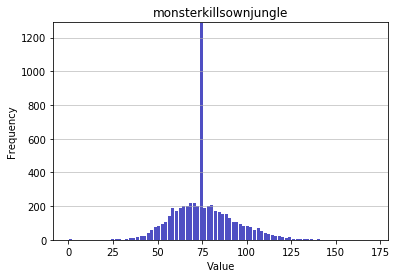

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 75.7169
Standard deviation: 16.832
Median: 74.0
Maximal value: 171.0


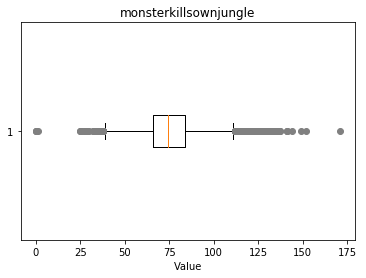

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.0, 128.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 129.0, 171.0, 1.0, 141.0, 144.0, 149.0, 152.0, 25.0, 127.0}


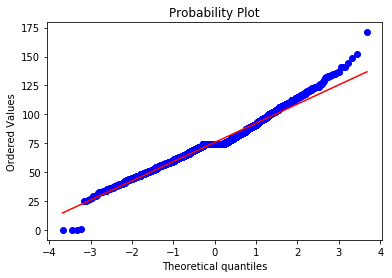

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4583
Kurtosis: 1.0915


   ADC 
Overview of variable:  monsterkillsownjungle 


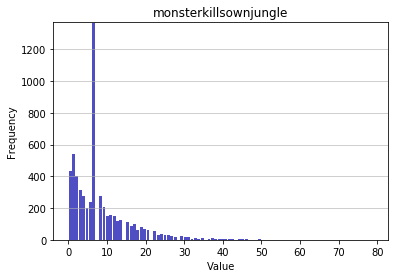

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 8.2705
Standard deviation: 7.6265
Median: 7.0
Maximal value: 79.0


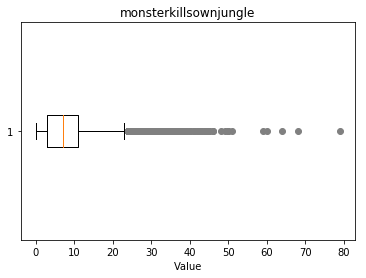

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 48.0, 49.0, 50.0, 51.0, 59.0, 60.0, 64.0, 68.0, 79.0}


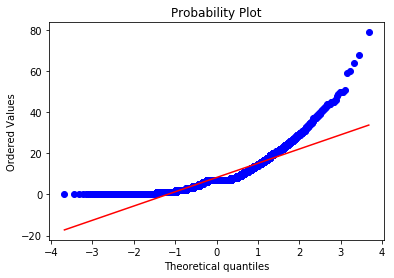

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9845
Kurtosis: 6.427


   Support 
Overview of variable:  monsterkillsownjungle 


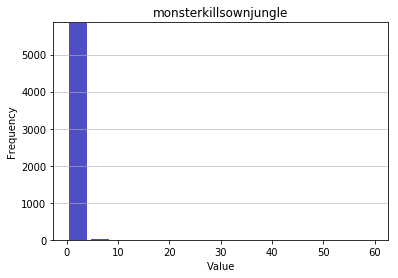

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1341
Standard deviation: 1.1552
Median: 0.0
Maximal value: 60.0


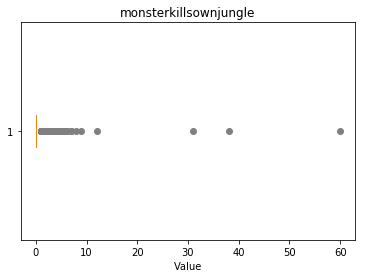

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 5.0, 38.0, 7.0, 8.0, 6.0, 9.0, 12.0, 60.0, 31.0}


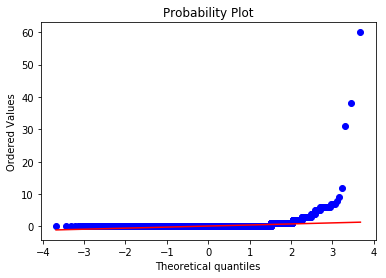

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 33.8159
Kurtosis: 1509.5122


   Top 
Overview of variable:  monsterkillsenemyjungle 


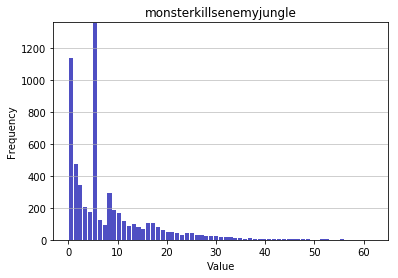

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.3564
Standard deviation: 8.4523
Median: 5.0
Maximal value: 62.0


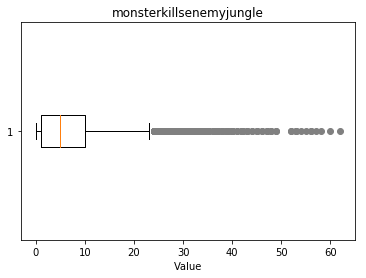

-------------------- 
Outlier detection:
 --------------------
List of outliers: {33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 60.0, 62.0}


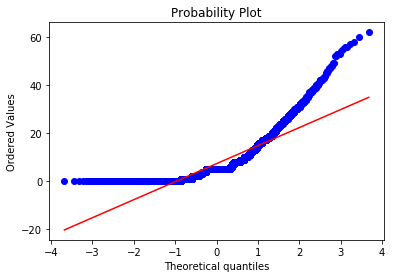

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9755
Kurtosis: 4.8559


   Middle 
Overview of variable:  monsterkillsenemyjungle 


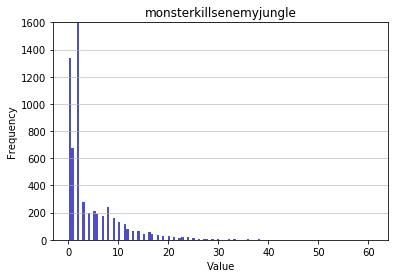

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.2609
Standard deviation: 5.5873
Median: 2.0
Maximal value: 61.0


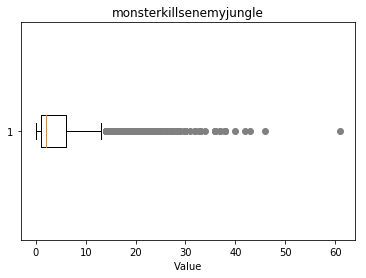

-------------------- 
Outlier detection:
 --------------------
List of outliers: {22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 36.0, 37.0, 38.0, 40.0, 42.0, 43.0, 46.0, 61.0}


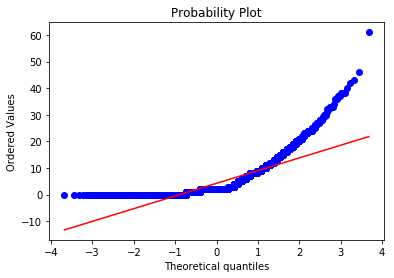

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3796
Kurtosis: 8.0577


   Jungle 
Overview of variable:  monsterkillsenemyjungle 


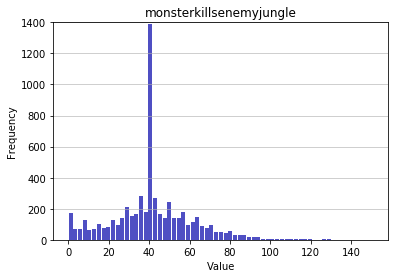

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 41.7945
Standard deviation: 20.1625
Median: 41.0
Maximal value: 151.0


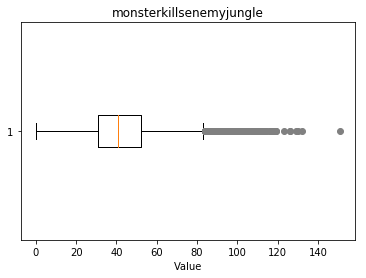

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 130.0, 132.0, 151.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 116.0, 117.0, 118.0, 119.0, 123.0, 126.0}


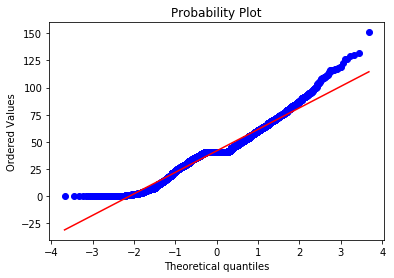

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4128
Kurtosis: 1.0614


   ADC 
Overview of variable:  monsterkillsenemyjungle 


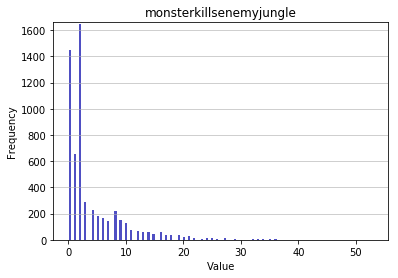

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.0514
Standard deviation: 5.5453
Median: 2.0
Maximal value: 53.0


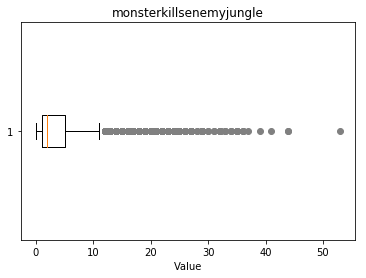

-------------------- 
Outlier detection:
 --------------------
List of outliers: {21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 39.0, 41.0, 44.0, 53.0}


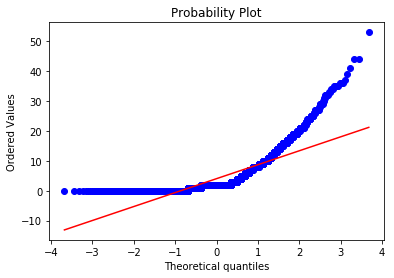

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.4465
Kurtosis: 7.8141


   Support 
Overview of variable:  monsterkillsenemyjungle 


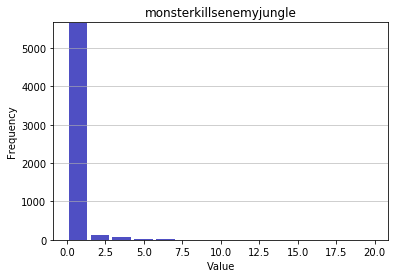

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2132
Standard deviation: 0.7677
Median: 0.0
Maximal value: 20.0


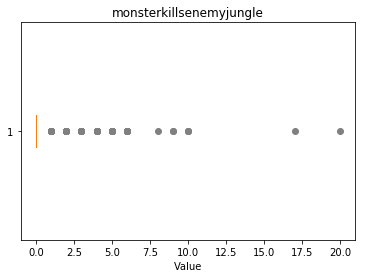

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0, 6.0, 8.0, 9.0, 10.0, 17.0, 20.0}


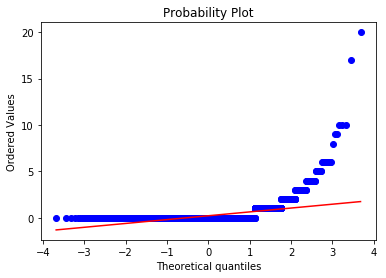

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.8411
Kurtosis: 144.6128


   Top 
Overview of variable:  cspm 


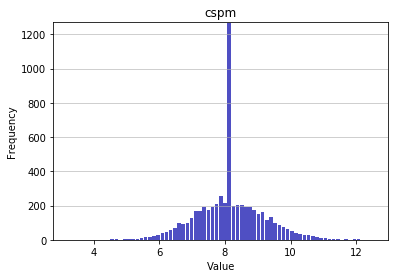

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3.2254123396456933
Mean: 8.1534
Standard deviation: 1.0093
Median: 8.1266
Maximal value: 12.523833416959357


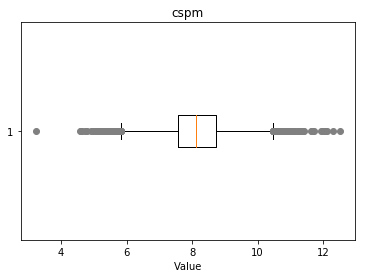

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.23, 4.74, 4.79, 4.61, 5.11, 5.08, 5.1, 4.97, 11.27, 11.63, 11.29, 11.71, 11.67, 12.52, 11.3, 12.11, 12.07, 11.24, 12.3, 4.65, 4.91, 4.57, 11.41, 11.22, 11.34, 11.94, 11.25, 12.01, 11.38, 5.04}


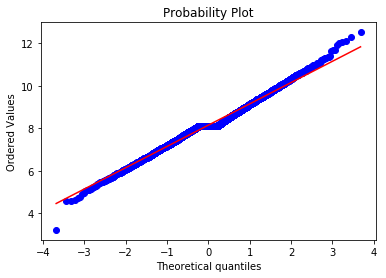

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1097
Kurtosis: 0.7082


   Middle 
Overview of variable:  cspm 


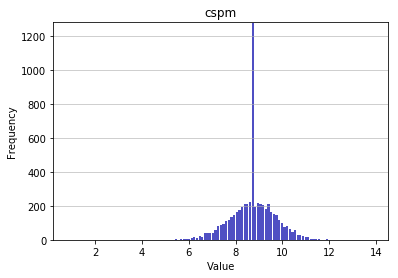

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.8701384311140408
Mean: 8.7423
Standard deviation: 0.9202
Median: 8.7579
Maximal value: 13.878575012543902


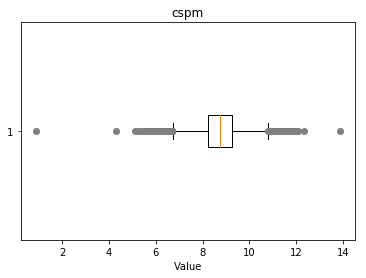

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.87, 4.28, 5.78, 5.75, 5.79, 5.91, 5.35, 5.86, 5.98, 12.31, 13.88, 12.08, 12.05, 11.86, 11.94, 11.74, 11.87, 11.65, 5.66, 5.57, 5.25, 5.83, 5.93, 5.5, 11.61, 11.51, 5.44, 5.7, 5.12, 5.96}


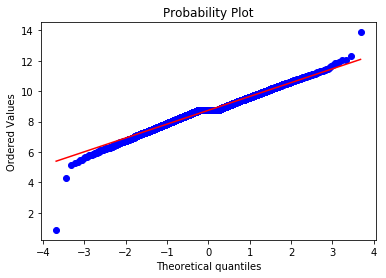

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.2141
Kurtosis: 1.6885


   Jungle 
Overview of variable:  cspm 


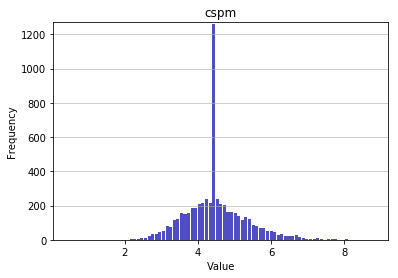

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.4599056603773585
Mean: 4.4835
Standard deviation: 0.8257
Median: 4.4267
Maximal value: 8.796844181459566


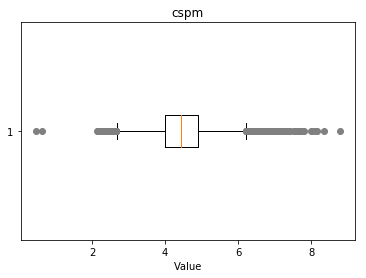

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.46, 0.62, 6.98, 7.14, 8.35, 7.72, 7.32, 7.28, 7.29, 7.4, 7.71, 7.11, 7.16, 8.01, 6.99, 7.66, 7.07, 7.41, 7.25, 7.58, 8.1, 8.17, 7.24, 7.99, 8.8, 7.26, 7.08, 7.02, 7.31, 7.2, 7.53, 7.38, 7.05, 7.8, 7.63, 7.55, 7.54, 7.3}


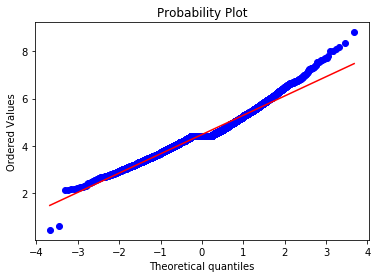

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.536
Kurtosis: 1.2913


   ADC 
Overview of variable:  cspm 


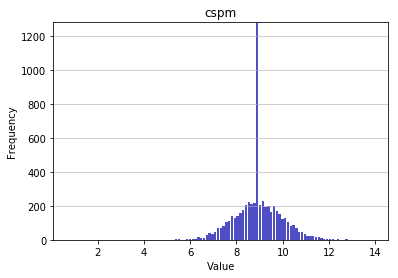

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.7429245283018868
Mean: 8.9402
Standard deviation: 0.9813
Median: 8.9284
Maximal value: 13.908680381334669


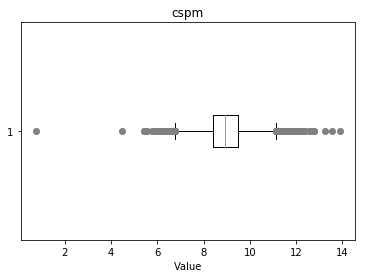

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.74, 4.47, 5.47, 5.91, 5.57, 5.77, 5.53, 5.42, 11.94, 12.07, 12.34, 12.2, 12.79, 13.55, 13.91, 12.17, 12.09, 12.8, 12.01, 13.23, 5.92, 11.98, 11.96, 12.25, 12.37, 12.14, 12.64, 12.1, 12.19, 12.55}


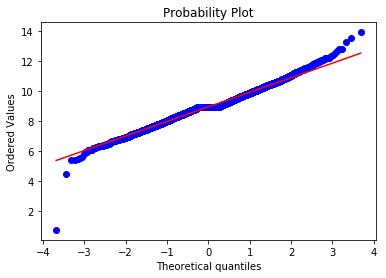

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0361
Kurtosis: 1.6436


   Support 
Overview of variable:  cspm 


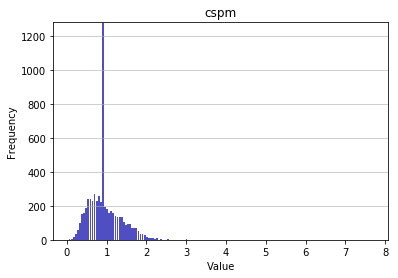

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0422237860661506
Mean: 0.9473
Standard deviation: 0.4141
Median: 0.8838
Maximal value: 7.697006719609041


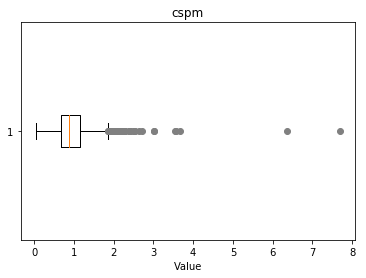

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.52, 3.66, 2.27, 2.54, 2.23, 2.21, 2.26, 3.55, 2.37, 3.01, 2.24, 2.25, 2.5, 6.37, 7.7, 2.43, 2.7, 2.29, 2.2, 2.39, 2.64, 3.56}


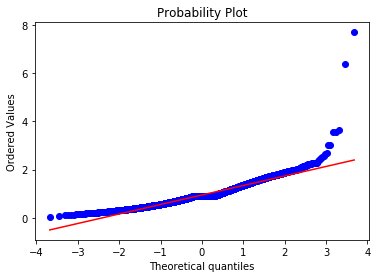

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9106
Kurtosis: 17.8425


   Top 
Overview of variable:  goldat10 


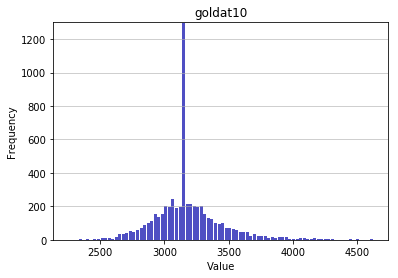

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2254.0
Mean: 3182.9934
Standard deviation: 263.7762
Median: 3163.0
Maximal value: 4623.0


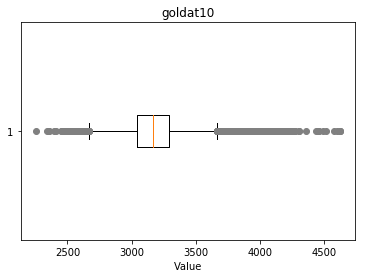

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4227.0, 4355.0, 4230.0, 4102.0, 4105.0, 4618.0, 4491.0, 3980.0, 4620.0, 4108.0, 3983.0, 4111.0, 4623.0, 4242.0, 4116.0, 4123.0, 4252.0, 3997.0, 3995.0, 4511.0, 4125.0, 2339.0, 4132.0, 4005.0, 4004.0, 4009.0, 4265.0, 4269.0, 4270.0, 4144.0, 2354.0, 2359.0, 4027.0, 4157.0, 4029.0, 4038.0, 4042.0, 4172.0, 4173.0, 2254.0, 4047.0, 4048.0, 4177.0, 4305.0, 4301.0, 4180.0, 4182.0, 4438.0, 4058.0, 4187.0, 4188.0, 4063.0, 4062.0, 4574.0, 4192.0, 4065.0, 4066.0, 4451.0, 4452.0, 4197.0, 4070.0, 4069.0, 4090.0, 4459.0, 4075.0, 4077.0, 4205.0, 4207.0, 4082.0, 4085.0, 4087.0, 4601.0, 4218.0, 4094.0, 4223.0}


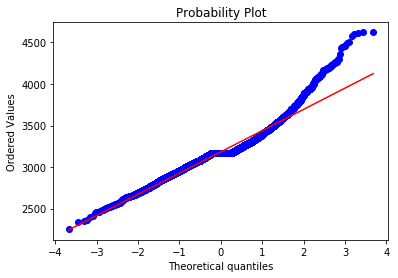

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9228
Kurtosis: 2.8835


   Middle 
Overview of variable:  goldat10 


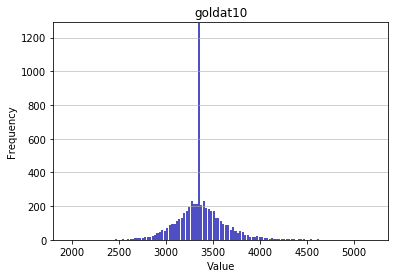

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1966.0
Mean: 3372.0007
Standard deviation: 249.5708
Median: 3361.5
Maximal value: 5208.0


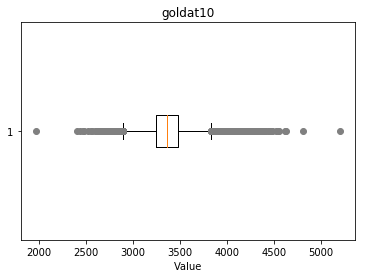

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2560.0, 4227.0, 2438.0, 4231.0, 4363.0, 4236.0, 4623.0, 4243.0, 4371.0, 4374.0, 4375.0, 4122.0, 4635.0, 4379.0, 4128.0, 4129.0, 2466.0, 4131.0, 4263.0, 2600.0, 4139.0, 4140.0, 4141.0, 4142.0, 4527.0, 1966.0, 2481.0, 4147.0, 4275.0, 4276.0, 4406.0, 2614.0, 2618.0, 4155.0, 4285.0, 4161.0, 4551.0, 4295.0, 4554.0, 4299.0, 4174.0, 4175.0, 4816.0, 4305.0, 4176.0, 4309.0, 4184.0, 5208.0, 4186.0, 4440.0, 2525.0, 4319.0, 4453.0, 4455.0, 4328.0, 2407.0, 4202.0, 4203.0, 4204.0, 4205.0, 4207.0, 4349.0, 2556.0, 4477.0}


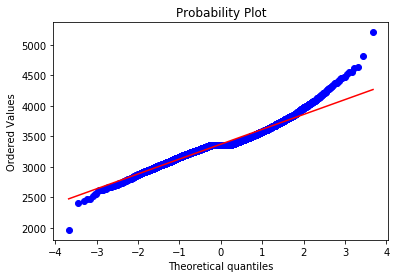

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5474
Kurtosis: 2.7668


   Jungle 
Overview of variable:  goldat10 


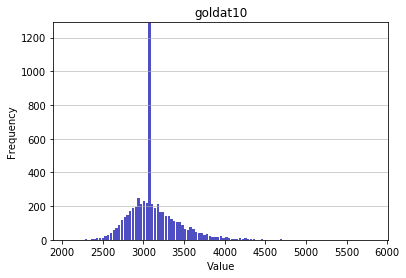

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2078.0
Mean: 3126.973
Standard deviation: 305.9558
Median: 3088.5
Maximal value: 5829.0


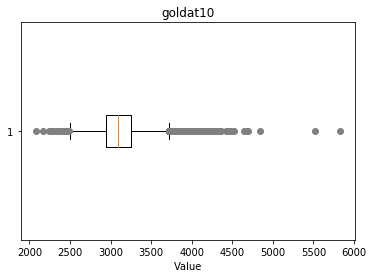

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4097.0, 4354.0, 4484.0, 4231.0, 4104.0, 4362.0, 4240.0, 4115.0, 5524.0, 4245.0, 4247.0, 4248.0, 4249.0, 4122.0, 4253.0, 2078.0, 4127.0, 4641.0, 4261.0, 4133.0, 4517.0, 4268.0, 4140.0, 4276.0, 4150.0, 4154.0, 4155.0, 4162.0, 5829.0, 4166.0, 4427.0, 4300.0, 4301.0, 4684.0, 4175.0, 4049.0, 4053.0, 4182.0, 4694.0, 4056.0, 4185.0, 4314.0, 4187.0, 4060.0, 4189.0, 4193.0, 4449.0, 4065.0, 4836.0, 4325.0, 4069.0, 4322.0, 4072.0, 4091.0, 4327.0, 4203.0, 4076.0, 4207.0, 4208.0, 4464.0, 4339.0, 2163.0, 4213.0, 4467.0, 4090.0, 4219.0}


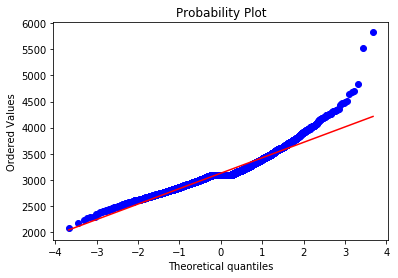

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1217
Kurtosis: 3.5245


   ADC 
Overview of variable:  goldat10 


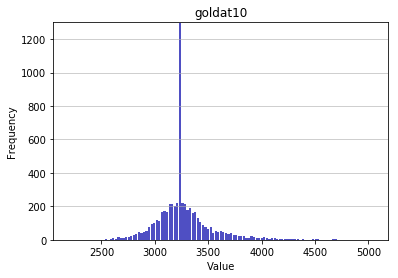

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2191.0
Mean: 3268.7256
Standard deviation: 257.8994
Median: 3241.0
Maximal value: 5045.0


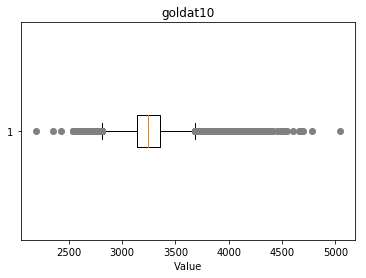

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4099.0, 4100.0, 4103.0, 4104.0, 4107.0, 4109.0, 4112.0, 4115.0, 4116.0, 4119.0, 4122.0, 4123.0, 4125.0, 4130.0, 4132.0, 4143.0, 4660.0, 4150.0, 4664.0, 4672.0, 4163.0, 4169.0, 4170.0, 4173.0, 4176.0, 4689.0, 4698.0, 4190.0, 4192.0, 4197.0, 4202.0, 4208.0, 4603.0, 4218.0, 4227.0, 4230.0, 4234.0, 2191.0, 4240.0, 4248.0, 4253.0, 4256.0, 4257.0, 4258.0, 4267.0, 4782.0, 4273.0, 4279.0, 4284.0, 4286.0, 4298.0, 4321.0, 4323.0, 4342.0, 4343.0, 4344.0, 4375.0, 4382.0, 4394.0, 2352.0, 4418.0, 4450.0, 2430.0, 4479.0, 4490.0, 4509.0, 4511.0, 4512.0, 4527.0, 4531.0, 5045.0, 4547.0, 4049.0, 4051.0, 4053.0, 4054.0, 4055.0, 4058.0, 4060.0, 4063.0, 4072.0, 4076.0, 4077.0, 4079.0, 4086.0, 4088.0, 4091.0, 4094.0}


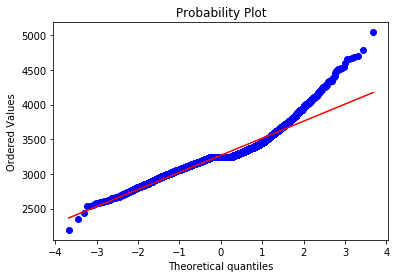

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.197
Kurtosis: 3.9788


   Support 
Overview of variable:  goldat10 


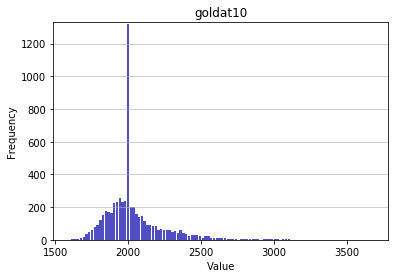

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1591.0
Mean: 2038.3795
Standard deviation: 205.3819
Median: 1997.0
Maximal value: 3683.0


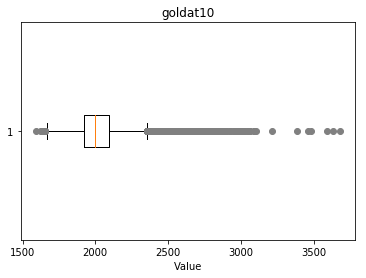

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3596.0, 3089.0, 3093.0, 3094.0, 3103.0, 3635.0, 3683.0, 2661.0, 2664.0, 2666.0, 2668.0, 2670.0, 2674.0, 2675.0, 2678.0, 2679.0, 2692.0, 2693.0, 2694.0, 2696.0, 2703.0, 3216.0, 2705.0, 2710.0, 2714.0, 2716.0, 2720.0, 2721.0, 2724.0, 2725.0, 2728.0, 2738.0, 2743.0, 2744.0, 2745.0, 2746.0, 2750.0, 2766.0, 2772.0, 2780.0, 2787.0, 2792.0, 2795.0, 2803.0, 2811.0, 2816.0, 2823.0, 2825.0, 2827.0, 2833.0, 2835.0, 2838.0, 2840.0, 2844.0, 2849.0, 2851.0, 2853.0, 2856.0, 2860.0, 2865.0, 2866.0, 2873.0, 3385.0, 2879.0, 2887.0, 2888.0, 2890.0, 2897.0, 2899.0, 2919.0, 2929.0, 2933.0, 3462.0, 2953.0, 2954.0, 2963.0, 3484.0, 2974.0, 2987.0, 2990.0, 2992.0, 3008.0, 3013.0, 3023.0, 3030.0, 3043.0, 3057.0, 3058.0, 3062.0}


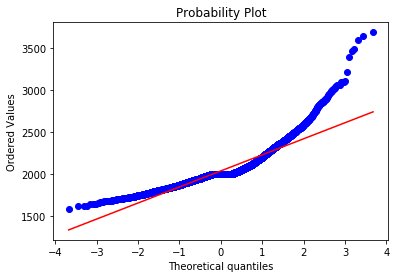

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.851
Kurtosis: 6.1214


   Top 
Overview of variable:  gdat10 


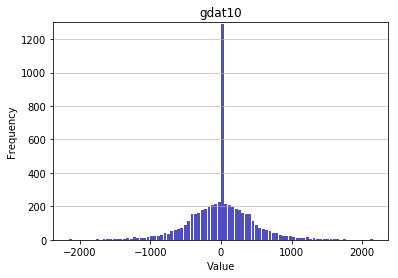

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2157.0
Mean: 0.0
Standard deviation: 434.4665
Median: 0.0
Maximal value: 2157.0


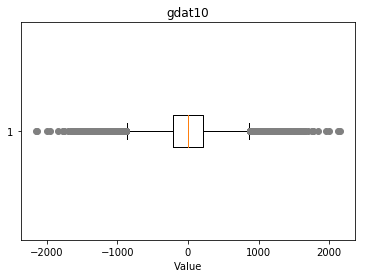

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1408.0, -1408.0, 1536.0, -1405.0, -1536.0, -1531.0, 1414.0, 1418.0, -1653.0, -1652.0, 1548.0, -1776.0, -2157.0, 1428.0, -1769.0, -1512.0, 1306.0, -1382.0, -1381.0, -1635.0, -1762.0, -1509.0, 1696.0, 1314.0, 1955.0, 1445.0, 1448.0, -2133.0, -1493.0, 1453.0, 1579.0, 1323.0, 1584.0, -1363.0, -1357.0, 1845.0, -1609.0, -1352.0, -1992.0, -1346.0, 1346.0, 1352.0, 1992.0, 1609.0, -1845.0, 1357.0, -1584.0, -1453.0, 1363.0, 2133.0, 1493.0, -1579.0, -1323.0, -1448.0, -1445.0, -1955.0, -1314.0, -1696.0, 1762.0, 1635.0, 1381.0, -1306.0, 1382.0, 1512.0, 1769.0, 1509.0, -1428.0, 2157.0, 1776.0, 1652.0, 1653.0, -1418.0, -1548.0, -1414.0, 1531.0, 1405.0}


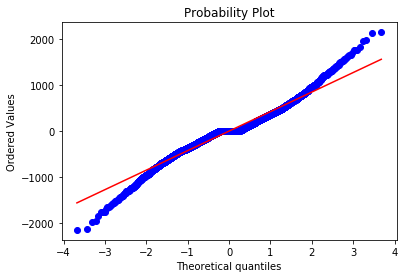

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.2827


   Middle 
Overview of variable:  gdat10 


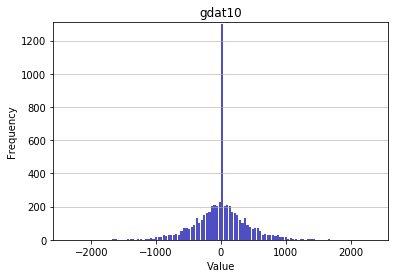

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2350.0
Mean: 0.0
Standard deviation: 383.4771
Median: 0.0
Maximal value: 2350.0


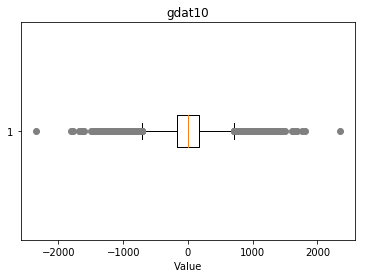

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1287.0, -1657.0, -1270.0, -1396.0, 1677.0, 1806.0, 1423.0, 1421.0, -1395.0, 1170.0, -1645.0, -1260.0, 1657.0, -1768.0, 1433.0, 1178.0, -1244.0, -1497.0, -1368.0, -1621.0, 2350.0, -1231.0, 1330.0, -1230.0, -1355.0, 1335.0, 1336.0, 1340.0, -1219.0, 1469.0, 1215.0, -1602.0, -1215.0, 1602.0, 1219.0, -1469.0, -1340.0, -1336.0, -1335.0, 1355.0, -1330.0, 1231.0, 1230.0, -2350.0, 1621.0, 1368.0, 1497.0, 1244.0, -1178.0, -1433.0, 1768.0, 1260.0, 1645.0, -1170.0, -1423.0, -1806.0, -1677.0, -1421.0, 1396.0, 1395.0, 1270.0, -1287.0}


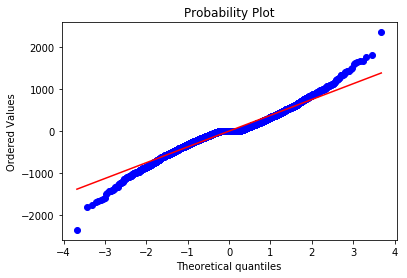

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.3797


   Jungle 
Overview of variable:  gdat10 


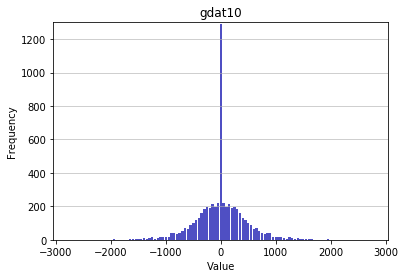

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2768.0
Mean: 0.0
Standard deviation: 448.4911
Median: 0.0
Maximal value: 2768.0


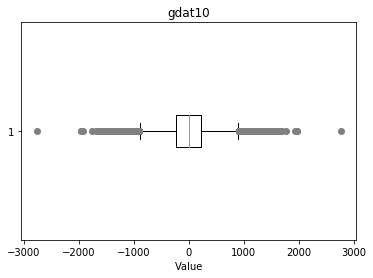

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1538.0, -1660.0, 1413.0, 1926.0, -1398.0, -1654.0, -1652.0, -1524.0, -1650.0, -1396.0, -1520.0, 1553.0, 1551.0, 1427.0, -1392.0, -1510.0, -1381.0, -1764.0, -1378.0, 1568.0, 1440.0, -1502.0, -1373.0, -1372.0, -1631.0, 1696.0, -1501.0, 1447.0, -1499.0, -1366.0, 1578.0, -1621.0, 1962.0, 1454.0, -2768.0, 1970.0, -1355.0, -1480.0, 1592.0, -1479.0, 1467.0, -1467.0, 1479.0, 1480.0, -1592.0, 1355.0, -1970.0, 2768.0, -1454.0, 1621.0, -1578.0, 1366.0, -1962.0, -1447.0, 1499.0, 1372.0, 1373.0, 1502.0, 1631.0, -1568.0, -1440.0, -1696.0, 1501.0, 1764.0, 1381.0, 1510.0, 1378.0, -1427.0, -1553.0, 1520.0, -1551.0, 1650.0, 1392.0, 1652.0, 1524.0, 1398.0, 1396.0, 1654.0, -1926.0, -1413.0, 1660.0, -1538.0}


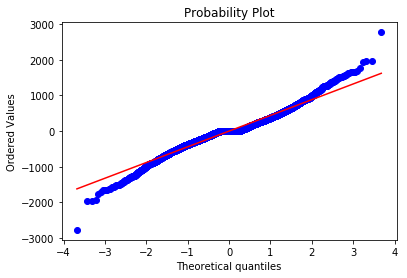

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.2502


   ADC 
Overview of variable:  gdat10 


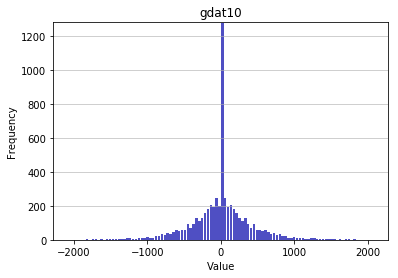

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2073.0
Mean: 0.0
Standard deviation: 425.2741
Median: 0.0
Maximal value: 2073.0


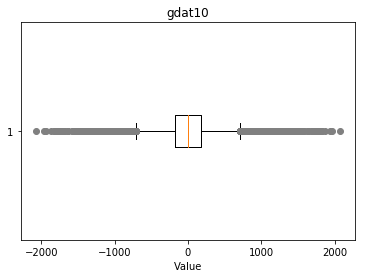

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1535.0, -1528.0, -1526.0, -1521.0, -1519.0, 1555.0, 2073.0, -1511.0, 1563.0, 1564.0, 1576.0, -1495.0, -1496.0, -1491.0, -1483.0, -1472.0, -1453.0, -1964.0, -1450.0, 1628.0, 1632.0, 1643.0, -1938.0, -1423.0, -1410.0, -1406.0, -1402.0, -1399.0, 1690.0, 1691.0, 1701.0, -1362.0, -1361.0, -1861.0, -1343.0, 1732.0, -1333.0, 1751.0, -1317.0, -1828.0, 1757.0, -1305.0, -1813.0, -1811.0, -1297.0, -1292.0, -1289.0, 1788.0, 1277.0, 1278.0, -1281.0, 1281.0, -1278.0, -1277.0, -1788.0, 1289.0, 1292.0, 1297.0, 1811.0, 1813.0, 1305.0, -1757.0, 1828.0, 1317.0, -1751.0, 1333.0, -1732.0, 1343.0, 1861.0, 1361.0, 1362.0, -1701.0, -1691.0, -1690.0, 1399.0, 1402.0, 1406.0, 1410.0, 1423.0, 1938.0, -1643.0, -1632.0, -1628.0, 1450.0, 1964.0, 1453.0, 1472.0, 1483.0, 1491.0, 1495.0, -1576.0, 1496.0, -1564.0, -1563.0, -2073.0, 1511.0, -1555.0, 1519.0, 1521.0, 1526.0, 1528.0, 1535.0}


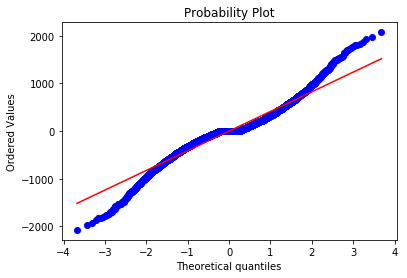

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.9828


   Support 
Overview of variable:  gdat10 


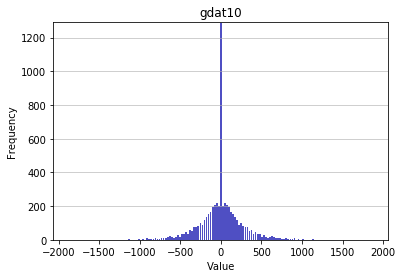

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1877.0
Mean: 0.0
Standard deviation: 264.3175
Median: 0.0
Maximal value: 1877.0


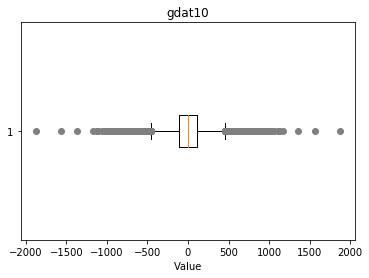

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-895.0, -1021.0, 903.0, -1015.0, -886.0, 911.0, 912.0, -879.0, -1006.0, 915.0, 916.0, -875.0, 919.0, -1128.0, 1177.0, 795.0, -867.0, -994.0, 799.0, 1569.0, 802.0, -861.0, 804.0, 1061.0, 806.0, 807.0, -1877.0, -1363.0, -1106.0, 942.0, -845.0, -840.0, -968.0, -838.0, -835.0, 830.0, 831.0, -833.0, -831.0, -830.0, 833.0, 835.0, -959.0, 959.0, 838.0, 840.0, 968.0, 845.0, 1106.0, 1363.0, -942.0, 1877.0, -807.0, -806.0, -1061.0, -804.0, 861.0, -802.0, -1569.0, -799.0, 994.0, 867.0, -795.0, -1177.0, 1128.0, -919.0, 875.0, -916.0, -915.0, 1006.0, 879.0, -912.0, -911.0, 886.0, 1015.0, -903.0, 1021.0, 895.0}


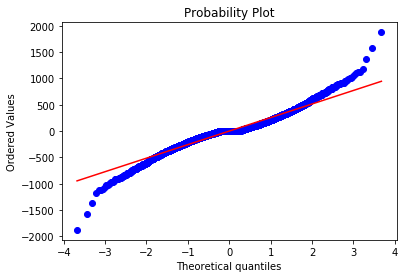

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.3495


   Top 
Overview of variable:  goldat15 


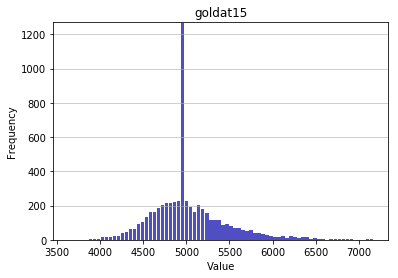

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3634.0
Mean: 5030.9109
Standard deviation: 434.3842
Median: 4979.0
Maximal value: 7167.0


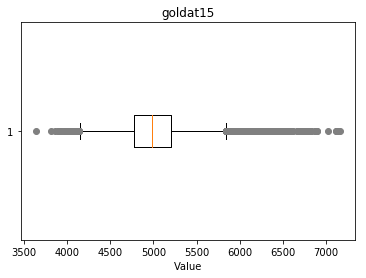

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6664.0, 6666.0, 6673.0, 6690.0, 6695.0, 6697.0, 3634.0, 6707.0, 6717.0, 6719.0, 6751.0, 6754.0, 6761.0, 6775.0, 6778.0, 6788.0, 6796.0, 6821.0, 6823.0, 6829.0, 6834.0, 6336.0, 6337.0, 6338.0, 6339.0, 6341.0, 6343.0, 6350.0, 6351.0, 6353.0, 6355.0, 6356.0, 6357.0, 6360.0, 6875.0, 6876.0, 6370.0, 6373.0, 6375.0, 6378.0, 6380.0, 6381.0, 6894.0, 6383.0, 6903.0, 6391.0, 6393.0, 6395.0, 6399.0, 6403.0, 6406.0, 6415.0, 6417.0, 6418.0, 6421.0, 6425.0, 6426.0, 6430.0, 6434.0, 6437.0, 6457.0, 6468.0, 6470.0, 6471.0, 6472.0, 6478.0, 6488.0, 6494.0, 6498.0, 7022.0, 6510.0, 6514.0, 6518.0, 6522.0, 6540.0, 6560.0, 6571.0, 6577.0, 6585.0, 6599.0, 7117.0, 6606.0, 6608.0, 7133.0, 6621.0, 7138.0, 7167.0}


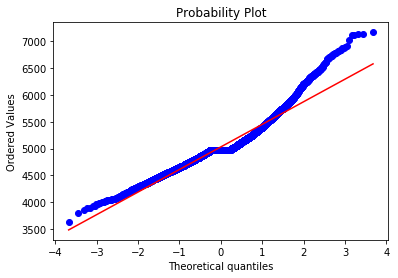

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0032
Kurtosis: 2.191


   Middle 
Overview of variable:  goldat15 


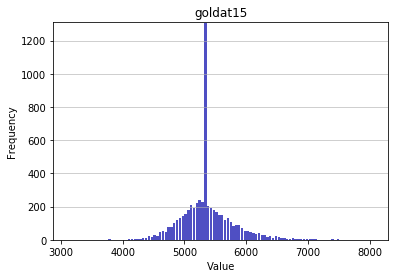

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3123.0
Mean: 5362.6358
Standard deviation: 424.8073
Median: 5324.0
Maximal value: 8054.0


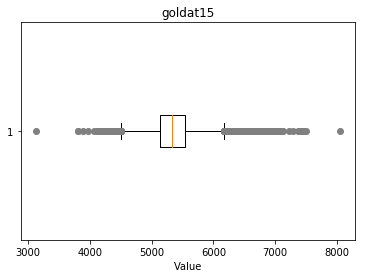

-------------------- 
Outlier detection:
 --------------------
List of outliers: {7040.0, 6914.0, 6917.0, 6663.0, 6665.0, 6921.0, 7049.0, 6924.0, 6795.0, 6937.0, 7065.0, 6684.0, 7070.0, 6816.0, 6689.0, 7457.0, 6691.0, 6817.0, 6693.0, 7082.0, 6699.0, 6700.0, 6954.0, 7472.0, 7088.0, 6704.0, 6835.0, 3892.0, 3123.0, 6838.0, 7224.0, 6975.0, 7104.0, 6848.0, 6847.0, 6980.0, 7493.0, 7366.0, 6727.0, 6983.0, 6730.0, 6735.0, 6867.0, 6997.0, 3961.0, 3801.0, 6747.0, 6748.0, 3805.0, 7134.0, 6751.0, 6752.0, 6880.0, 6746.0, 4066.0, 6892.0, 7022.0, 7407.0, 7026.0, 6643.0, 7413.0, 8054.0, 6647.0, 7289.0, 6651.0, 6654.0}


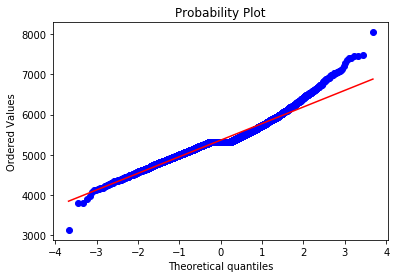

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7378
Kurtosis: 2.3482


   Jungle 
Overview of variable:  goldat15 


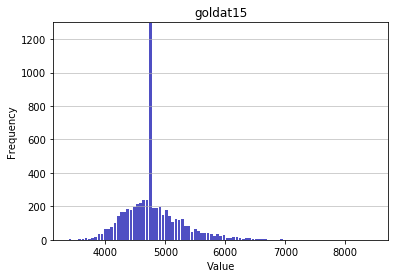

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3387.0
Mean: 4786.3773
Standard deviation: 462.4077
Median: 4732.0
Maximal value: 8465.0


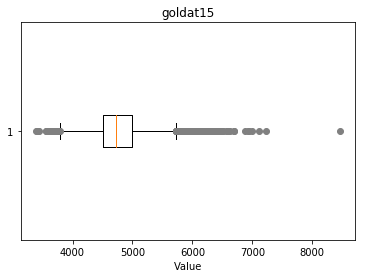

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6400.0, 6401.0, 6282.0, 6285.0, 6927.0, 6289.0, 6418.0, 6419.0, 6420.0, 6421.0, 8465.0, 6553.0, 6433.0, 6180.0, 6693.0, 6182.0, 6951.0, 6184.0, 6699.0, 6445.0, 6190.0, 6197.0, 6454.0, 6326.0, 6456.0, 6201.0, 3387.0, 6204.0, 6331.0, 7229.0, 6203.0, 6208.0, 6209.0, 6594.0, 6338.0, 6340.0, 6214.0, 6343.0, 6601.0, 6218.0, 6220.0, 7117.0, 6352.0, 6480.0, 6359.0, 6999.0, 6621.0, 6238.0, 6367.0, 6237.0, 6370.0, 6499.0, 6500.0, 6883.0, 6246.0, 6253.0, 6509.0, 6386.0, 6262.0, 6265.0, 6267.0}


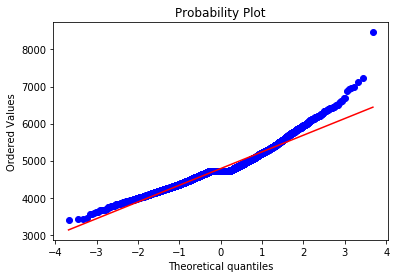

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9115
Kurtosis: 2.1771


   ADC 
Overview of variable:  goldat15 


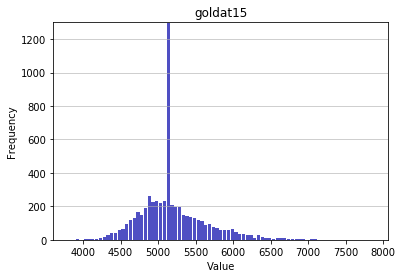

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3804.0
Mean: 5189.8201
Standard deviation: 441.273
Median: 5130.0
Maximal value: 7867.0


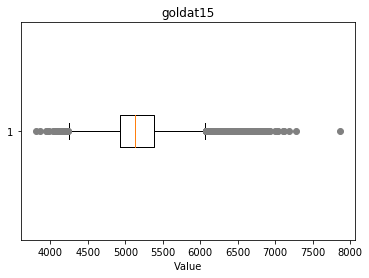

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6658.0, 6659.0, 6921.0, 6540.0, 6541.0, 3857.0, 6802.0, 6675.0, 6804.0, 6933.0, 7189.0, 6552.0, 6810.0, 6684.0, 6685.0, 6814.0, 6815.0, 6558.0, 6818.0, 6563.0, 6819.0, 6693.0, 6569.0, 6573.0, 6574.0, 6704.0, 6833.0, 6708.0, 6709.0, 6584.0, 6713.0, 7867.0, 6716.0, 6591.0, 6848.0, 6594.0, 6724.0, 6598.0, 6599.0, 7111.0, 7110.0, 6606.0, 6735.0, 6607.0, 6994.0, 6739.0, 6870.0, 3804.0, 6620.0, 6876.0, 6880.0, 6625.0, 6627.0, 6633.0, 7274.0, 6763.0, 6638.0, 7022.0, 6767.0, 6639.0, 6518.0, 6904.0, 6651.0, 7036.0, 6782.0, 6655.0}


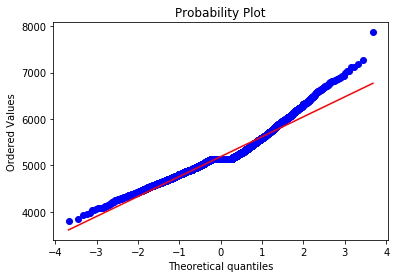

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9042
Kurtosis: 1.7161


   Support 
Overview of variable:  goldat15 


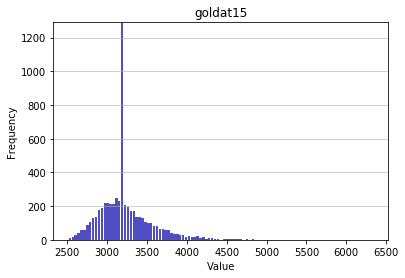

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2514.0
Mean: 3222.6251
Standard deviation: 331.143
Median: 3174.0
Maximal value: 6339.0


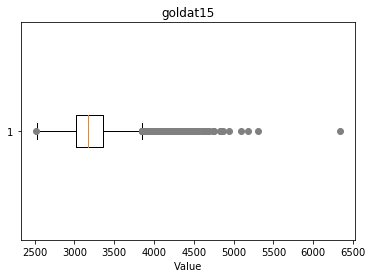

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4225.0, 4351.0, 4229.0, 4743.0, 4616.0, 4233.0, 4232.0, 4360.0, 4490.0, 4872.0, 4494.0, 4735.0, 4752.0, 4624.0, 4242.0, 4628.0, 4374.0, 4633.0, 4634.0, 4252.0, 4511.0, 4512.0, 4385.0, 4257.0, 4515.0, 4388.0, 4260.0, 4391.0, 4265.0, 4273.0, 4274.0, 4659.0, 4276.0, 4277.0, 4406.0, 4407.0, 4279.0, 4667.0, 4285.0, 4542.0, 5183.0, 4672.0, 5311.0, 4287.0, 4291.0, 6339.0, 4293.0, 4553.0, 4298.0, 4426.0, 4556.0, 4942.0, 4695.0, 4824.0, 4311.0, 4315.0, 4216.0, 4317.0, 4322.0, 4452.0, 5093.0, 4453.0, 4328.0, 4329.0, 4584.0, 4330.0, 4332.0, 4333.0, 4841.0, 4335.0, 4467.0, 4339.0, 4348.0, 4471.0, 4344.0, 4473.0, 4218.0, 4220.0, 4349.0, 4223.0}


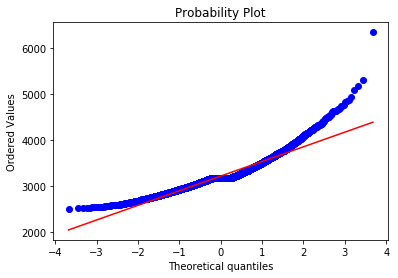

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3154
Kurtosis: 3.9466


   Top 
Overview of variable:  gdat15 


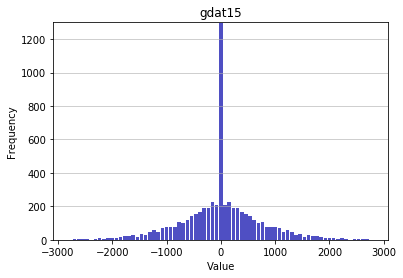

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2808.0
Mean: 0.0
Standard deviation: 725.4386
Median: 0.0
Maximal value: 2808.0


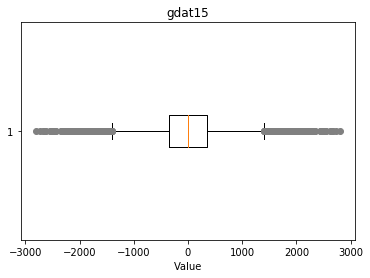

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-2431.0, 2178.0, -2301.0, -2296.0, -2295.0, -2808.0, -2673.0, -2287.0, -2538.0, 2455.0, 2200.0, -2536.0, -2276.0, 2204.0, 2463.0, 2336.0, -2270.0, 2467.0, 2723.0, 2212.0, 2211.0, -2654.0, -2526.0, -2268.0, -2260.0, 2351.0, 2808.0, 2612.0, 2488.0, 2233.0, -2502.0, -2241.0, 2241.0, 2502.0, -2233.0, -2488.0, -2612.0, -2351.0, 2260.0, -2212.0, -2723.0, -2467.0, -2211.0, -2336.0, 2270.0, 2654.0, 2526.0, 2276.0, 2268.0, -2204.0, -2463.0, -2200.0, 2536.0, 2538.0, -2455.0, 2287.0, 2673.0, 2295.0, 2296.0, 2301.0, -2178.0, 2431.0}


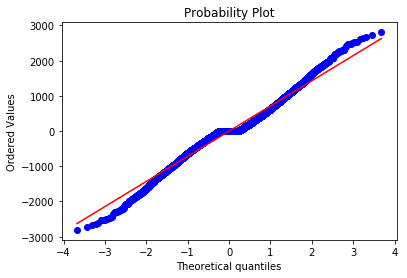

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.2623


   Middle 
Overview of variable:  gdat15 


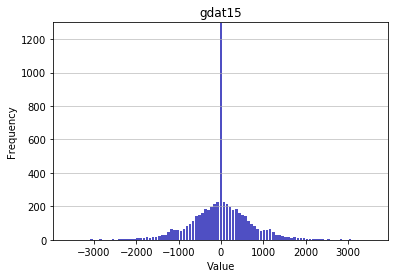

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3601.0
Mean: 0.0
Standard deviation: 678.6859
Median: 0.0
Maximal value: 3601.0


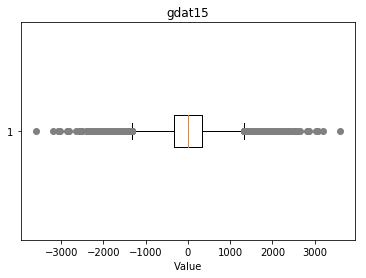

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2048.0, -2303.0, 2050.0, -2175.0, 3204.0, 2821.0, -2554.0, -2048.0, 3080.0, -2036.0, -2419.0, 2320.0, 3601.0, 2066.0, -2160.0, -2284.0, 2580.0, -2536.0, 2841.0, 2075.0, -2274.0, -2273.0, -3038.0, 2343.0, -2137.0, -2647.0, -2129.0, 2865.0, -2253.0, -2125.0, 2233.0, -2374.0, -2116.0, 2175.0, -2496.0, 2496.0, 2116.0, 2374.0, -2233.0, 2253.0, 2125.0, -2865.0, 2129.0, 2647.0, -2343.0, 2137.0, 3038.0, 2273.0, 2274.0, -2075.0, -2841.0, 2536.0, 2284.0, -2580.0, -2066.0, -3601.0, -2320.0, 2160.0, 2419.0, 2036.0, -3080.0, 2554.0, -2821.0, -3204.0, -2050.0, 2303.0}


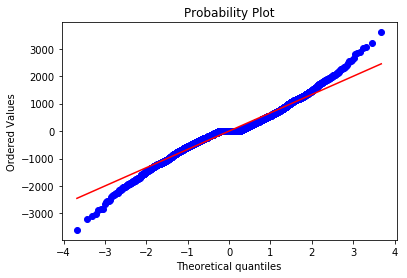

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.0263


   Jungle 
Overview of variable:  gdat15 


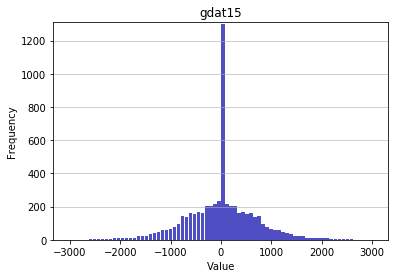

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3029.0
Mean: 0.0
Standard deviation: 694.9875
Median: 0.0
Maximal value: 3029.0


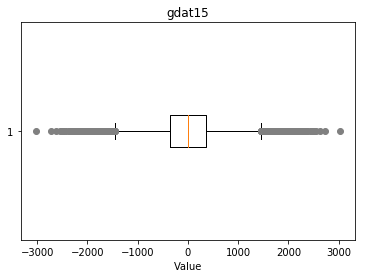

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2304.0, 2305.0, -2304.0, 2308.0, -2553.0, -2167.0, -2421.0, 2189.0, 2190.0, -2161.0, -2160.0, -2284.0, -2152.0, 2201.0, -2149.0, 2463.0, 2336.0, 2210.0, 2338.0, -2135.0, 2090.0, -3029.0, -2516.0, 2093.0, 2730.0, -2129.0, -2255.0, 2485.0, 2232.0, 2361.0, -2118.0, 2108.0, -2627.0, -2498.0, -2113.0, -2369.0, 2113.0, 2498.0, 2627.0, -2108.0, 2369.0, 2118.0, -2361.0, -2232.0, -2485.0, 2255.0, 2129.0, -2093.0, 2516.0, 3029.0, -2090.0, 2135.0, -2730.0, -2210.0, -2338.0, -2336.0, -2463.0, 2149.0, -2201.0, 2152.0, 2284.0, 2160.0, 2161.0, -2190.0, -2189.0, 2421.0, 2167.0, 2553.0, -2308.0, -2305.0}


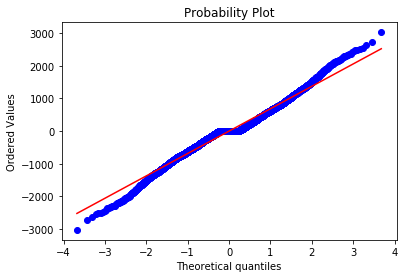

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.3116


   ADC 
Overview of variable:  gdat15 


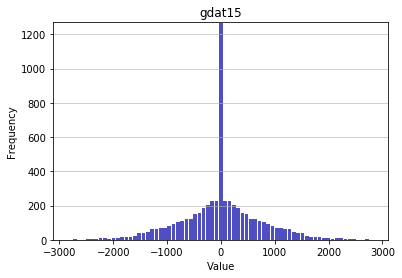

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2833.0
Mean: 0.0
Standard deviation: 736.5514
Median: 0.0
Maximal value: 2833.0


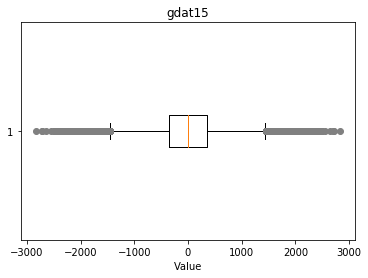

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2433.0, 2307.0, -2546.0, 2833.0, 2321.0, -2414.0, 2709.0, 2714.0, 2331.0, -2270.0, 2466.0, -2267.0, -2265.0, 2344.0, 2472.0, -2647.0, -2385.0, -2255.0, 2230.0, 2360.0, -2371.0, -2243.0, -2241.0, -2499.0, 2241.0, 2494.0, 2371.0, 2243.0, 2499.0, -2494.0, -2360.0, -2230.0, 2255.0, 2385.0, 2647.0, -2472.0, -2344.0, 2265.0, 2267.0, 2270.0, -2466.0, -2331.0, -2714.0, -2709.0, 2414.0, -2833.0, -2321.0, 2546.0, -2307.0, -2433.0}


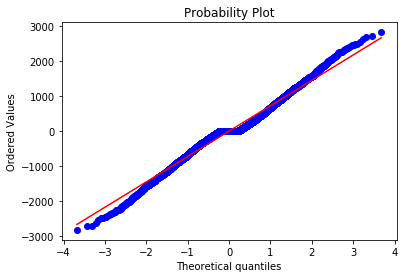

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.998


   Support 
Overview of variable:  gdat15 


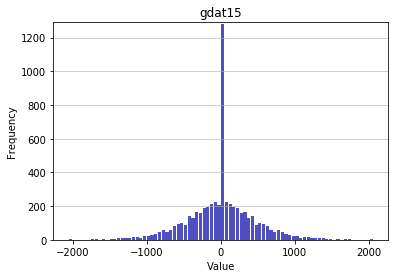

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2063.0
Mean: 0.0
Standard deviation: 453.5073
Median: 0.0
Maximal value: 2063.0


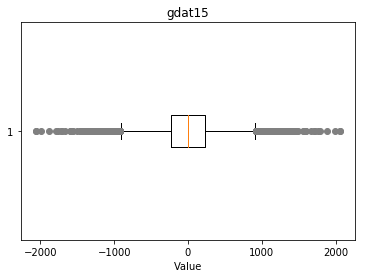

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1408.0, 1665.0, 1408.0, 1412.0, -1403.0, -1785.0, 2061.0, -1394.0, 2063.0, -1388.0, -1385.0, 1431.0, 1564.0, -1761.0, -1376.0, 1442.0, 1446.0, -1498.0, -1880.0, 1576.0, 1448.0, 1710.0, 1582.0, 1585.0, 1718.0, 1467.0, -1989.0, -1600.0, 1600.0, -1467.0, 1989.0, -1718.0, -1585.0, -1710.0, -1582.0, 1880.0, -1576.0, -1446.0, -1448.0, 1498.0, -1442.0, 1376.0, 1761.0, -1564.0, 1385.0, -1431.0, 1388.0, -2063.0, 1394.0, -2061.0, 1785.0, 1403.0, -1412.0, -1665.0}


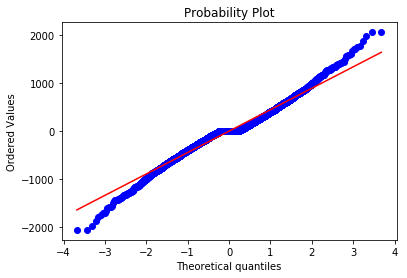

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.5496


   Top 
Overview of variable:  xpat10 


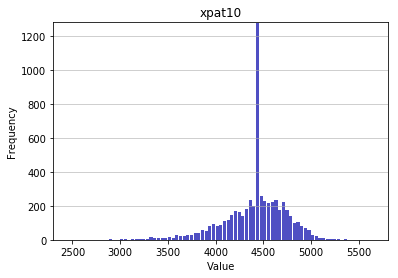

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2457.0
Mean: 4412.6735
Standard deviation: 324.9104
Median: 4450.0
Maximal value: 5653.0


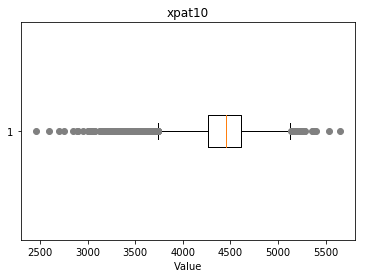

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3201.0, 3331.0, 3332.0, 3079.0, 3208.0, 3338.0, 2955.0, 3340.0, 3341.0, 2702.0, 3345.0, 3346.0, 3219.0, 3349.0, 5653.0, 2457.0, 5402.0, 5532.0, 3359.0, 2849.0, 3234.0, 2600.0, 3368.0, 3370.0, 3371.0, 3372.0, 3373.0, 3245.0, 3375.0, 3376.0, 3378.0, 3251.0, 3252.0, 3126.0, 3384.0, 3001.0, 3388.0, 2748.0, 3135.0, 3010.0, 3397.0, 2888.0, 3403.0, 3276.0, 3405.0, 2895.0, 3407.0, 3412.0, 3285.0, 3028.0, 3418.0, 3163.0, 3036.0, 3421.0, 3167.0, 3423.0, 3169.0, 3170.0, 3300.0, 3429.0, 3050.0, 3308.0, 3053.0, 3182.0, 3184.0, 3315.0, 3065.0, 3325.0}


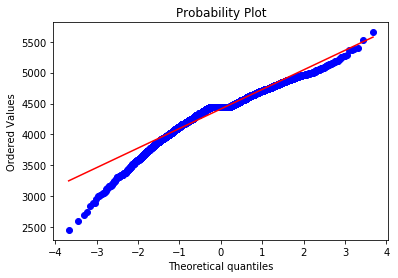

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.9426
Kurtosis: 2.2171


   Middle 
Overview of variable:  xpat10 


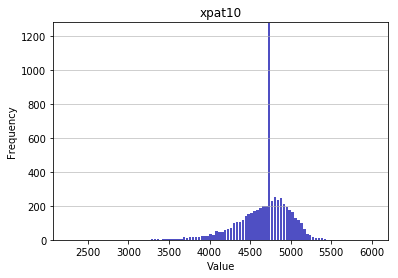

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2259.0
Mean: 4680.7758
Standard deviation: 305.4974
Median: 4722.0
Maximal value: 6021.0


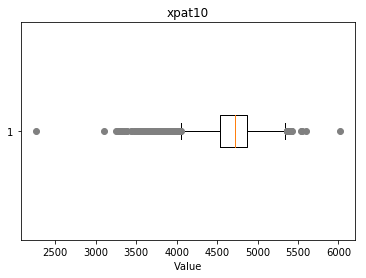

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3585.0, 3713.0, 3715.0, 6021.0, 3723.0, 3596.0, 3726.0, 3727.0, 3731.0, 3733.0, 3606.0, 3352.0, 3609.0, 3096.0, 3484.0, 3741.0, 3486.0, 3744.0, 3493.0, 3622.0, 3623.0, 3626.0, 3758.0, 3632.0, 3760.0, 3761.0, 3251.0, 3379.0, 3510.0, 3385.0, 3514.0, 3644.0, 3517.0, 3650.0, 3655.0, 3529.0, 3659.0, 3704.0, 3278.0, 3536.0, 3281.0, 3282.0, 2259.0, 3670.0, 3673.0, 3676.0, 3292.0, 5598.0, 3553.0, 3555.0, 3684.0, 3685.0, 3687.0, 3304.0, 3693.0, 3309.0, 3439.0, 3694.0, 3570.0, 3444.0, 3702.0, 3576.0, 3705.0, 3322.0, 3708.0, 3710.0}


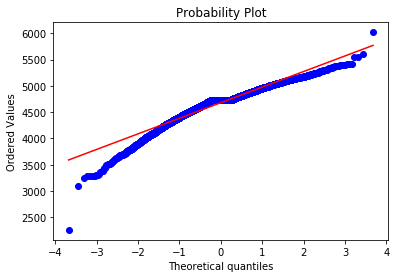

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.0194
Kurtosis: 2.4406


   Jungle 
Overview of variable:  xpat10 


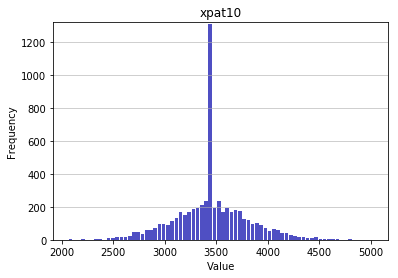

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2063.0
Mean: 3451.7977
Standard deviation: 354.6223
Median: 3448.0
Maximal value: 5026.0


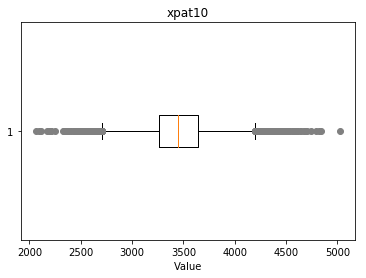

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4609.0, 4610.0, 4739.0, 2190.0, 2063.0, 2323.0, 2198.0, 4631.0, 2207.0, 4640.0, 2337.0, 5026.0, 4516.0, 2214.0, 2353.0, 2099.0, 4789.0, 4534.0, 2361.0, 2364.0, 4675.0, 2117.0, 4681.0, 2251.0, 4687.0, 2387.0, 4820.0, 4568.0, 4571.0, 4574.0, 4705.0, 4839.0, 2174.0}


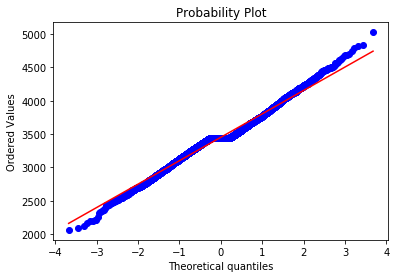

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0683
Kurtosis: 0.896


   ADC 
Overview of variable:  xpat10 


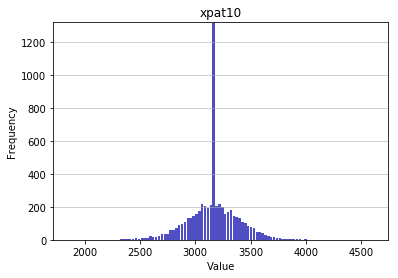

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1853.0
Mean: 3161.9201
Standard deviation: 227.4849
Median: 3164.0
Maximal value: 4610.0


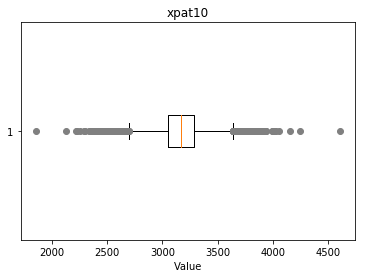

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2433.0, 4610.0, 2435.0, 2440.0, 3848.0, 2444.0, 3853.0, 3858.0, 2451.0, 3862.0, 2455.0, 4246.0, 2457.0, 3994.0, 2459.0, 2460.0, 2461.0, 2334.0, 2458.0, 2464.0, 4001.0, 4002.0, 2468.0, 2213.0, 2344.0, 2473.0, 4010.0, 3884.0, 2350.0, 2355.0, 2230.0, 2365.0, 2302.0, 4157.0, 3904.0, 4033.0, 2370.0, 3907.0, 3908.0, 2373.0, 1853.0, 3911.0, 3913.0, 2249.0, 3919.0, 2128.0, 2387.0, 2392.0, 4057.0, 3933.0, 3934.0, 3935.0, 2400.0, 2401.0, 2408.0, 2411.0, 2286.0, 2415.0, 2419.0, 2420.0, 2430.0}


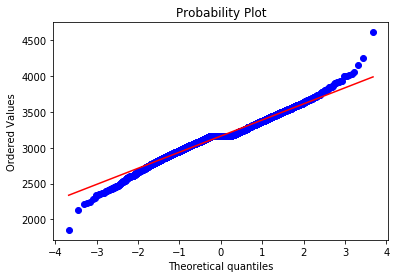

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0993
Kurtosis: 1.6934


   Support 
Overview of variable:  xpat10 


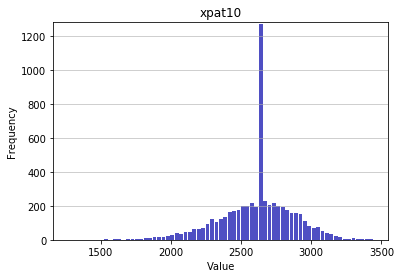

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1270.0
Mean: 2609.9603
Standard deviation: 259.832
Median: 2626.0
Maximal value: 3443.0


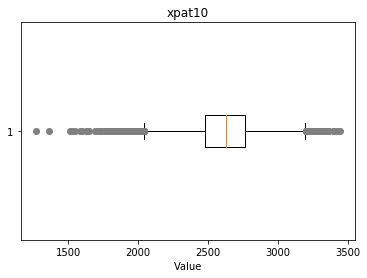

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1793.0, 1804.0, 1806.0, 1553.0, 1810.0, 1813.0, 1816.0, 1817.0, 1690.0, 1819.0, 1818.0, 1822.0, 1702.0, 1588.0, 1720.0, 1598.0, 3392.0, 1728.0, 3399.0, 1746.0, 1366.0, 3417.0, 1631.0, 1763.0, 1512.0, 1641.0, 1773.0, 1523.0, 3443.0, 1653.0, 1270.0, 1783.0, 1532.0, 1790.0}


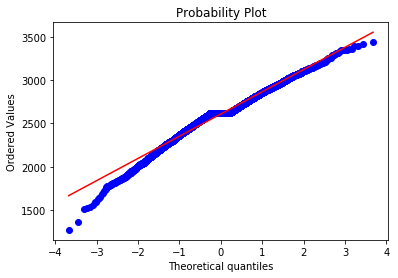

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.4572
Kurtosis: 0.966


   Top 
Overview of variable:  xpdat10 


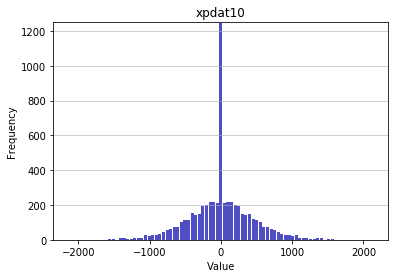

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2140.0
Mean: 0.0
Standard deviation: 439.3459
Median: 0.0
Maximal value: 2140.0


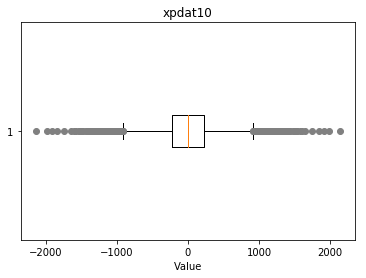

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1536.0, -1407.0, 1536.0, -1405.0, -1406.0, 1411.0, -1911.0, -1525.0, 1420.0, 1425.0, -1645.0, 1429.0, -1383.0, -1505.0, -1373.0, -2140.0, -1369.0, 1321.0, -1366.0, 1578.0, 1324.0, 1837.0, -1490.0, -1361.0, -1740.0, -1355.0, 1335.0, 1336.0, -1352.0, -1478.0, -1989.0, -1600.0, 1600.0, -1411.0, 1478.0, 1989.0, -1336.0, -1335.0, 1352.0, 1355.0, 1740.0, 1361.0, 1490.0, -1837.0, -1324.0, 1366.0, -1321.0, -1578.0, 1369.0, 2140.0, 1373.0, 1505.0, 1383.0, -1429.0, 1645.0, -1425.0, -1420.0, 1525.0, 1911.0, 1405.0, 1406.0, 1407.0}


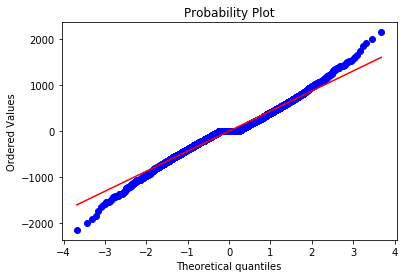

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.4312


   Middle 
Overview of variable:  xpdat10 


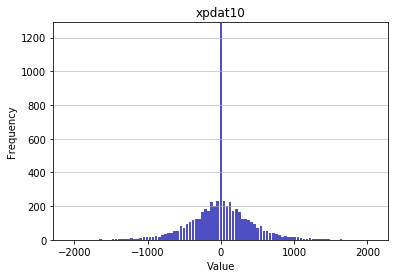

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2080.0
Mean: 0.0
Standard deviation: 401.9506
Median: 0.0
Maximal value: 2080.0


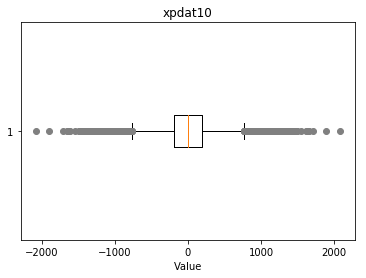

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1543.0, 2080.0, -1491.0, -1484.0, 1613.0, -1448.0, -1446.0, 1629.0, 1635.0, 1636.0, -1424.0, 1655.0, -1414.0, -1412.0, -1410.0, -1405.0, -1401.0, -1382.0, -1893.0, -1380.0, -1368.0, -1364.0, 1708.0, -1355.0, 1207.0, 1208.0, 1215.0, 1219.0, 1220.0, 1227.0, 1233.0, -1326.0, 1235.0, 1237.0, -1320.0, 1242.0, 1246.0, -1302.0, 1262.0, 1263.0, 1266.0, 1272.0, -1287.0, 1287.0, -1272.0, -1266.0, -1263.0, -1262.0, 1302.0, -1246.0, -1242.0, 1320.0, -1237.0, -1235.0, 1326.0, -1233.0, -1227.0, -1220.0, -1219.0, -1215.0, -1208.0, -1207.0, 1355.0, 1364.0, -1708.0, 1368.0, 1380.0, 1893.0, 1382.0, 1401.0, 1405.0, 1410.0, 1412.0, 1414.0, -1655.0, 1424.0, -1636.0, -1635.0, -1629.0, 1446.0, 1448.0, -1613.0, 1484.0, 1491.0, -2080.0, -1543.0}


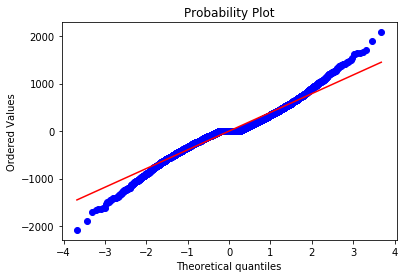

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.1421


   Jungle 
Overview of variable:  xpdat10 


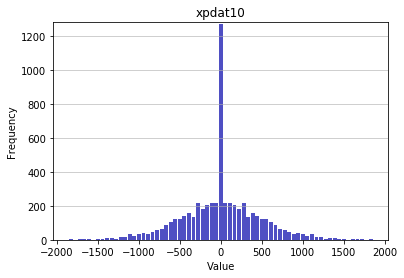

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1860.0
Mean: 0.0
Standard deviation: 476.6474
Median: 0.0
Maximal value: 1860.0


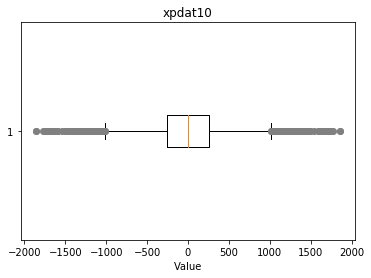

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1544.0, -1778.0, 1678.0, -1649.0, 1432.0, 1690.0, 1436.0, 1695.0, 1445.0, 1446.0, -1497.0, -1494.0, 1707.0, -1622.0, -1744.0, 1586.0, -1486.0, -1481.0, -1479.0, -1860.0, 1853.0, -1603.0, 1728.0, -1728.0, 1603.0, -1853.0, 1860.0, 1479.0, 1481.0, -1586.0, 1486.0, 1744.0, -1707.0, 1494.0, 1622.0, 1497.0, -1446.0, -1445.0, -1695.0, -1436.0, -1690.0, -1432.0, 1649.0, 1778.0, -1678.0, -1544.0}


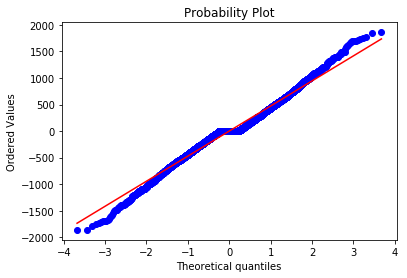

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.0614


   ADC 
Overview of variable:  xpdat10 


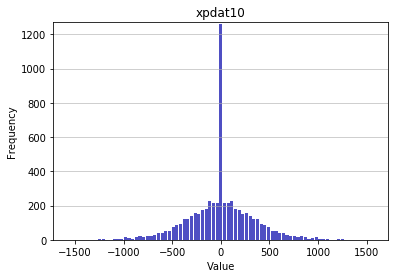

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1568.0
Mean: 0.0
Standard deviation: 333.3217
Median: 0.0
Maximal value: 1568.0


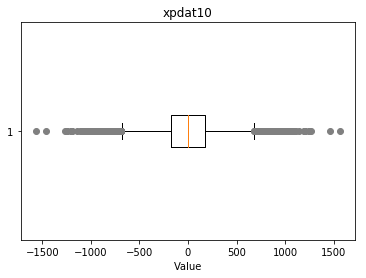

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1028.0, 1029.0, -1146.0, 1031.0, -1013.0, -1010.0, -1265.0, -1005.0, 1044.0, -1000.0, 1568.0, 1059.0, 1061.0, -1243.0, 1192.0, -1112.0, 1195.0, 1069.0, 1072.0, 1203.0, 1460.0, -1097.0, 1207.0, -1093.0, 1085.0, -1085.0, 1093.0, 1097.0, -1207.0, -1460.0, -1203.0, -1072.0, -1069.0, -1195.0, -1192.0, 1112.0, 1243.0, -1061.0, -1059.0, -1568.0, 1000.0, -1044.0, 1005.0, 1265.0, 1010.0, 1013.0, -1031.0, 1146.0, -1029.0, -1028.0}


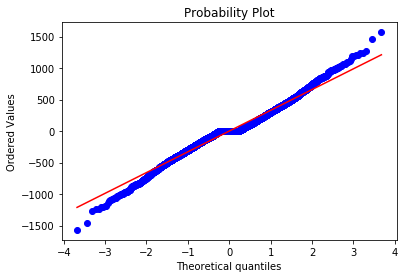

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.3241


   Support 
Overview of variable:  xpdat10 


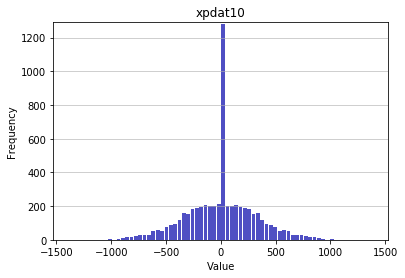

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1391.0
Mean: 0.0
Standard deviation: 316.1817
Median: 0.0
Maximal value: 1391.0


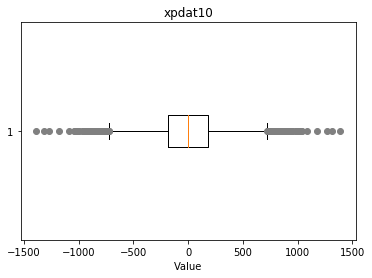

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1016.0, 1033.0, -1268.0, 1039.0, -1391.0, -1003.0, 1177.0, -999.0, 1319.0, -973.0, 953.0, -1090.0, 1090.0, -953.0, 973.0, -1319.0, 999.0, -1177.0, 1003.0, 1391.0, -1039.0, 1268.0, -1033.0, 1016.0}


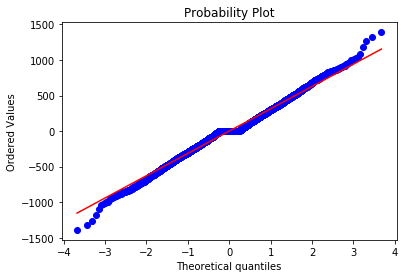

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.751


   Top 
Overview of variable:  csat10 


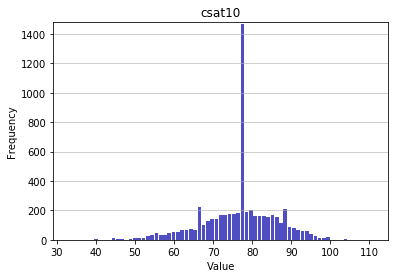

-------------------- 
Summary statistics:
 --------------------
Minimum value: 33.0
Mean: 76.6071
Standard deviation: 9.3724
Median: 77.0
Maximal value: 111.0


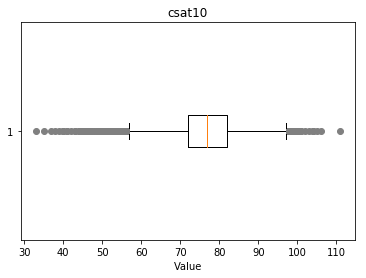

-------------------- 
Outlier detection:
 --------------------
List of outliers: {33.0, 35.0, 37.0, 38.0, 39.0, 40.0, 41.0, 105.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 42.0, 106.0, 111.0}


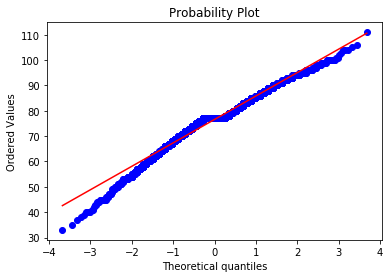

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.4729
Kurtosis: 0.9237


   Middle 
Overview of variable:  csat10 


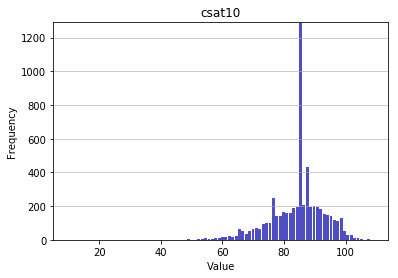

-------------------- 
Summary statistics:
 --------------------
Minimum value: 10.0
Mean: 84.3264
Standard deviation: 8.6197
Median: 85.0
Maximal value: 109.0


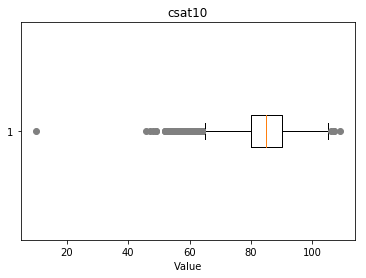

-------------------- 
Outlier detection:
 --------------------
List of outliers: {10.0, 46.0, 47.0, 48.0, 49.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0}


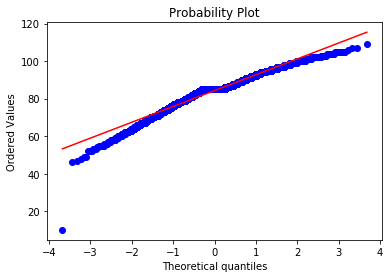

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.7304
Kurtosis: 1.7167


   Jungle 
Overview of variable:  csat10 


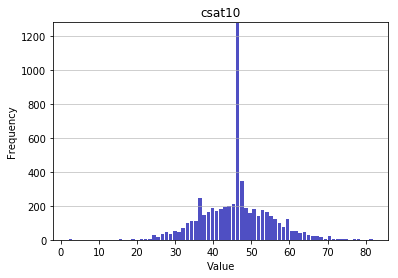

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 46.009
Standard deviation: 8.6661
Median: 46.0
Maximal value: 82.0


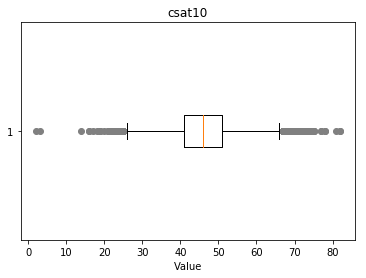

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 73.0, 74.0, 75.0, 77.0, 78.0, 14.0, 16.0, 81.0, 18.0, 19.0, 17.0, 20.0, 82.0}


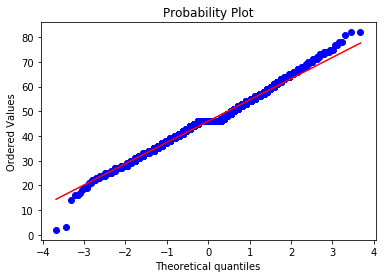

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1257
Kurtosis: 0.7859


   ADC 
Overview of variable:  csat10 


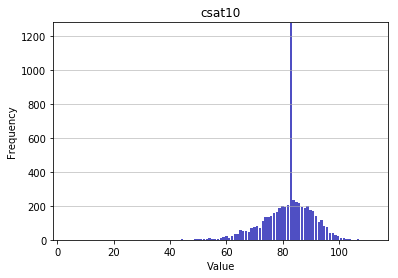

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4.0
Mean: 82.1702
Standard deviation: 8.419
Median: 83.0
Maximal value: 112.0


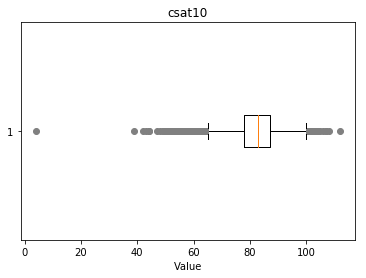

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 39.0, 42.0, 43.0, 44.0, 108.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 112.0}


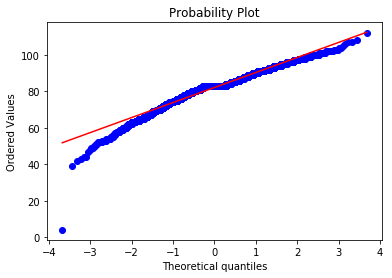

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.7796
Kurtosis: 2.3815


   Support 
Overview of variable:  csat10 


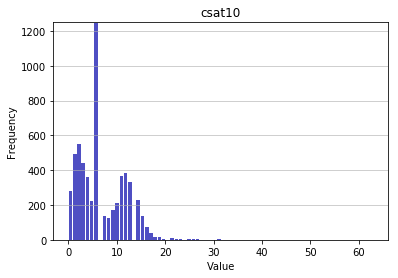

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 6.8496
Standard deviation: 4.8515
Median: 6.0
Maximal value: 63.0


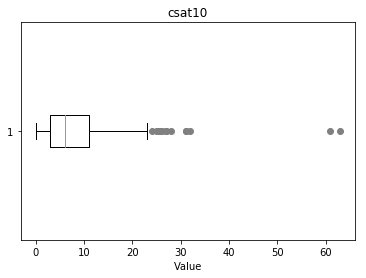

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 61.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 63.0, 31.0}


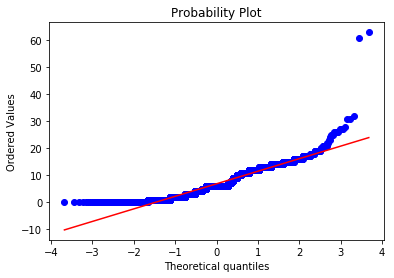

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0578
Kurtosis: 5.4067


   Top 
Overview of variable:  csdat10 


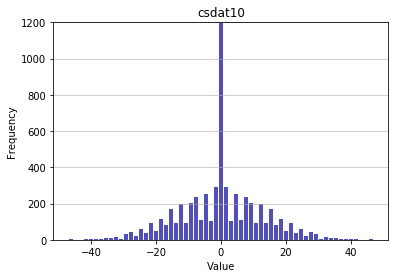

-------------------- 
Summary statistics:
 --------------------
Minimum value: -47.0
Mean: 0.0
Standard deviation: 12.7912
Median: 0.0
Maximal value: 47.0


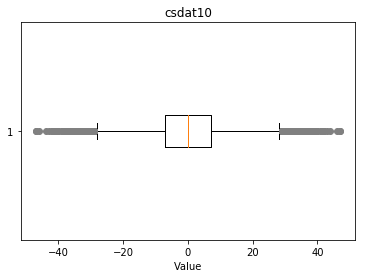

-------------------- 
Outlier detection:
 --------------------
List of outliers: {39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 46.0, 47.0, -47.0, -46.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0}


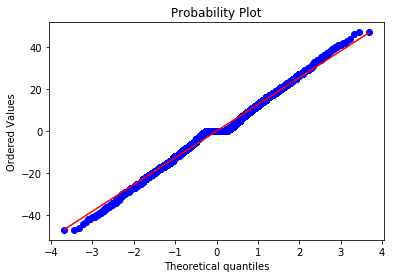

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.5096


   Middle 
Overview of variable:  csdat10 


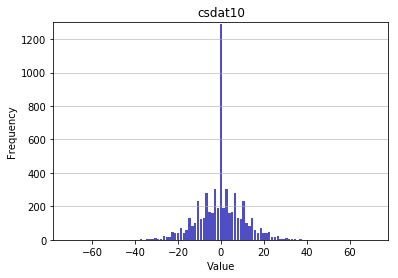

-------------------- 
Summary statistics:
 --------------------
Minimum value: -71.0
Mean: 0.0
Standard deviation: 10.4404
Median: 0.0
Maximal value: 71.0


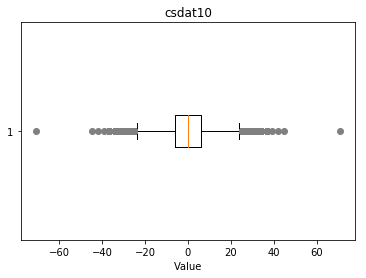

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, -32.0, 34.0, 33.0, 37.0, 39.0, 71.0, -71.0, 42.0, 45.0, -45.0, -42.0, -39.0, -37.0, -34.0, -33.0}


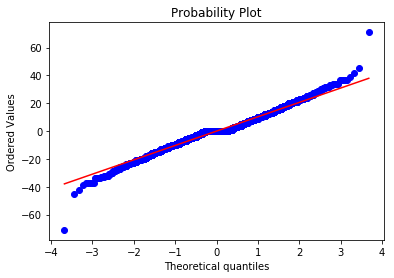

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.6224


   Jungle 
Overview of variable:  csdat10 


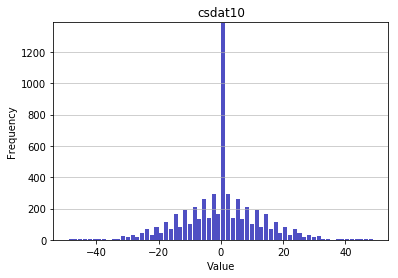

-------------------- 
Summary statistics:
 --------------------
Minimum value: -49.0
Mean: 0.0
Standard deviation: 12.2719
Median: 0.0
Maximal value: 49.0


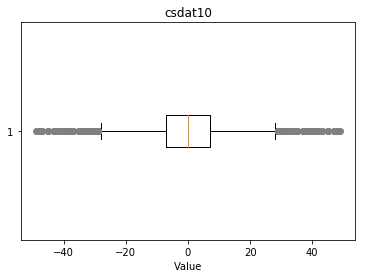

-------------------- 
Outlier detection:
 --------------------
List of outliers: {37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 45.0, 47.0, 48.0, 49.0, -49.0, -48.0, -47.0, -45.0, -43.0, -42.0, -41.0, -40.0, -39.0, -38.0, -37.0}


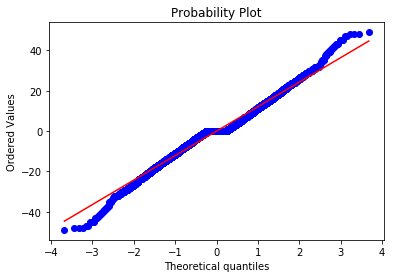

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.0661


   ADC 
Overview of variable:  csdat10 


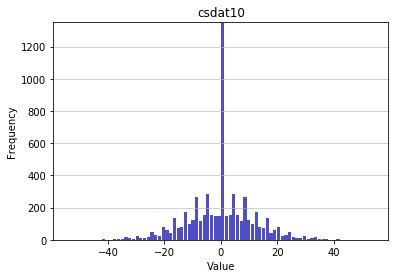

-------------------- 
Summary statistics:
 --------------------
Minimum value: -54.0
Mean: 0.0
Standard deviation: 11.4599
Median: 0.0
Maximal value: 54.0


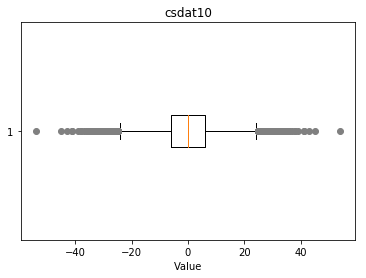

-------------------- 
Outlier detection:
 --------------------
List of outliers: {35.0, 36.0, 37.0, 38.0, 39.0, 41.0, -54.0, 43.0, 45.0, -45.0, -43.0, 54.0, -41.0, -39.0, -38.0, -37.0, -36.0, -35.0}


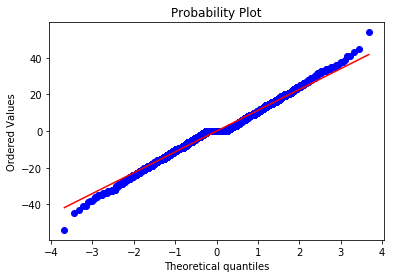

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.834


   Support 
Overview of variable:  csdat10 


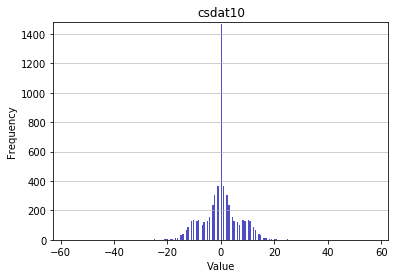

-------------------- 
Summary statistics:
 --------------------
Minimum value: -57.0
Mean: 0.0
Standard deviation: 6.5913
Median: 0.0
Maximal value: 57.0


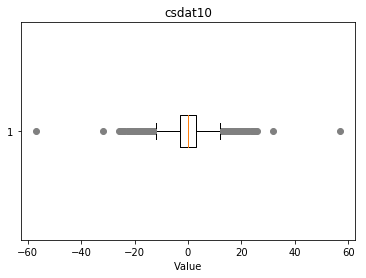

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, -32.0, -26.0, -25.0, -24.0, -23.0, -22.0, -21.0, -20.0, -57.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 57.0}


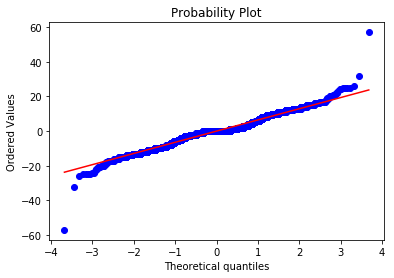

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.5881


   Top 
Overview of variable:  csat15 


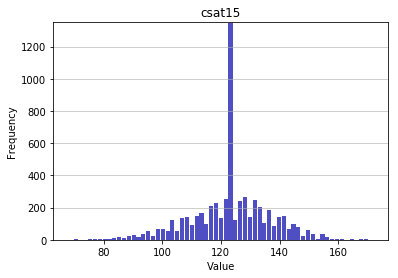

-------------------- 
Summary statistics:
 --------------------
Minimum value: 68.0
Mean: 123.2907
Standard deviation: 13.5955
Median: 124.0
Maximal value: 172.0


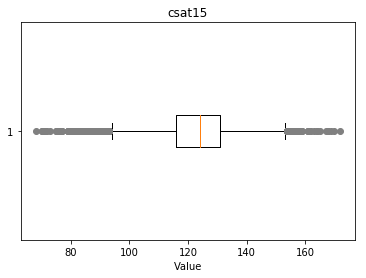

-------------------- 
Outlier detection:
 --------------------
List of outliers: {68.0, 165.0, 70.0, 167.0, 168.0, 73.0, 170.0, 75.0, 72.0, 77.0, 76.0, 79.0, 80.0, 81.0, 82.0, 172.0, 169.0, 71.0}


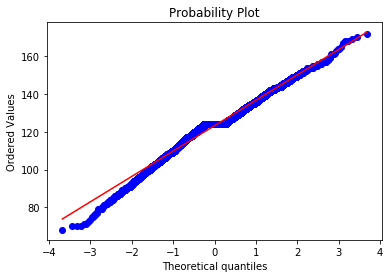

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.3257
Kurtosis: 0.7302


   Middle 
Overview of variable:  csat15 


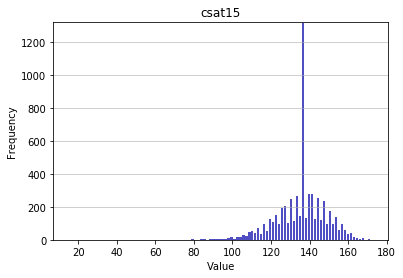

-------------------- 
Summary statistics:
 --------------------
Minimum value: 15.0
Mean: 135.5256
Standard deviation: 12.6635
Median: 136.0
Maximal value: 173.0


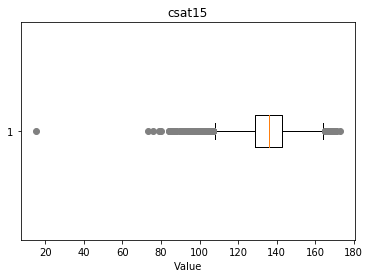

-------------------- 
Outlier detection:
 --------------------
List of outliers: {96.0, 97.0, 73.0, 76.0, 79.0, 80.0, 15.0, 84.0, 85.0, 86.0, 88.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0}


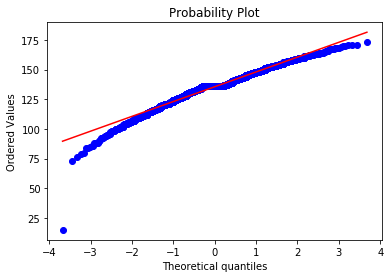

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.628
Kurtosis: 2.1955


   Jungle 
Overview of variable:  csat15 


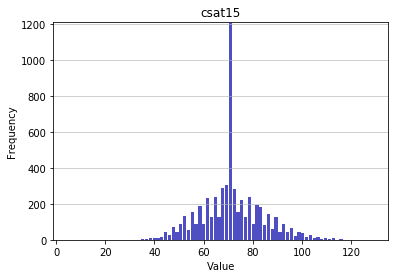

-------------------- 
Summary statistics:
 --------------------
Minimum value: 5.0
Mean: 71.428
Standard deviation: 12.4662
Median: 71.0
Maximal value: 129.0


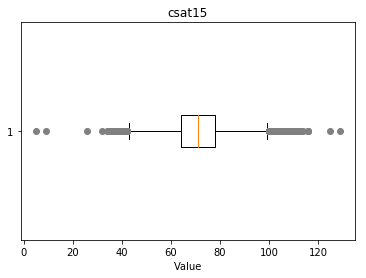

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 129.0, 34.0, 5.0, 9.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 116.0, 26.0, 125.0}


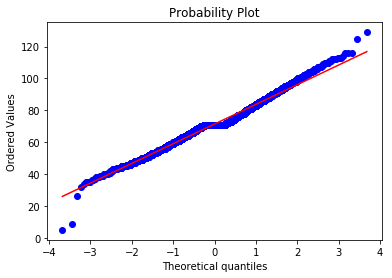

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.225
Kurtosis: 0.7644


   ADC 
Overview of variable:  csat15 


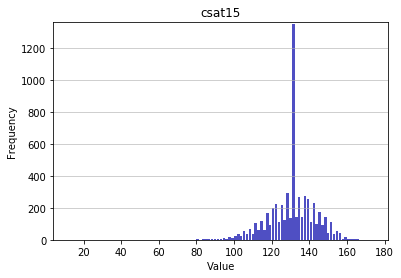

-------------------- 
Summary statistics:
 --------------------
Minimum value: 12.0
Mean: 130.638
Standard deviation: 12.3336
Median: 131.0
Maximal value: 174.0


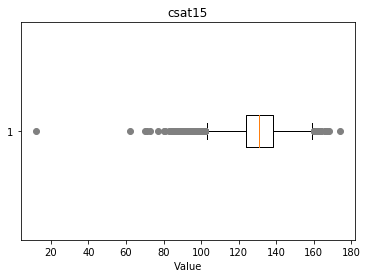

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 168.0, 174.0, 62.0, 70.0, 71.0, 73.0, 77.0, 80.0, 81.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0}


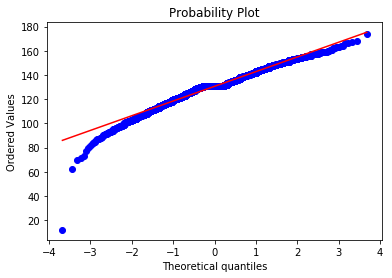

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.6177
Kurtosis: 2.3455


   Support 
Overview of variable:  csat15 


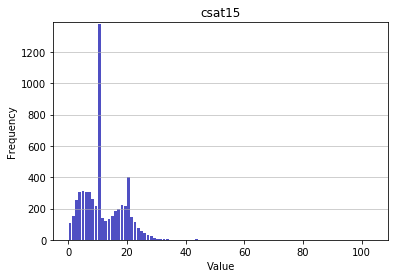

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 11.9296
Standard deviation: 6.8941
Median: 11.0
Maximal value: 104.0


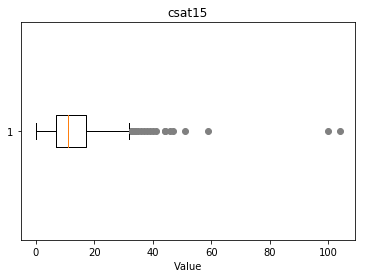

-------------------- 
Outlier detection:
 --------------------
List of outliers: {33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 104.0, 100.0, 44.0, 46.0, 47.0, 51.0, 59.0}


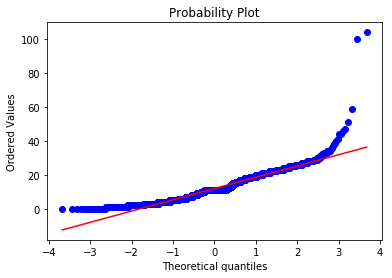

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3447
Kurtosis: 10.0948


   Top 
Overview of variable:  csdat15 


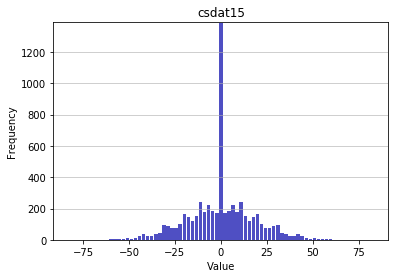

-------------------- 
Summary statistics:
 --------------------
Minimum value: -83.0
Mean: 0.0
Standard deviation: 17.9394
Median: 0.0
Maximal value: 83.0


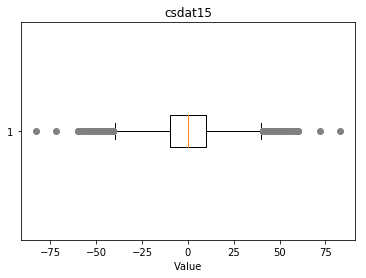

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-60.0, -59.0, -58.0, -56.0, 72.0, -54.0, -55.0, -83.0, 83.0, 55.0, 54.0, -72.0, 56.0, 58.0, 59.0, 60.0}


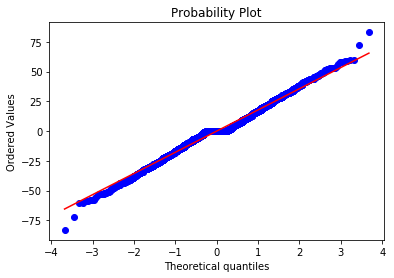

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.6859


   Middle 
Overview of variable:  csdat15 


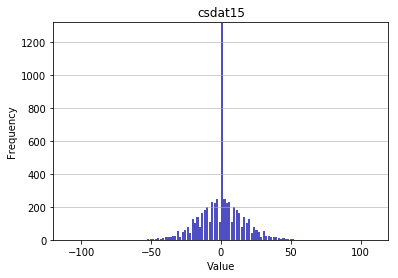

-------------------- 
Summary statistics:
 --------------------
Minimum value: -109.0
Mean: 0.0
Standard deviation: 15.0933
Median: 0.0
Maximal value: 109.0


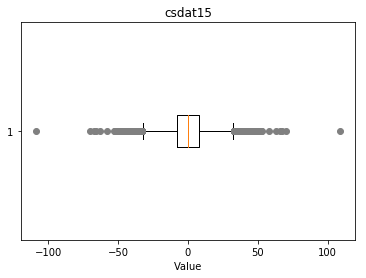

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-109.0, 46.0, 47.0, 48.0, 49.0, 50.0, 52.0, 53.0, 58.0, -70.0, -67.0, -66.0, 63.0, -63.0, 66.0, 67.0, 70.0, -58.0, -53.0, -52.0, -50.0, -49.0, -48.0, -47.0, -46.0, 109.0}


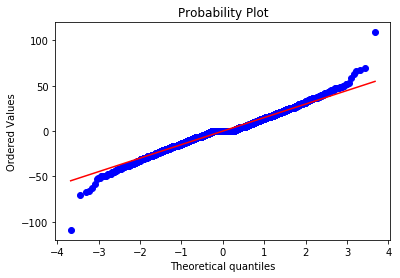

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.9396


   Jungle 
Overview of variable:  csdat15 


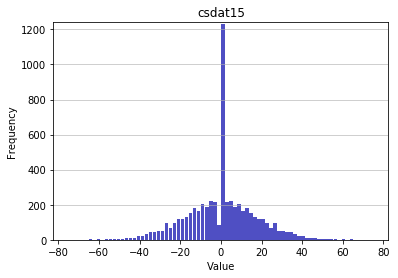

-------------------- 
Summary statistics:
 --------------------
Minimum value: -75.0
Mean: 0.0
Standard deviation: 17.1238
Median: 0.0
Maximal value: 75.0


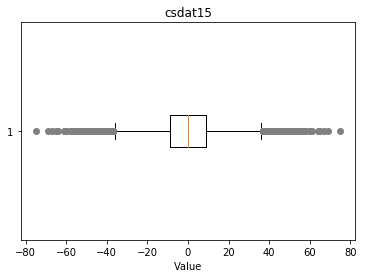

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-69.0, 52.0, 53.0, 54.0, 55.0, -75.0, 57.0, 56.0, 58.0, 60.0, -67.0, 61.0, -65.0, 64.0, 65.0, -64.0, 67.0, -60.0, -61.0, -58.0, -57.0, -56.0, -55.0, -54.0, -53.0, -52.0, 75.0, 69.0}


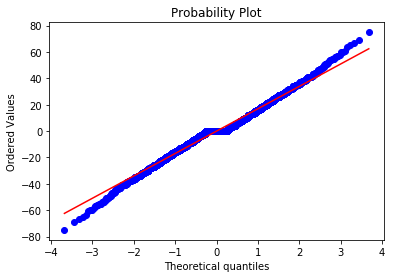

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.8983


   ADC 
Overview of variable:  csdat15 


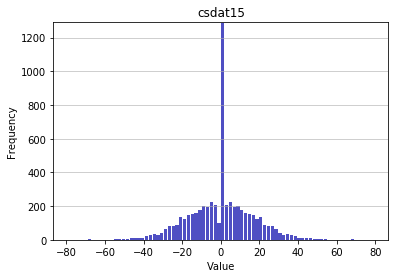

-------------------- 
Summary statistics:
 --------------------
Minimum value: -79.0
Mean: 0.0
Standard deviation: 16.071
Median: 0.0
Maximal value: 79.0


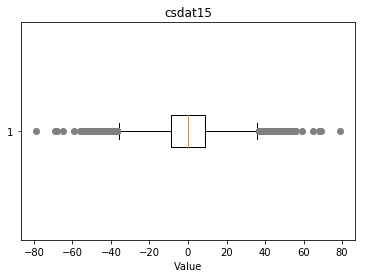

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-79.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 49.0, 59.0, -69.0, -68.0, -65.0, 65.0, 68.0, 69.0, -59.0, -56.0, -55.0, -54.0, -53.0, -52.0, -51.0, -50.0, 79.0, -49.0}


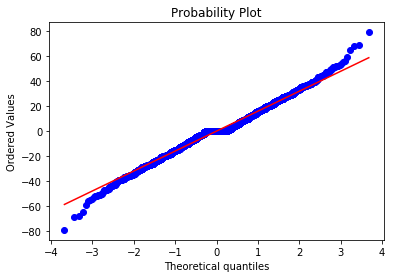

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.8673


   Support 
Overview of variable:  csdat15 


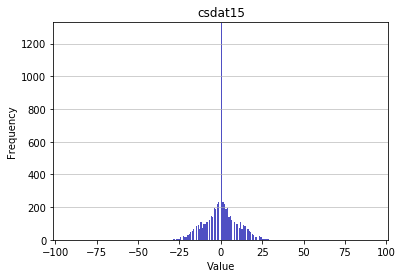

-------------------- 
Summary statistics:
 --------------------
Minimum value: -92.0
Mean: 0.0
Standard deviation: 9.3921
Median: 0.0
Maximal value: 92.0


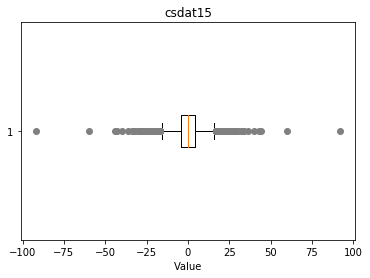

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29.0, 30.0, 32.0, 33.0, 34.0, 36.0, -92.0, 40.0, 43.0, 44.0, 60.0, -60.0, -44.0, -43.0, -40.0, 92.0, -36.0, -34.0, -33.0, -32.0, -30.0, -29.0}


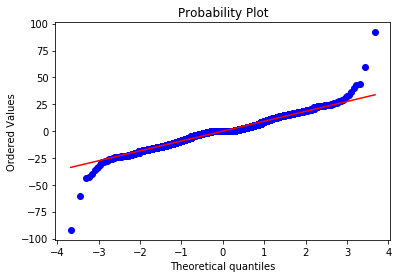

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 4.2316


   Top 
Overview of variable:  Encoded_champion 


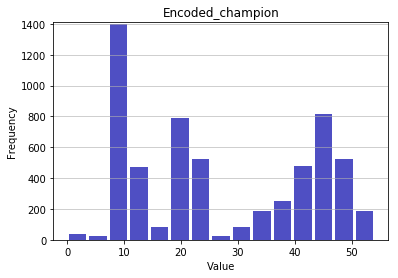

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 27.2312
Standard deviation: 15.5978
Median: 24.0
Maximal value: 54


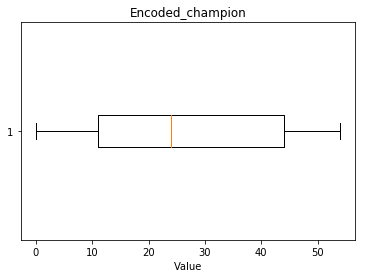

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


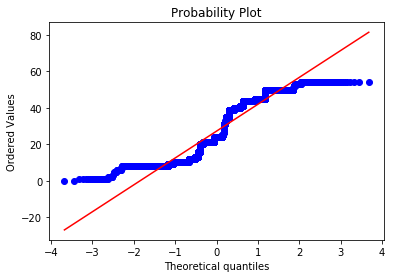

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1751
Kurtosis: -1.4792


   Middle 
Overview of variable:  Encoded_champion 


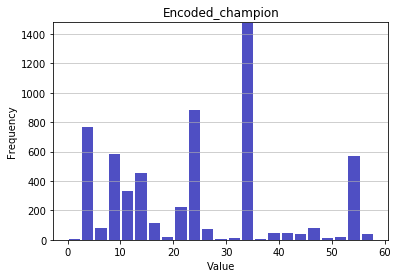

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 24.538
Standard deviation: 15.4218
Median: 23.0
Maximal value: 58


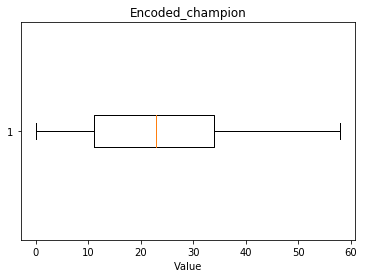

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


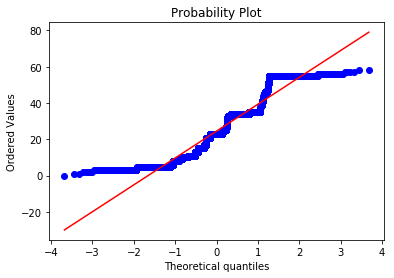

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4829
Kurtosis: -0.6847


   Jungle 
Overview of variable:  Encoded_champion 


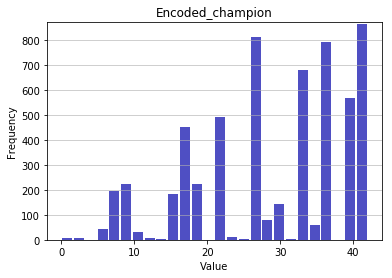

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 28.9257
Standard deviation: 10.4416
Median: 33.0
Maximal value: 42


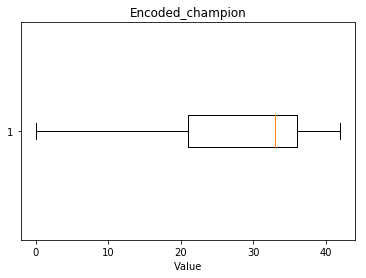

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


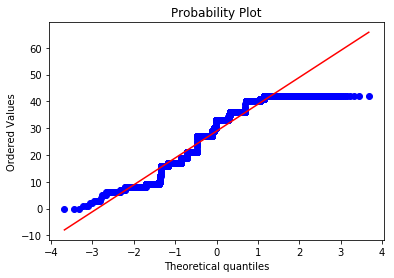

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.4986
Kurtosis: -0.8251


   ADC 
Overview of variable:  Encoded_champion 


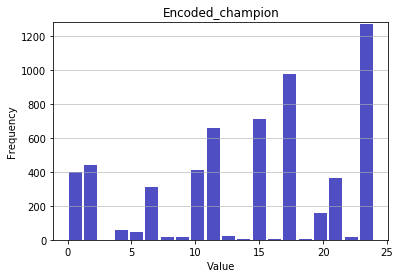

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 14.2695
Standard deviation: 7.5774
Median: 15.0
Maximal value: 24


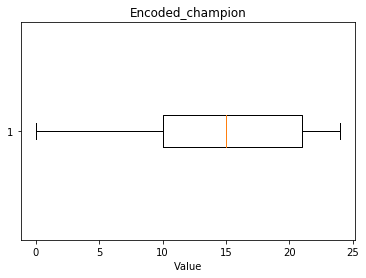

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


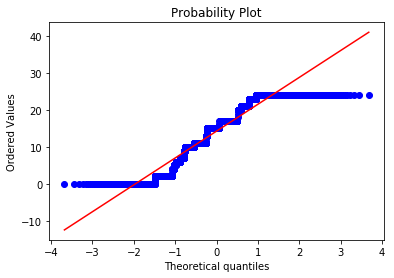

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.3978
Kurtosis: -0.9128


   Support 
Overview of variable:  Encoded_champion 


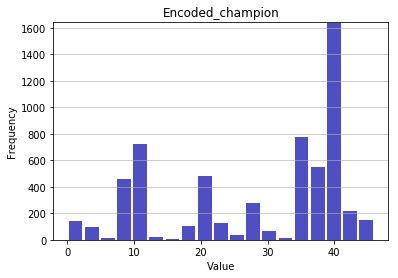

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 28.3637
Standard deviation: 13.2745
Median: 36.0
Maximal value: 46


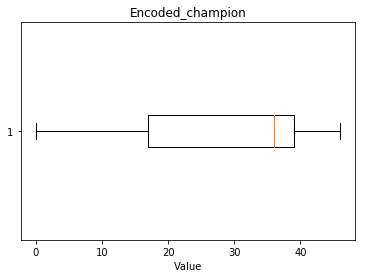

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


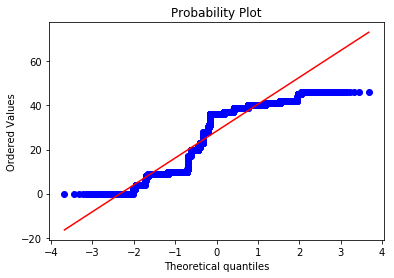

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.6233
Kurtosis: -1.156


<Figure size 432x288 with 0 Axes>

In [16]:
# Loop through all numerical variables and visualize data
for num_variable in numerical_variables:
    # Only plot features that different between the positions
    x = [set(data_dict[pos][num_variable]) for pos in data_dict]
    if x.count(x[0]) != len(x):
        for pos, df in data_dict.items():
            print("\n\n","="*10, "\n  ", pos, "\n", "="*10)
            SummaryNumericVar(df[num_variable].dropna(), num_variable)

##### Remove irrelevant features for further analysis
* Impossible column values are removed (gamelength of zero).
* Features with zero or near zero variance (<0.05) for categorical encoders were removed (because of their redundancy in further analysis). Note here that not all numerical features with a variance smaller than 0.05 were removed from analysis, because standardization is not considered yet.
* Extreme outliers

In [17]:
# Remove redundant features
data_dict['Top'] = data_dict['Top'].drop(['quadras', 'pentas'], axis = 1)
data_dict['Middle'] = data_dict['Middle'].drop(['pentas'], axis = 1)
data_dict['Jungle'] = data_dict['Jungle'].drop(['quadras'], axis = 1)
data_dict['ADC'] = data_dict['ADC'].drop(['quadras', 'pentas'], axis = 1)
data_dict['Support'] = data_dict['Support'].drop(['triples', 'quadras', 'pentas'], axis = 1)
for pos, df in data_dict.items():
    data_dict[pos] = df[df.datediff != 17973.0]

##### Reduce the influence of outliers by applying a box-cox transformation on the data
Because ridge and lasso regression are both sensitive to outlying observations, it was decided to reduce the influence of the latter by applying a box-cox transformation on the numerical features, hence transforming them in a normal shape. We refrained from removing outliers because these could capture relevant information and transformation is assumed to reduce their influence. Different lambda values underlying the exponential transformation of the data are explored [-5, 5] and the optimal value, resulting in the best approximation of the normal curve, is selected.

In [18]:
# Creation of new data_dict capturing features after transformation
trans_data_dict, optimiser_data_dict = dict(), dict()

##### Top - Data transformation

Feature:  split
The optimal value for lambda:  -0.21909385080252267
Feature:  dmgtochamps
The optimal value for lambda:  0.15570836680660832
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.2819033152467149
Feature:  dmgshare
The optimal value for lambda:  0.3219495953015322
Feature:  earnedgoldshare
The optimal value for lambda:  -0.5219544222224716
Feature:  wards
The optimal value for lambda:  0.2068436075066775
Feature:  wpm
The optimal value for lambda:  1.3629794928715533
Feature:  wardshare
The optimal value for lambda:  1.0452161009269414
Feature:  totalgold
The optimal value for lambda:  0.21219402165375184
Feature:  earnedgpm
The optimal value for lambda:  0.25271632753983914
Feature:  goldspent
The optimal value for lambda:  -4.9712026192350045
Feature:  minionkills
The optimal value for lambda:  0.314162161742302
Feature:  cspm
The optimal value for lambda:  0.8360668451409916
Feature:  goldat10
The optimal value for lambda:  -1.167003193776954
Feature:  gold

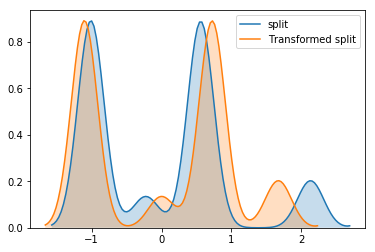

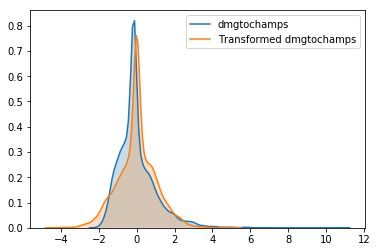

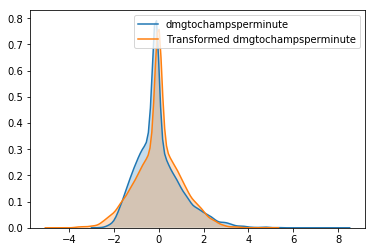

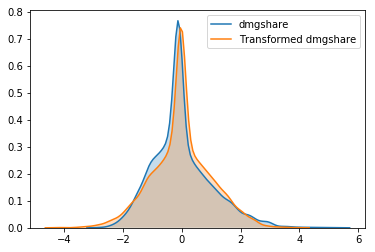

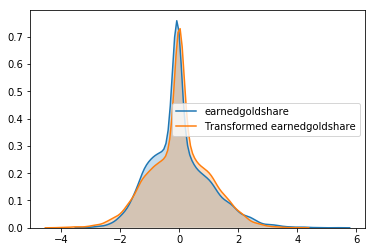

...

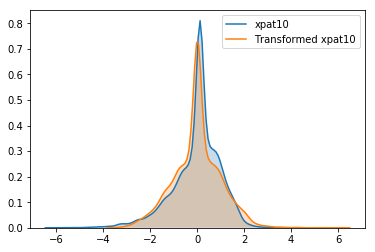

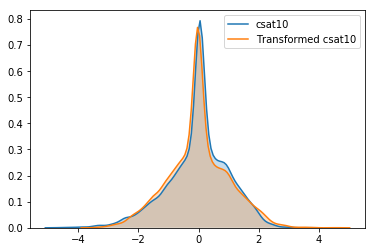

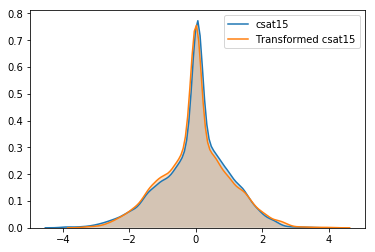

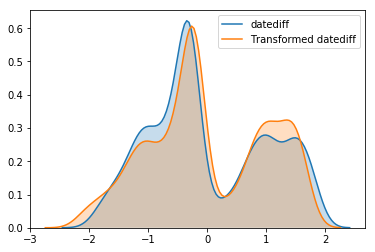

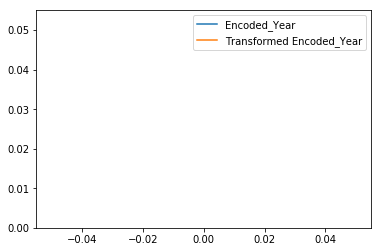

In [19]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Top'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [20]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Top"] = transformed_data_df
optimiser_data_dict["Top"] = optimiser_dict

##### Middle- Data transformation

Feature:  split
The optimal value for lambda:  -0.21909385080252267
Feature:  dmgtochamps
The optimal value for lambda:  0.13064652762401754
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.3976493790428061
Feature:  dmgshare
The optimal value for lambda:  0.6931610385358478
Feature:  earnedgoldshare
The optimal value for lambda:  0.7590967116913827
Feature:  wards
The optimal value for lambda:  0.44895107501620346
Feature:  wpm
The optimal value for lambda:  1.3727212333717616
Feature:  wardshare
The optimal value for lambda:  1.3348634344005113
Feature:  totalgold
The optimal value for lambda:  0.22667120877233254
Feature:  earnedgpm
The optimal value for lambda:  0.5824410216114673
Feature:  goldspent
The optimal value for lambda:  -4.9712026192350045
Feature:  minionkills
The optimal value for lambda:  0.2690815040583263
Feature:  cspm
The optimal value for lambda:  1.4909097381621754
Feature:  goldat10
The optimal value for lambda:  -0.16760970803955577
Feature:  go

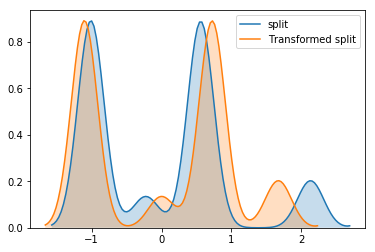

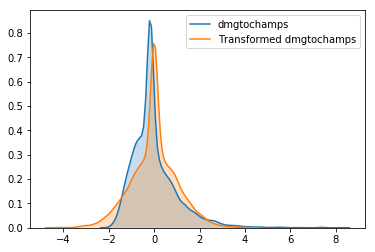

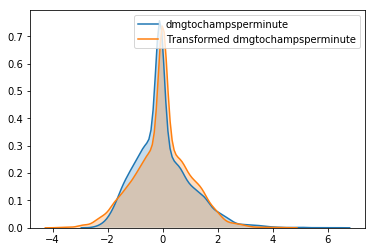

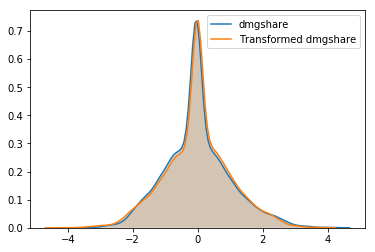

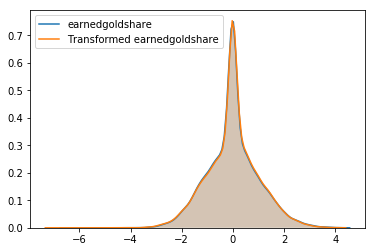

...

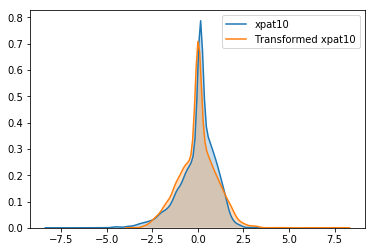

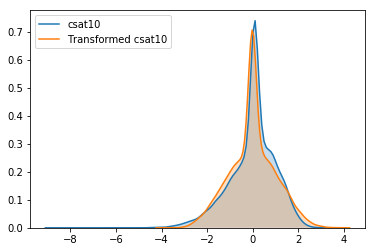

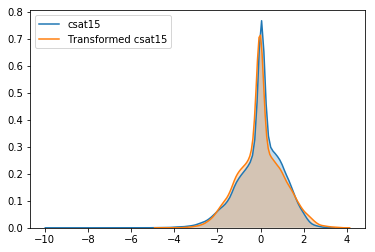

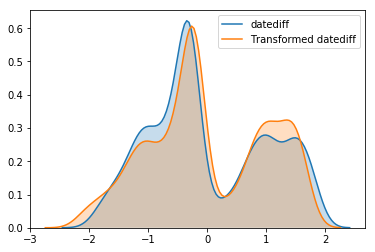

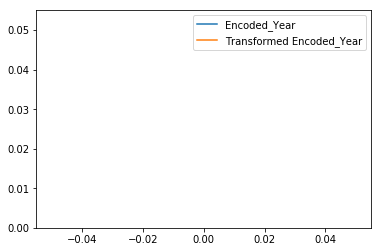

In [21]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Middle'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [22]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Middle"] = transformed_data_df
optimiser_data_dict["Middle"] = optimiser_dict

##### Jungle- Data transformation

Feature:  split
The optimal value for lambda:  -0.21909385080252267
Feature:  dmgtochamps
The optimal value for lambda:  0.12357165798258257
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.26427997450208845
Feature:  dmgshare
The optimal value for lambda:  0.3221029134458009
Feature:  earnedgoldshare
The optimal value for lambda:  0.1852305352342467
Feature:  wards
The optimal value for lambda:  0.6883722224962306
Feature:  wpm
The optimal value for lambda:  1.5296979613706883
Feature:  wardshare
The optimal value for lambda:  1.8352934057867543
Feature:  totalgold
The optimal value for lambda:  0.1460700193560613
Feature:  earnedgpm
The optimal value for lambda:  0.24505356388465713
Feature:  goldspent
The optimal value for lambda:  -4.9712026192350045
Feature:  minionkills
The optimal value for lambda:  0.09502399407133885
Feature:  cspm
The optimal value for lambda:  0.4748078314714812
Feature:  goldat10
The optimal value for lambda:  -1.4884498180737242
Feature:  go

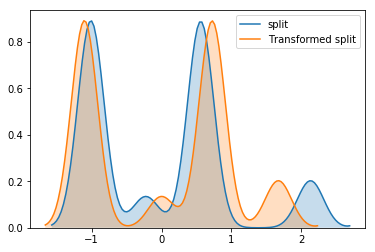

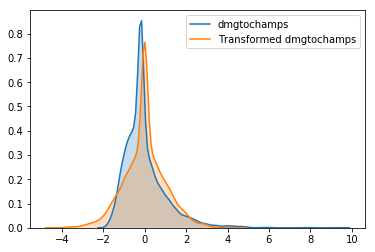

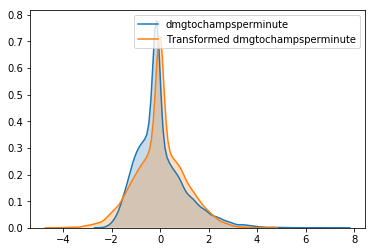

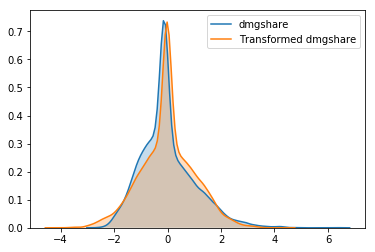

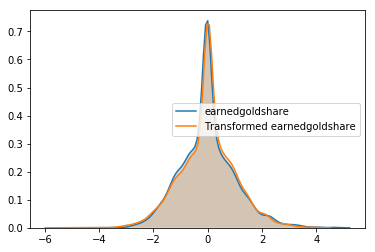

...

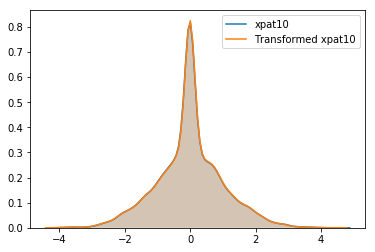

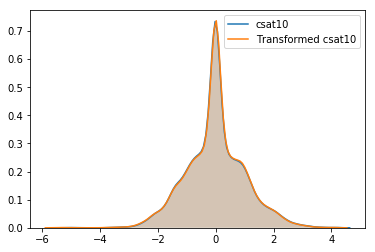

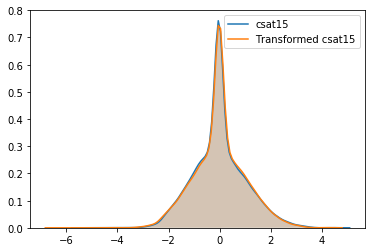

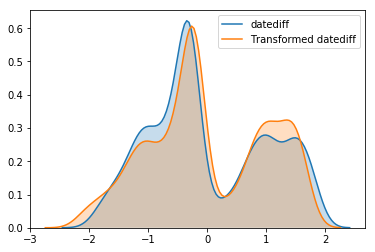

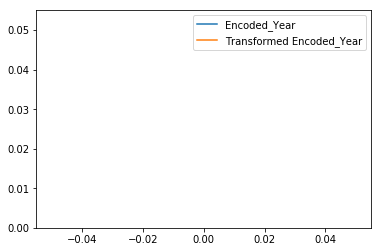

In [23]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Jungle'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [24]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Jungle"] = transformed_data_df
optimiser_data_dict["Jungle"] = optimiser_dict

##### ADC- Data Tranformation

Feature:  split
The optimal value for lambda:  -0.21909385080252267
Feature:  dmgtochamps
The optimal value for lambda:  0.039271435411704025
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.23114615750674344
Feature:  dmgshare
The optimal value for lambda:  0.5175296280418231
Feature:  earnedgoldshare
The optimal value for lambda:  0.04504583469093531
Feature:  wards
The optimal value for lambda:  0.4409988495542869
Feature:  wpm
The optimal value for lambda:  1.1752435335225662
Feature:  wardshare
The optimal value for lambda:  0.8515742122567533
Feature:  totalgold
The optimal value for lambda:  0.14807931186920603
Feature:  earnedgpm
The optimal value for lambda:  0.7741535640946344
Feature:  goldspent
The optimal value for lambda:  -4.9712026192350045
Feature:  minionkills
The optimal value for lambda:  0.20931078510974752
Feature:  cspm
The optimal value for lambda:  1.0756743351303975
Feature:  goldat10
The optimal value for lambda:  -1.6733242539487783
Feature:  

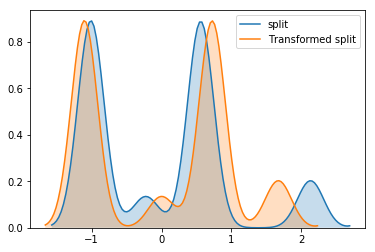

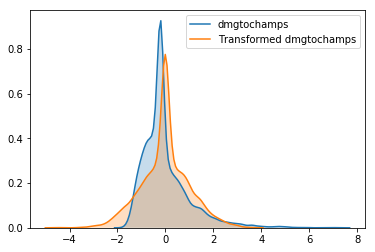

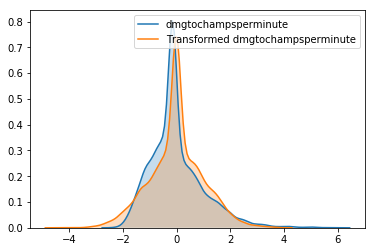

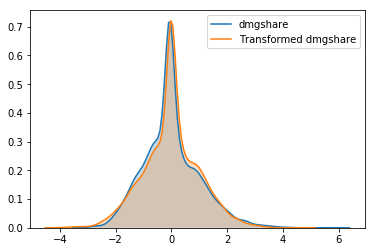

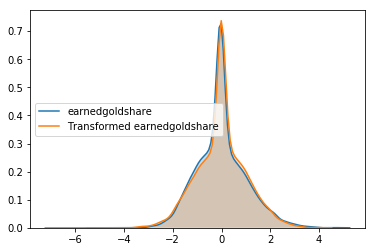

...

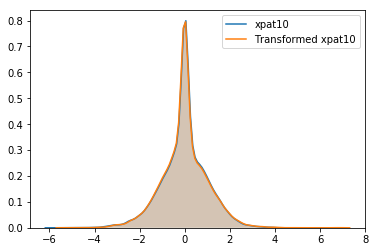

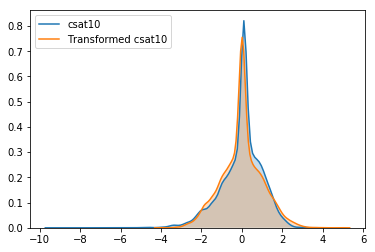

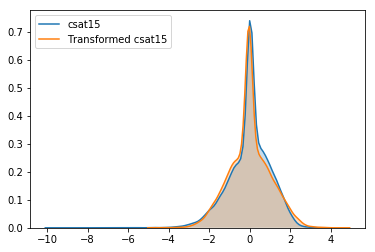

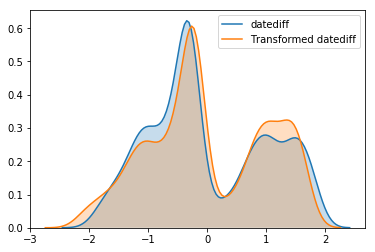

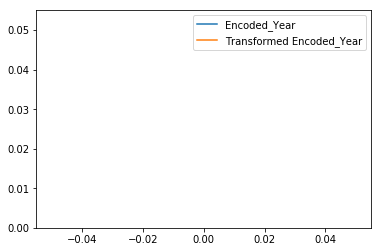

In [25]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['ADC'], pd.DataFrame(), dict()


# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [26]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["ADC"] = transformed_data_df
optimiser_data_dict["ADC"] = optimiser_dict

##### Support- Data Tranformation

Feature:  split
The optimal value for lambda:  -0.21909385080252267
Feature:  dmgtochamps
The optimal value for lambda:  -0.06484569990126993
Feature:  dmgtochampsperminute
The optimal value for lambda:  -0.015917680247702886
Feature:  dmgshare
The optimal value for lambda:  -0.043491468003394776
Feature:  earnedgoldshare
The optimal value for lambda:  0.37596647744110084
Feature:  wards
The optimal value for lambda:  0.07871837305933908
Feature:  wpm
The optimal value for lambda:  0.5505943630230026
Feature:  wardshare
The optimal value for lambda:  0.7038624347124234
Feature:  totalgold
The optimal value for lambda:  0.09905650409825682
Feature:  earnedgpm
The optimal value for lambda:  0.7586818767321749
Feature:  goldspent
The optimal value for lambda:  -4.9712026192350045
Feature:  minionkills
The optimal value for lambda:  0.2824829216982261
Feature:  cspm
The optimal value for lambda:  0.3111046163647244
Feature:  goldat10
The optimal value for lambda:  -3.5287411823515646
Featu

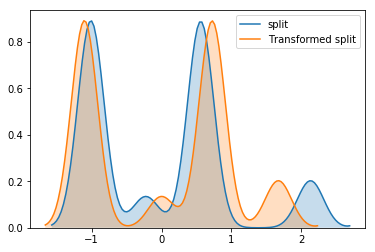

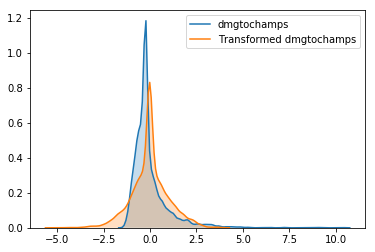

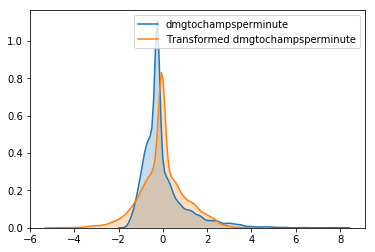

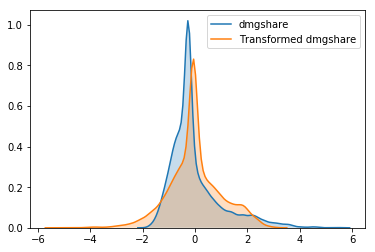

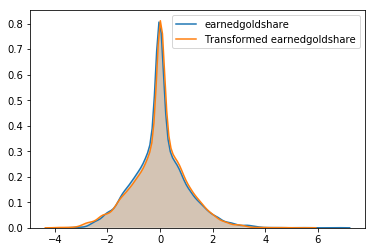

...

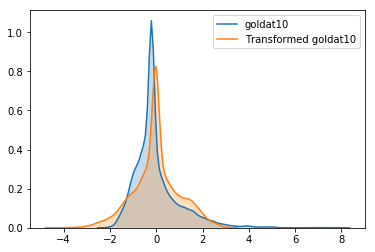

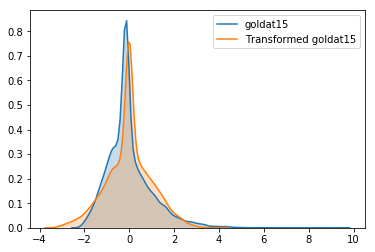

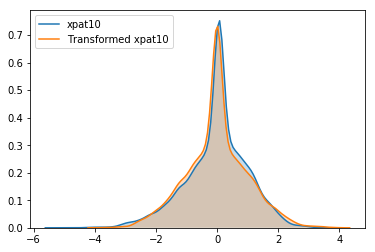

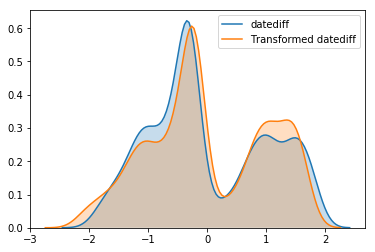

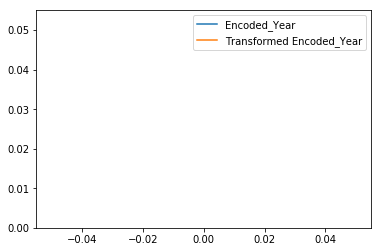

In [27]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Support'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [28]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Support"] = transformed_data_df
optimiser_data_dict["Support"] = optimiser_dict

Overview of variable:  split 


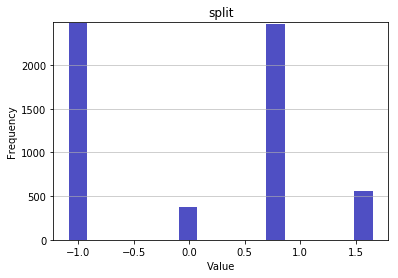

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.102944890686803
Mean: 0.0
Standard deviation: 1.0001
Median: 0.7246
Maximal value: 1.6717724349270495


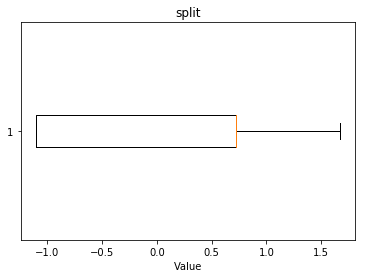

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


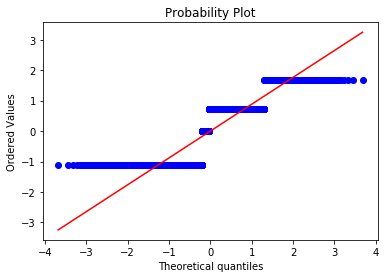

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0422
Kurtosis: -1.5137
Overview of variable:  patchno 


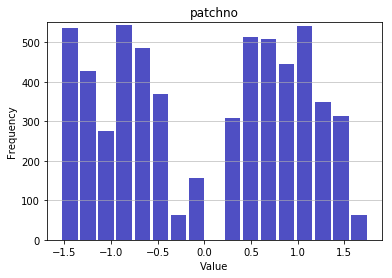

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.5348998533607856
Mean: 0.0
Standard deviation: 1.0001
Median: 0.2194
Maximal value: 1.7543307620319266


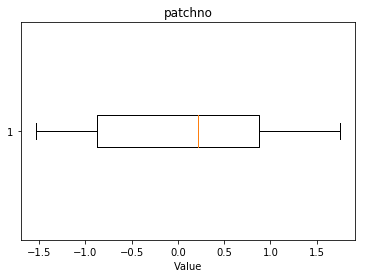

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


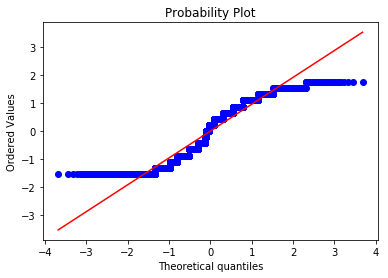

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0582
Kurtosis: -1.3692
Overview of variable:  result 


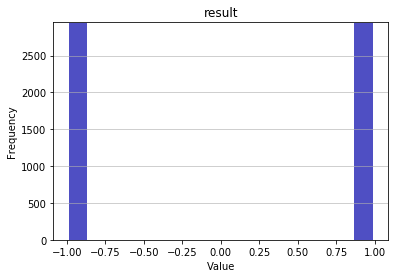

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 1.0


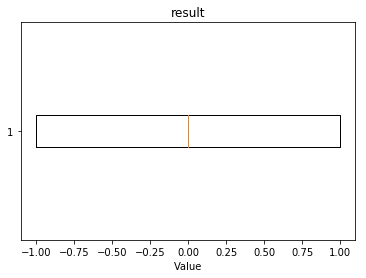

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


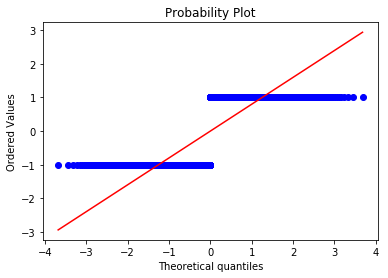

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -2.0
Overview of variable:  k 


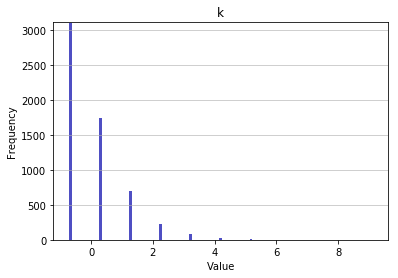

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7359012424310365
Mean: 0.0
Standard deviation: 1.0001
Median: -0.7359
Maximal value: 9.138683408909586


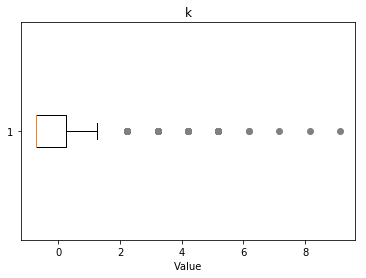

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.21, 4.2, 5.19, 6.18, 7.16, 8.15, 9.14}


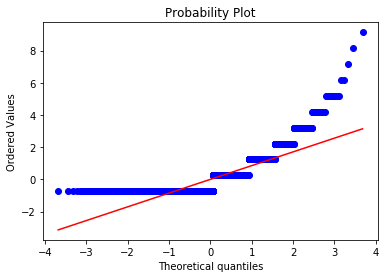

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8745
Kurtosis: 5.5111
Overview of variable:  d 


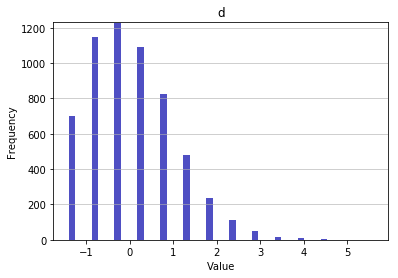

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.4090790604659262
Mean: -0.0
Standard deviation: 1.0001
Median: -0.3307
Maximal value: 5.600261095102854


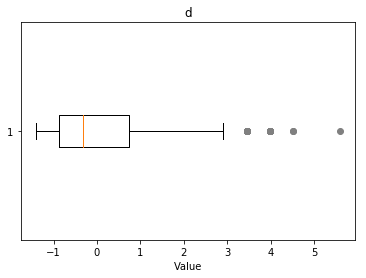

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.98, 3.44, 4.52, 5.6}


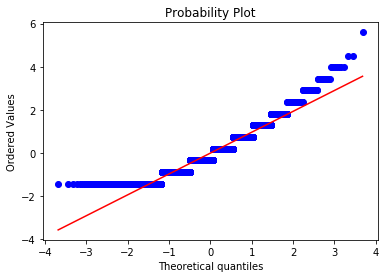

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7151
Kurtosis: 0.5004
Overview of variable:  a 


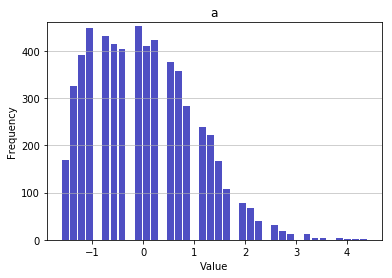

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.600775623080564
Mean: -0.0
Standard deviation: 1.0001
Median: -0.1538
Maximal value: 4.393818248325805


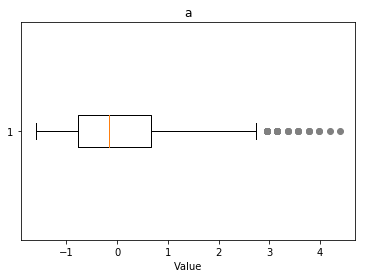

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.57, 3.36, 3.15, 3.77, 3.98, 4.39, 4.19}


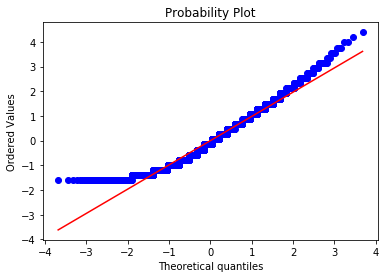

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5552
Kurtosis: -0.0324
Overview of variable:  doubles 


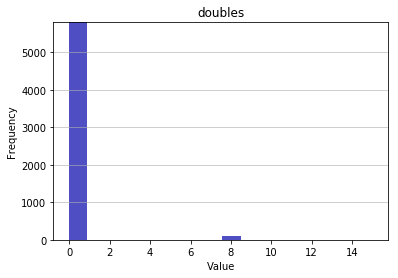

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.1254916336137003
Mean: 0.0
Standard deviation: 1.0001
Median: -0.1255
Maximal value: 15.11980125817851


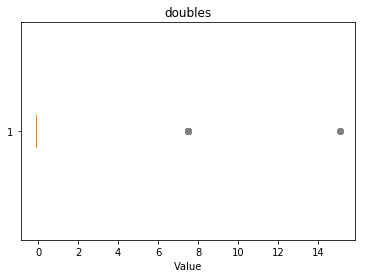

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.12, 7.5}


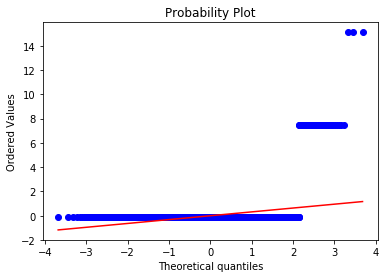

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.2663
Kurtosis: 72.4039
Overview of variable:  fb 


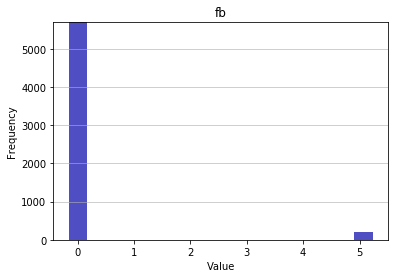

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.18986080433301641
Mean: -0.0
Standard deviation: 1.0001
Median: -0.1899
Maximal value: 5.267016557277387


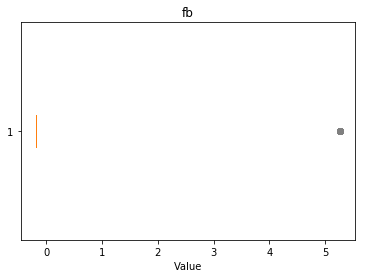

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.27}


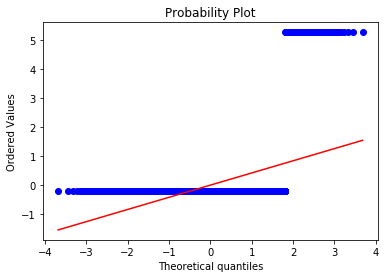

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.0772
Kurtosis: 23.7775
Overview of variable:  fbassist 


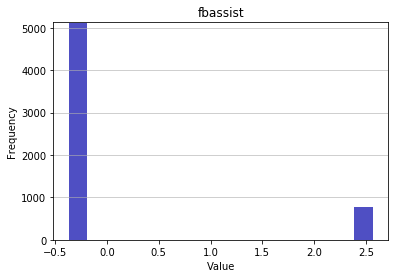

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.3871471347966618
Mean: 0.0
Standard deviation: 1.0001
Median: -0.3871
Maximal value: 2.582997289971478


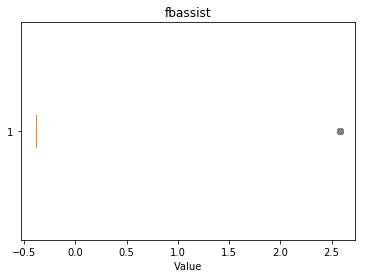

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


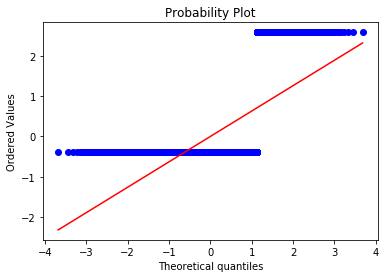

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1959
Kurtosis: 2.8218
Overview of variable:  fbvictim 


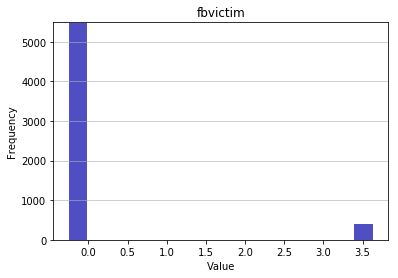

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.27383629482891175
Mean: 0.0
Standard deviation: 1.0001
Median: -0.2738
Maximal value: 3.651816866076072


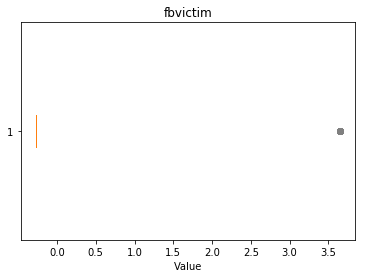

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.65}


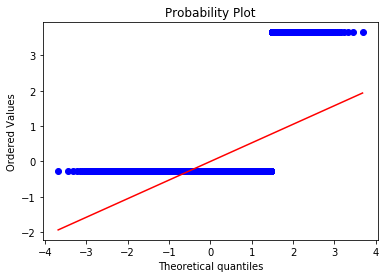

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.378
Kurtosis: 9.4108
Overview of variable:  kpm 


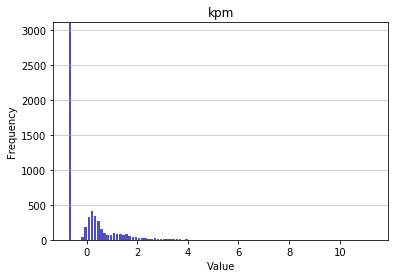

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7184396603660221
Mean: -0.0
Standard deviation: 1.0001
Median: -0.7184
Maximal value: 11.324229306819305


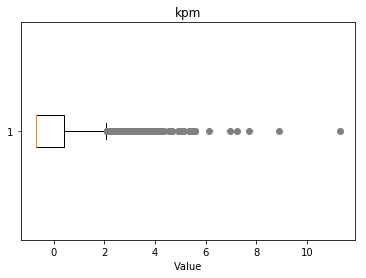

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.16, 3.3, 4.0, 4.27, 3.12, 4.55, 3.38, 3.62, 3.34, 3.57, 4.64, 5.15, 6.15, 3.92, 3.24, 3.01, 3.26, 3.5, 3.66, 3.58, 3.08, 4.92, 3.67, 5.0, 5.34, 4.66, 4.01, 3.41, 5.57, 3.02, 3.84, 7.23, 3.09, 8.91, 3.95, 3.69, 3.11, 3.85, 3.86, 3.6, 3.03, 3.36, 3.61, 4.61, 3.14, 4.36, 11.32, 3.55, 4.24, 3.46, 4.99, 4.67, 3.04, 3.21, 3.63, 3.29, 3.05, 3.96, 4.12, 4.29, 3.87, 3.88, 5.38, 5.45, 5.56, 4.28, 4.2, 6.97, 5.05, 7.71, 3.32, 3.97, 3.72, 3.23, 3.39, 3.48, 3.31, 3.56, 3.89, 3.47}


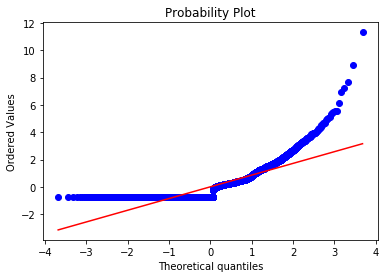

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1192
Kurtosis: 8.2374
Overview of variable:  fd 


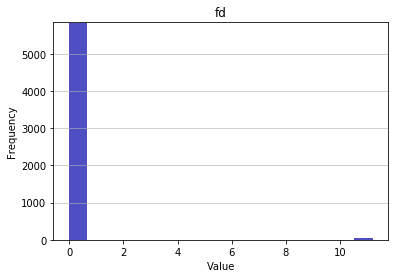

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.08870528801482287
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0887
Maximal value: 11.273285081188142


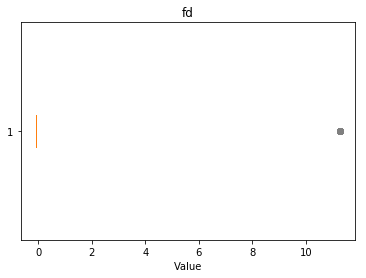

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.27}


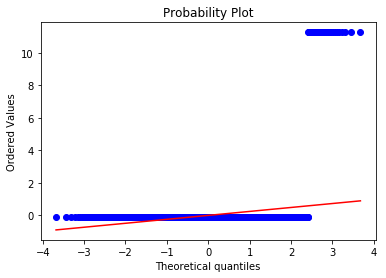

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 11.1846
Kurtosis: 123.0948
Overview of variable:  elementals 


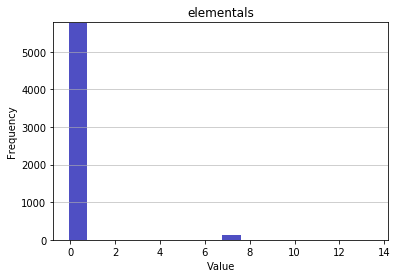

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.14426409038554916
Mean: 0.0
Standard deviation: 1.0001
Median: -0.1443
Maximal value: 13.56547817657664


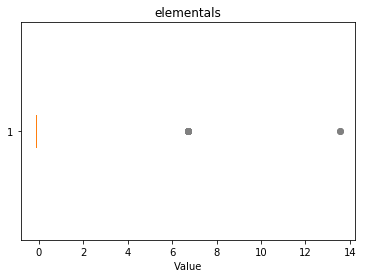

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.57, 6.71}


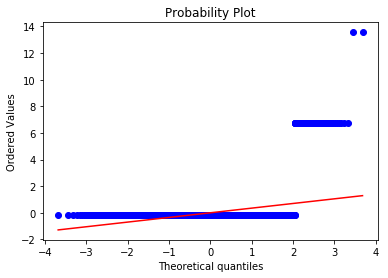

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 6.9991
Kurtosis: 49.7969
Overview of variable:  firedrakes 


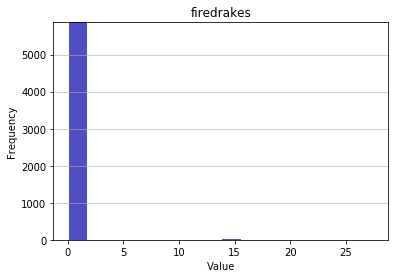

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06330236847898003
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0633
Maximal value: 27.56466467434697


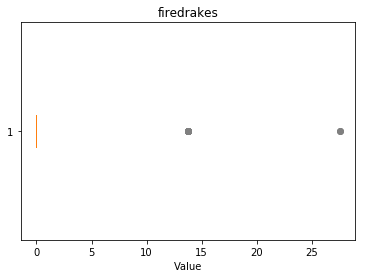

-------------------- 
Outlier detection:
 --------------------
List of outliers: {27.56, 13.75}


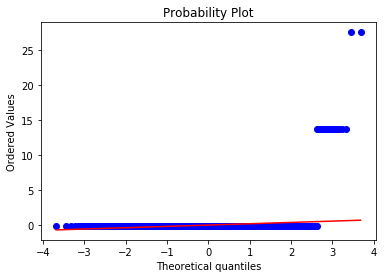

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 17.2584
Kurtosis: 332.5252
Overview of variable:  waterdrakes 


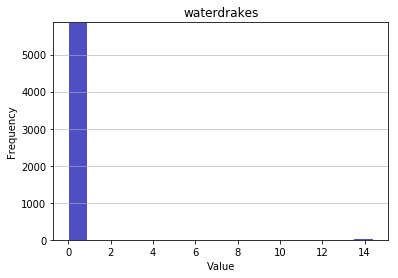

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06910063444545197
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0691
Maximal value: 14.471647156718944


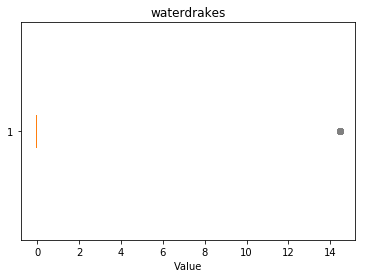

-------------------- 
Outlier detection:
 --------------------
List of outliers: {14.47}


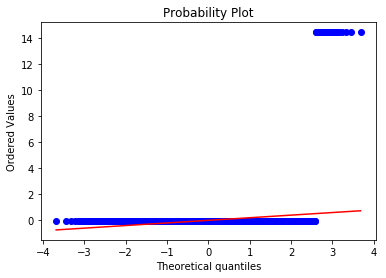

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.4025
Kurtosis: 205.4333
Overview of variable:  earthdrakes 


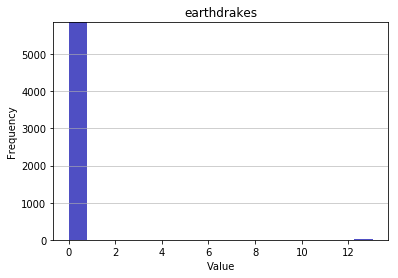

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.07618417603892519
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0762
Maximal value: 13.126085389294817


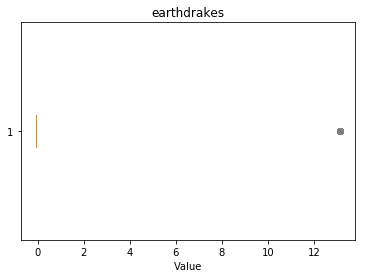

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.13}


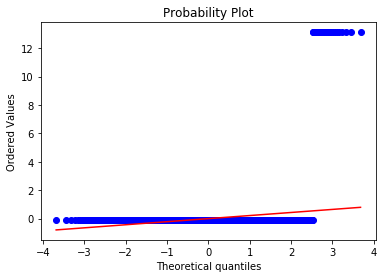

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.0499
Kurtosis: 168.2999
Overview of variable:  airdrakes 


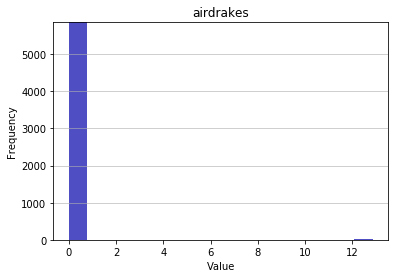

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.07730301097778702
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0773
Maximal value: 12.936106722768532


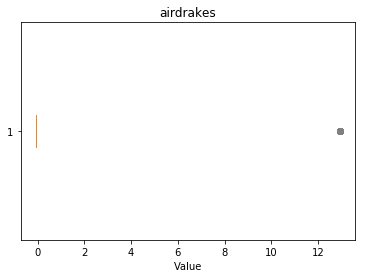

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.94}


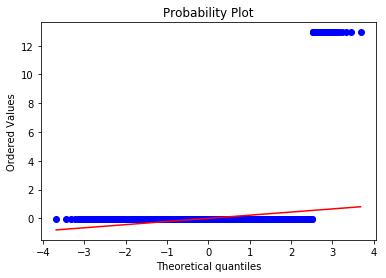

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 12.8588
Kurtosis: 163.3488
Overview of variable:  elders 


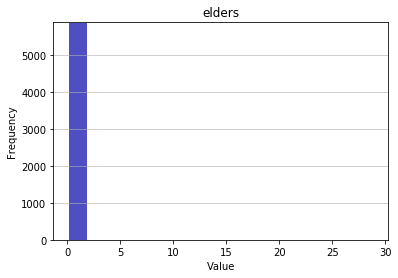

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.034488617555167536
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0345
Maximal value: 28.99507347316585


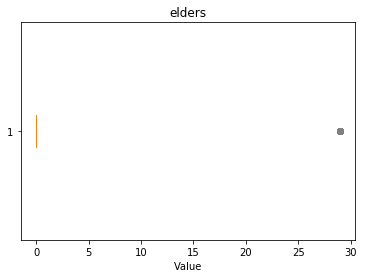

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29.0}


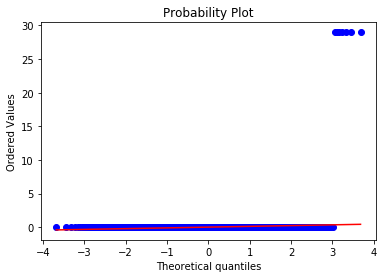

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 28.9606
Kurtosis: 836.7155
Overview of variable:  dmgtochamps 


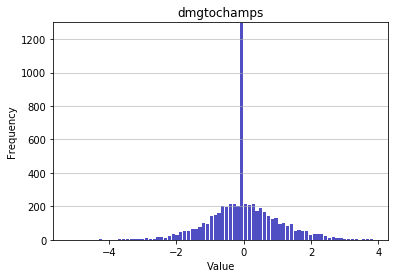

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.212314752029044
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0255
Maximal value: 3.851608652254986


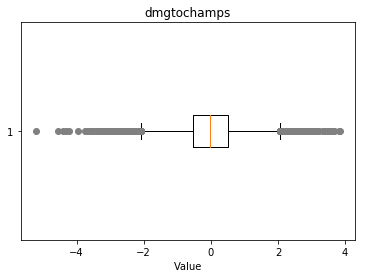

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.2, 3.85, 3.35, 3.21, 3.59, 3.62, 3.82, 3.65, 3.66, 3.68, 3.33, -3.15, -3.32, -3.06, -3.31, -3.39, -3.72, 3.09, -4.3, -4.56, -4.21, 3.36, -3.21, -3.96, -3.54, -3.05, 3.52, 3.13, -3.61, -3.19, -3.02, -3.68, -3.11, -3.03, 3.07, -3.67, -3.16, -3.41, -3.75, -3.5, -3.34, -3.25, -3.33, 3.47, -5.21, -4.41, -3.22}


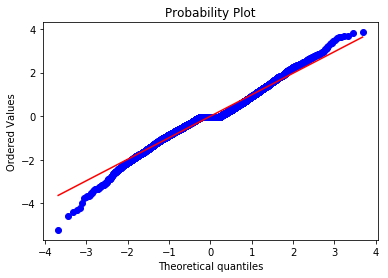

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0155
Kurtosis: 1.3447
Overview of variable:  dmgtochampsperminute 


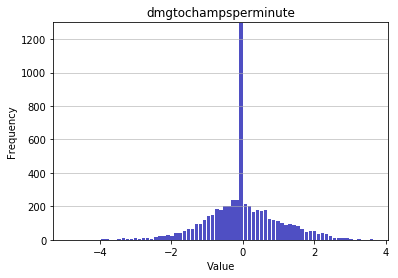

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.879248034970175
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0398
Maximal value: 3.64650539796298


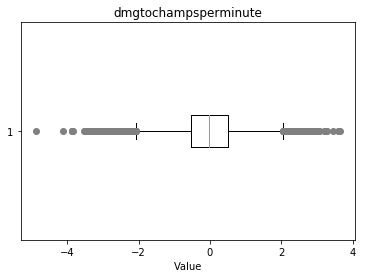

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.04, 3.45, 3.59, 3.25, 3.65, 3.06, 3.21, 3.29, 3.03, 3.01, -3.22, -3.14, -3.06, -3.23, -3.07, -4.11, -3.05, -3.3, -3.04, -3.54, -3.88, -3.37, -3.13, -3.87, -3.45, -3.19, -3.1, -3.18, -3.03, -3.35, -3.85, -3.16, -3.49, -3.5, -3.33, -3.84, -3.51, -3.26, -3.0, -4.88, -3.36}


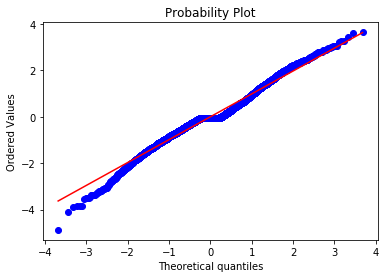

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0028
Kurtosis: 1.056
Overview of variable:  dmgshare 


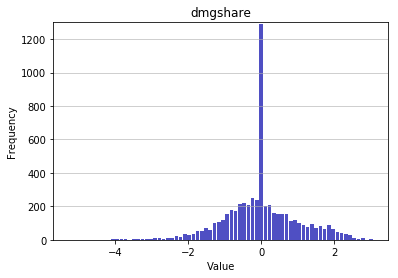

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.281635201226424
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0578
Maximal value: 3.071379942414774


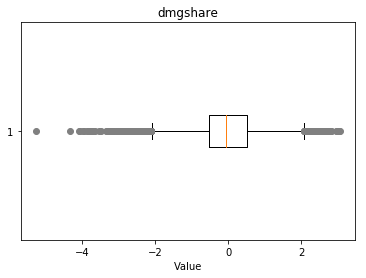

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.07, 3.03, -3.07, -3.73, -3.97, -4.11, -4.06, -3.79, -3.29, -3.04, -3.13, -3.87, -3.86, -3.19, -3.02, -3.36, -3.27, -3.53, -3.99, -3.33, -3.67, -3.24, -3.5, -3.01, -3.0, -3.83, -5.28, -4.34, -3.7}


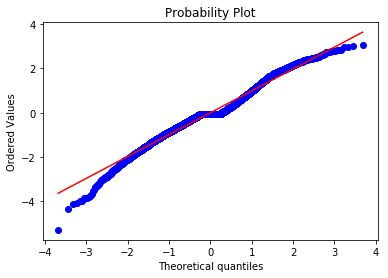

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0058
Kurtosis: 0.9142
Overview of variable:  earnedgoldshare 


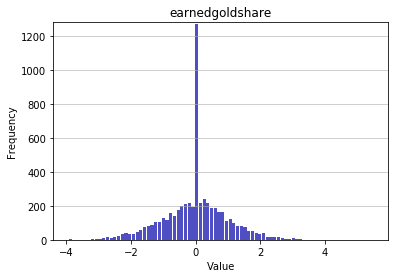

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.9329907251866607
Mean: -0.0
Standard deviation: 1.0001
Median: 0.021
Maximal value: 5.494273854693517


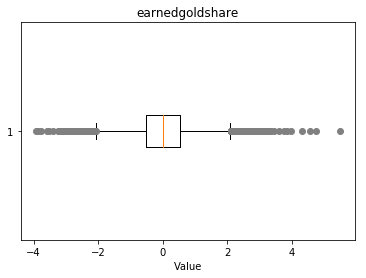

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.74, 3.29, 3.24, 3.03, 3.11, 3.12, 3.2, 3.01, 3.28, 3.08, 5.49, 3.84, -3.14, -3.39, 4.74, 4.57, 3.61, -3.2, -3.88, 3.02, 3.35, 3.45, -3.02, -3.52, -3.93, -3.11, 4.31, 3.23, -3.08, 3.22, 3.97, -3.59, -3.76, -3.25}


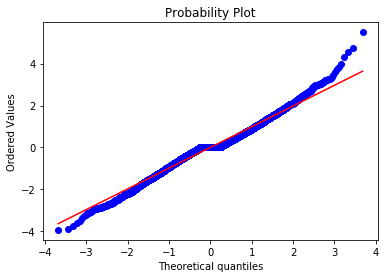

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0197
Kurtosis: 1.1822
Overview of variable:  wards 


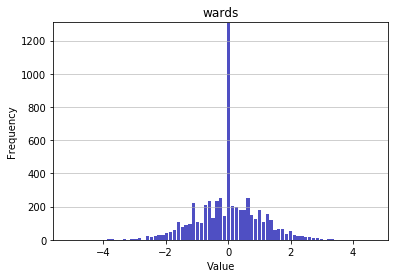

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.105734868981181
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0343
Maximal value: 4.645367907597769


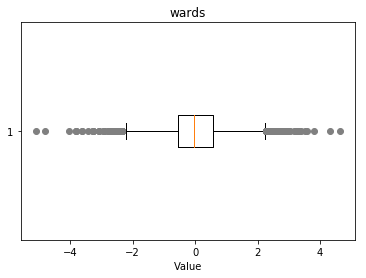

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.01, 3.29, 4.33, 4.65, 3.24, 3.32, 3.04, 3.15, 3.82, 3.58, 3.26, -4.05, 3.53, -3.63, -3.44, 3.4, -3.83, -3.09, -5.11, -4.81, -3.26}


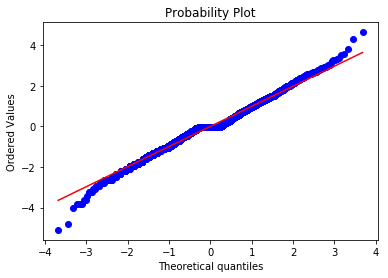

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0071
Kurtosis: 0.8722
Overview of variable:  wpm 


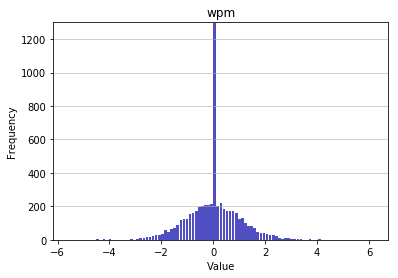

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.579107786350758
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0037
Maximal value: 6.163351477938003


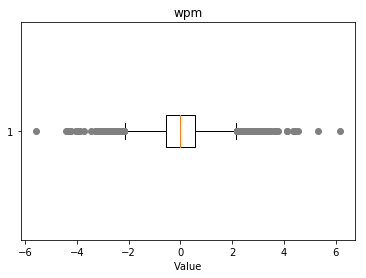

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.03, 3.21, 3.12, 3.23, 3.05, 4.11, 6.16, 3.34, 3.17, 3.61, 4.1, 5.31, 3.01, 3.5, -3.89, 3.16, -3.14, 4.41, 4.33, 3.42, -4.05, 3.18, -3.2, -3.29, 3.78, -3.7, -3.45, -3.12, 3.7, -3.11, -3.94, 3.3, 4.55, -4.02, -4.24, -4.32, -4.26, 3.31, -4.41, -5.58, -4.39, -3.13}


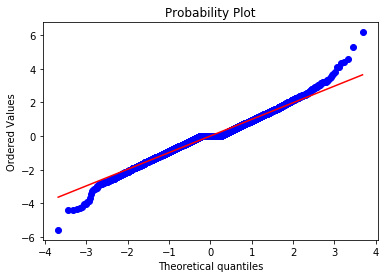

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0511
Kurtosis: 1.6266
Overview of variable:  wardshare 


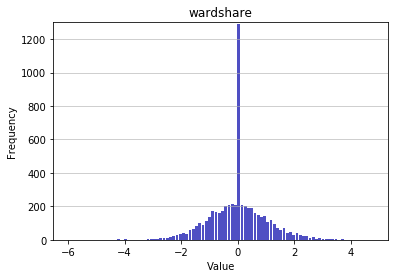

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.990568977976067
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0109
Maximal value: 4.795051596358006


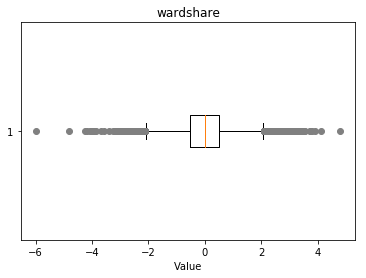

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.73, 3.29, 3.31, 3.45, 3.15, 3.28, 3.48, 4.11, 3.25, 3.92, 4.8, 3.24, -3.07, -3.57, 3.51, 3.17, -3.97, -4.03, -4.05, 3.02, -3.05, 3.44, 3.11, -3.04, 3.03, 3.27, 3.37, -3.94, -3.69, -3.27, 3.8, 3.13, 3.54, -3.02, -3.85, -4.82, -4.23, 3.06, -3.41, -3.16, -3.09, 3.72, 3.4, -3.0, -5.99, -4.19, -3.1}


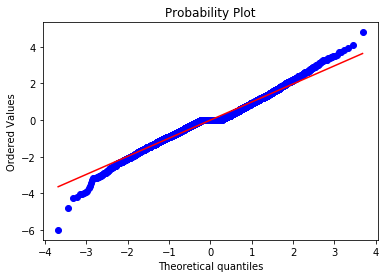

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0432
Kurtosis: 1.4415
Overview of variable:  wardkills 


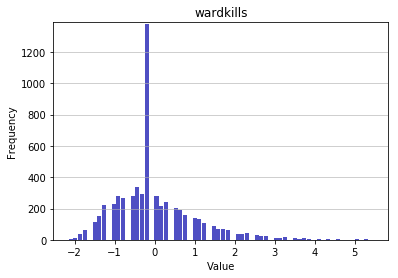

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.156637903243813
Mean: 0.0
Standard deviation: 1.0001
Median: -0.1343
Maximal value: 5.466170531639634


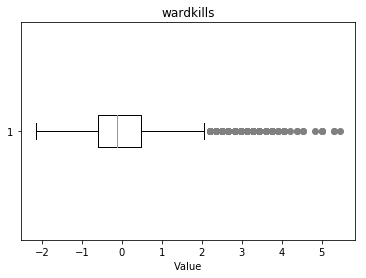

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.75, 3.29, 4.07, 5.47, 3.13, 4.38, 5.0, 3.44, 4.84, 4.53, 5.31, 3.6, 3.91, 4.22}


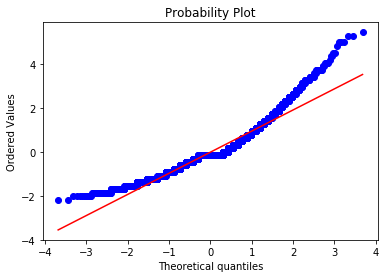

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1381
Kurtosis: 2.245
Overview of variable:  wcpm 


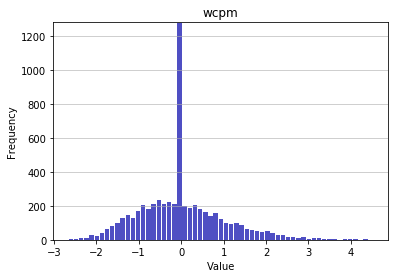

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.6581840071668403
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0895
Maximal value: 4.529682833524193


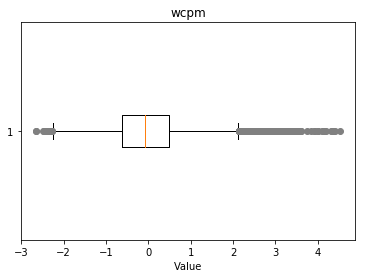

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.57, 4.19, 3.07, 4.01, 4.36, 4.09, 3.9, 4.53, 3.24, 3.16, 4.41, 3.84, 3.5, 3.49, 3.33, 3.76, 4.33, 4.16, 4.15, 3.17, 3.28, 3.03, 3.02, 3.6, 3.18, 3.35, 3.44, 3.19, 3.3, 3.38, 3.29, 3.95, 3.37, 3.13, 3.45, 4.11, 4.31, 3.54, 3.06, 3.15, 3.22, 3.14, 3.23, 3.56, 3.39}


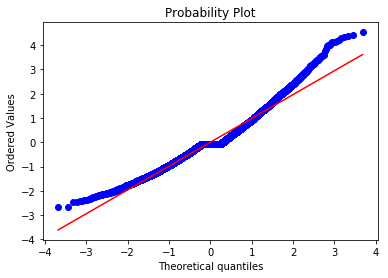

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7076
Kurtosis: 1.1954
Overview of variable:  visionwards 


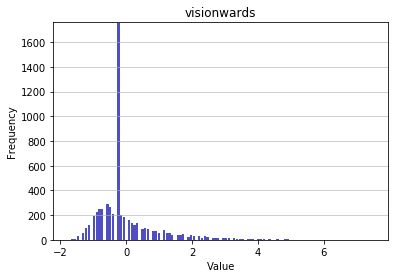

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.7510560953809182
Mean: -0.0
Standard deviation: 1.0001
Median: -0.2623
Maximal value: 7.500627667932214


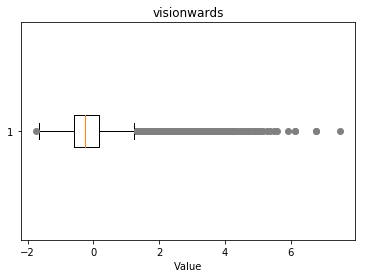

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.89, 3.78, 4.95, 5.37, 3.35, 5.05, 3.14, 6.12, 3.25, 3.03, 5.48, 5.27, 7.5, 3.67, 3.99, 4.52, 4.84, 4.1, 4.42, 4.74, 5.59, 5.16, 5.91, 6.76, 3.46, 4.2, 4.31, 4.63, 3.57}


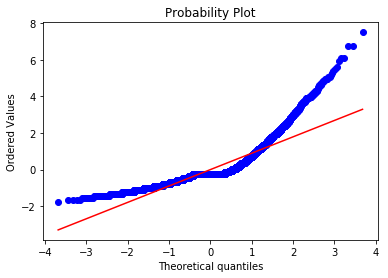

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0988
Kurtosis: 6.0776
Overview of variable:  visionwardbuys 


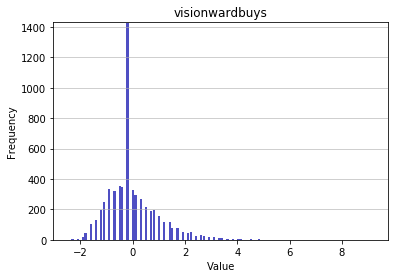

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.458883286920191
Mean: 0.0
Standard deviation: 1.0001
Median: -0.1974
Maximal value: 9.196439614520244


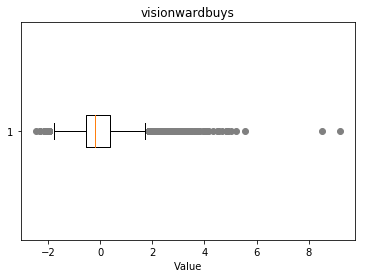

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.46, 3.63, 3.11, 4.15, 3.28, 3.98, 4.85, 3.8, 4.5, 8.5, 9.2, 5.2, 4.67, 4.33, 5.54, 5.02}


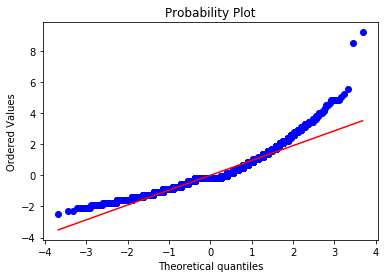

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3933
Kurtosis: 4.3552
Overview of variable:  totalgold 


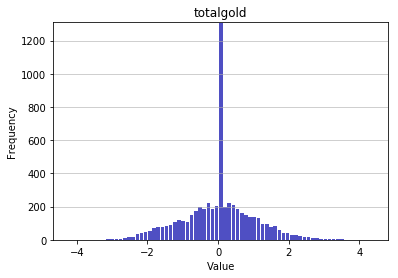

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.240574477791885
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0204
Maximal value: 4.39629481559215


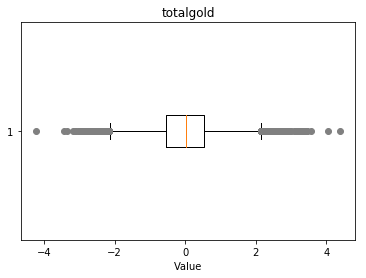

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.15, 3.29, 3.09, 3.39, 3.35, 4.04, 3.19, 3.58, 3.45, 3.32, 4.4, 3.26, -3.14, -3.2, 3.3, -3.44, 3.47, 3.22, -3.09, -3.34, -4.24, -3.02}


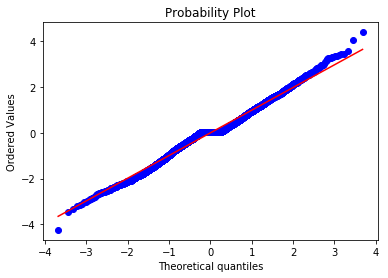

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0045
Kurtosis: 0.5917
Overview of variable:  earnedgpm 


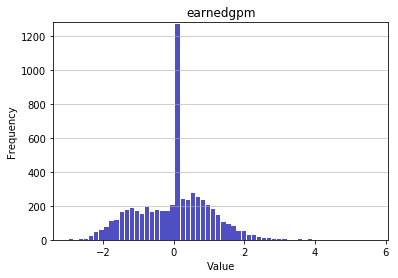

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.991306203572486
Mean: -0.0
Standard deviation: 1.0001
Median: 0.0712
Maximal value: 5.653356400379071


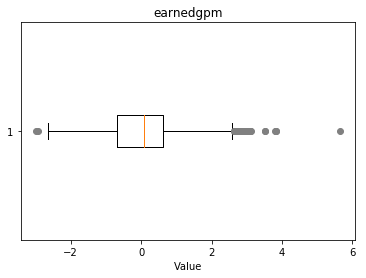

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.83, 3.79, 3.11, 3.08, 3.1, 3.53, 3.03, 5.65}


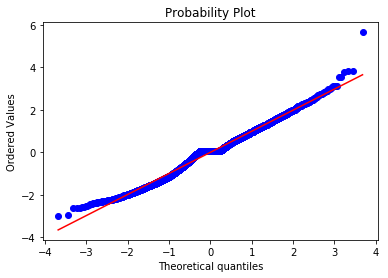

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0046
Kurtosis: 0.0894
Overview of variable:  goldspent 


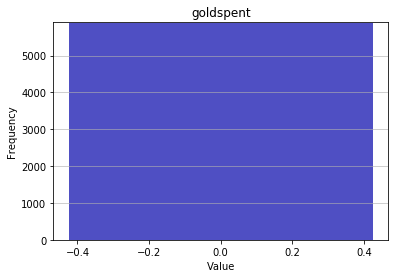

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


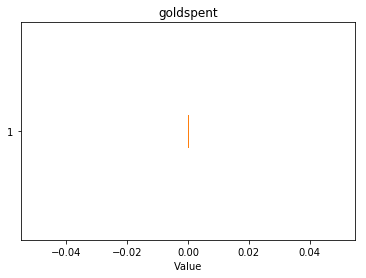

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


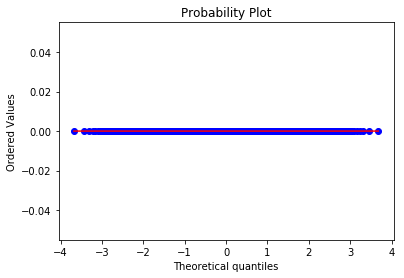

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0
Overview of variable:  gspd 


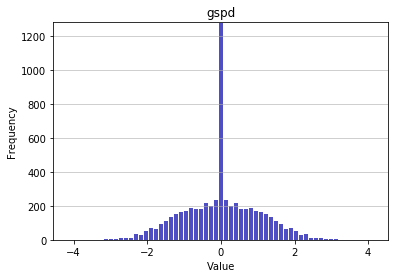

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.142252845151648
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 4.142252845151648


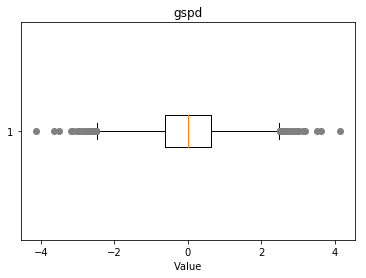

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.18, 3.13, 3.63, 3.02, 4.14, 3.51, -3.13, -3.63, -3.02, -3.51, -4.14, -3.18}


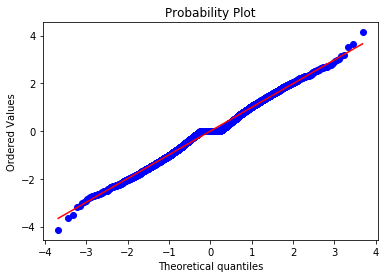

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.1408
Overview of variable:  minionkills 


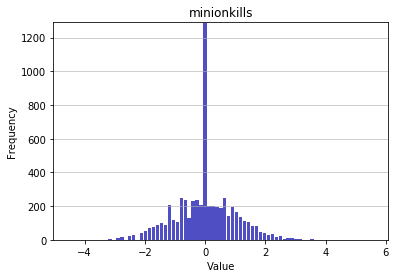

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.5383700498838655
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0049
Maximal value: 5.585845862771321


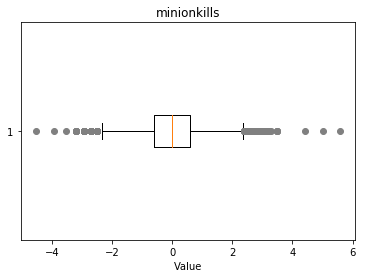

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.05, 3.49, 3.19, 3.16, 5.59, 3.22, 3.29, 3.47, 4.42, 5.0, -3.94, -3.53, -4.54, -3.21}


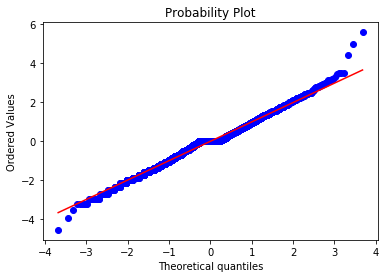

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0312
Kurtosis: 0.7218
Overview of variable:  monsterkills 


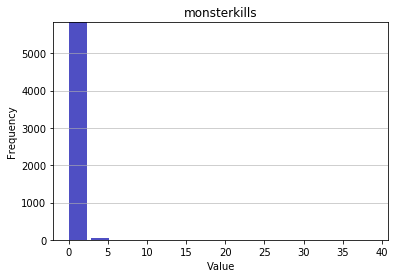

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.22784942705511335
Mean: 0.0
Standard deviation: 1.0001
Median: -0.2278
Maximal value: 39.07363566827475


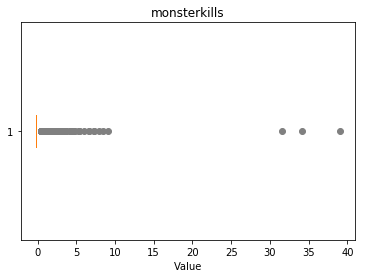

-------------------- 
Outlier detection:
 --------------------
List of outliers: {34.08, 3.52, 4.14, 5.39, 6.63, 7.26, 4.76, 9.13, 6.01, 39.07, 8.51, 7.88, 31.59}


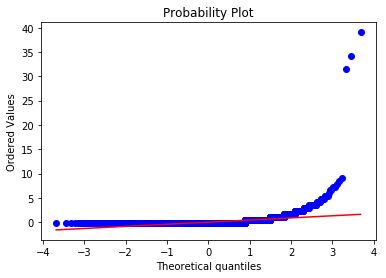

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 23.4503
Kurtosis: 797.5214
Overview of variable:  monsterkillsownjungle 


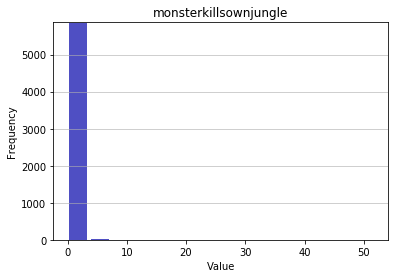

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.11607189735472417
Mean: 0.0
Standard deviation: 1.0001
Median: -0.1161
Maximal value: 51.82536753662261


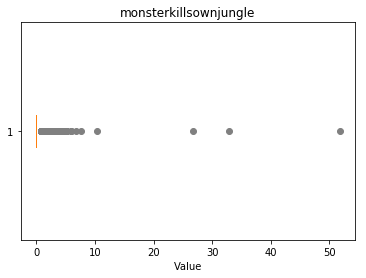

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.78, 3.35, 4.21, 5.94, 6.81, 5.08, 7.68, 10.27, 51.83, 26.72}


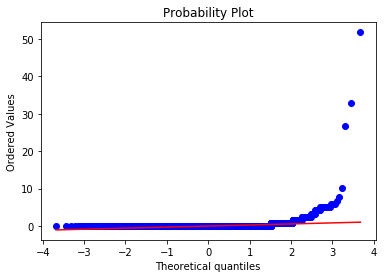

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 33.8159
Kurtosis: 1509.5122
Overview of variable:  monsterkillsenemyjungle 


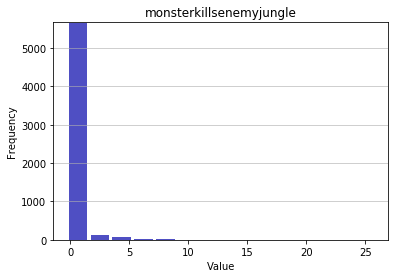

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.2776849088986597
Mean: -0.0
Standard deviation: 1.0001
Median: -0.2777
Maximal value: 25.77517310433228


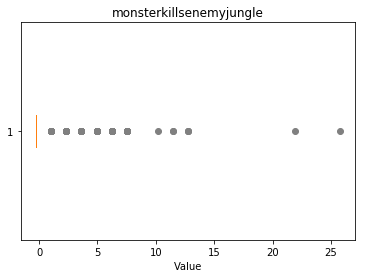

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.63, 4.93, 6.24, 7.54, 10.14, 11.45, 12.75, 21.87, 25.78}


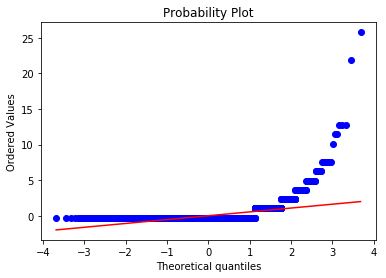

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.8411
Kurtosis: 144.6128
Overview of variable:  cspm 


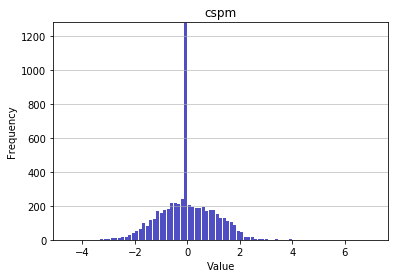

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.53626223263985
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0145
Maximal value: 7.086770702704197


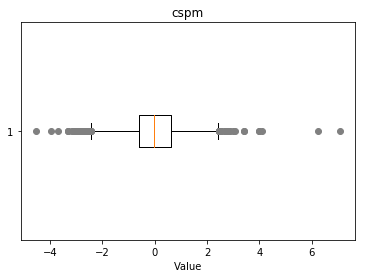

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.99, 4.09, 3.42, 3.06, 4.0, 6.26, 3.41, 7.09, -3.13, -3.97, -3.05, -3.31, -3.68, -3.3, -4.54, -3.14}


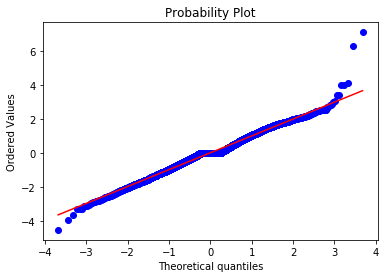

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0326
Kurtosis: 0.8581
Overview of variable:  goldat10 


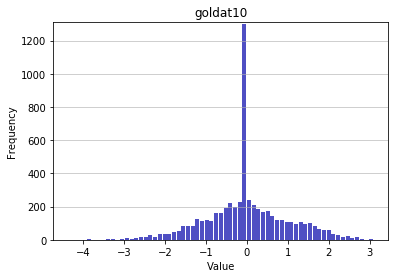

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.359804419132564
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0266
Maximal value: 3.0900126978854154


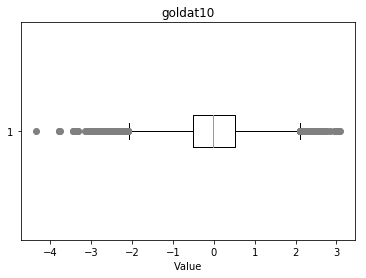

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-3.01, 3.0, 3.09, 3.07, 3.05, -3.08, -3.8, -3.1, -3.04, -3.76, -3.4, -3.17, -3.0, -3.46, -3.32, -3.41, -4.36, -3.44}


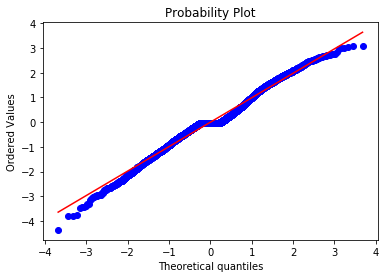

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.037
Kurtosis: 0.5506
Overview of variable:  gdat10 


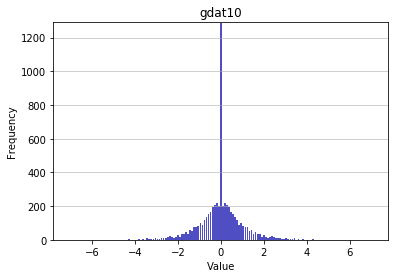

-------------------- 
Summary statistics:
 --------------------
Minimum value: -7.101910001160431
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 7.101910001160431


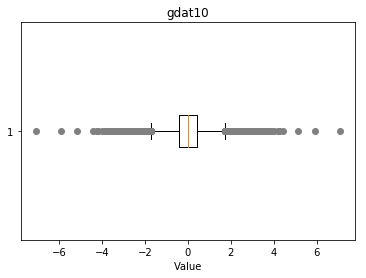

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.03, 3.18, 3.76, 5.16, 3.48, 3.81, 3.04, 3.28, 4.27, 3.14, 7.1, 5.94, 3.84, 3.33, -3.48, -3.81, -3.14, -3.47, 4.18, 4.01, -3.31, 3.26, -3.39, -3.15, 3.16, 3.63, 3.66, -5.94, -4.45, 3.42, 3.56, 3.17, 3.35, -3.04, -3.05, 3.86, -3.46, -3.2, -3.45, -3.63, 3.02, 3.05, -3.18, -3.28, -3.03, -3.35, -3.86, 3.46, 4.45, 3.2, 3.45, -3.56, -3.17, 3.01, -4.18, -4.01, -3.66, -3.02, 3.47, -3.33, 3.31, -3.26, 3.39, 3.15, -3.16, -3.01, -3.42, -7.1, -3.84, -5.16, -4.27, -3.76}


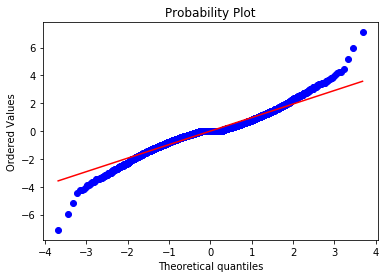

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.3495
Overview of variable:  goldat15 


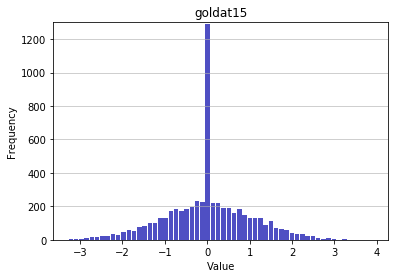

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.278830810751163
Mean: -0.0
Standard deviation: 1.0001
Median: -0.0056
Maximal value: 3.9213077828465033


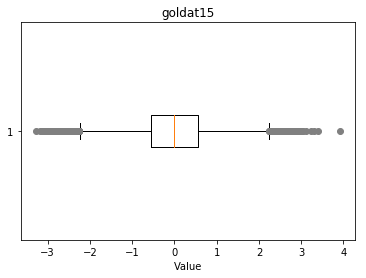

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.3, 3.39, 3.1, 3.23, 3.04, 3.92, 3.02, -3.01, -3.19, -3.07, -3.13, -3.28, -3.09, -3.06, -3.11, -3.02, -3.08}


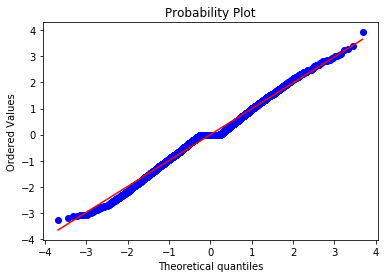

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0299
Kurtosis: 0.4666
Overview of variable:  gdat15 


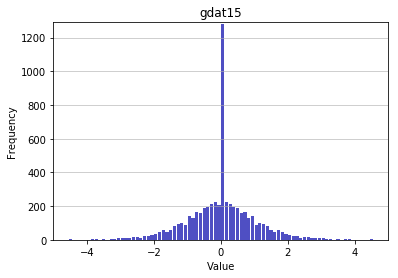

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.549375417840996
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 4.549375417840996


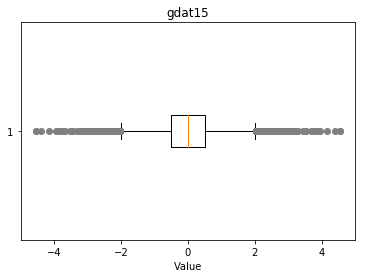

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.88, 3.45, 4.55, 3.53, 3.18, 3.09, 3.05, 4.15, 3.11, 3.67, 4.39, 3.3, 3.24, -3.48, 3.5, -3.06, 3.49, -3.07, 3.16, -4.55, -4.39, -4.54, 3.19, -3.05, -3.88, 3.77, 3.1, 3.94, -3.79, 3.03, -3.3, 3.79, -3.53, -3.18, -3.11, -3.19, -3.77, -3.1, -3.94, 4.54, -3.03, 3.48, -3.09, -3.67, -3.24, -3.5, 3.06, -3.49, 3.07, -3.16, -4.15, -3.45}


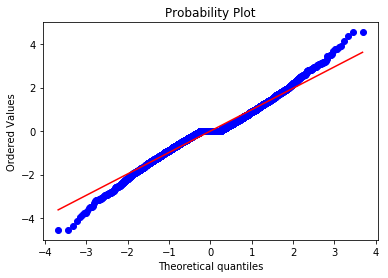

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.5496
Overview of variable:  xpat10 


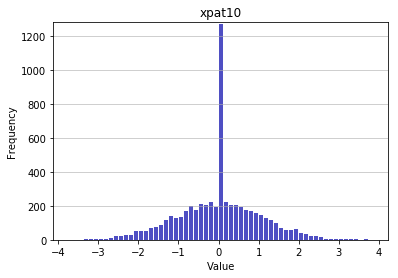

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.7495149576278104
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0015
Maximal value: 3.864329212603789


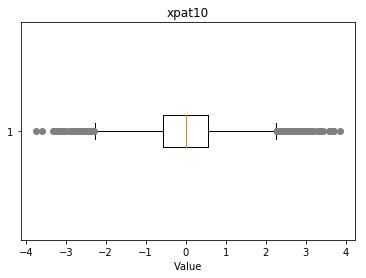

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.39, 3.34, 3.22, 3.38, 3.59, 3.06, 3.11, 3.13, 3.35, 3.04, 3.16, -3.22, -3.31, -3.15, -3.06, 3.17, 3.44, -3.29, -3.13, 3.86, 3.62, -3.03, 3.37, 3.07, -3.75, -3.59, -3.01, 3.15, 3.72, 3.31, -3.27}


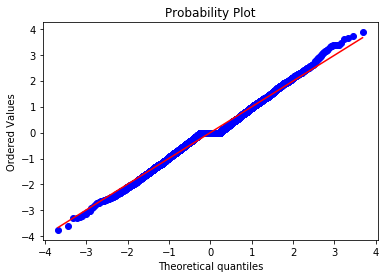

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0365
Kurtosis: 0.5421
Overview of variable:  xpdat10 


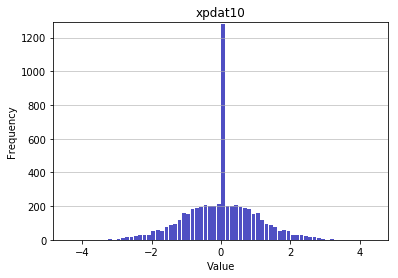

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.39974265765896
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 4.39974265765896


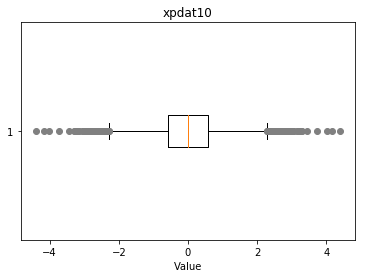

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.08, 3.29, 3.21, 3.01, 3.16, 4.01, 3.72, 4.4, 3.45, 3.27, 4.17, 3.17, -3.72, -3.29, -3.45, -3.27, -4.01, -4.17, -3.01, -3.16, -3.08, -3.17, -4.4, -3.21}


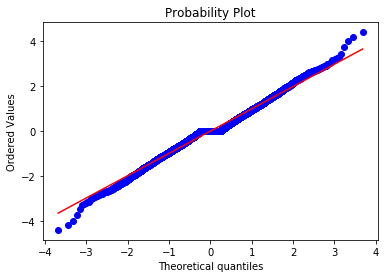

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.751
Overview of variable:  csat10 


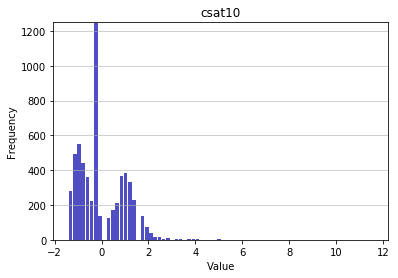

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.4119773452174083
Mean: 0.0
Standard deviation: 1.0001
Median: -0.1751
Maximal value: 11.574799567298601


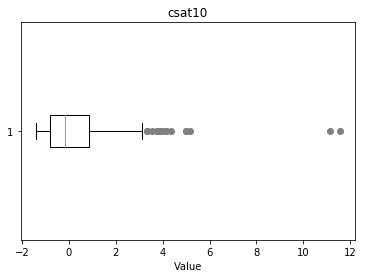

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.74, 3.95, 3.12, 4.15, 5.18, 3.54, 3.33, 4.36, 4.98, 11.57, 11.16}


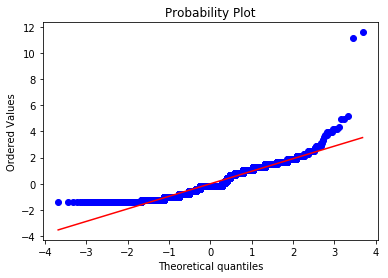

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0578
Kurtosis: 5.4067
Overview of variable:  csdat10 


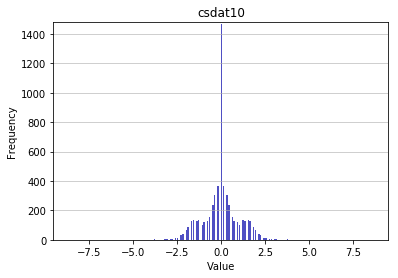

-------------------- 
Summary statistics:
 --------------------
Minimum value: -8.648494940808217
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 8.648494940808217


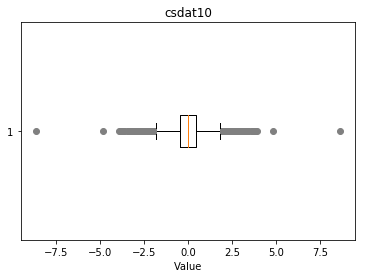

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.03, 3.64, 3.79, 3.49, 3.34, 3.19, 4.86, 8.65, 3.94, -3.79, -3.64, -3.49, -3.34, -3.19, -3.94, -8.65, -4.86, -3.03}


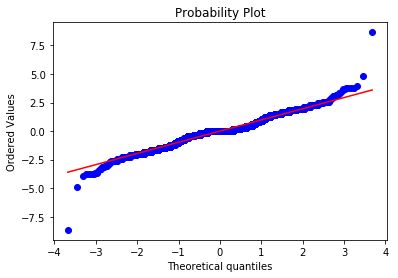

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.5881
Overview of variable:  csat15 


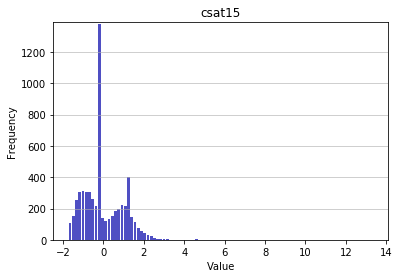

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.7305468565798636
Mean: -0.0
Standard deviation: 1.0001
Median: -0.1348
Maximal value: 13.356077454659872


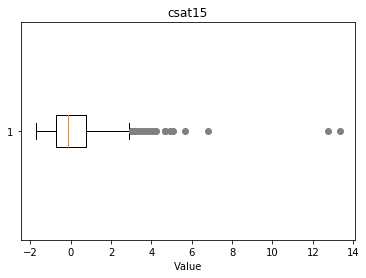

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.2, 3.06, 4.94, 5.09, 3.78, 4.65, 3.64, 4.22, 3.49, 3.93, 4.07, 5.67, 6.83, 13.36, 12.78, 3.35}


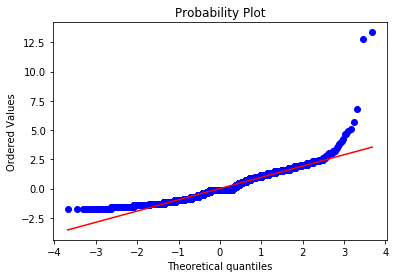

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3447
Kurtosis: 10.0948
Overview of variable:  csdat15 


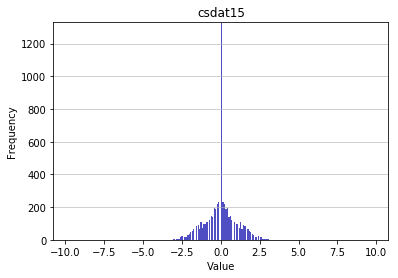

-------------------- 
Summary statistics:
 --------------------
Minimum value: -9.796299610466745
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 9.796299610466745


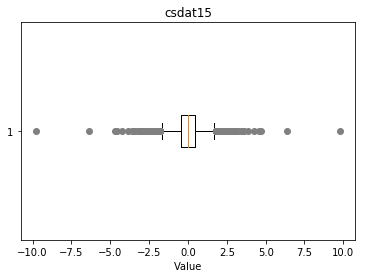

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.62, 4.26, 3.19, 3.83, 3.09, 3.51, 4.58, 4.69, 6.39, 9.8, 3.41, -4.69, -3.62, -4.26, -3.83, -3.09, -3.51, -3.41, -9.8, -6.39, -4.58, -3.19}


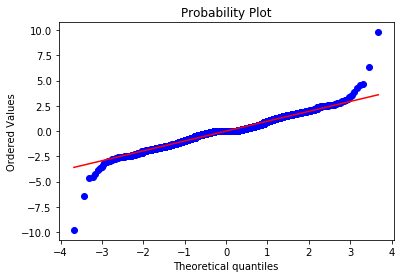

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 4.2316
Overview of variable:  datediff 


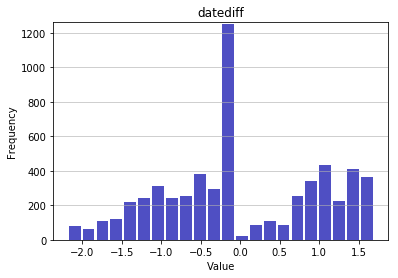

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.183253321349554
Mean: -0.0
Standard deviation: 1.0001
Median: -0.2102
Maximal value: 1.6933848024187463


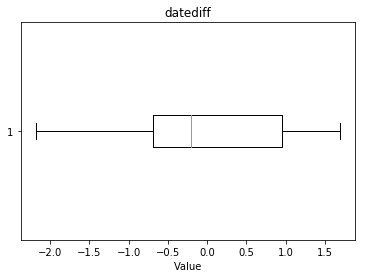

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


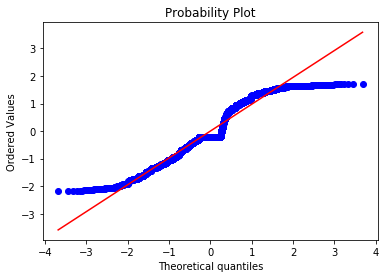

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0299
Kurtosis: -1.0212
Overview of variable:  Encoded_league 


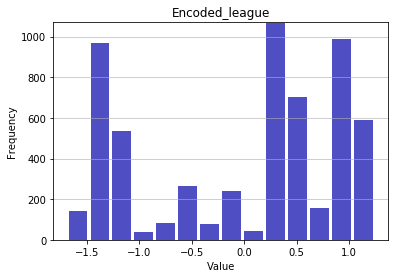

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6934119621597636
Mean: -0.0
Standard deviation: 1.0001
Median: 0.341
Maximal value: 1.2451603680076413


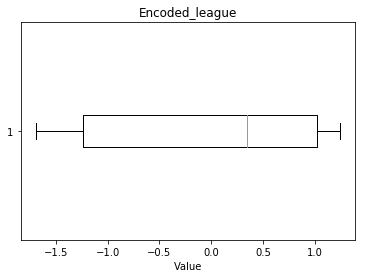

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


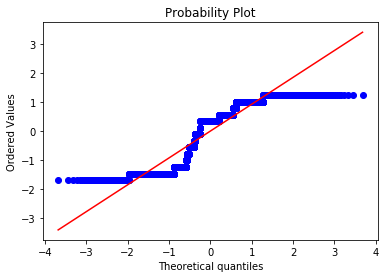

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.42
Kurtosis: -1.3599
Overview of variable:  Encoded_game 


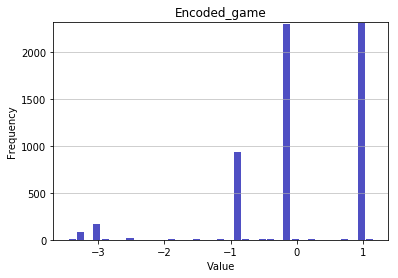

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.452899325181539
Mean: -0.0
Standard deviation: 1.0001
Median: -0.1865
Maximal value: 1.1584450495613026


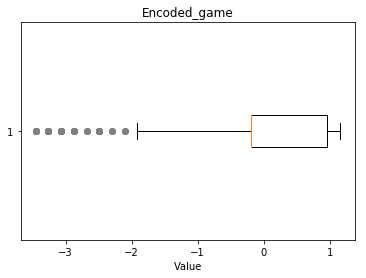

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-3.26, -3.45, -3.07}


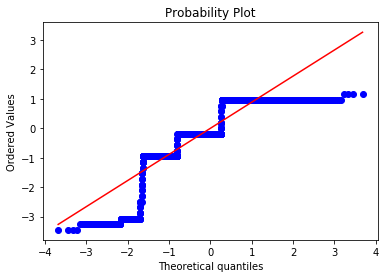

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.2405
Kurtosis: 1.991
Overview of variable:  Encoded_side 


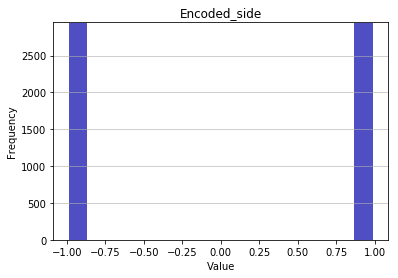

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0
Mean: 0.0
Standard deviation: 1.0001
Median: 0.0
Maximal value: 1.0


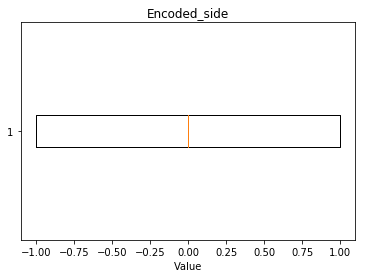

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


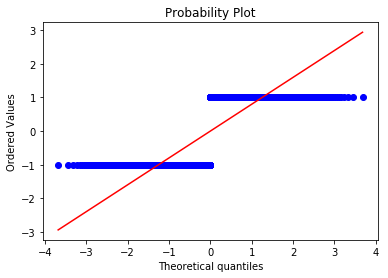

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -2.0
Overview of variable:  Encoded_champion 


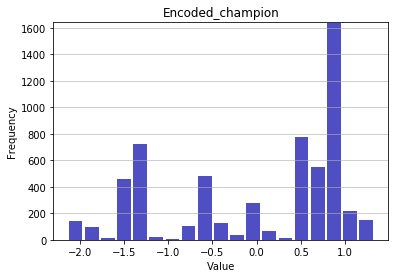

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.136893628701864
Mean: 0.0
Standard deviation: 1.0001
Median: 0.5753
Maximal value: 1.3287000738353916


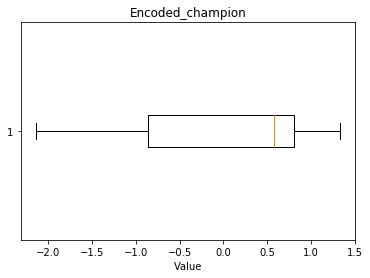

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


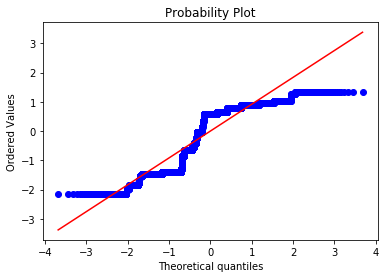

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.6233
Kurtosis: -1.156
Overview of variable:  Encoded_Year 


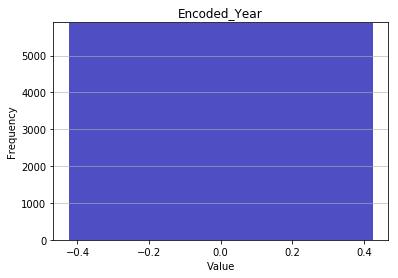

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


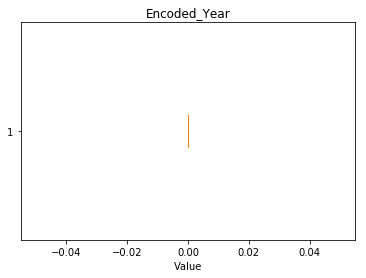

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


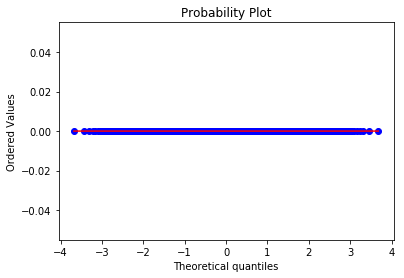

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0
Overview of variable:  Encoded_team 


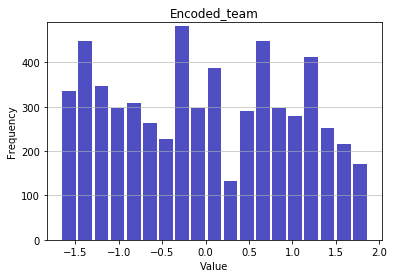

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6639687992952723
Mean: 0.0
Standard deviation: 1.0001
Median: -0.0038
Maximal value: 1.8683161603518432


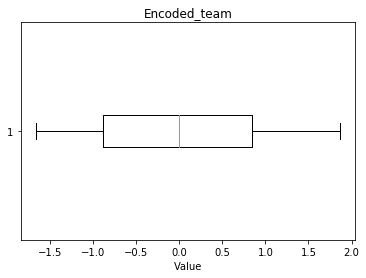

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


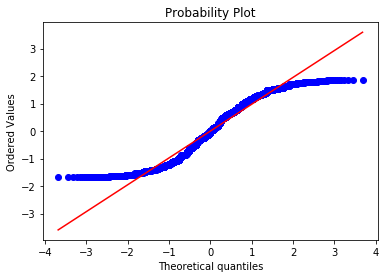

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0281
Kurtosis: -1.2129
Overview of variable:  Encoded_culture 


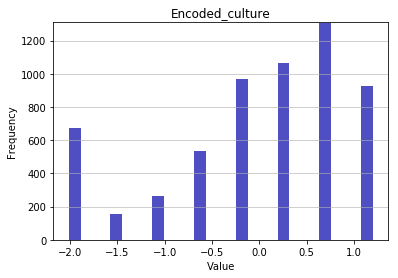

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.0260320247744388
Mean: -0.0
Standard deviation: 1.0001
Median: 0.2876
Maximal value: 1.213043284543995


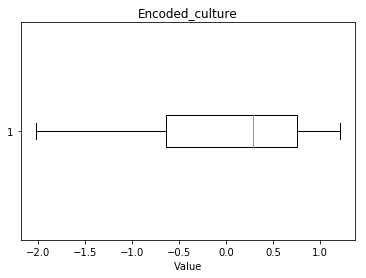

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


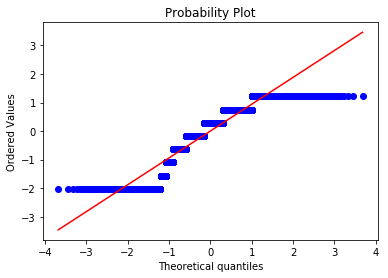

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.7564
Kurtosis: -0.4277


<Figure size 432x288 with 0 Axes>

In [29]:
# Loop through all numerical variables and visualize data
for col in transformed_data_df.columns:
    if str(transformed_data_df[col].dtypes) != 'object':
        SummaryNumericVar(transformed_data_df[col], col)

### 2.3 Conclusion univariate analysis

In [30]:
# Short intermediate summary
print("The transformed dataset captures information from", len(transformed_data_df.columns), "features.")
print("In total, there are", len(transformed_data_df), "observations present in the dataframe, capturing the information from",
      int(len(transformed_data_df)/2), "games.")
print("\nThe following features are captured by the dataset:\n\n", list(transformed_data_df.columns))

The transformed dataset captures information from 57 features.
In total, there are 5892 observations present in the dataframe, capturing the information from 2946 games.

The following features are captured by the dataset:

 ['split', 'patchno', 'result', 'k', 'd', 'a', 'doubles', 'fb', 'fbassist', 'fbvictim', 'kpm', 'fd', 'elementals', 'firedrakes', 'waterdrakes', 'earthdrakes', 'airdrakes', 'elders', 'dmgtochamps', 'dmgtochampsperminute', 'dmgshare', 'earnedgoldshare', 'wards', 'wpm', 'wardshare', 'wardkills', 'wcpm', 'visionwards', 'visionwardbuys', 'totalgold', 'earnedgpm', 'goldspent', 'gspd', 'minionkills', 'monsterkills', 'monsterkillsownjungle', 'monsterkillsenemyjungle', 'cspm', 'goldat10', 'gdat10', 'goldat15', 'gdat15', 'xpat10', 'xpdat10', 'csat10', 'csdat10', 'csat15', 'csdat15', 'datediff', 'Encoded_league', 'Encoded_game', 'Encoded_side', 'Encoded_champion', 'Encoded_Year', 'Encoded_team', 'Encoded_culture', 'player']


---------------------------------------------------------------------------------------------------- 
Overview of variable:  result 
 ----------------------------------------------------------------------------------------------------
Total categories: 2 



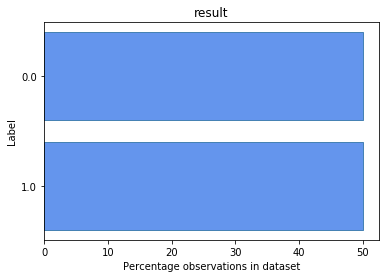

<Figure size 432x288 with 0 Axes>

In [31]:
# Adjust 'Result' to appropriate format
for pos, trans_df in trans_data_dict.items():
    # Refactoring encoding of target feature
    trans_df['result'] = [x if x > 0 else 0 for x in trans_df['result']]
    trans_data_dict[pos] = trans_df
    
# Visualization properties target
SummaryCategoricalVar(transformed_data_df['result'], 'result')

In [32]:
# Save the transformed data
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_top.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Top'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_mid.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Middle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_jun.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Jungle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_adc.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['ADC'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_sup.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Support'], f)

In [33]:
# Save the file containing the column name and matching box-cox
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_top_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Top'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_mid_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Middle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_jun_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Jungle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_adc_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['ADC'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_sup_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Support'], f)

## 3. Multivariate analysis
* Correlation plot (remove variables that are highly correlated)
* Boxplot/ scatterpot/ wrapped plot to visualize important relationships between variables
* t-test to assess difference between categories

### 3.1 Collinearity exploration

##### Investigate correlation between features

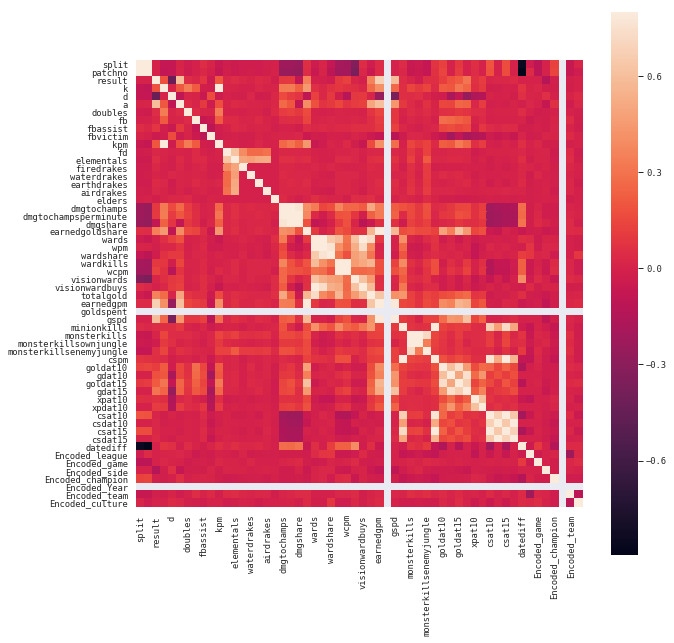

In [34]:
# Create corrplot
sns.set(context = "paper", font = "monospace")
corrmat = transformed_data_df.corr()
f, ax = plt.subplots(figsize = (10, 10))
sns.heatmap(corrmat, vmax = .8, square = True) 
plt.show()

In [35]:
# Print list with highest correlated features
corrmap_abs = transformed_data_df.corr().abs()
corrmap_abs_sorted = corrmap_abs.unstack().sort_values(kind = "quicksort", ascending = False)
corrmap_abs_sorted.iloc[(len(transformed_data_df.columns) + 3):(len(transformed_data_df.columns) + 1) + 20,]

dmgtochampsperminute   dmgtochamps              0.939344
dmgtochamps            dmgtochampsperminute     0.939344
patchno                split                    0.924435
split                  patchno                  0.924435
minionkills            cspm                     0.914297
cspm                   minionkills              0.914297
wardkills              wcpm                     0.895667
wcpm                   wardkills                0.895667
patchno                datediff                 0.895568
datediff               patchno                  0.895568
monsterkills           monsterkillsownjungle    0.883071
monsterkillsownjungle  monsterkills             0.883071
dmgtochampsperminute   dmgshare                 0.879698
dmgshare               dmgtochampsperminute     0.879698
datediff               split                    0.844470
split                  datediff                 0.844470
wpm                    wards                    0.844024
wards                  wpm     

In [36]:
# Short intermediate summary
print("The percentage of correlations (autocorrelations excluded) higher than 0.5 in absolute value: ",
      str(sum([x for x in list(corrmap_abs_sorted) if x >= 0.5])/len(corrmap_abs_sorted)*100))

The percentage of correlations (autocorrelations excluded) higher than 0.5 in absolute value:  4.371279751901526


##### Calculate variance inflation factor
This is purely out of interest, although we expect penelized regression methods to be able to cope with collinearity between the features.

In [37]:
# Extract dataset containing only the numeric features
transformed_data_numeric_df = transformed_data_df.copy()
transformed_data_numeric_df = transformed_data_numeric_df.drop(labels = ['player'], axis=1)

In [38]:
# Calculate the variance inflation factor for the different features
X = add_constant(transformed_data_numeric_df)
vif_columns = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index = X.columns)

In [39]:
# Print the top 20 features with the highest VIF
vif_columns_sorted = vif_columns.sort_values(kind = "quicksort", ascending = False)
vif_columns_sorted[:20]

waterdrakes                      inf
firedrakes                       inf
airdrakes                        inf
earthdrakes                      inf
elementals                       inf
dmgtochamps              1445.077830
dmgtochampsperminute     1221.604699
totalgold                 578.693838
wards                     308.084885
minionkills               298.929130
cspm                      245.067518
earnedgpm                 165.734615
wpm                        97.263495
monsterkills               55.368435
wardkills                  30.126146
monsterkillsownjungle      28.655781
kpm                        24.836096
k                          24.331901
csat15                     21.943112
wcpm                       20.477747
dtype: float64